In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from ray import tune
import torch
import os
%matplotlib inline

In [2]:
all_pristine = [cv2.imread('images/'+i) for i in sorted(os.listdir('images'))]
all_labels = [cv2.imread('labels/'+i) for i in sorted(os.listdir('labels'))]

In [3]:
def run_hough(test_pristine,show=False,return_build_mask=False,\
              blur=9,dp=1,param1=50,param2=20):
    #HOUGH_GRADIENT, HOUGH_GRADIENT_ALT eventually? Same with Gaussian vs. Median
    #blur: in list [3,5,7,9,11,13,15,17]
    #dp: float in range 1 to 3
    #param1: int in range(10,1000)
    #param2: int in range(5,100)
    gray = cv2.medianBlur(cv2.cvtColor(test_pristine,cv2.COLOR_RGB2GRAY), blur)
    circles = cv2.HoughCircles(gray,cv2.HOUGH_GRADIENT,dp,20,
                                param1=param1,param2=param2,minRadius=0,maxRadius=60)
    cimg = test_pristine.copy()
    if circles is None or (circles is not None and circles.shape[0] == 0):
        return {'boxes': torch.zeros((0, 4)).float(), 'scores': torch.zeros(0).float(), 'labels': torch.zeros(0).long()}
    circles = np.uint16(np.around(circles))
    if show:
        for i in circles[0,:]:
            cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
        plt.figure(figsize=(16,8))
        plt.imshow(cimg)
        plt.show()
    out_dict = {}
    all_boxes = []
    scores = []
    labels = []
    for i in range(len(circles[0,:])):
        all_boxes.append([circles[0,:][i][0]-circles[0,:][i][2],\
                          circles[0,:][i][1]-circles[0,:][i][2],\
                          circles[0,:][i][0]+circles[0,:][i][2],\
                          circles[0,:][i][1]+circles[0,:][i][2]])
        scores.append(1./(i+1))
        labels.append(1)
    out_dict['boxes']=torch.tensor(all_boxes, dtype=torch.float32)
    out_dict['scores']=torch.tensor(scores, dtype=torch.float32)
    out_dict['labels']=torch.tensor(labels, dtype=torch.int64)
    if return_build_mask:
        build_mask = np.zeros(test_pristine.shape)
        for i in circles[0,:]:
            cv2.circle(build_mask,(i[0],i[1]),i[2],(255,255,255),-1)
        return build_mask, out_dict
    return out_dict

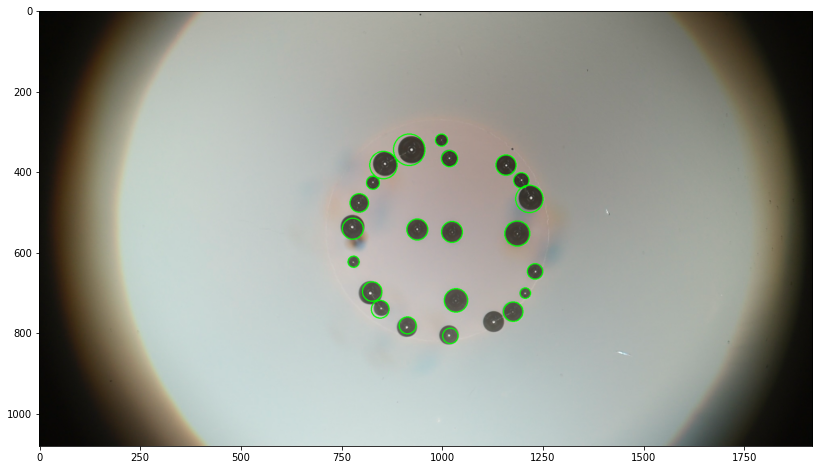

torch.Size([22, 4])


In [4]:
#Quick test
out_dict = run_hough(all_pristine[0], show=True)
print(out_dict['boxes'].shape)

In [6]:
from utils import Dataset
from evaluate import get_metrics
from ray.tune.schedulers import ASHAScheduler
from torch.utils.data import DataLoader

def training_function(config):
    # Hyperparameters
    blur, dp, param1, param2 = config['blur'], config['dp'], \
                                config['param1'], config['param2']
    hough_dicts = []
    gt_dicts = []
    dataset = Dataset('/media/jim/a3a803dc-f678-4894-a0bd-d4669eb1d005/Work/catalyst-bubble-detection/data/pristine-full/hough/train/', [], False)
    loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=0)
    for image, target in loader:
        image = (image[0].permute((1, 2, 0)) * 255).byte().numpy()
        hough_dict = run_hough(image,blur=blur,\
                               dp=dp,param1=param1,param2=param2)
        # DEFINE GT_DICT FOR CORRESPONDING IMAGE. DEFINE mAP_loss
        hough_dicts.append(hough_dict)
        gt_dicts.append(target)
        
    mAP, _ = get_metrics(hough_dicts, gt_dicts, dataset)
    tune.report(mAP=mAP)


scheduler = ASHAScheduler(
    metric='mAP',
    mode='max',
    max_t=1,
    grace_period=1,
    reduction_factor=2
)

analysis = tune.run(
    training_function,
    scheduler=scheduler,
    local_dir = 'saved/tune',
    resources_per_trial={'cpu': 1, 'gpu': 0},
    config={
        "blur": tune.choice([3,5,7,9,11,13,15,17]),
        "dp": tune.uniform(1,3),
        "param1": tune.choice(range(10,1000)),
        "param2": tune.choice(range(5,50))
    },
    num_samples=1000
)

print("Best config: ", analysis.get_best_config(
    metric="mAP", mode="max"))

# Get a dataframe for analyzing trial results.
df = analysis.results_df

Trial name,status,loc,blur,dp,param1,param2
training_function_43bbf_00000,PENDING,,7,2.58521,200,32
training_function_43bbf_00001,PENDING,,17,2.53067,267,20
training_function_43bbf_00002,PENDING,,3,1.51762,376,40
training_function_43bbf_00003,PENDING,,3,2.18483,581,12
training_function_43bbf_00004,PENDING,,17,2.64547,191,25
training_function_43bbf_00005,PENDING,,7,1.91175,410,14
training_function_43bbf_00006,PENDING,,3,2.88162,682,11
training_function_43bbf_00007,PENDING,,11,1.42562,999,8
training_function_43bbf_00008,PENDING,,13,2.08309,892,8
training_function_43bbf_00009,PENDING,,15,2.62555,833,7


Trial name,status,loc,blur,dp,param1,param2
training_function_43bbf_00000,RUNNING,,7,2.58521,200,32
training_function_43bbf_00001,RUNNING,,17,2.53067,267,20
training_function_43bbf_00002,RUNNING,,3,1.51762,376,40
training_function_43bbf_00003,RUNNING,,3,2.18483,581,12
training_function_43bbf_00004,RUNNING,,17,2.64547,191,25
training_function_43bbf_00005,RUNNING,,7,1.91175,410,14
training_function_43bbf_00006,RUNNING,,3,2.88162,682,11
training_function_43bbf_00007,RUNNING,,11,1.42562,999,8
training_function_43bbf_00008,RUNNING,,13,2.08309,892,8
training_function_43bbf_00009,RUNNING,,15,2.62555,833,7


Trial name,status,loc,blur,dp,param1,param2
training_function_43bbf_00000,RUNNING,,7,2.58521,200,32
training_function_43bbf_00001,RUNNING,,17,2.53067,267,20
training_function_43bbf_00002,RUNNING,,3,1.51762,376,40
training_function_43bbf_00003,RUNNING,,3,2.18483,581,12
training_function_43bbf_00004,RUNNING,,17,2.64547,191,25
training_function_43bbf_00005,RUNNING,,7,1.91175,410,14
training_function_43bbf_00006,RUNNING,,3,2.88162,682,11
training_function_43bbf_00007,RUNNING,,11,1.42562,999,8
training_function_43bbf_00008,RUNNING,,13,2.08309,892,8
training_function_43bbf_00009,RUNNING,,15,2.62555,833,7


(pid=110025) creating index...
(pid=110025) index created!
Result for training_function_43bbf_00012:
  date: 2021-12-14_17-12-34
  done: true
  experiment_id: 6f1414d6db0c43458cad3cd64d66c8b3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.00363036303630363
  node_ip: 192.168.1.42
  pid: 110025
  time_since_restore: 19.061913013458252
  time_this_iter_s: 19.061913013458252
  time_total_s: 19.061913013458252
  timestamp: 1639523554
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00012
  
(pid=110025) Accumulating evaluation results...
(pid=110025) DONE (t=0.04s).
(pid=110025) IoU metric: bbox
(pid=110025)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.004
(pid=110025)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.010
(pid=110025)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.003
(pid=110025)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00000,RUNNING,,7,2.58521,200,32,,,
training_function_43bbf_00001,RUNNING,,17,2.53067,267,20,,,
training_function_43bbf_00002,RUNNING,,3,1.51762,376,40,,,
training_function_43bbf_00003,RUNNING,,3,2.18483,581,12,,,
training_function_43bbf_00004,RUNNING,,17,2.64547,191,25,,,
training_function_43bbf_00005,RUNNING,,7,1.91175,410,14,,,
training_function_43bbf_00006,RUNNING,,3,2.88162,682,11,,,
training_function_43bbf_00007,RUNNING,,11,1.42562,999,8,,,
training_function_43bbf_00008,RUNNING,,13,2.08309,892,8,,,
training_function_43bbf_00009,RUNNING,,15,2.62555,833,7,,,


(pid=110004) creating index...
(pid=110004) index created!
(pid=110004) Accumulating evaluation results...
Result for training_function_43bbf_00006:
(pid=110004) DONE (t=0.06s).
(pid=110004) IoU metric: bbox
(pid=110004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
(pid=110004)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.007
(pid=110004)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.002
(pid=110004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.003
(pid=110004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.008
(pid=110004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=110004)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.008
(pid=110004)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.008
(pid=110004)  Average Recall     (AR) @[ IoU=0.5

(pid=109863) Accumulating evaluation results...
Result for training_function_43bbf_00003:
  date: 2021-12-14_17-12-37
  done: true
  experiment_id: 10a505e225bd4295bfdd534feb3aa139
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.09640975638229717
  node_ip: 192.168.1.42
  pid: 109863
  time_since_restore: 22.52565360069275
  time_this_iter_s: 22.52565360069275
  time_total_s: 22.52565360069275
  timestamp: 1639523557
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00003
  
(pid=109863) DONE (t=0.12s).
(pid=109863) IoU metric: bbox
(pid=109863)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.096
(pid=109863)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.135
(pid=109863)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.106
(pid=109863)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.095
(pid=109863)  Average Precision  (AP) @[ IoU=0.50

(pid=110014) creating index...
(pid=110014) index created!
(pid=110014) Accumulating evaluation results...
(pid=110024) creating index...
(pid=110024) index created!
(pid=110014) DONE (t=0.04s).
(pid=110014) IoU metric: bbox
(pid=110014)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=110014)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=110014)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=110014)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=110014)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=110014)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=110014)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=110014)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=110014)  Average Recall   

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00000,RUNNING,,7,2.58521,200,32,,,
training_function_43bbf_00004,RUNNING,,17,2.64547,191,25,,,
training_function_43bbf_00005,RUNNING,,7,1.91175,410,14,,,
training_function_43bbf_00007,RUNNING,,11,1.42562,999,8,,,
training_function_43bbf_00011,RUNNING,,7,1.70771,811,26,,,
training_function_43bbf_00016,RUNNING,,3,2.12253,329,40,,,
training_function_43bbf_00017,RUNNING,,3,1.94906,833,46,,,
training_function_43bbf_00027,PENDING,,13,2.822,961,41,,,
training_function_43bbf_00028,PENDING,,5,1.0722,576,9,,,
training_function_43bbf_00029,PENDING,,7,1.86305,637,29,,,


Result for training_function_43bbf_00007:
  date: 2021-12-14_17-12-39
  done: true
  experiment_id: e561b6806da64cd1a97f0f50d9a62751
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 110014
  time_since_restore: 23.67323923110962
  time_this_iter_s: 23.67323923110962
  time_total_s: 23.67323923110962
  timestamp: 1639523559
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00007
  
(pid=110019) creating index...
(pid=110019) index created!
(pid=110019) Accumulating evaluation results...
Result for training_function_43bbf_00011:
  date: 2021-12-14_17-12-39
  done: true
  experiment_id: f94ef81257974f35aeddf301b634212e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 110019
  time_since_restore: 24.631534337997437
  time_this_iter_s: 24.631534337997437
  time_total_s: 24.631534337997437
  timestamp: 1639523559
  timesteps_since_restore: 0
  training_iteration: 1
  tri

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00016,RUNNING,,3,2.12253,329,40,,,
training_function_43bbf_00017,RUNNING,,3,1.94906,833,46,,,
training_function_43bbf_00018,RUNNING,,17,2.19371,867,12,,,
training_function_43bbf_00019,RUNNING,,17,2.01348,933,18,,,
training_function_43bbf_00020,RUNNING,,7,2.8536,342,9,,,
training_function_43bbf_00021,RUNNING,,5,1.9569,523,13,,,
training_function_43bbf_00022,RUNNING,,7,1.03055,832,21,,,
training_function_43bbf_00032,PENDING,,3,1.30079,19,49,,,
training_function_43bbf_00033,PENDING,,3,1.12985,745,20,,,
training_function_43bbf_00034,PENDING,,7,2.08136,585,14,,,


(pid=110742) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=110750) creating index...
(pid=110750) index created!
Result for training_function_43bbf_00017:
  date: 2021-12-14_17-13-00
  done: true
  experiment_id: f0fd1787995e4d59b5de97fc0af9f3a4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 110750
  time_since_restore: 17.842644214630127
  time_this_iter_s: 17.842644214630127
  time_total_s: 17.842644214630127
  timestamp: 1639523580
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00017
  
(pid=110750) Accumulating evaluation results...
(pid=110750) DONE (t=0.02s).
(pid=110750) IoU metric: bbox
(pid=110750)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=110750)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=110750)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=110750)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00016,RUNNING,,3,2.12253,329,40,,,
training_function_43bbf_00018,RUNNING,,17,2.19371,867,12,,,
training_function_43bbf_00019,RUNNING,,17,2.01348,933,18,,,
training_function_43bbf_00020,RUNNING,,7,2.8536,342,9,,,
training_function_43bbf_00021,RUNNING,,5,1.9569,523,13,,,
training_function_43bbf_00022,RUNNING,,7,1.03055,832,21,,,
training_function_43bbf_00023,RUNNING,,15,2.39567,851,15,,,
training_function_43bbf_00032,PENDING,,3,1.30079,19,49,,,
training_function_43bbf_00033,PENDING,,3,1.12985,745,20,,,
training_function_43bbf_00034,PENDING,,7,2.08136,585,14,,,


(pid=110755) creating index...
(pid=110755) index created!
(pid=110743) creating index...
(pid=110743) index created!
(pid=110743) Accumulating evaluation results...
Result for training_function_43bbf_00018:
  date: 2021-12-14_17-13-01
  done: true
  experiment_id: b33b19c546c2455b953df1c7f7e31432
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 110743
  time_since_restore: 18.575368404388428
  time_this_iter_s: 18.575368404388428
  time_total_s: 18.575368404388428
  timestamp: 1639523581
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00018
  
(pid=110743) DONE (t=0.01s).
(pid=110743) IoU metric: bbox
(pid=110743)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=110743)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=110743)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=110743)  Average Precision  (AP)

(pid=110760) creating index...
(pid=110760) index created!
Result for training_function_43bbf_00022:
  date: 2021-12-14_17-13-03
  done: true
  experiment_id: 3ff09f205de447a7a9ae068ee8a3579a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 110760
  time_since_restore: 20.252708196640015
  time_this_iter_s: 20.252708196640015
  time_total_s: 20.252708196640015
  timestamp: 1639523583
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00022
  
(pid=110760) Accumulating evaluation results...
(pid=110760) DONE (t=0.01s).
(pid=110760) IoU metric: bbox
(pid=110760)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=110760)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=110760)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=110760)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00020,RUNNING,,7,2.8536,342,9,,,
training_function_43bbf_00026,RUNNING,,11,1.49829,503,42,,,
training_function_43bbf_00027,RUNNING,,13,2.822,961,41,,,
training_function_43bbf_00028,RUNNING,,5,1.0722,576,9,,,
training_function_43bbf_00029,RUNNING,,7,1.86305,637,29,,,
training_function_43bbf_00030,RUNNING,,7,2.86968,713,40,,,
training_function_43bbf_00031,RUNNING,,11,1.96664,57,24,,,
training_function_43bbf_00041,PENDING,,9,1.19983,512,8,,,
training_function_43bbf_00042,PENDING,,15,1.31043,800,22,,,
training_function_43bbf_00043,PENDING,,13,2.92896,206,44,,,


(pid=110742) creating index...
(pid=110742) index created!
(pid=111160) creating index...
(pid=111160) index created!
(pid=111160) Accumulating evaluation results...
Result for training_function_43bbf_00030:
  date: 2021-12-14_17-13-05
  done: true
  experiment_id: e6fb8d0421fc4207ac534e1e93119408
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 111160
  time_since_restore: 20.092833042144775
  time_this_iter_s: 20.092833042144775
  time_total_s: 20.092833042144775
  timestamp: 1639523585
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00030
  
(pid=111160) DONE (t=0.02s).
(pid=111160) IoU metric: bbox
(pid=111160)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=111160)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=111160)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=111160)  Average Precision  (AP)

(pid=111175) creating index...
(pid=111175) index created!
Result for training_function_43bbf_00029:
  date: 2021-12-14_17-13-09
  done: true
  experiment_id: 2aa1fc00289a463da593c6df02fcfdd2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0025459688826025458
  node_ip: 192.168.1.42
  pid: 111175
  time_since_restore: 21.87443995475769
  time_this_iter_s: 21.87443995475769
  time_total_s: 21.87443995475769
  timestamp: 1639523589
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00029
  
(pid=111175) Accumulating evaluation results...
(pid=111175) DONE (t=0.02s).
(pid=111175) IoU metric: bbox
(pid=111175)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
(pid=111175)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.003
(pid=111175)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.003
(pid=111175)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00032,RUNNING,,3,1.30079,19,49,,,
training_function_43bbf_00033,RUNNING,,3,1.12985,745,20,,,
training_function_43bbf_00034,RUNNING,,7,2.08136,585,14,,,
training_function_43bbf_00035,RUNNING,,9,2.01749,161,19,,,
training_function_43bbf_00036,RUNNING,,3,1.32422,119,47,,,
training_function_43bbf_00037,RUNNING,,9,2.37776,462,37,,,
training_function_43bbf_00038,RUNNING,,17,1.43173,199,45,,,
training_function_43bbf_00048,PENDING,,11,2.33159,893,23,,,
training_function_43bbf_00049,PENDING,,7,1.25737,359,8,,,
training_function_43bbf_00050,PENDING,,11,2.61103,984,30,,,


(pid=111658) creating index...
(pid=111658) index created!
Result for training_function_43bbf_00033:
  date: 2021-12-14_17-13-26
  done: true
  experiment_id: eae2a887a667475b92a9b0b3d54c7fb2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 111658
  time_since_restore: 18.149338245391846
  time_this_iter_s: 18.149338245391846
  time_total_s: 18.149338245391846
  timestamp: 1639523606
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00033
  
(pid=111658) Accumulating evaluation results...
(pid=111658) DONE (t=0.02s).
(pid=111658) IoU metric: bbox
(pid=111658)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=111658)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=111658)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=111658)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00032,RUNNING,,3,1.30079,19,49,,,
training_function_43bbf_00034,RUNNING,,7,2.08136,585,14,,,
training_function_43bbf_00035,RUNNING,,9,2.01749,161,19,,,
training_function_43bbf_00036,RUNNING,,3,1.32422,119,47,,,
training_function_43bbf_00037,RUNNING,,9,2.37776,462,37,,,
training_function_43bbf_00038,RUNNING,,17,1.43173,199,45,,,
training_function_43bbf_00039,RUNNING,,11,2.5523,461,25,,,
training_function_43bbf_00048,PENDING,,11,2.33159,893,23,,,
training_function_43bbf_00049,PENDING,,7,1.25737,359,8,,,
training_function_43bbf_00050,PENDING,,11,2.61103,984,30,,,


(pid=111652) creating index...
(pid=111652) index created!
Result for training_function_43bbf_00036:
  date: 2021-12-14_17-13-26
  done: true
  experiment_id: d00b8756a74d41919623082fa5ce912c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.1126447270594613
  node_ip: 192.168.1.42
  pid: 111652
  time_since_restore: 18.89231276512146
  time_this_iter_s: 18.89231276512146
  time_total_s: 18.89231276512146
  timestamp: 1639523606
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00036
  
(pid=111652) Accumulating evaluation results...
(pid=111652) DONE (t=0.02s).
(pid=111652) IoU metric: bbox
(pid=111652)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.113
(pid=111652)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.148
(pid=111652)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.122
(pid=111652)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

(pid=111685) creating index...
(pid=111685) index created!
Result for training_function_43bbf_00040:
  date: 2021-12-14_17-13-30
  done: true
  experiment_id: 131cb71acb444dde9c787fe0d9a9f48b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.713999585789414
  node_ip: 192.168.1.42
  pid: 111749
  time_since_restore: 21.40675663948059
  time_this_iter_s: 21.40675663948059
  time_total_s: 21.40675663948059
  timestamp: 1639523610
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00040
  (pid=111749) Accumulating evaluation results...
(pid=111749) DONE (t=0.04s).
(pid=111749) IoU metric: bbox
(pid=111749)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.714
(pid=111749)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.871
(pid=111749)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.795
(pid=111749)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] =

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00035,RUNNING,,9,2.01749,161,19,,,
training_function_43bbf_00041,RUNNING,,9,1.19983,512,8,,,
training_function_43bbf_00043,RUNNING,,13,2.92896,206,44,,,
training_function_43bbf_00044,RUNNING,,7,2.23107,346,33,,,
training_function_43bbf_00045,RUNNING,,5,2.49862,791,17,,,
training_function_43bbf_00046,RUNNING,,7,1.35736,433,26,,,
training_function_43bbf_00047,RUNNING,,13,1.92477,767,33,,,
training_function_43bbf_00057,PENDING,,13,2.25212,181,43,,,
training_function_43bbf_00058,PENDING,,11,1.26743,396,32,,,
training_function_43bbf_00059,PENDING,,13,1.63434,417,10,,,


Result for training_function_43bbf_00045:
  date: 2021-12-14_17-13-31
  done: true
  experiment_id: 0b5a15ab380e407caae0602e0a39a808
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 111996
  time_since_restore: 18.077720165252686
  time_this_iter_s: 18.077720165252686
  time_total_s: 18.077720165252686
  timestamp: 1639523611
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00045
  
(pid=111996) Accumulating evaluation results...
(pid=111996) DONE (t=0.02s).
(pid=111996) IoU metric: bbox
(pid=111996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=111996)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=111996)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=111996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=111996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=

(pid=111993) Accumulating evaluation results...
Result for training_function_43bbf_00044:
  date: 2021-12-14_17-13-34
  done: true
  experiment_id: 5e2233c6d1b24491809069f9d5020afa
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6278319238281116
  node_ip: 192.168.1.42
  pid: 111993
  time_since_restore: 21.531075954437256
  time_this_iter_s: 21.531075954437256
  time_total_s: 21.531075954437256
  timestamp: 1639523614
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00044
  
(pid=111993) DONE (t=0.04s).
(pid=111993) IoU metric: bbox
(pid=111993)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
(pid=111993)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.853
(pid=111993)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.672
(pid=111993)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.519
(pid=111993)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00048,RUNNING,,11,2.33159,893,23,,,
training_function_43bbf_00049,RUNNING,,7,1.25737,359,8,,,
training_function_43bbf_00050,RUNNING,,11,2.61103,984,30,,,
training_function_43bbf_00051,RUNNING,,17,1.30211,770,33,,,
training_function_43bbf_00052,RUNNING,,17,2.16752,278,33,,,
training_function_43bbf_00053,RUNNING,,7,2.67667,523,35,,,
training_function_43bbf_00054,RUNNING,,3,1.10829,375,13,,,
training_function_43bbf_00064,PENDING,,9,2.1458,587,30,,,
training_function_43bbf_00065,PENDING,,5,1.05129,204,31,,,
training_function_43bbf_00066,PENDING,,5,1.44837,827,21,,,


(pid=112924) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=112433) creating index...
(pid=112433) index created!
Result for training_function_43bbf_00050:
  date: 2021-12-14_17-13-54
  done: true
  experiment_id: 23fd4d6d73e54d4a890bb06ab827d0bf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 112433
  time_since_restore: 22.359149932861328
  time_this_iter_s: 22.359149932861328
  time_total_s: 22.359149932861328
  timestamp: 1639523634
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00050
  
(pid=112433) Accumulating evaluation results...
(pid=112433) DONE (t=0.02s).
(pid=112433) IoU metric: bbox
(pid=112433)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=112433)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=112433)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=112433)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00048,RUNNING,,11,2.33159,893,23,,,
training_function_43bbf_00049,RUNNING,,7,1.25737,359,8,,,
training_function_43bbf_00051,RUNNING,,17,1.30211,770,33,,,
training_function_43bbf_00052,RUNNING,,17,2.16752,278,33,,,
training_function_43bbf_00053,RUNNING,,7,2.67667,523,35,,,
training_function_43bbf_00054,RUNNING,,3,1.10829,375,13,,,
training_function_43bbf_00055,RUNNING,,15,2.09967,546,15,,,
training_function_43bbf_00064,PENDING,,9,2.1458,587,30,,,
training_function_43bbf_00065,PENDING,,5,1.05129,204,31,,,
training_function_43bbf_00066,PENDING,,5,1.44837,827,21,,,


(pid=112438) creating index...
(pid=112438) index created!
Result for training_function_43bbf_00048:
  date: 2021-12-14_17-13-55
  done: true
  experiment_id: 59302185eb264be78ecc1ba4d30f4ab9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 112438
  time_since_restore: 21.873191595077515
  time_this_iter_s: 21.873191595077515
  time_total_s: 21.873191595077515
  timestamp: 1639523635
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00048
  (pid=112438) Accumulating evaluation results...
(pid=112438) DONE (t=0.02s).
(pid=112438) IoU metric: bbox
(pid=112438)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=112438)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=112438)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=112438)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00049,RUNNING,,7,1.25737,359,8,,,
training_function_43bbf_00054,RUNNING,,3,1.10829,375,13,,,
training_function_43bbf_00055,RUNNING,,15,2.09967,546,15,,,
training_function_43bbf_00057,RUNNING,,13,2.25212,181,43,,,
training_function_43bbf_00058,RUNNING,,11,1.26743,396,32,,,
training_function_43bbf_00059,RUNNING,,13,1.63434,417,10,,,
training_function_43bbf_00060,RUNNING,,9,1.45989,53,18,,,
training_function_43bbf_00070,PENDING,,17,2.81598,111,36,,,
training_function_43bbf_00071,PENDING,,3,1.13813,20,7,,,
training_function_43bbf_00072,PENDING,,11,2.77652,297,29,,,


Result for training_function_43bbf_00057:
  date: 2021-12-14_17-14-00
  done: true
  experiment_id: c7dd7a1b5e87458d9cf1075d33dc897a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.694243489937563
  node_ip: 192.168.1.42
  pid: 112597
  time_since_restore: 22.48371934890747
  time_this_iter_s: 22.48371934890747
  time_total_s: 22.48371934890747
  timestamp: 1639523640
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00057
  
(pid=112597) Accumulating evaluation results...
(pid=112597) DONE (t=0.03s).
(pid=112597) IoU metric: bbox
(pid=112597)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.694
(pid=112597)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.859
(pid=112597)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.789
(pid=112597)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.376
(pid=112597)  Average Precision  (AP) @[ IoU=0.50:0

(pid=112605) Accumulating evaluation results...
Result for training_function_43bbf_00058:
  date: 2021-12-14_17-14-01
  done: true
  experiment_id: 143d4576b88a40e88f37322f7fea8641
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6669116503749916
  node_ip: 192.168.1.42
  pid: 112605
  time_since_restore: 23.28938317298889
  time_this_iter_s: 23.28938317298889
  time_total_s: 23.28938317298889
  timestamp: 1639523641
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00058
  
(pid=112605) DONE (t=0.06s).
(pid=112605) IoU metric: bbox
(pid=112605)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.667
(pid=112605)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.792
(pid=112605)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.759
(pid=112605)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.424
(pid=112605)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00059,RUNNING,,13,1.63434,417,10,,,
training_function_43bbf_00060,RUNNING,,9,1.45989,53,18,,,
training_function_43bbf_00063,RUNNING,,5,2.14106,382,6,,,
training_function_43bbf_00064,RUNNING,,9,2.1458,587,30,,,
training_function_43bbf_00065,RUNNING,,5,1.05129,204,31,,,
training_function_43bbf_00066,RUNNING,,5,1.44837,827,21,,,
training_function_43bbf_00067,RUNNING,,3,1.00945,753,48,,,
training_function_43bbf_00077,PENDING,,15,2.03619,647,5,,,
training_function_43bbf_00078,PENDING,,3,1.93403,326,8,,,
training_function_43bbf_00079,PENDING,,9,2.4745,747,44,,,


(pid=112924) Accumulating evaluation results...
(pid=112704) creating index...
(pid=112704) index created!
Result for training_function_43bbf_00063:
  date: 2021-12-14_17-14-05
  done: true
  experiment_id: edaa314cc02e46778546d5fd28bca8a6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5102849035098224
  node_ip: 192.168.1.42
  pid: 112924
  time_since_restore: 22.701976537704468
  time_this_iter_s: 22.701976537704468
  time_total_s: 22.701976537704468
  timestamp: 1639523645
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00063
  
(pid=112924) DONE (t=0.16s).
(pid=112924) IoU metric: bbox
(pid=112924)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.510
(pid=112924)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.692
(pid=112924)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.527
(pid=112924)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=113621) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars
(pid=113621) <ipython-input-3-79e913f172a5>:26: RuntimeWarning: overflow encountered in ushort_scalars


(pid=113444) creating index...
(pid=113444) index created!
(pid=113444) Accumulating evaluation results...
Result for training_function_43bbf_00066:
  date: 2021-12-14_17-14-24
  done: true
  experiment_id: cf2fc1fd1b034469bd91be2ba1e8e88e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 113444
  time_since_restore: 21.179363250732422
  time_this_iter_s: 21.179363250732422
  time_total_s: 21.179363250732422
  timestamp: 1639523664
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00066
  
(pid=113444) DONE (t=0.02s).
(pid=113444) IoU metric: bbox
(pid=113444)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=113444)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=113444)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=113444)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00064,RUNNING,,9,2.1458,587,30,,,
training_function_43bbf_00065,RUNNING,,5,1.05129,204,31,,,
training_function_43bbf_00067,RUNNING,,3,1.00945,753,48,,,
training_function_43bbf_00068,RUNNING,,13,1.21432,510,12,,,
training_function_43bbf_00069,RUNNING,,5,2.47508,348,22,,,
training_function_43bbf_00070,RUNNING,,17,2.81598,111,36,,,
training_function_43bbf_00071,RUNNING,,3,1.13813,20,7,,,
training_function_43bbf_00080,PENDING,,17,2.18161,783,26,,,
training_function_43bbf_00081,PENDING,,3,1.84325,629,31,,,
training_function_43bbf_00082,PENDING,,15,1.13784,852,7,,,


(pid=113440) creating index...
(pid=113440) index created!
(pid=113445) creating index...
(pid=113445) index created!
(pid=113440) Accumulating evaluation results...
Result for training_function_43bbf_00064:
  date: 2021-12-14_17-14-26
  done: true
  experiment_id: 2ba83157d0b1446f88f8e565afd902a2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.07036667952509537
  node_ip: 192.168.1.42
  pid: 113445
  time_since_restore: 24.007766485214233
  time_this_iter_s: 24.007766485214233
  time_total_s: 24.007766485214233
  timestamp: 1639523666
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00064
  
(pid=113445) Accumulating evaluation results...
(pid=113445) DONE (t=0.02s).
(pid=113445) IoU metric: bbox
(pid=113445)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.070
(pid=113445)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.083
(pid=113445)  Average Precision  (AP) @[ IoU=0.75      | area=   a

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00069,RUNNING,,5,2.47508,348,22,,,
training_function_43bbf_00070,RUNNING,,17,2.81598,111,36,,,
training_function_43bbf_00071,RUNNING,,3,1.13813,20,7,,,
training_function_43bbf_00072,RUNNING,,11,2.77652,297,29,,,
training_function_43bbf_00073,RUNNING,,13,2.40274,321,38,,,
training_function_43bbf_00074,RUNNING,,13,2.72104,277,44,,,
training_function_43bbf_00075,RUNNING,,3,1.09965,31,42,,,
training_function_43bbf_00085,PENDING,,5,2.72835,141,39,,,
training_function_43bbf_00086,PENDING,,3,1.87152,507,7,,,
training_function_43bbf_00087,PENDING,,5,1.96631,54,14,,,


(pid=113538) creating index...
(pid=113538) index created!
(pid=113613) creating index...
(pid=113613) index created!
Result for training_function_43bbf_00075:
  date: 2021-12-14_17-14-31
  done: true
  experiment_id: 327b27dbd9a1499d84df884dbc9ea944
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.10613226261470787
  node_ip: 192.168.1.42
  pid: 113613
  time_since_restore: 22.916054248809814
  time_this_iter_s: 22.916054248809814
  time_total_s: 22.916054248809814
  timestamp: 1639523671
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00075
  
(pid=113613) Accumulating evaluation results...
(pid=113613) DONE (t=0.03s).
(pid=113613) IoU metric: bbox
(pid=113613)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.106
(pid=113613)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.130
(pid=113613)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.121
(pid=113613)  Average

Result for training_function_43bbf_00073:
  date: 2021-12-14_17-14-34
  done: true
  experiment_id: 5179639db2334455b9a31c4a2151ae6d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6944767034854279
  node_ip: 192.168.1.42
  pid: 113623
  time_since_restore: 25.158052682876587
  time_this_iter_s: 25.158052682876587
  time_total_s: 25.158052682876587
  timestamp: 1639523674
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00073
  
(pid=113623) DONE (t=0.08s).
(pid=113623) IoU metric: bbox
(pid=113623)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.694
(pid=113623)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.865
(pid=113623)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.799
(pid=113623)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.414
(pid=113623)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.841
(p

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00071,RUNNING,,3,1.13813,20,7,,,
training_function_43bbf_00072,RUNNING,,11,2.77652,297,29,,,
training_function_43bbf_00076,RUNNING,,5,1.22728,194,29,,,
training_function_43bbf_00077,RUNNING,,15,2.03619,647,5,,,
training_function_43bbf_00078,RUNNING,,3,1.93403,326,8,,,
training_function_43bbf_00079,RUNNING,,9,2.4745,747,44,,,
training_function_43bbf_00080,RUNNING,,17,2.18161,783,26,,,
training_function_43bbf_00090,PENDING,,3,2.73479,964,7,,,
training_function_43bbf_00091,PENDING,,9,1.38653,859,19,,,
training_function_43bbf_00092,PENDING,,9,1.12174,319,45,,,


Result for training_function_43bbf_00072:
  date: 2021-12-14_17-14-34
  done: true
  experiment_id: 82ac0bd0483649b086694f1c457acf69
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6673159077205648
  node_ip: 192.168.1.42
  pid: 113611
  time_since_restore: 25.718400955200195
  time_this_iter_s: 25.718400955200195
  time_total_s: 25.718400955200195
  timestamp: 1639523674
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00072
  
Result for training_function_43bbf_00076:
  date: 2021-12-14_17-14-34
  done: true
  experiment_id: abff83864a50494cb8139335976e7c62
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5485244736049489
  node_ip: 192.168.1.42
  pid: 113660
  time_since_restore: 24.56142830848694
  time_this_iter_s: 24.56142830848694
  time_total_s: 24.56142830848694
  timestamp: 1639523674
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00076
  


(pid=114386) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=113737) creating index...
(pid=113737) index created!
Result for training_function_43bbf_00077:
  date: 2021-12-14_17-14-37
  done: true
  experiment_id: e569ba7cd8c640e5b32e383cf85caa05
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 113737
  time_since_restore: 25.439091205596924
  time_this_iter_s: 25.439091205596924
  time_total_s: 25.439091205596924
  timestamp: 1639523677
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00077
  (pid=113737) Accumulating evaluation results...
(pid=113737) DONE (t=0.03s).
(pid=113737) IoU metric: bbox
(pid=113737)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=113737)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=113737)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=113737)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00071,RUNNING,,3,1.13813,20,7,,,
training_function_43bbf_00078,RUNNING,,3,1.93403,326,8,,,
training_function_43bbf_00080,RUNNING,,17,2.18161,783,26,,,
training_function_43bbf_00081,RUNNING,,3,1.84325,629,31,,,
training_function_43bbf_00082,RUNNING,,15,1.13784,852,7,,,
training_function_43bbf_00083,RUNNING,,17,2.17052,810,46,,,
training_function_43bbf_00084,RUNNING,,9,2.91884,55,7,,,
training_function_43bbf_00093,PENDING,,11,1.85651,746,20,,,
training_function_43bbf_00094,PENDING,,13,2.39975,462,36,,,
training_function_43bbf_00095,PENDING,,3,1.84517,124,12,,,


(pid=114027) Accumulating evaluation results...
Result for training_function_43bbf_00078:
  date: 2021-12-14_17-14-42
  done: true
  experiment_id: 8bb799fe33d94236ac00689d459df617
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3507872127340061
  node_ip: 192.168.1.42
  pid: 114027
  time_since_restore: 26.685635089874268
  time_this_iter_s: 26.685635089874268
  time_total_s: 26.685635089874268
  timestamp: 1639523682
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00078
  
(pid=114027) DONE (t=0.08s).
(pid=114027) IoU metric: bbox
(pid=114027)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.351
(pid=114027)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.568
(pid=114027)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.321
(pid=114027)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.383
(pid=114027)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00080,RUNNING,,17,2.18161,783,26,,,
training_function_43bbf_00081,RUNNING,,3,1.84325,629,31,,,
training_function_43bbf_00082,RUNNING,,15,1.13784,852,7,,,
training_function_43bbf_00083,RUNNING,,17,2.17052,810,46,,,
training_function_43bbf_00084,RUNNING,,9,2.91884,55,7,,,
training_function_43bbf_00085,RUNNING,,5,2.72835,141,39,,,
training_function_43bbf_00086,RUNNING,,3,1.87152,507,7,,,
training_function_43bbf_00096,PENDING,,7,2.53819,199,43,,,
training_function_43bbf_00097,PENDING,,11,2.45974,143,10,,,
training_function_43bbf_00098,PENDING,,5,2.37173,237,14,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00080,RUNNING,,17,2.18161,783,26,,,
training_function_43bbf_00081,RUNNING,,3,1.84325,629,31,,,
training_function_43bbf_00082,RUNNING,,15,1.13784,852,7,,,
training_function_43bbf_00083,RUNNING,,17,2.17052,810,46,,,
training_function_43bbf_00084,RUNNING,,9,2.91884,55,7,,,
training_function_43bbf_00085,RUNNING,,5,2.72835,141,39,,,
training_function_43bbf_00086,RUNNING,,3,1.87152,507,7,,,
training_function_43bbf_00096,PENDING,,7,2.53819,199,43,,,
training_function_43bbf_00097,PENDING,,11,2.45974,143,10,,,
training_function_43bbf_00098,PENDING,,5,2.37173,237,14,,,


(pid=114339) creating index...
(pid=114339) index created!
(pid=114339) Accumulating evaluation results...
Result for training_function_43bbf_00080:
  date: 2021-12-14_17-14-53
  done: true
  experiment_id: 6eca9b0c0ee04afea7dc52edecc299c1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 114339
  time_since_restore: 21.889397382736206
  time_this_iter_s: 21.889397382736206
  time_total_s: 21.889397382736206
  timestamp: 1639523693
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00080
  
(pid=114339) DONE (t=0.01s).
(pid=114339) IoU metric: bbox
(pid=114339)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=114339)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=114339)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=114339)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00082,RUNNING,,15,1.13784,852,7,,,
training_function_43bbf_00084,RUNNING,,9,2.91884,55,7,,,
training_function_43bbf_00085,RUNNING,,5,2.72835,141,39,,,
training_function_43bbf_00086,RUNNING,,3,1.87152,507,7,,,
training_function_43bbf_00087,RUNNING,,5,1.96631,54,14,,,
training_function_43bbf_00088,RUNNING,,15,2.62948,879,31,,,
training_function_43bbf_00089,RUNNING,,3,1.94429,634,30,,,
training_function_43bbf_00098,PENDING,,5,2.37173,237,14,,,
training_function_43bbf_00099,PENDING,,3,2.92612,212,18,,,
training_function_43bbf_00100,PENDING,,15,1.53746,535,17,,,


(pid=114518) creating index...
(pid=114518) index created!
(pid=114386) creating index...
(pid=114386) index created!
(pid=114410) creating index...
(pid=114410) index created!
Result for training_function_43bbf_00082:
  date: 2021-12-14_17-14-59
  done: true
  experiment_id: 24c56fd9ec054f63bcdcb429bac44e5a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 114410
  time_since_restore: 21.58689284324646
  time_this_iter_s: 21.58689284324646
  time_total_s: 21.58689284324646
  timestamp: 1639523699
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00082
  
(pid=114410) Accumulating evaluation results...
(pid=114410) DONE (t=0.02s).
(pid=114410) IoU metric: bbox
(pid=114410)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=114410)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=114410)  Average Precision  (AP) @[ IoU=0.75      | area=   all | max

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00084,RUNNING,,9,2.91884,55,7,,,
training_function_43bbf_00087,RUNNING,,5,1.96631,54,14,,,
training_function_43bbf_00088,RUNNING,,15,2.62948,879,31,,,
training_function_43bbf_00091,RUNNING,,9,1.38653,859,19,,,
training_function_43bbf_00092,RUNNING,,9,1.12174,319,45,,,
training_function_43bbf_00093,RUNNING,,11,1.85651,746,20,,,
training_function_43bbf_00094,RUNNING,,13,2.39975,462,36,,,
training_function_43bbf_00103,PENDING,,13,2.18109,921,28,,,
training_function_43bbf_00104,PENDING,,3,1.89849,104,29,,,
training_function_43bbf_00105,PENDING,,9,2.89457,155,11,,,


(pid=114386) Accumulating evaluation results...
Result for training_function_43bbf_00084:
  date: 2021-12-14_17-15-02
  done: true
  experiment_id: e281b425afb14c3fb27ff328a36531a8
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.4556045617247919
  node_ip: 192.168.1.42
  pid: 114386
  time_since_restore: 27.8441801071167
  time_this_iter_s: 27.8441801071167
  time_total_s: 27.8441801071167
  timestamp: 1639523702
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00084
  
(pid=114386) DONE (t=0.14s).
(pid=114386) IoU metric: bbox
(pid=114386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.456
(pid=114386)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.633
(pid=114386)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.509
(pid=114386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.449
(pid=114386)  Average Precision  (AP) @[ IoU=0.50:0.9

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00092,RUNNING,,9,1.12174,319,45,,,
training_function_43bbf_00093,RUNNING,,11,1.85651,746,20,,,
training_function_43bbf_00094,RUNNING,,13,2.39975,462,36,,,
training_function_43bbf_00095,RUNNING,,3,1.84517,124,12,,,
training_function_43bbf_00096,RUNNING,,7,2.53819,199,43,,,
training_function_43bbf_00097,RUNNING,,11,2.45974,143,10,,,
training_function_43bbf_00098,RUNNING,,5,2.37173,237,14,,,
training_function_43bbf_00108,PENDING,,7,1.77605,303,36,,,
training_function_43bbf_00109,PENDING,,3,1.24888,692,7,,,
training_function_43bbf_00110,PENDING,,15,1.25312,592,35,,,


(pid=114700) creating index...
(pid=114700) index created!


(pid=115492) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars
(pid=115492) <ipython-input-3-79e913f172a5>:26: RuntimeWarning: overflow encountered in ushort_scalars


(pid=114700) Accumulating evaluation results...
Result for training_function_43bbf_00092:
  date: 2021-12-14_17-15-07
  done: true
  experiment_id: ce335e95191842db898b5d324c4d5083
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6017680644584423
  node_ip: 192.168.1.42
  pid: 114700
  time_since_restore: 24.76374840736389
  time_this_iter_s: 24.76374840736389
  time_total_s: 24.76374840736389
  timestamp: 1639523707
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00092
  
(pid=114700) DONE (t=0.03s).
(pid=114700) IoU metric: bbox
(pid=114700)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.602
(pid=114700)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.693
(pid=114700)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.683
(pid=114700)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.310
(pid=114700)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00095,RUNNING,,3,1.84517,124,12,,,
training_function_43bbf_00096,RUNNING,,7,2.53819,199,43,,,
training_function_43bbf_00097,RUNNING,,11,2.45974,143,10,,,
training_function_43bbf_00098,RUNNING,,5,2.37173,237,14,,,
training_function_43bbf_00099,RUNNING,,3,2.92612,212,18,,,
training_function_43bbf_00100,RUNNING,,15,1.53746,535,17,,,
training_function_43bbf_00101,RUNNING,,9,1.94512,16,8,,,
training_function_43bbf_00110,PENDING,,15,1.25312,592,35,,,
training_function_43bbf_00111,PENDING,,11,1.22306,687,11,,,
training_function_43bbf_00112,PENDING,,3,1.23126,921,10,,,


(pid=115150) creating index...
(pid=115150) index created!


(pid=115595) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=115150) Accumulating evaluation results...
Result for training_function_43bbf_00095:
  date: 2021-12-14_17-15-15
  done: true
  experiment_id: 879fd6a455044827bdd1015f6c1a874d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.11792371668970601
  node_ip: 192.168.1.42
  pid: 115150
  time_since_restore: 23.322110176086426
  time_this_iter_s: 23.322110176086426
  time_total_s: 23.322110176086426
  timestamp: 1639523715
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00095
  
(pid=115150) DONE (t=0.06s).
(pid=115150) IoU metric: bbox
(pid=115150)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.118
(pid=115150)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.239
(pid=115150)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.101
(pid=115150)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.101
(pid=115150)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00096,RUNNING,,7,2.53819,199,43,,,
training_function_43bbf_00097,RUNNING,,11,2.45974,143,10,,,
training_function_43bbf_00098,RUNNING,,5,2.37173,237,14,,,
training_function_43bbf_00099,RUNNING,,3,2.92612,212,18,,,
training_function_43bbf_00100,RUNNING,,15,1.53746,535,17,,,
training_function_43bbf_00101,RUNNING,,9,1.94512,16,8,,,
training_function_43bbf_00102,RUNNING,,3,1.6225,395,12,,,
training_function_43bbf_00112,PENDING,,3,1.23126,921,10,,,
training_function_43bbf_00113,PENDING,,3,2.32923,902,10,,,
training_function_43bbf_00114,PENDING,,17,2.95459,891,6,,,


(pid=115386) creating index...
(pid=115386) index created!
(pid=115411) creating index...
(pid=115411) index created!


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00096,RUNNING,,7,2.53819,199,43,,,
training_function_43bbf_00097,RUNNING,,11,2.45974,143,10,,,
training_function_43bbf_00098,RUNNING,,5,2.37173,237,14,,,
training_function_43bbf_00099,RUNNING,,3,2.92612,212,18,,,
training_function_43bbf_00100,RUNNING,,15,1.53746,535,17,,,
training_function_43bbf_00101,RUNNING,,9,1.94512,16,8,,,
training_function_43bbf_00102,RUNNING,,3,1.6225,395,12,,,
training_function_43bbf_00112,PENDING,,3,1.23126,921,10,,,
training_function_43bbf_00113,PENDING,,3,2.32923,902,10,,,
training_function_43bbf_00114,PENDING,,17,2.95459,891,6,,,


(pid=115384) creating index...
(pid=115384) index created!
Result for training_function_43bbf_00096:
  date: 2021-12-14_17-15-24
  done: true
  experiment_id: aef29cd2298c4730a3b6bcab32f9f251
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5547366341076457
  node_ip: 192.168.1.42
  pid: 115384
  time_since_restore: 23.350107669830322
  time_this_iter_s: 23.350107669830322
  time_total_s: 23.350107669830322
  timestamp: 1639523724
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00096
  
(pid=115411) Accumulating evaluation results...
(pid=115384) Accumulating evaluation results...
(pid=115384) DONE (t=0.03s).
(pid=115384) IoU metric: bbox
(pid=115384)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.555
(pid=115384)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.771
(pid=115384)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.606
(pid=115384)  Average Precision  

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00099,RUNNING,,3,2.92612,212,18,,,
training_function_43bbf_00100,RUNNING,,15,1.53746,535,17,,,
training_function_43bbf_00101,RUNNING,,9,1.94512,16,8,,,
training_function_43bbf_00103,RUNNING,,13,2.18109,921,28,,,
training_function_43bbf_00104,RUNNING,,3,1.89849,104,29,,,
training_function_43bbf_00105,RUNNING,,9,2.89457,155,11,,,
training_function_43bbf_00106,RUNNING,,3,2.53104,845,21,,,
training_function_43bbf_00115,PENDING,,11,2.18799,959,26,,,
training_function_43bbf_00116,PENDING,,15,1.89783,220,41,,,
training_function_43bbf_00117,PENDING,,7,1.80045,617,17,,,


Result for training_function_43bbf_00103:
  date: 2021-12-14_17-15-29
  done: true
  experiment_id: 990aa1a881d94aadb35d721f000c362b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 115502
  time_since_restore: 20.85429286956787
  time_this_iter_s: 20.85429286956787
  time_total_s: 20.85429286956787
  timestamp: 1639523729
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00103
  
(pid=115498) creating index...
(pid=115498) index created!
Result for training_function_43bbf_00100:
  date: 2021-12-14_17-15-29
  done: true
  experiment_id: 82adff8ec874479a8989ba746c6d10de
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.13215288274731415
  node_ip: 192.168.1.42
  pid: 115498
  time_since_restore: 21.912960290908813
  time_this_iter_s: 21.912960290908813
  time_total_s: 21.912960290908813
  timestamp: 1639523729
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00100
  
(pid=11549

(pid=115492) creating index...
(pid=115492) index created!
(pid=115893) creating index...
(pid=115893) index created!
Result for training_function_43bbf_00105:
  date: 2021-12-14_17-15-33
  done: true
  experiment_id: 47d672ca95974517840a0c69086132ad
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5669646949367366
  node_ip: 192.168.1.42
  pid: 115595
  time_since_restore: 24.546687602996826
  time_this_iter_s: 24.546687602996826
  time_total_s: 24.546687602996826
  timestamp: 1639523733
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00105
  
(pid=115595) Accumulating evaluation results...
(pid=115595) DONE (t=0.06s).
(pid=115595) IoU metric: bbox
(pid=115595)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.567
(pid=115595)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.748
(pid=115595)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.651
(pid=115595)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00101,RUNNING,,9,1.94512,16,8,,,
training_function_43bbf_00107,RUNNING,,3,1.86907,125,25,,,
training_function_43bbf_00108,RUNNING,,7,1.77605,303,36,,,
training_function_43bbf_00109,RUNNING,,3,1.24888,692,7,,,
training_function_43bbf_00110,RUNNING,,15,1.25312,592,35,,,
training_function_43bbf_00111,RUNNING,,11,1.22306,687,11,,,
training_function_43bbf_00112,RUNNING,,3,1.23126,921,10,,,
training_function_43bbf_00122,PENDING,,5,2.76533,99,39,,,
training_function_43bbf_00123,PENDING,,11,2.25184,901,30,,,
training_function_43bbf_00124,PENDING,,5,2.24113,745,41,,,


Result for training_function_43bbf_00107:
  date: 2021-12-14_17-15-34
  done: true
  experiment_id: 79635a8c611047278bde9c05128fe339
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.1487533551444413
  node_ip: 192.168.1.42
  pid: 115893
  time_since_restore: 21.620606422424316
  time_this_iter_s: 21.620606422424316
  time_total_s: 21.620606422424316
  timestamp: 1639523734
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00107
  (pid=115893) DONE (t=0.06s).
(pid=115893) IoU metric: bbox
(pid=115893)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.149
(pid=115893)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.347
(pid=115893)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.107
(pid=115893)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.142
(pid=115893)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.187
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00111,RUNNING,,11,1.22306,687,11,,,
training_function_43bbf_00112,RUNNING,,3,1.23126,921,10,,,
training_function_43bbf_00113,RUNNING,,3,2.32923,902,10,,,
training_function_43bbf_00114,RUNNING,,17,2.95459,891,6,,,
training_function_43bbf_00115,RUNNING,,11,2.18799,959,26,,,
training_function_43bbf_00116,RUNNING,,15,1.89783,220,41,,,
training_function_43bbf_00117,RUNNING,,7,1.80045,617,17,,,
training_function_43bbf_00127,PENDING,,5,1.01825,456,48,,,
training_function_43bbf_00128,PENDING,,15,2.07622,694,11,,,
training_function_43bbf_00129,PENDING,,13,2.82404,39,38,,,


(pid=116163) creating index...
(pid=116163) index created!
(pid=116163) Accumulating evaluation results...
Result for training_function_43bbf_00111:
  date: 2021-12-14_17-15-43
  done: true
  experiment_id: fd78f9e115d94bb4ac7a76bf5426527e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 116163
  time_since_restore: 20.672741174697876
  time_this_iter_s: 20.672741174697876
  time_total_s: 20.672741174697876
  timestamp: 1639523743
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00111
  
(pid=116163) DONE (t=0.04s).
(pid=116163) IoU metric: bbox
(pid=116163)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=116163)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=116163)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=116163)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00113,RUNNING,,3,2.32923,902,10,,,
training_function_43bbf_00114,RUNNING,,17,2.95459,891,6,,,
training_function_43bbf_00115,RUNNING,,11,2.18799,959,26,,,
training_function_43bbf_00116,RUNNING,,15,1.89783,220,41,,,
training_function_43bbf_00117,RUNNING,,7,1.80045,617,17,,,
training_function_43bbf_00118,RUNNING,,15,2.46647,452,36,,,
training_function_43bbf_00119,RUNNING,,7,2.91879,225,34,,,
training_function_43bbf_00128,PENDING,,15,2.07622,694,11,,,
training_function_43bbf_00129,PENDING,,13,2.82404,39,38,,,
training_function_43bbf_00130,PENDING,,13,1.19874,296,46,,,


Result for training_function_43bbf_00113:
  date: 2021-12-14_17-15-53
  done: true
  experiment_id: 75e5cd0439844110825fd1133b7d5f43
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 116240
  time_since_restore: 21.139796018600464
  time_this_iter_s: 21.139796018600464
  time_total_s: 21.139796018600464
  timestamp: 1639523753
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00113
  
(pid=116236) creating index...
(pid=116236) index created!
(pid=116236) Accumulating evaluation results...
Result for training_function_43bbf_00114:
  date: 2021-12-14_17-15-54
  done: true
  experiment_id: f661384fcd7542138217918783df9ece
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 116236
  time_since_restore: 22.308390855789185
  time_this_iter_s: 22.308390855789185
  time_total_s: 22.308390855789185
  timestamp: 1639523754
  timesteps_since_restore: 0
  training_iteration: 1
  

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00116,RUNNING,,15,1.89783,220,41,,,
training_function_43bbf_00117,RUNNING,,7,1.80045,617,17,,,
training_function_43bbf_00118,RUNNING,,15,2.46647,452,36,,,
training_function_43bbf_00119,RUNNING,,7,2.91879,225,34,,,
training_function_43bbf_00120,RUNNING,,17,1.4747,44,32,,,
training_function_43bbf_00121,RUNNING,,15,2.11095,54,10,,,
training_function_43bbf_00122,RUNNING,,5,2.76533,99,39,,,
training_function_43bbf_00132,PENDING,,11,2.82378,92,21,,,
training_function_43bbf_00133,PENDING,,5,1.47583,894,15,,,
training_function_43bbf_00134,PENDING,,7,1.24361,566,13,,,


(pid=116396) creating index...
(pid=116396) index created!
(pid=116396) Accumulating evaluation results...
Result for training_function_43bbf_00120:
  date: 2021-12-14_17-16-00
  done: true
  experiment_id: 7d722c3ca7de48c9ab54e1f1e847f9d0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6609095140500039
  node_ip: 192.168.1.42
  pid: 116396
  time_since_restore: 23.320486783981323
  time_this_iter_s: 23.320486783981323
  time_total_s: 23.320486783981323
  timestamp: 1639523760
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00120
  
(pid=116396) DONE (t=0.03s).
(pid=116396) IoU metric: bbox
(pid=116396)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.661
(pid=116396)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.838
(pid=116396)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.744
(pid=116396)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00119,RUNNING,,7,2.91879,225,34,,,
training_function_43bbf_00121,RUNNING,,15,2.11095,54,10,,,
training_function_43bbf_00122,RUNNING,,5,2.76533,99,39,,,
training_function_43bbf_00123,RUNNING,,11,2.25184,901,30,,,
training_function_43bbf_00124,RUNNING,,5,2.24113,745,41,,,
training_function_43bbf_00125,RUNNING,,3,2.29721,651,43,,,
training_function_43bbf_00126,RUNNING,,15,1.61349,234,36,,,
training_function_43bbf_00136,PENDING,,7,1.78815,986,29,,,
training_function_43bbf_00137,PENDING,,5,1.43093,513,34,,,
training_function_43bbf_00138,PENDING,,11,1.15643,746,27,,,


Result for training_function_43bbf_00123:
  date: 2021-12-14_17-16-03
  done: true
  experiment_id: bae51994809548a0af2171547953e1c8
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 116728
  time_since_restore: 21.089635610580444
  time_this_iter_s: 21.089635610580444
  time_total_s: 21.089635610580444
  timestamp: 1639523763
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00123
  
(pid=116728) Accumulating evaluation results...
(pid=116728) DONE (t=0.03s).
(pid=116728) IoU metric: bbox
(pid=116728)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=116728)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=116728)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=116728)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=116728)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=

(pid=116787) creating index...
(pid=116787) index created!
Result for training_function_43bbf_00126:
  date: 2021-12-14_17-16-09
  done: true
  experiment_id: 5160310e3f5d429b86e035cd3db92cb2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7106971005804416
  node_ip: 192.168.1.42
  pid: 116787
  time_since_restore: 24.23977303504944
  time_this_iter_s: 24.23977303504944
  time_total_s: 24.23977303504944
  timestamp: 1639523769
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00126
  
(pid=116787) Accumulating evaluation results...
(pid=116787) DONE (t=0.04s).
(pid=116787) IoU metric: bbox
(pid=116787)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.711
(pid=116787)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.871
(pid=116787)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.807
(pid=116787)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00127,RUNNING,,5,1.01825,456,48,,,
training_function_43bbf_00128,RUNNING,,15,2.07622,694,11,,,
training_function_43bbf_00129,RUNNING,,13,2.82404,39,38,,,
training_function_43bbf_00130,RUNNING,,13,1.19874,296,46,,,
training_function_43bbf_00131,RUNNING,,3,2.40754,398,7,,,
training_function_43bbf_00132,RUNNING,,11,2.82378,92,21,,,
training_function_43bbf_00133,RUNNING,,5,1.47583,894,15,,,
training_function_43bbf_00142,PENDING,,17,2.52534,849,45,,,
training_function_43bbf_00143,PENDING,,9,2.28108,969,30,,,
training_function_43bbf_00144,PENDING,,9,2.92589,637,5,,,


(pid=117140) creating index...
(pid=117140) index created!
Result for training_function_43bbf_00127:
  date: 2021-12-14_17-16-10
  done: true
  experiment_id: e2fc3abdf658422fa3b4153d0d68f152
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.2995598486525914
  node_ip: 192.168.1.42
  pid: 117140
  time_since_restore: 19.898875951766968
  time_this_iter_s: 19.898875951766968
  time_total_s: 19.898875951766968
  timestamp: 1639523770
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00127
  
(pid=117140) Accumulating evaluation results...
(pid=117140) DONE (t=0.03s).
(pid=117140) IoU metric: bbox
(pid=117140)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
(pid=117140)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.337
(pid=117140)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.337
(pid=117140)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00128,RUNNING,,15,2.07622,694,11,,,
training_function_43bbf_00129,RUNNING,,13,2.82404,39,38,,,
training_function_43bbf_00130,RUNNING,,13,1.19874,296,46,,,
training_function_43bbf_00131,RUNNING,,3,2.40754,398,7,,,
training_function_43bbf_00132,RUNNING,,11,2.82378,92,21,,,
training_function_43bbf_00133,RUNNING,,5,1.47583,894,15,,,
training_function_43bbf_00134,RUNNING,,7,1.24361,566,13,,,
training_function_43bbf_00144,PENDING,,9,2.92589,637,5,,,
training_function_43bbf_00145,PENDING,,3,1.02532,644,21,,,
training_function_43bbf_00146,PENDING,,7,2.58163,49,38,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00128,RUNNING,,15,2.07622,694,11,,,
training_function_43bbf_00129,RUNNING,,13,2.82404,39,38,,,
training_function_43bbf_00130,RUNNING,,13,1.19874,296,46,,,
training_function_43bbf_00131,RUNNING,,3,2.40754,398,7,,,
training_function_43bbf_00132,RUNNING,,11,2.82378,92,21,,,
training_function_43bbf_00133,RUNNING,,5,1.47583,894,15,,,
training_function_43bbf_00134,RUNNING,,7,1.24361,566,13,,,
training_function_43bbf_00144,PENDING,,9,2.92589,637,5,,,
training_function_43bbf_00145,PENDING,,3,1.02532,644,21,,,
training_function_43bbf_00146,PENDING,,7,2.58163,49,38,,,


(pid=117263) creating index...
(pid=117263) index created!
(pid=117229) creating index...
(pid=117229) index created!
(pid=117234) creating index...
(pid=117234) index created!
Result for training_function_43bbf_00128:
  date: 2021-12-14_17-16-22
  done: true
  experiment_id: 3d6e026219d948b98c0aab3ced15d1b5
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 117234
  time_since_restore: 20.679994583129883
  time_this_iter_s: 20.679994583129883
  time_total_s: 20.679994583129883
  timestamp: 1639523782
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00128
  
(pid=117234) Accumulating evaluation results...
(pid=117234) DONE (t=0.02s).
(pid=117234) IoU metric: bbox
(pid=117234)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=117234)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=117234)  Average Precision  (AP) @[ IoU=0.75      | area=   all | 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00132,RUNNING,,11,2.82378,92,21,,,
training_function_43bbf_00134,RUNNING,,7,1.24361,566,13,,,
training_function_43bbf_00135,RUNNING,,9,1.13768,788,23,,,
training_function_43bbf_00136,RUNNING,,7,1.78815,986,29,,,
training_function_43bbf_00137,RUNNING,,5,1.43093,513,34,,,
training_function_43bbf_00138,RUNNING,,11,1.15643,746,27,,,
training_function_43bbf_00139,RUNNING,,9,1.84992,317,9,,,
training_function_43bbf_00148,PENDING,,15,2.82465,763,33,,,
training_function_43bbf_00149,PENDING,,7,1.98552,715,37,,,
training_function_43bbf_00150,PENDING,,9,2.36538,19,25,,,


(pid=117409) creating index...
(pid=117409) index created!
Result for training_function_43bbf_00135:
  date: 2021-12-14_17-16-28
  done: true
  experiment_id: 05770795b1ea45e3b3c2e94aa102e23f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 117409
  time_since_restore: 20.477869272232056
  time_this_iter_s: 20.477869272232056
  time_total_s: 20.477869272232056
  timestamp: 1639523788
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00135
  
(pid=117409) Accumulating evaluation results...
(pid=117409) DONE (t=0.01s).
(pid=117409) IoU metric: bbox
(pid=117409)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=117409)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=117409)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=117409)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

(pid=117421) DONE (t=0.22s).
(pid=117421) IoU metric: bbox
(pid=117421)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.609
(pid=117421)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.786
(pid=117421)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.665
(pid=117421)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.425
(pid=117421)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.775
(pid=117421)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.348
(pid=117421)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.041
(pid=117421)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.371
(pid=117421)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.713
(pid=117421)  Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.489
(pid=117421

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00139,RUNNING,,9,1.84992,317,9,,,
training_function_43bbf_00140,RUNNING,,17,1.26879,211,30,,,
training_function_43bbf_00141,RUNNING,,11,1.24174,71,10,,,
training_function_43bbf_00142,RUNNING,,17,2.52534,849,45,,,
training_function_43bbf_00143,RUNNING,,9,2.28108,969,30,,,
training_function_43bbf_00144,RUNNING,,9,2.92589,637,5,,,
training_function_43bbf_00145,RUNNING,,3,1.02532,644,21,,,
training_function_43bbf_00154,PENDING,,17,2.91378,67,7,,,
training_function_43bbf_00155,PENDING,,11,1.49838,98,15,,,
training_function_43bbf_00156,PENDING,,3,2.32358,373,43,,,


(pid=117796) creating index...
(pid=117796) index created!
Result for training_function_43bbf_00140:
  date: 2021-12-14_17-16-34
  done: true
  experiment_id: 87dd3161aa56442e8a63436b6bdc9f4d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6380262187793834
  node_ip: 192.168.1.42
  pid: 117796
  time_since_restore: 20.257227897644043
  time_this_iter_s: 20.257227897644043
  time_total_s: 20.257227897644043
  timestamp: 1639523794
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00140
  
(pid=117796) Accumulating evaluation results...
(pid=117796) DONE (t=0.03s).
(pid=117796) IoU metric: bbox
(pid=117796)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.638
(pid=117796)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.818
(pid=117796)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.739
(pid=117796)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00139,RUNNING,,9,1.84992,317,9,,,
training_function_43bbf_00141,RUNNING,,11,1.24174,71,10,,,
training_function_43bbf_00143,RUNNING,,9,2.28108,969,30,,,
training_function_43bbf_00144,RUNNING,,9,2.92589,637,5,,,
training_function_43bbf_00145,RUNNING,,3,1.02532,644,21,,,
training_function_43bbf_00146,RUNNING,,7,2.58163,49,38,,,
training_function_43bbf_00147,RUNNING,,3,1.34876,796,19,,,
training_function_43bbf_00157,PENDING,,5,2.05202,624,27,,,
training_function_43bbf_00158,PENDING,,11,1.41779,588,16,,,
training_function_43bbf_00159,PENDING,,5,1.44674,417,45,,,


(pid=117765) creating index...
(pid=117765) index created!
(pid=117794) creating index...
(pid=117794) index created!
Result for training_function_43bbf_00143:
  date: 2021-12-14_17-16-37
  done: true
  experiment_id: 4971d7ae88904ac4adeffeb68214dc0d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 117808
  time_since_restore: 21.51753807067871
  time_this_iter_s: 21.51753807067871
  time_total_s: 21.51753807067871
  timestamp: 1639523797
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00143
  
(pid=117808) creating index...
(pid=117808) index created!
(pid=117808) Accumulating evaluation results...
(pid=117808) DONE (t=0.02s).
(pid=117808) IoU metric: bbox
(pid=117808)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=117808)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=117808)  Average Precision  (AP) @[ IoU=0.75      | area=   all | max

(pid=118348) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=117794) Accumulating evaluation results...
Result for training_function_43bbf_00141:
  date: 2021-12-14_17-16-38
  done: true
  experiment_id: e374a44105394c429ae8420802fe1f58
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6970315408864652
  node_ip: 192.168.1.42
  pid: 117794
  time_since_restore: 24.301048755645752
  time_this_iter_s: 24.301048755645752
  time_total_s: 24.301048755645752
  timestamp: 1639523798
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00141
  
(pid=117794) DONE (t=0.06s).
(pid=117794) IoU metric: bbox
(pid=117794)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
(pid=117794)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.858
(pid=117794)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.798
(pid=117794)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.515
(pid=117794)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00144,RUNNING,,9,2.92589,637,5,,,
training_function_43bbf_00145,RUNNING,,3,1.02532,644,21,,,
training_function_43bbf_00146,RUNNING,,7,2.58163,49,38,,,
training_function_43bbf_00147,RUNNING,,3,1.34876,796,19,,,
training_function_43bbf_00148,RUNNING,,15,2.82465,763,33,,,
training_function_43bbf_00149,RUNNING,,7,1.98552,715,37,,,
training_function_43bbf_00150,RUNNING,,9,2.36538,19,25,,,
training_function_43bbf_00160,PENDING,,13,2.81294,753,45,,,
training_function_43bbf_00161,PENDING,,15,1.4977,965,16,,,
training_function_43bbf_00162,PENDING,,17,1.66897,475,48,,,


(pid=118170) creating index...
(pid=118170) index created!
Result for training_function_43bbf_00147:
  date: 2021-12-14_17-16-48
  done: true
  experiment_id: 1cccf14f66af41489ba2c9ab0a82f160
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 118170
  time_since_restore: 18.322506427764893
  time_this_iter_s: 18.322506427764893
  time_total_s: 18.322506427764893
  timestamp: 1639523808
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00147
  
(pid=118170) Accumulating evaluation results...
(pid=118170) DONE (t=0.03s).
(pid=118170) IoU metric: bbox
(pid=118170)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=118170)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=118170)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=118170)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00144,RUNNING,,9,2.92589,637,5,,,
training_function_43bbf_00145,RUNNING,,3,1.02532,644,21,,,
training_function_43bbf_00146,RUNNING,,7,2.58163,49,38,,,
training_function_43bbf_00148,RUNNING,,15,2.82465,763,33,,,
training_function_43bbf_00149,RUNNING,,7,1.98552,715,37,,,
training_function_43bbf_00150,RUNNING,,9,2.36538,19,25,,,
training_function_43bbf_00151,RUNNING,,5,1.45065,806,7,,,
training_function_43bbf_00160,PENDING,,13,2.81294,753,45,,,
training_function_43bbf_00161,PENDING,,15,1.4977,965,16,,,
training_function_43bbf_00162,PENDING,,17,1.66897,475,48,,,


(pid=118172) creating index...
(pid=118172) index created!
(pid=118172) Accumulating evaluation results...
(pid=118172) DONE (t=0.02s).
(pid=118172) IoU metric: bbox
(pid=118172)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.014
(pid=118172)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.018
(pid=118172)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.016
(pid=118172)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
(pid=118172)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.029
(pid=118172)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=118172)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.013
(pid=118172)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.021
(pid=118172)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00149,RUNNING,,7,1.98552,715,37,,,
training_function_43bbf_00150,RUNNING,,9,2.36538,19,25,,,
training_function_43bbf_00151,RUNNING,,5,1.45065,806,7,,,
training_function_43bbf_00153,RUNNING,,11,2.19757,184,32,,,
training_function_43bbf_00154,RUNNING,,17,2.91378,67,7,,,
training_function_43bbf_00155,RUNNING,,11,1.49838,98,15,,,
training_function_43bbf_00156,RUNNING,,3,2.32358,373,43,,,
training_function_43bbf_00166,PENDING,,17,1.0614,606,46,,,
training_function_43bbf_00167,PENDING,,17,1.31885,213,11,,,
training_function_43bbf_00168,PENDING,,5,1.05301,937,38,,,


(pid=118347) creating index...
(pid=118347) index created!
Result for training_function_43bbf_00151:
  date: 2021-12-14_17-16-56
  done: true
  experiment_id: 978c337ba08c40da8fb4599f5802b5f6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 118347
  time_since_restore: 19.36018466949463
  time_this_iter_s: 19.36018466949463
  time_total_s: 19.36018466949463
  timestamp: 1639523816
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00151
  
(pid=118347) Accumulating evaluation results...
(pid=118347) DONE (t=0.02s).
(pid=118347) IoU metric: bbox
(pid=118347)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=118347)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=118347)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=118347)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00150,RUNNING,,9,2.36538,19,25,,,
training_function_43bbf_00154,RUNNING,,17,2.91378,67,7,,,
training_function_43bbf_00155,RUNNING,,11,1.49838,98,15,,,
training_function_43bbf_00156,RUNNING,,3,2.32358,373,43,,,
training_function_43bbf_00157,RUNNING,,5,2.05202,624,27,,,
training_function_43bbf_00158,RUNNING,,11,1.41779,588,16,,,
training_function_43bbf_00159,RUNNING,,5,1.44674,417,45,,,
training_function_43bbf_00169,PENDING,,7,2.73179,784,47,,,
training_function_43bbf_00170,PENDING,,7,1.58042,207,16,,,
training_function_43bbf_00171,PENDING,,17,1.19785,946,33,,,


Result for training_function_43bbf_00154:
  date: 2021-12-14_17-16-59
  done: true
  experiment_id: d3506706101847ffb6ba7003796bb912
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5901463867585516
  node_ip: 192.168.1.42
  pid: 118358
  time_since_restore: 22.3674738407135
  time_this_iter_s: 22.3674738407135
  time_total_s: 22.3674738407135
  timestamp: 1639523819
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00154
  
(pid=118358) Accumulating evaluation results...
(pid=118358) DONE (t=0.04s).
(pid=118358) IoU metric: bbox
(pid=118358)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.590
(pid=118358)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.755
(pid=118358)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.672
(pid=118358)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.316
(pid=118358)  Average Precision  (AP) @[ IoU=0.50:0.9

(pid=119010) creating index...
(pid=119010) index created!
Result for training_function_43bbf_00155:
  date: 2021-12-14_17-17-04
  done: true
  experiment_id: 48f57f6124a3494b8b81ed2afb8c4469
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6993237576493943
  node_ip: 192.168.1.42
  pid: 118781
  time_since_restore: 22.528397798538208
  time_this_iter_s: 22.528397798538208
  time_total_s: 22.528397798538208
  timestamp: 1639523824
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00155
  (pid=118781) Accumulating evaluation results...
(pid=118781) DONE (t=0.05s).
(pid=118781) IoU metric: bbox
(pid=118781)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.699
(pid=118781)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.880
(pid=118781)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.792
(pid=118781)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00159,RUNNING,,5,1.44674,417,45,,,
training_function_43bbf_00160,RUNNING,,13,2.81294,753,45,,,
training_function_43bbf_00161,RUNNING,,15,1.4977,965,16,,,
training_function_43bbf_00162,RUNNING,,17,1.66897,475,48,,,
training_function_43bbf_00163,RUNNING,,3,1.37571,695,8,,,
training_function_43bbf_00164,RUNNING,,15,1.89967,100,36,,,
training_function_43bbf_00165,RUNNING,,3,2.49583,598,47,,,
training_function_43bbf_00174,PENDING,,7,1.61381,734,36,,,
training_function_43bbf_00175,PENDING,,7,1.53564,940,42,,,
training_function_43bbf_00176,PENDING,,17,2.23627,729,29,,,


(pid=119010) Accumulating evaluation results...
(pid=119010) DONE (t=0.03s).
(pid=119010) IoU metric: bbox
(pid=119010)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.446
(pid=119010)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.534
(pid=119010)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.499
(pid=119010)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.399
(pid=119010)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.503
(pid=119010)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.084
(pid=119010)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.041
(pid=119010)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.368
(pid=119010)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.463
(pid=119010)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00160,RUNNING,,13,2.81294,753,45,,,
training_function_43bbf_00161,RUNNING,,15,1.4977,965,16,,,
training_function_43bbf_00162,RUNNING,,17,1.66897,475,48,,,
training_function_43bbf_00163,RUNNING,,3,1.37571,695,8,,,
training_function_43bbf_00164,RUNNING,,15,1.89967,100,36,,,
training_function_43bbf_00165,RUNNING,,3,2.49583,598,47,,,
training_function_43bbf_00166,RUNNING,,17,1.0614,606,46,,,
training_function_43bbf_00176,PENDING,,17,2.23627,729,29,,,
training_function_43bbf_00177,PENDING,,7,2.43879,72,49,,,
training_function_43bbf_00178,PENDING,,7,1.64216,47,25,,,


Result for training_function_43bbf_00161:
  date: 2021-12-14_17-17-13
  done: true
  experiment_id: 38c9fb6a62e54fa090b32d005636a3b5
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 119120
  time_since_restore: 19.100977182388306
  time_this_iter_s: 19.100977182388306
  time_total_s: 19.100977182388306
  timestamp: 1639523833
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00161
  (pid=119120) creating index...
(pid=119120) index created!
(pid=119120) Accumulating evaluation results...
(pid=119120) DONE (t=0.02s).
(pid=119120) IoU metric: bbox
(pid=119120)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=119120)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=119120)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=119120)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00162,RUNNING,,17,1.66897,475,48,,,
training_function_43bbf_00163,RUNNING,,3,1.37571,695,8,,,
training_function_43bbf_00164,RUNNING,,15,1.89967,100,36,,,
training_function_43bbf_00165,RUNNING,,3,2.49583,598,47,,,
training_function_43bbf_00166,RUNNING,,17,1.0614,606,46,,,
training_function_43bbf_00167,RUNNING,,17,1.31885,213,11,,,
training_function_43bbf_00168,RUNNING,,5,1.05301,937,38,,,
training_function_43bbf_00178,PENDING,,7,1.64216,47,25,,,
training_function_43bbf_00179,PENDING,,13,2.14677,303,9,,,
training_function_43bbf_00180,PENDING,,7,2.35424,792,23,,,


(pid=119147) creating index...
(pid=119147) index created!
Result for training_function_43bbf_00162:
  date: 2021-12-14_17-17-17
  done: true
  experiment_id: ad3ecb95903743c9bd24801693f6053d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3466865697416753
  node_ip: 192.168.1.42
  pid: 119147
  time_since_restore: 20.229984998703003
  time_this_iter_s: 20.229984998703003
  time_total_s: 20.229984998703003
  timestamp: 1639523837
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00162
  
(pid=119147) Accumulating evaluation results...
(pid=119147) DONE (t=0.02s).
(pid=119147) IoU metric: bbox
(pid=119147)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.347
(pid=119147)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.406
(pid=119147)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.406
(pid=119147)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00167,RUNNING,,17,1.31885,213,11,,,
training_function_43bbf_00168,RUNNING,,5,1.05301,937,38,,,
training_function_43bbf_00169,RUNNING,,7,2.73179,784,47,,,
training_function_43bbf_00170,RUNNING,,7,1.58042,207,16,,,
training_function_43bbf_00171,RUNNING,,17,1.19785,946,33,,,
training_function_43bbf_00172,RUNNING,,5,1.28158,555,45,,,
training_function_43bbf_00173,RUNNING,,9,2.30014,669,39,,,
training_function_43bbf_00182,PENDING,,11,2.15818,523,9,,,
training_function_43bbf_00183,PENDING,,7,1.76253,910,10,,,
training_function_43bbf_00184,PENDING,,3,2.15534,714,7,,,


Result for training_function_43bbf_00168:
  date: 2021-12-14_17-17-21
  done: true
  experiment_id: 5d57ed88f69543158c29b692f075c105
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 119413
  time_since_restore: 17.704935312271118
  time_this_iter_s: 17.704935312271118
  time_total_s: 17.704935312271118
  timestamp: 1639523841
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00168
  
(pid=119413) creating index...
(pid=119413) index created!
(pid=119413) Accumulating evaluation results...
(pid=119413) DONE (t=0.02s).
(pid=119413) IoU metric: bbox
(pid=119413)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=119413)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=119413)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=119413)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00167,RUNNING,,17,1.31885,213,11,,,
training_function_43bbf_00170,RUNNING,,7,1.58042,207,16,,,
training_function_43bbf_00173,RUNNING,,9,2.30014,669,39,,,
training_function_43bbf_00174,RUNNING,,7,1.61381,734,36,,,
training_function_43bbf_00175,RUNNING,,7,1.53564,940,42,,,
training_function_43bbf_00176,RUNNING,,17,2.23627,729,29,,,
training_function_43bbf_00177,RUNNING,,7,2.43879,72,49,,,
training_function_43bbf_00187,PENDING,,11,1.21317,877,43,,,
training_function_43bbf_00188,PENDING,,13,2.18587,93,7,,,
training_function_43bbf_00189,PENDING,,15,2.42846,369,20,,,


(pid=119415) creating index...
(pid=119415) index created!
(pid=119415) Accumulating evaluation results...
Result for training_function_43bbf_00167:
  date: 2021-12-14_17-17-28
  done: true
  experiment_id: d97df998aaaa494cb0488ce62e92ee17
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6466904047386152
  node_ip: 192.168.1.42
  pid: 119415
  time_since_restore: 24.29680347442627
  time_this_iter_s: 24.29680347442627
  time_total_s: 24.29680347442627
  timestamp: 1639523848
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00167
  
(pid=119415) DONE (t=0.04s).
(pid=119415) IoU metric: bbox
(pid=119415)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.647
(pid=119415)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.828
(pid=119415)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.727
(pid=119415)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00174,RUNNING,,7,1.61381,734,36,,,
training_function_43bbf_00175,RUNNING,,7,1.53564,940,42,,,
training_function_43bbf_00176,RUNNING,,17,2.23627,729,29,,,
training_function_43bbf_00177,RUNNING,,7,2.43879,72,49,,,
training_function_43bbf_00178,RUNNING,,7,1.64216,47,25,,,
training_function_43bbf_00179,RUNNING,,13,2.14677,303,9,,,
training_function_43bbf_00180,RUNNING,,7,2.35424,792,23,,,
training_function_43bbf_00189,PENDING,,15,2.42846,369,20,,,
training_function_43bbf_00190,PENDING,,3,2.27095,710,16,,,
training_function_43bbf_00191,PENDING,,11,2.61123,839,13,,,


Result for training_function_43bbf_00175:
  date: 2021-12-14_17-17-31
  done: true
  experiment_id: b4f0c9a416c0441d97a55a2e605db9d7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 119735
  time_since_restore: 20.021534204483032
  time_this_iter_s: 20.021534204483032
  time_total_s: 20.021534204483032
  timestamp: 1639523851
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00175
  
(pid=119735) creating index...
(pid=119735) index created!
(pid=119735) Accumulating evaluation results...
(pid=119735) DONE (t=0.02s).
(pid=119735) IoU metric: bbox
(pid=119735)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=119735)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=119735)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=119735)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00176,RUNNING,,17,2.23627,729,29,,,
training_function_43bbf_00177,RUNNING,,7,2.43879,72,49,,,
training_function_43bbf_00178,RUNNING,,7,1.64216,47,25,,,
training_function_43bbf_00179,RUNNING,,13,2.14677,303,9,,,
training_function_43bbf_00180,RUNNING,,7,2.35424,792,23,,,
training_function_43bbf_00181,RUNNING,,17,1.51634,329,24,,,
training_function_43bbf_00182,RUNNING,,11,2.15818,523,9,,,
training_function_43bbf_00192,PENDING,,3,2.19975,43,49,,,
training_function_43bbf_00193,PENDING,,17,1.11029,153,27,,,
training_function_43bbf_00194,PENDING,,9,1.8358,970,38,,,


(pid=120601) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00176:(pid=119996) creating index...
(pid=119996) index created!
(pid=119996) Accumulating evaluation results...
(pid=119996) DONE (t=0.01s).
(pid=119996) IoU metric: bbox
(pid=119996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=119996)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=119996)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=119996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=119996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=119996)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=119996)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=119996)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=119996)  Average Recall     (AR) @[ IoU=0.50

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00177,RUNNING,,7,2.43879,72,49,,,
training_function_43bbf_00178,RUNNING,,7,1.64216,47,25,,,
training_function_43bbf_00179,RUNNING,,13,2.14677,303,9,,,
training_function_43bbf_00180,RUNNING,,7,2.35424,792,23,,,
training_function_43bbf_00181,RUNNING,,17,1.51634,329,24,,,
training_function_43bbf_00182,RUNNING,,11,2.15818,523,9,,,
training_function_43bbf_00183,RUNNING,,7,1.76253,910,10,,,
training_function_43bbf_00193,PENDING,,17,1.11029,153,27,,,
training_function_43bbf_00194,PENDING,,9,1.8358,970,38,,,
training_function_43bbf_00195,PENDING,,15,2.4803,174,34,,,


(pid=119995) creating index...
(pid=119995) index created!
(pid=119995) Accumulating evaluation results...
Result for training_function_43bbf_00177:
  date: 2021-12-14_17-17-43
  done: true
  experiment_id: c627d0d2e72045b5af52d90a42e55f6c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.4560237728401578
  node_ip: 192.168.1.42
  pid: 119995
  time_since_restore: 22.397324800491333
  time_this_iter_s: 22.397324800491333
  time_total_s: 22.397324800491333
  timestamp: 1639523863
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00177
  
(pid=119995) DONE (t=0.03s).
(pid=119995) IoU metric: bbox
(pid=119995)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.456
(pid=119995)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.647
(pid=119995)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.501
(pid=119995)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00178,RUNNING,,7,1.64216,47,25,,,
training_function_43bbf_00179,RUNNING,,13,2.14677,303,9,,,
training_function_43bbf_00182,RUNNING,,11,2.15818,523,9,,,
training_function_43bbf_00183,RUNNING,,7,1.76253,910,10,,,
training_function_43bbf_00184,RUNNING,,3,2.15534,714,7,,,
training_function_43bbf_00185,RUNNING,,5,1.79732,648,31,,,
training_function_43bbf_00186,RUNNING,,9,1.25282,688,23,,,
training_function_43bbf_00196,PENDING,,11,2.82936,800,15,,,
training_function_43bbf_00197,PENDING,,3,1.05087,783,38,,,
training_function_43bbf_00198,PENDING,,15,1.17868,72,30,,,


(pid=120086) creating index...
(pid=120086) index created!
(pid=120140) creating index...
(pid=120140) index created!
Result for training_function_43bbf_00183:
  date: 2021-12-14_17-17-46
  done: true
  experiment_id: e9a4746222f7475f80782bd4c4a77578
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 120140
  time_since_restore: 20.479809284210205
  time_this_iter_s: 20.479809284210205
  time_total_s: 20.479809284210205
  timestamp: 1639523866
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00183
  
(pid=120140) Accumulating evaluation results...
(pid=120140) DONE (t=0.04s).
(pid=120140) IoU metric: bbox
(pid=120140)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=120140)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=120140)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=120140)  Average Precision  (AP)

(pid=120298) creating index...
(pid=120298) index created!


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00184,RUNNING,,3,2.15534,714,7,,,
training_function_43bbf_00186,RUNNING,,9,1.25282,688,23,,,
training_function_43bbf_00187,RUNNING,,11,1.21317,877,43,,,
training_function_43bbf_00188,RUNNING,,13,2.18587,93,7,,,
training_function_43bbf_00189,RUNNING,,15,2.42846,369,20,,,
training_function_43bbf_00190,RUNNING,,3,2.27095,710,16,,,
training_function_43bbf_00191,RUNNING,,11,2.61123,839,13,,,
training_function_43bbf_00201,PENDING,,11,1.39898,632,6,,,
training_function_43bbf_00202,PENDING,,7,2.39076,429,47,,,
training_function_43bbf_00203,PENDING,,9,1.21863,823,25,,,


Result for training_function_43bbf_00184:
  date: 2021-12-14_17-17-51
  done: true
  experiment_id: 211b843cccd74b659250aed162fd4217
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 120298
  time_since_restore: 19.474546194076538
  time_this_iter_s: 19.474546194076538
  time_total_s: 19.474546194076538
  timestamp: 1639523871
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00184
  
(pid=120298) Accumulating evaluation results...
(pid=120298) DONE (t=0.02s).
(pid=120298) IoU metric: bbox
(pid=120298)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=120298)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=120298)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=120298)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=120298)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00188,RUNNING,,13,2.18587,93,7,,,
training_function_43bbf_00189,RUNNING,,15,2.42846,369,20,,,
training_function_43bbf_00192,RUNNING,,3,2.19975,43,49,,,
training_function_43bbf_00193,RUNNING,,17,1.11029,153,27,,,
training_function_43bbf_00194,RUNNING,,9,1.8358,970,38,,,
training_function_43bbf_00195,RUNNING,,15,2.4803,174,34,,,
training_function_43bbf_00196,RUNNING,,11,2.82936,800,15,,,
training_function_43bbf_00205,PENDING,,17,2.46678,16,38,,,
training_function_43bbf_00206,PENDING,,9,1.31385,163,34,,,
training_function_43bbf_00207,PENDING,,11,2.50061,666,5,,,


Result for training_function_43bbf_00189:
  date: 2021-12-14_17-17-59
  done: true
  experiment_id: 9d3ba2ef19c54db8b2204055dbb553a6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.637552271303562
  node_ip: 192.168.1.42
  pid: 120598
  time_since_restore: 21.79113268852234
  time_this_iter_s: 21.79113268852234
  time_total_s: 21.79113268852234
  timestamp: 1639523879
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00189
  
(pid=120598) Accumulating evaluation results...
(pid=120598) DONE (t=0.04s).
(pid=120598) IoU metric: bbox
(pid=120598)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.638
(pid=120598)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.783
(pid=120598)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.729
(pid=120598)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.370
(pid=120598)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00192,RUNNING,,3,2.19975,43,49,,,
training_function_43bbf_00193,RUNNING,,17,1.11029,153,27,,,
training_function_43bbf_00194,RUNNING,,9,1.8358,970,38,,,
training_function_43bbf_00195,RUNNING,,15,2.4803,174,34,,,
training_function_43bbf_00196,RUNNING,,11,2.82936,800,15,,,
training_function_43bbf_00197,RUNNING,,3,1.05087,783,38,,,
training_function_43bbf_00198,RUNNING,,15,1.17868,72,30,,,
training_function_43bbf_00208,PENDING,,7,1.77944,36,12,,,
training_function_43bbf_00209,PENDING,,15,1.13967,537,32,,,
training_function_43bbf_00210,PENDING,,3,1.37439,628,23,,,


(pid=120954) creating index...
(pid=120954) index created!
(pid=120954) Accumulating evaluation results...
Result for training_function_43bbf_00192:
  date: 2021-12-14_17-18-06
  done: true
  experiment_id: d006d70d321748eb8bbefe0ad95abf2e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.07795935467951254
  node_ip: 192.168.1.42
  pid: 120954
  time_since_restore: 18.53925657272339
  time_this_iter_s: 18.53925657272339
  time_total_s: 18.53925657272339
  timestamp: 1639523886
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00192
  
(pid=120954) DONE (t=0.07s).
(pid=120954) IoU metric: bbox
(pid=120954)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.078
(pid=120954)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.088
(pid=120954)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.085
(pid=120954)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

(pid=121567) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=120952) creating index...
(pid=120952) index created!
(pid=120952) Accumulating evaluation results...
Result for training_function_43bbf_00193:
  date: 2021-12-14_17-18-08
  done: true
  experiment_id: 589f2ccf892d41c38559959d62c17b68
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6497761891699793
  node_ip: 192.168.1.42
  pid: 120952
  time_since_restore: 20.01891255378723
  time_this_iter_s: 20.01891255378723
  time_total_s: 20.01891255378723
  timestamp: 1639523888
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00193
  
(pid=120952) DONE (t=0.03s).
(pid=120952) IoU metric: bbox
(pid=120952)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.650
(pid=120952)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.814
(pid=120952)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.758
(pid=120952)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00194,RUNNING,,9,1.8358,970,38,,,
training_function_43bbf_00195,RUNNING,,15,2.4803,174,34,,,
training_function_43bbf_00196,RUNNING,,11,2.82936,800,15,,,
training_function_43bbf_00197,RUNNING,,3,1.05087,783,38,,,
training_function_43bbf_00198,RUNNING,,15,1.17868,72,30,,,
training_function_43bbf_00199,RUNNING,,3,2.53956,319,24,,,
training_function_43bbf_00200,RUNNING,,7,2.9862,305,17,,,
training_function_43bbf_00210,PENDING,,3,1.37439,628,23,,,
training_function_43bbf_00211,PENDING,,5,1.51269,911,34,,,
training_function_43bbf_00212,PENDING,,15,2.53614,708,47,,,


Result for training_function_43bbf_00197:
  date: 2021-12-14_17-18-11
  done: true
  experiment_id: fe639f0f739c414aacdb46543b8fd29a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 121004
  time_since_restore: 18.693857669830322
  time_this_iter_s: 18.693857669830322
  time_total_s: 18.693857669830322
  timestamp: 1639523891
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00197
  
(pid=121004) creating index...
(pid=121004) index created!
(pid=121004) Accumulating evaluation results...
(pid=121004) DONE (t=0.01s).
(pid=121004) IoU metric: bbox
(pid=121004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=121004)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=121004)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=121004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00194,RUNNING,,9,1.8358,970,38,,,
training_function_43bbf_00199,RUNNING,,3,2.53956,319,24,,,
training_function_43bbf_00200,RUNNING,,7,2.9862,305,17,,,
training_function_43bbf_00201,RUNNING,,11,1.39898,632,6,,,
training_function_43bbf_00202,RUNNING,,7,2.39076,429,47,,,
training_function_43bbf_00203,RUNNING,,9,1.21863,823,25,,,
training_function_43bbf_00204,RUNNING,,17,2.60543,316,25,,,
training_function_43bbf_00214,PENDING,,7,2.50221,488,38,,,
training_function_43bbf_00215,PENDING,,13,1.07917,608,31,,,
training_function_43bbf_00216,PENDING,,9,2.40482,865,48,,,


(pid=121056) Accumulating evaluation results...
Result for training_function_43bbf_00199:
  date: 2021-12-14_17-18-14
  done: true
  experiment_id: e86aafdb5a584a55827ff80751a82798
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.30723770031839476
  node_ip: 192.168.1.42
  pid: 121056
  time_since_restore: 19.899474382400513
  time_this_iter_s: 19.899474382400513
  time_total_s: 19.899474382400513
  timestamp: 1639523894
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00199
  
(pid=121056) DONE (t=0.06s).
(pid=121056) IoU metric: bbox
(pid=121056)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.307
(pid=121056)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.540
(pid=121056)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.291
(pid=121056)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.377
(pid=121056)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00200,RUNNING,,7,2.9862,305,17,,,
training_function_43bbf_00202,RUNNING,,7,2.39076,429,47,,,
training_function_43bbf_00204,RUNNING,,17,2.60543,316,25,,,
training_function_43bbf_00205,RUNNING,,17,2.46678,16,38,,,
training_function_43bbf_00206,RUNNING,,9,1.31385,163,34,,,
training_function_43bbf_00207,RUNNING,,11,2.50061,666,5,,,
training_function_43bbf_00208,RUNNING,,7,1.77944,36,12,,,
training_function_43bbf_00217,PENDING,,9,1.07484,972,23,,,
training_function_43bbf_00218,PENDING,,15,1.34404,651,36,,,
training_function_43bbf_00219,PENDING,,17,1.57716,476,27,,,


Result for training_function_43bbf_00202:
  date: 2021-12-14_17-18-20
  done: true
  experiment_id: 68a66e18f1c7498f852dc113bb189ddf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5476411252004173
  node_ip: 192.168.1.42
  pid: 121318
  time_since_restore: 21.25855851173401
  time_this_iter_s: 21.25855851173401
  time_total_s: 21.25855851173401
  timestamp: 1639523900
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00202
  
(pid=121318) Accumulating evaluation results...
(pid=121318) DONE (t=0.06s).
(pid=121318) IoU metric: bbox
(pid=121318)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.548
(pid=121318)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.698
(pid=121318)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.603
(pid=121318)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.412
(pid=121318)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00205,RUNNING,,17,2.46678,16,38,,,
training_function_43bbf_00206,RUNNING,,9,1.31385,163,34,,,
training_function_43bbf_00207,RUNNING,,11,2.50061,666,5,,,
training_function_43bbf_00208,RUNNING,,7,1.77944,36,12,,,
training_function_43bbf_00209,RUNNING,,15,1.13967,537,32,,,
training_function_43bbf_00210,RUNNING,,3,1.37439,628,23,,,
training_function_43bbf_00211,RUNNING,,5,1.51269,911,34,,,
training_function_43bbf_00221,PENDING,,11,1.65164,649,20,,,
training_function_43bbf_00222,PENDING,,15,2.89855,332,12,,,
training_function_43bbf_00223,PENDING,,9,1.33544,204,17,,,


(pid=121572) creating index...
(pid=121572) index created!
(pid=121572) Accumulating evaluation results...
Result for training_function_43bbf_00207:
  date: 2021-12-14_17-18-26
  done: true
  experiment_id: 565ef7b3be3e48cf8752b02eb74f1423
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 121572
  time_since_restore: 20.00049924850464
  time_this_iter_s: 20.00049924850464
  time_total_s: 20.00049924850464
  timestamp: 1639523906
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00207
  (pid=121572) DONE (t=0.04s).

(pid=121572) IoU metric: bbox
(pid=121572)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=121572)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=121572)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=121572)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

(pid=121786) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=121550) creating index...
(pid=121550) index created!
(pid=121567) creating index...
(pid=121567) index created!
Result for training_function_43bbf_00206:
  date: 2021-12-14_17-18-27
  done: true
  experiment_id: 9d2590a86a3746418671ab4403e715ea
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6696313215062425
  node_ip: 192.168.1.42
  pid: 121550
  time_since_restore: 21.888954639434814
  time_this_iter_s: 21.888954639434814
  time_total_s: 21.888954639434814
  timestamp: 1639523907
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00206
  
(pid=121550) Accumulating evaluation results...
(pid=121550) DONE (t=0.03s).
(pid=121550) IoU metric: bbox
(pid=121550)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.670
(pid=121550)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.820
(pid=121550)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.763
(pid=121550)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00208,RUNNING,,7,1.77944,36,12,,,
training_function_43bbf_00209,RUNNING,,15,1.13967,537,32,,,
training_function_43bbf_00210,RUNNING,,3,1.37439,628,23,,,
training_function_43bbf_00211,RUNNING,,5,1.51269,911,34,,,
training_function_43bbf_00212,RUNNING,,15,2.53614,708,47,,,
training_function_43bbf_00213,RUNNING,,5,1.56894,544,30,,,
training_function_43bbf_00214,RUNNING,,7,2.50221,488,38,,,
training_function_43bbf_00224,PENDING,,13,1.71551,78,13,,,
training_function_43bbf_00225,PENDING,,5,2.16371,937,21,,,
training_function_43bbf_00226,PENDING,,9,2.70527,481,25,,,


(pid=121840) creating index...
(pid=121840) index created!
(pid=121840) Accumulating evaluation results...
Result for training_function_43bbf_00210:
  date: 2021-12-14_17-18-34
  done: true
  experiment_id: 5614501ee7894abf99f2586e1b72c438
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.03166012001465515
  node_ip: 192.168.1.42
  pid: 121840
  time_since_restore: 17.654137134552002
  time_this_iter_s: 17.654137134552002
  time_total_s: 17.654137134552002
  timestamp: 1639523914
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00210
  
(pid=121840) DONE (t=0.02s).
(pid=121840) IoU metric: bbox
(pid=121840)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.032
(pid=121840)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.051
(pid=121840)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.030
(pid=121840)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00208,RUNNING,,7,1.77944,36,12,,,
training_function_43bbf_00211,RUNNING,,5,1.51269,911,34,,,
training_function_43bbf_00212,RUNNING,,15,2.53614,708,47,,,
training_function_43bbf_00213,RUNNING,,5,1.56894,544,30,,,
training_function_43bbf_00214,RUNNING,,7,2.50221,488,38,,,
training_function_43bbf_00215,RUNNING,,13,1.07917,608,31,,,
training_function_43bbf_00216,RUNNING,,9,2.40482,865,48,,,
training_function_43bbf_00225,PENDING,,5,2.16371,937,21,,,
training_function_43bbf_00226,PENDING,,9,2.70527,481,25,,,
training_function_43bbf_00227,PENDING,,17,1.82938,724,30,,,


Result for training_function_43bbf_00208:
  date: 2021-12-14_17-18-37
  done: true
  experiment_id: 6a7300b919c84764bd15650a35b4ae57
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3774962207306786
  node_ip: 192.168.1.42
  pid: 121786
  time_since_restore: 24.448127269744873
  time_this_iter_s: 24.448127269744873
  time_total_s: 24.448127269744873
  timestamp: 1639523917
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00208
  
(pid=121786) Accumulating evaluation results...
(pid=121786) DONE (t=0.06s).
(pid=121786) IoU metric: bbox
(pid=121786)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
(pid=121786)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.507
(pid=121786)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.400
(pid=121786)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.426
(pid=121786)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00214,RUNNING,,7,2.50221,488,38,,,
training_function_43bbf_00216,RUNNING,,9,2.40482,865,48,,,
training_function_43bbf_00217,RUNNING,,9,1.07484,972,23,,,
training_function_43bbf_00218,RUNNING,,15,1.34404,651,36,,,
training_function_43bbf_00219,RUNNING,,17,1.57716,476,27,,,
training_function_43bbf_00220,RUNNING,,9,1.18995,271,45,,,
training_function_43bbf_00221,RUNNING,,11,1.65164,649,20,,,
training_function_43bbf_00230,PENDING,,7,2.01212,512,7,,,
training_function_43bbf_00231,PENDING,,13,2.52236,127,48,,,
training_function_43bbf_00232,PENDING,,17,2.52366,118,31,,,


(pid=121894) Accumulating evaluation results...
(pid=121894) DONE (t=0.05s).
(pid=121894) IoU metric: bbox
(pid=121894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.386
(pid=121894)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.510
(pid=121894)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.446
(pid=121894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.330
(pid=121894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.455
(pid=121894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
(pid=121894)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.041
(pid=121894)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.327
(pid=121894)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.410
(pid=121894)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00216,RUNNING,,9,2.40482,865,48,,,
training_function_43bbf_00217,RUNNING,,9,1.07484,972,23,,,
training_function_43bbf_00220,RUNNING,,9,1.18995,271,45,,,
training_function_43bbf_00221,RUNNING,,11,1.65164,649,20,,,
training_function_43bbf_00222,RUNNING,,15,2.89855,332,12,,,
training_function_43bbf_00223,RUNNING,,9,1.33544,204,17,,,
training_function_43bbf_00224,RUNNING,,13,1.71551,78,13,,,
training_function_43bbf_00234,PENDING,,3,1.96386,786,45,,,
training_function_43bbf_00235,PENDING,,9,2.62376,900,44,,,
training_function_43bbf_00236,PENDING,,11,2.08153,606,44,,,


Result for training_function_43bbf_00217:
  date: 2021-12-14_17-18-47
  done: true
  experiment_id: 9ba33280e3f64850b964ca62646d6a50
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 122132
  time_since_restore: 21.63068199157715
  time_this_iter_s: 21.63068199157715
  time_total_s: 21.63068199157715
  timestamp: 1639523927
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00217
  
(pid=122132) creating index...
(pid=122132) index created!
(pid=122132) Accumulating evaluation results...
(pid=122132) DONE (t=0.02s).
(pid=122132) IoU metric: bbox
(pid=122132)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=122132)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=122132)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=122132)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00221,RUNNING,,11,1.65164,649,20,,,
training_function_43bbf_00222,RUNNING,,15,2.89855,332,12,,,
training_function_43bbf_00223,RUNNING,,9,1.33544,204,17,,,
training_function_43bbf_00224,RUNNING,,13,1.71551,78,13,,,
training_function_43bbf_00225,RUNNING,,5,2.16371,937,21,,,
training_function_43bbf_00226,RUNNING,,9,2.70527,481,25,,,
training_function_43bbf_00227,RUNNING,,17,1.82938,724,30,,,
training_function_43bbf_00237,PENDING,,3,2.92471,12,45,,,
training_function_43bbf_00238,PENDING,,5,2.21722,620,13,,,
training_function_43bbf_00239,PENDING,,15,2.07771,645,13,,,


(pid=122453) creating index...
(pid=122453) index created!
(pid=122455) creating index...
(pid=122455) index created!
(pid=122455) Accumulating evaluation results...
Result for training_function_43bbf_00221:
  date: 2021-12-14_17-18-53
  done: true
  experiment_id: 3966905ed2a04fdb87aa04a356bc9f1f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 122455
  time_since_restore: 19.690935134887695
  time_this_iter_s: 19.690935134887695
  time_total_s: 19.690935134887695
  timestamp: 1639523933
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00221
  
(pid=122455) DONE (t=0.01s).
(pid=122455) IoU metric: bbox
(pid=122455)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=122455)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=122455)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=122455)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00224,RUNNING,,13,1.71551,78,13,,,
training_function_43bbf_00225,RUNNING,,5,2.16371,937,21,,,
training_function_43bbf_00226,RUNNING,,9,2.70527,481,25,,,
training_function_43bbf_00227,RUNNING,,17,1.82938,724,30,,,
training_function_43bbf_00228,RUNNING,,13,2.45022,656,37,,,
training_function_43bbf_00229,RUNNING,,15,2.54163,431,49,,,
training_function_43bbf_00230,RUNNING,,7,2.01212,512,7,,,
training_function_43bbf_00239,PENDING,,15,2.07771,645,13,,,
training_function_43bbf_00240,PENDING,,9,1.15078,181,5,,,
training_function_43bbf_00241,PENDING,,13,2.9254,413,31,,,


(pid=122730) creating index...
(pid=122730) index created!
(pid=122730) Accumulating evaluation results...
Result for training_function_43bbf_00225:
  date: 2021-12-14_17-19-00
  done: true
  experiment_id: 6e65cf113cbc45d6b1915fa9efa40aa9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 122730
  time_since_restore: 17.878028631210327
  time_this_iter_s: 17.878028631210327
  time_total_s: 17.878028631210327
  timestamp: 1639523940
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00225
  
(pid=122730) DONE (t=0.02s).
(pid=122730) IoU metric: bbox
(pid=122730)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=122730)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=122730)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=122730)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00224,RUNNING,,13,1.71551,78,13,,,
training_function_43bbf_00226,RUNNING,,9,2.70527,481,25,,,
training_function_43bbf_00228,RUNNING,,13,2.45022,656,37,,,
training_function_43bbf_00229,RUNNING,,15,2.54163,431,49,,,
training_function_43bbf_00230,RUNNING,,7,2.01212,512,7,,,
training_function_43bbf_00231,RUNNING,,13,2.52236,127,48,,,
training_function_43bbf_00232,RUNNING,,17,2.52366,118,31,,,
training_function_43bbf_00242,PENDING,,17,2.76314,891,30,,,
training_function_43bbf_00243,PENDING,,7,1.07605,443,43,,,
training_function_43bbf_00244,PENDING,,3,2.21235,197,16,,,


(pid=123241) <ipython-input-3-79e913f172a5>:26: RuntimeWarning: overflow encountered in ushort_scalars
(pid=123241) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=122839) creating index...
(pid=122839) index created!
(pid=122839) Accumulating evaluation results...
Result for training_function_43bbf_00228:
  date: 2021-12-14_17-19-03
  done: true
  experiment_id: ac9313decc054faeb6265e4ba644f0a1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 122839
  time_since_restore: 17.54701042175293
  time_this_iter_s: 17.54701042175293
  time_total_s: 17.54701042175293
  timestamp: 1639523943
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00228
  
(pid=122839) DONE (t=0.02s).
(pid=122839) IoU metric: bbox
(pid=122839)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=122839)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=122839)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=122839)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00230,RUNNING,,7,2.01212,512,7,,,
training_function_43bbf_00232,RUNNING,,17,2.52366,118,31,,,
training_function_43bbf_00233,RUNNING,,9,1.12802,905,47,,,
training_function_43bbf_00234,RUNNING,,3,1.96386,786,45,,,
training_function_43bbf_00235,RUNNING,,9,2.62376,900,44,,,
training_function_43bbf_00236,RUNNING,,11,2.08153,606,44,,,
training_function_43bbf_00237,RUNNING,,3,2.92471,12,45,,,
training_function_43bbf_00247,PENDING,,5,1.69501,530,20,,,
training_function_43bbf_00248,PENDING,,13,1.43938,175,27,,,
training_function_43bbf_00249,PENDING,,15,2.48833,417,45,,,


(pid=122859) Accumulating evaluation results...
Result for training_function_43bbf_00230:
  date: 2021-12-14_17-19-09
  done: true
  experiment_id: 45be5d80adab488f9d0733f6a51a2438
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.290808749763252
  node_ip: 192.168.1.42
  pid: 122859
  time_since_restore: 22.32752537727356
  time_this_iter_s: 22.32752537727356
  time_total_s: 22.32752537727356
  timestamp: 1639523949
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00230
  
(pid=122859) DONE (t=0.04s).
(pid=122859) IoU metric: bbox
(pid=122859)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.291
(pid=122859)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.373
(pid=122859)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.327
(pid=122859)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.290
(pid=122859)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00233,RUNNING,,9,1.12802,905,47,,,
training_function_43bbf_00235,RUNNING,,9,2.62376,900,44,,,
training_function_43bbf_00236,RUNNING,,11,2.08153,606,44,,,
training_function_43bbf_00237,RUNNING,,3,2.92471,12,45,,,
training_function_43bbf_00238,RUNNING,,5,2.21722,620,13,,,
training_function_43bbf_00239,RUNNING,,15,2.07771,645,13,,,
training_function_43bbf_00240,RUNNING,,9,1.15078,181,5,,,
training_function_43bbf_00249,PENDING,,15,2.48833,417,45,,,
training_function_43bbf_00250,PENDING,,11,2.23794,820,5,,,
training_function_43bbf_00251,PENDING,,7,1.4101,403,16,,,


Result for training_function_43bbf_00233:
  date: 2021-12-14_17-19-14
  done: true
  experiment_id: fa609dc8b51e4efca1828b66be4f4041
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 123009
  time_since_restore: 22.048652410507202
  time_this_iter_s: 22.048652410507202
  time_total_s: 22.048652410507202
  timestamp: 1639523954
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00233
  
(pid=123009) creating index...
(pid=123009) index created!
(pid=123009) Accumulating evaluation results...
(pid=123009) DONE (t=0.02s).
(pid=123009) IoU metric: bbox
(pid=123009)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=123009)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=123009)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=123009)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00237,RUNNING,,3,2.92471,12,45,,,
training_function_43bbf_00238,RUNNING,,5,2.21722,620,13,,,
training_function_43bbf_00239,RUNNING,,15,2.07771,645,13,,,
training_function_43bbf_00240,RUNNING,,9,1.15078,181,5,,,
training_function_43bbf_00241,RUNNING,,13,2.9254,413,31,,,
training_function_43bbf_00242,RUNNING,,17,2.76314,891,30,,,
training_function_43bbf_00243,RUNNING,,7,1.07605,443,43,,,
training_function_43bbf_00253,PENDING,,9,2.98145,871,45,,,
training_function_43bbf_00254,PENDING,,11,2.6174,883,38,,,
training_function_43bbf_00255,PENDING,,3,2.84426,11,44,,,


(pid=123242) creating index...
(pid=123242) index created!
Result for training_function_43bbf_00238:
  date: 2021-12-14_17-19-20
  done: true
  experiment_id: c6dc5967b8d54889bf0baae6f1917c13
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.013256325632563256
  node_ip: 192.168.1.42
  pid: 123242
  time_since_restore: 19.70155620574951
  time_this_iter_s: 19.70155620574951
  time_total_s: 19.70155620574951
  timestamp: 1639523960
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00238
  (pid=123242) Accumulating evaluation results...
(pid=123242) DONE (t=0.02s).
(pid=123242) IoU metric: bbox
(pid=123242)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
(pid=123242)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.019
(pid=123242)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.013
(pid=123242)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00237,RUNNING,,3,2.92471,12,45,,,
training_function_43bbf_00240,RUNNING,,9,1.15078,181,5,,,
training_function_43bbf_00241,RUNNING,,13,2.9254,413,31,,,
training_function_43bbf_00242,RUNNING,,17,2.76314,891,30,,,
training_function_43bbf_00243,RUNNING,,7,1.07605,443,43,,,
training_function_43bbf_00244,RUNNING,,3,2.21235,197,16,,,
training_function_43bbf_00245,RUNNING,,15,1.34667,245,7,,,
training_function_43bbf_00255,PENDING,,3,2.84426,11,44,,,
training_function_43bbf_00256,PENDING,,3,1.53458,146,37,,,
training_function_43bbf_00257,PENDING,,5,2.39659,802,33,,,


(pid=123241) creating index...
(pid=123241) index created!
Result for training_function_43bbf_00237:
  date: 2021-12-14_17-19-27
  done: true
  experiment_id: a10ff48cb50441bea0abce38d0181cb5
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.003842533365025334
  node_ip: 192.168.1.42
  pid: 123241
  time_since_restore: 26.289873123168945
  time_this_iter_s: 26.289873123168945
  time_total_s: 26.289873123168945
  timestamp: 1639523967
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00237
  
(pid=123241) Accumulating evaluation results...
(pid=123241) DONE (t=0.04s).
(pid=123241) IoU metric: bbox
(pid=123241)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.004
(pid=123241)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.004
(pid=123241)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.004
(pid=123241)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00240,RUNNING,,9,1.15078,181,5,,,
training_function_43bbf_00241,RUNNING,,13,2.9254,413,31,,,
training_function_43bbf_00242,RUNNING,,17,2.76314,891,30,,,
training_function_43bbf_00243,RUNNING,,7,1.07605,443,43,,,
training_function_43bbf_00244,RUNNING,,3,2.21235,197,16,,,
training_function_43bbf_00245,RUNNING,,15,1.34667,245,7,,,
training_function_43bbf_00246,RUNNING,,17,2.54806,225,19,,,
training_function_43bbf_00256,PENDING,,3,1.53458,146,37,,,
training_function_43bbf_00257,PENDING,,5,2.39659,802,33,,,
training_function_43bbf_00258,PENDING,,9,1.90659,354,43,,,


(pid=123407) creating index...
(pid=123407) index created!
(pid=123506) creating index...
(pid=123506) index created!
(pid=123405) creating index...
(pid=123405) index created!
Result for training_function_43bbf_00242:
  date: 2021-12-14_17-19-29
  done: true
  experiment_id: 16141f31eb9c470fb70a456d56dcb492
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 123405
  time_since_restore: 20.811431646347046
  time_this_iter_s: 20.811431646347046
  time_total_s: 20.811431646347046
  timestamp: 1639523969
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00242
  
(pid=123405) Accumulating evaluation results...
(pid=123405) DONE (t=0.02s).
(pid=123405) IoU metric: bbox
(pid=123405)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=123405)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=123405)  Average Precision  (AP) @[ IoU=0.75      | area=   all | 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00243,RUNNING,,7,1.07605,443,43,,,
training_function_43bbf_00245,RUNNING,,15,1.34667,245,7,,,
training_function_43bbf_00246,RUNNING,,17,2.54806,225,19,,,
training_function_43bbf_00247,RUNNING,,5,1.69501,530,20,,,
training_function_43bbf_00248,RUNNING,,13,1.43938,175,27,,,
training_function_43bbf_00249,RUNNING,,15,2.48833,417,45,,,
training_function_43bbf_00250,RUNNING,,11,2.23794,820,5,,,
training_function_43bbf_00260,PENDING,,5,2.26409,98,14,,,
training_function_43bbf_00261,PENDING,,9,1.5978,659,45,,,
training_function_43bbf_00262,PENDING,,3,2.16751,44,37,,,


Result for training_function_43bbf_00243:
  date: 2021-12-14_17-19-34
  done: true
  experiment_id: ed055901832e4b038dc71bac0307832c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.416599424318301
  node_ip: 192.168.1.42
  pid: 123509
  time_since_restore: 22.98971724510193
  time_this_iter_s: 22.98971724510193
  time_total_s: 22.98971724510193
  timestamp: 1639523974
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00243
  
(pid=123509) Accumulating evaluation results...
(pid=123509) DONE (t=0.05s).
(pid=123509) IoU metric: bbox
(pid=123509)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.417
(pid=123509)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.475
(pid=123509)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.475
(pid=123509)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.199
(pid=123509)  Average Precision  (AP) @[ IoU=0.50:0

(pid=124210) <ipython-input-3-79e913f172a5>:26: RuntimeWarning: overflow encountered in ushort_scalars
(pid=124210) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00245:
  date: 2021-12-14_17-19-36
  done: true
  experiment_id: 8404d8bf52dc46fa86da16c7d2be125c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6715787671630564
  node_ip: 192.168.1.42
  pid: 123511
  time_since_restore: 24.934673070907593
  time_this_iter_s: 24.934673070907593
  time_total_s: 24.934673070907593
  timestamp: 1639523976
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00245
  (pid=123511) Accumulating evaluation results...
(pid=123511) DONE (t=0.05s).
(pid=123511) IoU metric: bbox
(pid=123511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.672
(pid=123511)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.838
(pid=123511)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.758
(pid=123511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.379
(pid=123511)  Average Precision  (AP) @[ IoU=0.5

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00249,RUNNING,,15,2.48833,417,45,,,
training_function_43bbf_00250,RUNNING,,11,2.23794,820,5,,,
training_function_43bbf_00251,RUNNING,,7,1.4101,403,16,,,
training_function_43bbf_00252,RUNNING,,7,2.98663,741,38,,,
training_function_43bbf_00253,RUNNING,,9,2.98145,871,45,,,
training_function_43bbf_00254,RUNNING,,11,2.6174,883,38,,,
training_function_43bbf_00255,RUNNING,,3,2.84426,11,44,,,
training_function_43bbf_00264,PENDING,,15,1.12432,282,9,,,
training_function_43bbf_00265,PENDING,,15,1.61132,275,49,,,
training_function_43bbf_00266,PENDING,,15,2.30022,752,26,,,


(pid=123743) creating index...
(pid=123743) index created!
(pid=123743) Accumulating evaluation results...
Result for training_function_43bbf_00249:
  date: 2021-12-14_17-19-41
  done: true
  experiment_id: ac547afe4e8145b99c1877f37f6c6d5d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5624513351687156
  node_ip: 192.168.1.42
  pid: 123743
  time_since_restore: 20.71175456047058
  time_this_iter_s: 20.71175456047058
  time_total_s: 20.71175456047058
  timestamp: 1639523981
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00249
  
(pid=123743) DONE (t=0.03s).
(pid=123743) IoU metric: bbox
(pid=123743)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.562
(pid=123743)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.707
(pid=123743)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.657
(pid=123743)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00251,RUNNING,,7,1.4101,403,16,,,
training_function_43bbf_00252,RUNNING,,7,2.98663,741,38,,,
training_function_43bbf_00253,RUNNING,,9,2.98145,871,45,,,
training_function_43bbf_00254,RUNNING,,11,2.6174,883,38,,,
training_function_43bbf_00255,RUNNING,,3,2.84426,11,44,,,
training_function_43bbf_00256,RUNNING,,3,1.53458,146,37,,,
training_function_43bbf_00257,RUNNING,,5,2.39659,802,33,,,
training_function_43bbf_00267,PENDING,,3,1.05828,516,37,,,
training_function_43bbf_00268,PENDING,,13,2.04641,930,11,,,
training_function_43bbf_00269,PENDING,,5,1.49904,317,32,,,


(pid=123876) creating index...
(pid=123876) index created!
Result for training_function_43bbf_00252:
  date: 2021-12-14_17-19-45
  done: true
  experiment_id: 8bf0515ab13c4ab8b76f5f626c217cf7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 123876
  time_since_restore: 22.983368396759033
  time_this_iter_s: 22.983368396759033
  time_total_s: 22.983368396759033
  timestamp: 1639523985
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00252
  
(pid=123876) Accumulating evaluation results...
(pid=123876) DONE (t=0.02s).
(pid=123876) IoU metric: bbox
(pid=123876)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=123876)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=123876)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=123876)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00253,RUNNING,,9,2.98145,871,45,,,
training_function_43bbf_00255,RUNNING,,3,2.84426,11,44,,,
training_function_43bbf_00256,RUNNING,,3,1.53458,146,37,,,
training_function_43bbf_00257,RUNNING,,5,2.39659,802,33,,,
training_function_43bbf_00258,RUNNING,,9,1.90659,354,43,,,
training_function_43bbf_00259,RUNNING,,5,1.58254,424,43,,,
training_function_43bbf_00260,RUNNING,,5,2.26409,98,14,,,
training_function_43bbf_00270,PENDING,,5,2.33151,481,35,,,
training_function_43bbf_00271,PENDING,,17,2.47565,232,12,,,
training_function_43bbf_00272,PENDING,,5,1.08102,408,26,,,


(pid=124100) creating index...
(pid=124100) index created!
(pid=124100) Accumulating evaluation results...
Result for training_function_43bbf_00253:
  date: 2021-12-14_17-19-51
  done: true
  experiment_id: d2230286e8e24e6c93d4f42aacba28a0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 124100
  time_since_restore: 23.84821391105652
  time_this_iter_s: 23.84821391105652
  time_total_s: 23.84821391105652
  timestamp: 1639523991
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00253
  
(pid=124100) DONE (t=0.01s).
(pid=124100) IoU metric: bbox
(pid=124100)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=124100)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=124100)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=124100)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00255,RUNNING,,3,2.84426,11,44,,,
training_function_43bbf_00257,RUNNING,,5,2.39659,802,33,,,
training_function_43bbf_00258,RUNNING,,9,1.90659,354,43,,,
training_function_43bbf_00259,RUNNING,,5,1.58254,424,43,,,
training_function_43bbf_00260,RUNNING,,5,2.26409,98,14,,,
training_function_43bbf_00261,RUNNING,,9,1.5978,659,45,,,
training_function_43bbf_00262,RUNNING,,3,2.16751,44,37,,,
training_function_43bbf_00272,PENDING,,5,1.08102,408,26,,,
training_function_43bbf_00273,PENDING,,13,2.55781,237,28,,,
training_function_43bbf_00274,PENDING,,13,1.85872,814,34,,,


Result for training_function_43bbf_00257:
  date: 2021-12-14_17-19-56
  done: true
  experiment_id: ee2b4cf88eef4a30b1c1d3e1aa47cd3b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 124290
  time_since_restore: 18.23258090019226
  time_this_iter_s: 18.23258090019226
  time_total_s: 18.23258090019226
  timestamp: 1639523996
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00257
  
(pid=124290) creating index...
(pid=124290) index created!
(pid=124290) Accumulating evaluation results...
(pid=124290) DONE (t=0.02s).
(pid=124290) IoU metric: bbox
(pid=124290)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=124290)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=124290)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=124290)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00255,RUNNING,,3,2.84426,11,44,,,
training_function_43bbf_00258,RUNNING,,9,1.90659,354,43,,,
training_function_43bbf_00260,RUNNING,,5,2.26409,98,14,,,
training_function_43bbf_00261,RUNNING,,9,1.5978,659,45,,,
training_function_43bbf_00262,RUNNING,,3,2.16751,44,37,,,
training_function_43bbf_00263,RUNNING,,3,2.69313,879,39,,,
training_function_43bbf_00264,RUNNING,,15,1.12432,282,9,,,
training_function_43bbf_00274,PENDING,,13,1.85872,814,34,,,
training_function_43bbf_00275,PENDING,,15,2.47296,157,47,,,
training_function_43bbf_00276,PENDING,,7,1.28927,757,29,,,


Result for training_function_43bbf_00258:
  date: 2021-12-14_17-19-59
  done: true
  experiment_id: 37b0f90a17a7474a983f5f3ccc5bd3ab
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6999703034549892
  node_ip: 192.168.1.42
  pid: 124283
  time_since_restore: 22.806230545043945
  time_this_iter_s: 22.806230545043945
  time_total_s: 22.806230545043945
  timestamp: 1639523999
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00258
  
(pid=124373) creating index...
(pid=124373) index created!
(pid=124372) creating index...
(pid=124372) index created!
(pid=124381) creating index...
(pid=124381) index created!
(pid=124381) Accumulating evaluation results...
Result for training_function_43bbf_00263:
  date: 2021-12-14_17-20-00
  done: true
  experiment_id: 4804860c6c8a466a8d478ae9ee3fc807
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 124381
  time_since_restore: 18.792892932891846
  time_this_iter_s: 

Result for training_function_43bbf_00260:
  date: 2021-12-14_17-20-03
  done: true
  experiment_id: 7911d1901d244bf98c92ff974d481cb0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.25810746750240054
  node_ip: 192.168.1.42
  pid: 124373
  time_since_restore: 21.580021381378174
  time_this_iter_s: 21.580021381378174
  time_total_s: 21.580021381378174
  timestamp: 1639524003
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00260
  
(pid=124373) Accumulating evaluation results...
(pid=124373) DONE (t=0.05s).
(pid=124373) IoU metric: bbox
(pid=124373)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.258
(pid=124373)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.410
(pid=124373)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.249
(pid=124373)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.341
(pid=124373)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00265,RUNNING,,15,1.61132,275,49,,,
training_function_43bbf_00266,RUNNING,,15,2.30022,752,26,,,
training_function_43bbf_00267,RUNNING,,3,1.05828,516,37,,,
training_function_43bbf_00268,RUNNING,,13,2.04641,930,11,,,
training_function_43bbf_00269,RUNNING,,5,1.49904,317,32,,,
training_function_43bbf_00270,RUNNING,,5,2.33151,481,35,,,
training_function_43bbf_00271,RUNNING,,17,2.47565,232,12,,,
training_function_43bbf_00280,PENDING,,17,2.28829,657,47,,,
training_function_43bbf_00281,PENDING,,13,1.44925,834,16,,,
training_function_43bbf_00282,PENDING,,11,1.08031,114,13,,,


(pid=124629) creating index...
(pid=124629) index created!
(pid=124629) Accumulating evaluation results...
Result for training_function_43bbf_00266:
  date: 2021-12-14_17-20-08
  done: true
  experiment_id: fdfc64a9b3bd4842b90b7e403916e0b9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 124629
  time_since_restore: 19.936025619506836
  time_this_iter_s: 19.936025619506836
  time_total_s: 19.936025619506836
  timestamp: 1639524008
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00266
  
(pid=124629) DONE (t=0.02s).
(pid=124629) IoU metric: bbox
(pid=124629)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=124629)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=124629)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=124629)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00268,RUNNING,,13,2.04641,930,11,,,
training_function_43bbf_00269,RUNNING,,5,1.49904,317,32,,,
training_function_43bbf_00270,RUNNING,,5,2.33151,481,35,,,
training_function_43bbf_00271,RUNNING,,17,2.47565,232,12,,,
training_function_43bbf_00272,RUNNING,,5,1.08102,408,26,,,
training_function_43bbf_00273,RUNNING,,13,2.55781,237,28,,,
training_function_43bbf_00274,RUNNING,,13,1.85872,814,34,,,
training_function_43bbf_00284,PENDING,,3,1.30452,328,17,,,
training_function_43bbf_00285,PENDING,,3,1.35379,835,48,,,
training_function_43bbf_00286,PENDING,,7,2.9952,797,23,,,


(pid=124850) Accumulating evaluation results...
(pid=124850) DONE (t=0.02s).
(pid=124850) IoU metric: bbox
(pid=124850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=124850)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=124850)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=124850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=124850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=124850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=124850)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=124850)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=124850)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=124850)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00271,RUNNING,,17,2.47565,232,12,,,
training_function_43bbf_00272,RUNNING,,5,1.08102,408,26,,,
training_function_43bbf_00273,RUNNING,,13,2.55781,237,28,,,
training_function_43bbf_00274,RUNNING,,13,1.85872,814,34,,,
training_function_43bbf_00275,RUNNING,,15,2.47296,157,47,,,
training_function_43bbf_00276,RUNNING,,7,1.28927,757,29,,,
training_function_43bbf_00277,RUNNING,,3,1.46686,873,44,,,
training_function_43bbf_00287,PENDING,,17,1.06494,118,13,,,
training_function_43bbf_00288,PENDING,,13,1.24401,504,10,,,
training_function_43bbf_00289,PENDING,,5,1.33017,506,33,,,


(pid=125008) creating index...
(pid=125008) index created!
Result for training_function_43bbf_00272:
  date: 2021-12-14_17-20-22
  done: true
  experiment_id: cadb1a8fc2e14662b30ee2ce135d63bb
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5381830614062366
  node_ip: 192.168.1.42
  pid: 125008
  time_since_restore: 19.7291042804718
  time_this_iter_s: 19.7291042804718
  time_total_s: 19.7291042804718
  timestamp: 1639524022
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00272
  
(pid=125008) Accumulating evaluation results...
(pid=125008) DONE (t=0.03s).
(pid=125008) IoU metric: bbox
(pid=125008)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.538
(pid=125008)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.710
(pid=125008)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.582
(pid=125008)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00273,RUNNING,,13,2.55781,237,28,,,
training_function_43bbf_00274,RUNNING,,13,1.85872,814,34,,,
training_function_43bbf_00275,RUNNING,,15,2.47296,157,47,,,
training_function_43bbf_00276,RUNNING,,7,1.28927,757,29,,,
training_function_43bbf_00277,RUNNING,,3,1.46686,873,44,,,
training_function_43bbf_00278,RUNNING,,15,2.06018,389,23,,,
training_function_43bbf_00279,RUNNING,,3,2.12203,143,13,,,
training_function_43bbf_00288,PENDING,,13,1.24401,504,10,,,
training_function_43bbf_00289,PENDING,,5,1.33017,506,33,,,
training_function_43bbf_00290,PENDING,,11,2.86906,676,12,,,


(pid=125087) creating index...
(pid=125087) index created!
(pid=125087) Accumulating evaluation results...
Result for training_function_43bbf_00275:
  date: 2021-12-14_17-20-26
  done: true
  experiment_id: 07377f82ecdf47dd9aa35b25ee0b6110
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6782053566946427
  node_ip: 192.168.1.42
  pid: 125087
  time_since_restore: 19.91234040260315
  time_this_iter_s: 19.91234040260315
  time_total_s: 19.91234040260315
  timestamp: 1639524026
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00275
  
(pid=125087) DONE (t=0.04s).
(pid=125087) IoU metric: bbox
(pid=125087)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.678
(pid=125087)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.841
(pid=125087)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.794
(pid=125087)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

(pid=125093) creating index...
(pid=125093) index created!
(pid=125093) Accumulating evaluation results...
Result for training_function_43bbf_00276:
  date: 2021-12-14_17-20-29
  done: true
  experiment_id: 91ede0ba2e4e4ab28fc37acad9972a1b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 125093
  time_since_restore: 22.08775496482849
  time_this_iter_s: 22.08775496482849
  time_total_s: 22.08775496482849
  timestamp: 1639524029
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00276
  
(pid=125093) DONE (t=0.04s).
(pid=125093) IoU metric: bbox
(pid=125093)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=125093)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=125093)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=125093)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00279,RUNNING,,3,2.12203,143,13,,,
training_function_43bbf_00280,RUNNING,,17,2.28829,657,47,,,
training_function_43bbf_00281,RUNNING,,13,1.44925,834,16,,,
training_function_43bbf_00282,RUNNING,,11,1.08031,114,13,,,
training_function_43bbf_00283,RUNNING,,11,2.44286,357,40,,,
training_function_43bbf_00284,RUNNING,,3,1.30452,328,17,,,
training_function_43bbf_00285,RUNNING,,3,1.35379,835,48,,,
training_function_43bbf_00295,PENDING,,11,1.12948,904,17,,,
training_function_43bbf_00296,PENDING,,11,2.87459,461,19,,,
training_function_43bbf_00297,PENDING,,17,2.75567,584,41,,,


(pid=125157) Accumulating evaluation results...
Result for training_function_43bbf_00279:
  date: 2021-12-14_17-20-30
  done: true
  experiment_id: eca013811d5248b785a8bcfb2620f4dc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.16246428982480157
  node_ip: 192.168.1.42
  pid: 125157
  time_since_restore: 21.43912672996521
  time_this_iter_s: 21.43912672996521
  time_total_s: 21.43912672996521
  timestamp: 1639524030
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00279
  
(pid=125157) DONE (t=0.09s).
(pid=125157) IoU metric: bbox
(pid=125157)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.162
(pid=125157)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.294
(pid=125157)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.150
(pid=125157)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.130
(pid=125157)  Average Precision  (AP) @[ IoU=0.50

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00280,RUNNING,,17,2.28829,657,47,,,
training_function_43bbf_00282,RUNNING,,11,1.08031,114,13,,,
training_function_43bbf_00283,RUNNING,,11,2.44286,357,40,,,
training_function_43bbf_00284,RUNNING,,3,1.30452,328,17,,,
training_function_43bbf_00285,RUNNING,,3,1.35379,835,48,,,
training_function_43bbf_00286,RUNNING,,7,2.9952,797,23,,,
training_function_43bbf_00287,RUNNING,,17,1.06494,118,13,,,
training_function_43bbf_00297,PENDING,,17,2.75567,584,41,,,
training_function_43bbf_00298,PENDING,,17,1.95151,31,37,,,
training_function_43bbf_00299,PENDING,,17,1.42318,24,49,,,


(pid=125428) creating index...
(pid=125428) index created!
Result for training_function_43bbf_00280:
  date: 2021-12-14_17-20-35
  done: true
  experiment_id: 2f934e89acd3442aa66a05be650c0d52
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 125428
  time_since_restore: 18.92569899559021
  time_this_iter_s: 18.92569899559021
  time_total_s: 18.92569899559021
  timestamp: 1639524035
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00280
  
(pid=125428) Accumulating evaluation results...
(pid=125428) DONE (t=0.02s).
(pid=125428) IoU metric: bbox
(pid=125428)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=125428)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=125428)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=125428)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00286,RUNNING,,7,2.9952,797,23,,,
training_function_43bbf_00287,RUNNING,,17,1.06494,118,13,,,
training_function_43bbf_00288,RUNNING,,13,1.24401,504,10,,,
training_function_43bbf_00289,RUNNING,,5,1.33017,506,33,,,
training_function_43bbf_00290,RUNNING,,11,2.86906,676,12,,,
training_function_43bbf_00291,RUNNING,,7,1.44384,555,12,,,
training_function_43bbf_00292,RUNNING,,17,1.27536,276,18,,,
training_function_43bbf_00301,PENDING,,15,2.38547,83,32,,,
training_function_43bbf_00302,PENDING,,3,2.65313,802,21,,,
training_function_43bbf_00303,PENDING,,11,1.92421,323,32,,,


(pid=125726) creating index...
(pid=125726) index created!
(pid=125726) Accumulating evaluation results...
Result for training_function_43bbf_00286:
  date: 2021-12-14_17-20-43
  done: true
  experiment_id: 1199ca13ea7e4c69b785726312271309
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 125726
  time_since_restore: 21.39606523513794
  time_this_iter_s: 21.39606523513794
  time_total_s: 21.39606523513794
  timestamp: 1639524043
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00286
  
(pid=125726) DONE (t=0.04s).
(pid=125726) IoU metric: bbox
(pid=125726)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=125726)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=125726)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=125726)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00287,RUNNING,,17,1.06494,118,13,,,
training_function_43bbf_00288,RUNNING,,13,1.24401,504,10,,,
training_function_43bbf_00289,RUNNING,,5,1.33017,506,33,,,
training_function_43bbf_00290,RUNNING,,11,2.86906,676,12,,,
training_function_43bbf_00291,RUNNING,,7,1.44384,555,12,,,
training_function_43bbf_00292,RUNNING,,17,1.27536,276,18,,,
training_function_43bbf_00293,RUNNING,,11,2.34428,132,9,,,
training_function_43bbf_00303,PENDING,,11,1.92421,323,32,,,
training_function_43bbf_00304,PENDING,,15,1.61651,813,25,,,
training_function_43bbf_00305,PENDING,,5,1.19733,479,24,,,


(pid=125900) creating index...
(pid=125900) index created!
(pid=125900) Accumulating evaluation results...
Result for training_function_43bbf_00287:
  date: 2021-12-14_17-20-50
  done: true
  experiment_id: b8056af366c349c0b60ad8b612eca846
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6726219429538076
  node_ip: 192.168.1.42
  pid: 125900
  time_since_restore: 20.730928897857666
  time_this_iter_s: 20.730928897857666
  time_total_s: 20.730928897857666
  timestamp: 1639524050
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00287
  
(pid=125900) DONE (t=0.03s).
(pid=125900) IoU metric: bbox
(pid=125900)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.673
(pid=125900)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.870
(pid=125900)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.759
(pid=125900)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00288,RUNNING,,13,1.24401,504,10,,,
training_function_43bbf_00289,RUNNING,,5,1.33017,506,33,,,
training_function_43bbf_00290,RUNNING,,11,2.86906,676,12,,,
training_function_43bbf_00291,RUNNING,,7,1.44384,555,12,,,
training_function_43bbf_00292,RUNNING,,17,1.27536,276,18,,,
training_function_43bbf_00293,RUNNING,,11,2.34428,132,9,,,
training_function_43bbf_00294,RUNNING,,13,2.93741,874,16,,,
training_function_43bbf_00304,PENDING,,15,1.61651,813,25,,,
training_function_43bbf_00305,PENDING,,5,1.19733,479,24,,,
training_function_43bbf_00306,PENDING,,9,1.06957,293,34,,,


Result for training_function_43bbf_00288:
  date: 2021-12-14_17-20-52
  done: true
  experiment_id: d942e72a78ec4164b3162c173f9d6f7c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3082535496108559
  node_ip: 192.168.1.42
  pid: 125903
  time_since_restore: 21.89983320236206
  time_this_iter_s: 21.89983320236206
  time_total_s: 21.89983320236206
  timestamp: 1639524052
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00288
  
(pid=125903) Accumulating evaluation results...
(pid=125903) DONE (t=0.06s).
(pid=125903) IoU metric: bbox
(pid=125903)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.308
(pid=125903)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.371
(pid=125903)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.353
(pid=125903)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.124
(pid=125903)  Average Precision  (AP) @[ IoU=0.50:

(pid=125998) creating index...
(pid=125998) index created!
(pid=125998) Accumulating evaluation results...
Result for training_function_43bbf_00291:
  date: 2021-12-14_17-20-55
  done: true
  experiment_id: 78c90c9eb59a4ed9ad02cae3814879da
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.14190978347159597
  node_ip: 192.168.1.42
  pid: 125998
  time_since_restore: 21.7830331325531
  time_this_iter_s: 21.7830331325531
  time_total_s: 21.7830331325531
  timestamp: 1639524055
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00291
  
(pid=125998) DONE (t=0.02s).
(pid=125998) IoU metric: bbox
(pid=125998)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.142
(pid=125998)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.181
(pid=125998)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.157
(pid=125998)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] =

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00293,RUNNING,,11,2.34428,132,9,,,
training_function_43bbf_00296,RUNNING,,11,2.87459,461,19,,,
training_function_43bbf_00297,RUNNING,,17,2.75567,584,41,,,
training_function_43bbf_00298,RUNNING,,17,1.95151,31,37,,,
training_function_43bbf_00299,RUNNING,,17,1.42318,24,49,,,
training_function_43bbf_00300,RUNNING,,7,2.70929,477,28,,,
training_function_43bbf_00301,RUNNING,,15,2.38547,83,32,,,
training_function_43bbf_00310,PENDING,,17,1.74007,991,45,,,
training_function_43bbf_00311,PENDING,,15,2.30738,368,47,,,
training_function_43bbf_00312,PENDING,,11,1.48728,994,28,,,


(pid=126025) Accumulating evaluation results...
Result for training_function_43bbf_00293:
  date: 2021-12-14_17-20-59
  done: true
  experiment_id: f060350aeaea4b26927c8ba09be6dcf0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6460905358609651
  node_ip: 192.168.1.42
  pid: 126025
  time_since_restore: 25.361093044281006
  time_this_iter_s: 25.361093044281006
  time_total_s: 25.361093044281006
  timestamp: 1639524059
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00293
  
(pid=126025) DONE (t=0.14s).
(pid=126025) IoU metric: bbox
(pid=126025)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.646
(pid=126025)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.824
(pid=126025)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.736
(pid=126025)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.503
(pid=126025)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00298,RUNNING,,17,1.95151,31,37,,,
training_function_43bbf_00299,RUNNING,,17,1.42318,24,49,,,
training_function_43bbf_00300,RUNNING,,7,2.70929,477,28,,,
training_function_43bbf_00301,RUNNING,,15,2.38547,83,32,,,
training_function_43bbf_00302,RUNNING,,3,2.65313,802,21,,,
training_function_43bbf_00303,RUNNING,,11,1.92421,323,32,,,
training_function_43bbf_00304,RUNNING,,15,1.61651,813,25,,,
training_function_43bbf_00314,PENDING,,5,2.11944,441,15,,,
training_function_43bbf_00315,PENDING,,7,1.6109,364,32,,,
training_function_43bbf_00316,PENDING,,9,1.62278,774,6,,,


Result for training_function_43bbf_00298:
  date: 2021-12-14_17-21-03
  done: true
  experiment_id: 18f7cefa9d274f61be4f6d9b7e55b6f3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6243710967987915
  node_ip: 192.168.1.42
  pid: 126378
  time_since_restore: 20.909060955047607
  time_this_iter_s: 20.909060955047607
  time_total_s: 20.909060955047607
  timestamp: 1639524063
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00298
  
(pid=126378) Accumulating evaluation results...
(pid=126378) DONE (t=0.03s).
(pid=126378) IoU metric: bbox
(pid=126378)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
(pid=126378)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.801
(pid=126378)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.729
(pid=126378)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.323
(pid=126378)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00300,RUNNING,,7,2.70929,477,28,,,
training_function_43bbf_00302,RUNNING,,3,2.65313,802,21,,,
training_function_43bbf_00303,RUNNING,,11,1.92421,323,32,,,
training_function_43bbf_00304,RUNNING,,15,1.61651,813,25,,,
training_function_43bbf_00305,RUNNING,,5,1.19733,479,24,,,
training_function_43bbf_00306,RUNNING,,9,1.06957,293,34,,,
training_function_43bbf_00307,RUNNING,,7,1.54163,320,20,,,
training_function_43bbf_00317,PENDING,,7,1.28902,433,10,,,
training_function_43bbf_00318,PENDING,,15,2.70086,412,27,,,
training_function_43bbf_00319,PENDING,,13,2.71376,200,25,,,


(pid=126566) creating index...
(pid=126566) index created!
(pid=126683) creating index...
(pid=126683) index created!
Result for training_function_43bbf_00302:
  date: 2021-12-14_17-21-09
  done: true
  experiment_id: 50d029777022445fae2302386c6efedd
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 126683
  time_since_restore: 18.363059043884277
  time_this_iter_s: 18.363059043884277
  time_total_s: 18.363059043884277
  timestamp: 1639524069
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00302
  
(pid=126683) Accumulating evaluation results...
(pid=126683) DONE (t=0.03s).
(pid=126683) IoU metric: bbox
(pid=126683)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=126683)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=126683)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=126683)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00303,RUNNING,,11,1.92421,323,32,,,
training_function_43bbf_00305,RUNNING,,5,1.19733,479,24,,,
training_function_43bbf_00306,RUNNING,,9,1.06957,293,34,,,
training_function_43bbf_00307,RUNNING,,7,1.54163,320,20,,,
training_function_43bbf_00308,RUNNING,,13,1.76582,219,12,,,
training_function_43bbf_00309,RUNNING,,5,2.71982,629,49,,,
training_function_43bbf_00310,RUNNING,,17,1.74007,991,45,,,
training_function_43bbf_00319,PENDING,,13,2.71376,200,25,,,
training_function_43bbf_00320,PENDING,,5,2.43058,803,8,,,
training_function_43bbf_00321,PENDING,,11,1.39874,795,34,,,


(pid=126757) creating index...
(pid=126757) index created!
(pid=126757) Accumulating evaluation results...
Result for training_function_43bbf_00303:
  date: 2021-12-14_17-21-18
  done: true
  experiment_id: 8041f9b0abb14808bf3020ce9ebd042d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7359563303522182
  node_ip: 192.168.1.42
  pid: 126757
  time_since_restore: 21.226390600204468
  time_this_iter_s: 21.226390600204468
  time_total_s: 21.226390600204468
  timestamp: 1639524078
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00303
  
(pid=126757) DONE (t=0.05s).
(pid=126757) IoU metric: bbox
(pid=126757)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.736
(pid=126757)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.908
(pid=126757)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.818
(pid=126757)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00306,RUNNING,,9,1.06957,293,34,,,
training_function_43bbf_00308,RUNNING,,13,1.76582,219,12,,,
training_function_43bbf_00311,RUNNING,,15,2.30738,368,47,,,
training_function_43bbf_00312,RUNNING,,11,1.48728,994,28,,,
training_function_43bbf_00313,RUNNING,,13,2.42334,227,21,,,
training_function_43bbf_00314,RUNNING,,5,2.11944,441,15,,,
training_function_43bbf_00315,RUNNING,,7,1.6109,364,32,,,
training_function_43bbf_00324,PENDING,,7,1.30634,212,23,,,
training_function_43bbf_00325,PENDING,,5,1.66725,710,26,,,
training_function_43bbf_00326,PENDING,,5,1.24497,670,30,,,


(pid=126837) creating index...
(pid=126837) index created!
(pid=126828) Accumulating evaluation results...
(pid=126837) Accumulating evaluation results...
Result for training_function_43bbf_00306:
  date: 2021-12-14_17-21-23
  done: true
  experiment_id: b591abbc36ec447d82333a64beabd65b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6508583067098259
  node_ip: 192.168.1.42
  pid: 126837
  time_since_restore: 22.26108479499817
  time_this_iter_s: 22.26108479499817
  time_total_s: 22.26108479499817
  timestamp: 1639524083
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00306
  
(pid=126828) DONE (t=0.05s).
(pid=126828) IoU metric: bbox
(pid=126828)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.694
(pid=126828)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.850
(pid=126828)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.793
(pid=126828)  Average Precision  (AP

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00312,RUNNING,,11,1.48728,994,28,,,
training_function_43bbf_00313,RUNNING,,13,2.42334,227,21,,,
training_function_43bbf_00314,RUNNING,,5,2.11944,441,15,,,
training_function_43bbf_00315,RUNNING,,7,1.6109,364,32,,,
training_function_43bbf_00316,RUNNING,,9,1.62278,774,6,,,
training_function_43bbf_00317,RUNNING,,7,1.28902,433,10,,,
training_function_43bbf_00318,RUNNING,,15,2.70086,412,27,,,
training_function_43bbf_00328,PENDING,,13,2.55822,822,31,,,
training_function_43bbf_00329,PENDING,,9,1.05483,856,18,,,
training_function_43bbf_00330,PENDING,,5,1.85113,288,10,,,


Result for training_function_43bbf_00312:
  date: 2021-12-14_17-21-27
  done: true
  experiment_id: e080ff36a89d49d1bec4ba4b1c01e700
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127105
  time_since_restore: 20.282259464263916
  time_this_iter_s: 20.282259464263916
  time_total_s: 20.282259464263916
  timestamp: 1639524087
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00312
  
(pid=127105) creating index...
(pid=127105) index created!
(pid=127105) Accumulating evaluation results...
(pid=127105) DONE (t=0.01s).
(pid=127105) IoU metric: bbox
(pid=127105)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127105)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127105)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127105)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00316,RUNNING,,9,1.62278,774,6,,,
training_function_43bbf_00317,RUNNING,,7,1.28902,433,10,,,
training_function_43bbf_00318,RUNNING,,15,2.70086,412,27,,,
training_function_43bbf_00319,RUNNING,,13,2.71376,200,25,,,
training_function_43bbf_00320,RUNNING,,5,2.43058,803,8,,,
training_function_43bbf_00321,RUNNING,,11,1.39874,795,34,,,
training_function_43bbf_00322,RUNNING,,11,1.16761,988,42,,,
training_function_43bbf_00331,PENDING,,5,1.01939,664,23,,,
training_function_43bbf_00332,PENDING,,17,1.62106,468,31,,,
training_function_43bbf_00333,PENDING,,7,2.45486,835,16,,,


Result for training_function_43bbf_00316:
  date: 2021-12-14_17-21-35
  done: true
  experiment_id: 557b2ad276904ea1a1388f9da31272b9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127362
  time_since_restore: 21.382761240005493
  time_this_iter_s: 21.382761240005493
  time_total_s: 21.382761240005493
  timestamp: 1639524095
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00316
  
(pid=127362) creating index...
(pid=127362) index created!
(pid=127362) Accumulating evaluation results...
(pid=127362) DONE (t=0.02s).
(pid=127362) IoU metric: bbox
(pid=127362)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127362)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127362)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127362)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00319,RUNNING,,13,2.71376,200,25,,,
training_function_43bbf_00320,RUNNING,,5,2.43058,803,8,,,
training_function_43bbf_00321,RUNNING,,11,1.39874,795,34,,,
training_function_43bbf_00322,RUNNING,,11,1.16761,988,42,,,
training_function_43bbf_00323,RUNNING,,7,1.683,896,29,,,
training_function_43bbf_00324,RUNNING,,7,1.30634,212,23,,,
training_function_43bbf_00325,RUNNING,,5,1.66725,710,26,,,
training_function_43bbf_00335,PENDING,,5,1.60622,900,42,,,
training_function_43bbf_00336,PENDING,,9,2.10064,348,26,,,
training_function_43bbf_00337,PENDING,,13,2.85058,401,38,,,


(pid=127549) creating index...
(pid=127549) index created!
Result for training_function_43bbf_00320:
  date: 2021-12-14_17-21-42
  done: true
  experiment_id: 861ae178400946a58915736016a28854
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127549
  time_since_restore: 18.51708149909973
  time_this_iter_s: 18.51708149909973
  time_total_s: 18.51708149909973
  timestamp: 1639524102
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00320
  
(pid=127549) Accumulating evaluation results...
(pid=127549) DONE (t=0.02s).
(pid=127549) IoU metric: bbox
(pid=127549)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127549)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127549)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127549)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00319,RUNNING,,13,2.71376,200,25,,,
training_function_43bbf_00321,RUNNING,,11,1.39874,795,34,,,
training_function_43bbf_00322,RUNNING,,11,1.16761,988,42,,,
training_function_43bbf_00323,RUNNING,,7,1.683,896,29,,,
training_function_43bbf_00324,RUNNING,,7,1.30634,212,23,,,
training_function_43bbf_00325,RUNNING,,5,1.66725,710,26,,,
training_function_43bbf_00326,RUNNING,,5,1.24497,670,30,,,
training_function_43bbf_00336,PENDING,,9,2.10064,348,26,,,
training_function_43bbf_00337,PENDING,,13,2.85058,401,38,,,
training_function_43bbf_00338,PENDING,,13,2.19178,915,6,,,


Result for training_function_43bbf_00321:
  date: 2021-12-14_17-21-44
  done: true
  experiment_id: b9d4a6a290304039a2bfed75187d68bd
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127559
  time_since_restore: 18.764458656311035
  time_this_iter_s: 18.764458656311035
  time_total_s: 18.764458656311035
  timestamp: 1639524104
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00321
  
(pid=127559) creating index...
(pid=127559) index created!
(pid=127559) Accumulating evaluation results...
(pid=127559) DONE (t=0.03s).
(pid=127559) IoU metric: bbox
(pid=127559)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127559)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127559)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127559)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00324,RUNNING,,7,1.30634,212,23,,,
training_function_43bbf_00325,RUNNING,,5,1.66725,710,26,,,
training_function_43bbf_00327,RUNNING,,7,2.73266,164,19,,,
training_function_43bbf_00328,RUNNING,,13,2.55822,822,31,,,
training_function_43bbf_00329,RUNNING,,9,1.05483,856,18,,,
training_function_43bbf_00330,RUNNING,,5,1.85113,288,10,,,
training_function_43bbf_00331,RUNNING,,5,1.01939,664,23,,,
training_function_43bbf_00340,PENDING,,11,2.14077,373,29,,,
training_function_43bbf_00341,PENDING,,5,2.24619,80,40,,,
training_function_43bbf_00342,PENDING,,7,2.61942,94,8,,,


(pid=127744) creating index...
(pid=127744) index created!
Result for training_function_43bbf_00325:
  date: 2021-12-14_17-21-49
  done: true
  experiment_id: c346a11dcd48477c8616920a6d3496a1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127744
  time_since_restore: 19.605308532714844
  time_this_iter_s: 19.605308532714844
  time_total_s: 19.605308532714844
  timestamp: 1639524109
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00325
  (pid=127744) Accumulating evaluation results...
(pid=127744) DONE (t=0.04s).
(pid=127744) IoU metric: bbox
(pid=127744)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127744)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127744)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127744)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00327,RUNNING,,7,2.73266,164,19,,,
training_function_43bbf_00329,RUNNING,,9,1.05483,856,18,,,
training_function_43bbf_00330,RUNNING,,5,1.85113,288,10,,,
training_function_43bbf_00331,RUNNING,,5,1.01939,664,23,,,
training_function_43bbf_00332,RUNNING,,17,1.62106,468,31,,,
training_function_43bbf_00333,RUNNING,,7,2.45486,835,16,,,
training_function_43bbf_00334,RUNNING,,5,1.03138,33,26,,,
training_function_43bbf_00344,PENDING,,17,1.67506,337,46,,,
training_function_43bbf_00345,PENDING,,17,1.41504,972,9,,,
training_function_43bbf_00346,PENDING,,5,2.96274,106,49,,,


(pid=127959) creating index...
(pid=127959) index created!
Result for training_function_43bbf_00329:
  date: 2021-12-14_17-21-55
  done: true
  experiment_id: 79c1b0152fcd4b8aa026b376fdf5ffa3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 127943
  time_since_restore: 20.83476734161377
  time_this_iter_s: 20.83476734161377
  time_total_s: 20.83476734161377
  timestamp: 1639524115
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00329
  
(pid=127943) creating index...
(pid=127943) index created!
(pid=127943) Accumulating evaluation results...
(pid=127943) DONE (t=0.01s).
(pid=127943) IoU metric: bbox
(pid=127943)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=127943)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=127943)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=127943)  Average Precision  (AP) @[

(pid=128494) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00331,RUNNING,,5,1.01939,664,23,,,
training_function_43bbf_00332,RUNNING,,17,1.62106,468,31,,,
training_function_43bbf_00333,RUNNING,,7,2.45486,835,16,,,
training_function_43bbf_00334,RUNNING,,5,1.03138,33,26,,,
training_function_43bbf_00335,RUNNING,,5,1.60622,900,42,,,
training_function_43bbf_00336,RUNNING,,9,2.10064,348,26,,,
training_function_43bbf_00337,RUNNING,,13,2.85058,401,38,,,
training_function_43bbf_00347,PENDING,,13,1.79658,316,9,,,
training_function_43bbf_00348,PENDING,,17,1.07046,243,32,,,
training_function_43bbf_00349,PENDING,,7,2.90027,986,48,,,


(pid=128110) creating index...
(pid=128110) index created!
Result for training_function_43bbf_00331:
  date: 2021-12-14_17-21-59
  done: true
  experiment_id: f14b4742c5144c2b9eeb315539ffb8a3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0029702970297029703
  node_ip: 192.168.1.42
  pid: 128110
  time_since_restore: 19.369930028915405
  time_this_iter_s: 19.369930028915405
  time_total_s: 19.369930028915405
  timestamp: 1639524119
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00331
  
(pid=128110) Accumulating evaluation results...
(pid=128110) DONE (t=0.02s).
(pid=128110) IoU metric: bbox
(pid=128110)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
(pid=128110)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.003
(pid=128110)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.003
(pid=128110)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00333,RUNNING,,7,2.45486,835,16,,,
training_function_43bbf_00335,RUNNING,,5,1.60622,900,42,,,
training_function_43bbf_00336,RUNNING,,9,2.10064,348,26,,,
training_function_43bbf_00337,RUNNING,,13,2.85058,401,38,,,
training_function_43bbf_00338,RUNNING,,13,2.19178,915,6,,,
training_function_43bbf_00339,RUNNING,,17,1.71545,529,30,,,
training_function_43bbf_00340,RUNNING,,11,2.14077,373,29,,,
training_function_43bbf_00349,PENDING,,7,2.90027,986,48,,,
training_function_43bbf_00350,PENDING,,5,2.6941,104,35,,,
training_function_43bbf_00351,PENDING,,13,2.58899,194,12,,,


(pid=128250) creating index...
(pid=128250) index created!
(pid=128250) Accumulating evaluation results...
Result for training_function_43bbf_00333:
  date: 2021-12-14_17-22-05
  done: true
  experiment_id: 6d48172214ee46a9b6b3c38bab3b4e35
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 128250
  time_since_restore: 21.288572549819946
  time_this_iter_s: 21.288572549819946
  time_total_s: 21.288572549819946
  timestamp: 1639524125
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00333
  
(pid=128250) DONE (t=0.03s).
(pid=128250) IoU metric: bbox
(pid=128250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=128250)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=128250)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=128250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00336,RUNNING,,9,2.10064,348,26,,,
training_function_43bbf_00337,RUNNING,,13,2.85058,401,38,,,
training_function_43bbf_00338,RUNNING,,13,2.19178,915,6,,,
training_function_43bbf_00339,RUNNING,,17,1.71545,529,30,,,
training_function_43bbf_00340,RUNNING,,11,2.14077,373,29,,,
training_function_43bbf_00341,RUNNING,,5,2.24619,80,40,,,
training_function_43bbf_00342,RUNNING,,7,2.61942,94,8,,,
training_function_43bbf_00352,PENDING,,5,1.56777,170,40,,,
training_function_43bbf_00353,PENDING,,15,1.19317,619,40,,,
training_function_43bbf_00354,PENDING,,15,1.22757,509,33,,,


(pid=128412) creating index...
(pid=128412) index created!
(pid=128412) Accumulating evaluation results...
Result for training_function_43bbf_00337:
  date: 2021-12-14_17-22-11
  done: true
  experiment_id: c4eb69ab5767472e839517f4399c5370
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6141896795858885
  node_ip: 192.168.1.42
  pid: 128412
  time_since_restore: 19.236716985702515
  time_this_iter_s: 19.236716985702515
  time_total_s: 19.236716985702515
  timestamp: 1639524131
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00337
  
(pid=128412) DONE (t=0.06s).
(pid=128412) IoU metric: bbox
(pid=128412)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.614
(pid=128412)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.768
(pid=128412)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.727
(pid=128412)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00339,RUNNING,,17,1.71545,529,30,,,
training_function_43bbf_00340,RUNNING,,11,2.14077,373,29,,,
training_function_43bbf_00341,RUNNING,,5,2.24619,80,40,,,
training_function_43bbf_00342,RUNNING,,7,2.61942,94,8,,,
training_function_43bbf_00343,RUNNING,,7,1.42142,68,20,,,
training_function_43bbf_00344,RUNNING,,17,1.67506,337,46,,,
training_function_43bbf_00345,RUNNING,,17,1.41504,972,9,,,
training_function_43bbf_00355,PENDING,,3,1.18419,787,36,,,
training_function_43bbf_00356,PENDING,,17,1.59743,55,11,,,
training_function_43bbf_00357,PENDING,,13,2.94466,350,29,,,


(pid=128512) Accumulating evaluation results...
Result for training_function_43bbf_00341:
  date: 2021-12-14_17-22-15
  done: true
  experiment_id: a4fc68a4203e43d89e6ff56f329b0c4c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.2466445128808103
  node_ip: 192.168.1.42
  pid: 128512
  time_since_restore: 19.47198462486267
  time_this_iter_s: 19.47198462486267
  time_total_s: 19.47198462486267
  timestamp: 1639524135
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00341
  
(pid=128512) DONE (t=0.04s).
(pid=128512) IoU metric: bbox
(pid=128512)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
(pid=128512)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.403
(pid=128512)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.236
(pid=128512)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.330
(pid=128512)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00344,RUNNING,,17,1.67506,337,46,,,
training_function_43bbf_00345,RUNNING,,17,1.41504,972,9,,,
training_function_43bbf_00346,RUNNING,,5,2.96274,106,49,,,
training_function_43bbf_00347,RUNNING,,13,1.79658,316,9,,,
training_function_43bbf_00348,RUNNING,,17,1.07046,243,32,,,
training_function_43bbf_00349,RUNNING,,7,2.90027,986,48,,,
training_function_43bbf_00350,RUNNING,,5,2.6941,104,35,,,
training_function_43bbf_00359,PENDING,,9,2.67286,86,47,,,
training_function_43bbf_00360,PENDING,,5,1.4794,164,6,,,
training_function_43bbf_00361,PENDING,,15,2.54346,403,11,,,


(pid=128842) creating index...
(pid=128842) index created!
(pid=128845) creating index...
(pid=128845) index created!
Result for training_function_43bbf_00344:
  date: 2021-12-14_17-22-22
  done: true
  experiment_id: c72f9900d5ef49c39f99e1df1f0fcd52
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6132650178281899
  node_ip: 192.168.1.42
  pid: 128842
  time_since_restore: 20.109287977218628
  time_this_iter_s: 20.109287977218628
  time_total_s: 20.109287977218628
  timestamp: 1639524142
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00344
  
(pid=128842) Accumulating evaluation results...
(pid=128842) DONE (t=0.03s).
(pid=128842) IoU metric: bbox
(pid=128842)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.613
(pid=128842)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.742
(pid=128842)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.721
(pid=128842)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00347,RUNNING,,13,1.79658,316,9,,,
training_function_43bbf_00348,RUNNING,,17,1.07046,243,32,,,
training_function_43bbf_00349,RUNNING,,7,2.90027,986,48,,,
training_function_43bbf_00350,RUNNING,,5,2.6941,104,35,,,
training_function_43bbf_00351,RUNNING,,13,2.58899,194,12,,,
training_function_43bbf_00352,RUNNING,,5,1.56777,170,40,,,
training_function_43bbf_00353,RUNNING,,15,1.19317,619,40,,,
training_function_43bbf_00363,PENDING,,13,2.1414,255,29,,,
training_function_43bbf_00364,PENDING,,5,2.72466,512,24,,,
training_function_43bbf_00365,PENDING,,7,2.05706,425,35,,,


Result for training_function_43bbf_00347:
  date: 2021-12-14_17-22-27
  done: true
  experiment_id: d5156c9182204aebbdecb45bacd0c12b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6993901518236714
  node_ip: 192.168.1.42
  pid: 128878
  time_since_restore: 22.587368965148926
  time_this_iter_s: 22.587368965148926
  time_total_s: 22.587368965148926
  timestamp: 1639524147
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00347
  
(pid=128878) Accumulating evaluation results...
(pid=128878) DONE (t=0.11s).
(pid=128878) IoU metric: bbox
(pid=128878)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.699
(pid=128878)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.831
(pid=128878)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.796
(pid=128878)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.482
(pid=128878)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00349,RUNNING,,7,2.90027,986,48,,,
training_function_43bbf_00351,RUNNING,,13,2.58899,194,12,,,
training_function_43bbf_00352,RUNNING,,5,1.56777,170,40,,,
training_function_43bbf_00353,RUNNING,,15,1.19317,619,40,,,
training_function_43bbf_00354,RUNNING,,15,1.22757,509,33,,,
training_function_43bbf_00355,RUNNING,,3,1.18419,787,36,,,
training_function_43bbf_00356,RUNNING,,17,1.59743,55,11,,,
training_function_43bbf_00366,PENDING,,15,2.77223,842,6,,,
training_function_43bbf_00367,PENDING,,17,2.46242,110,12,,,
training_function_43bbf_00368,PENDING,,17,2.33051,207,13,,,


Result for training_function_43bbf_00349:
  date: 2021-12-14_17-22-31
  done: true
  experiment_id: 2cc1af1eb3da47f99730541035da44bb
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 129032
  time_since_restore: 21.721381187438965
  time_this_iter_s: 21.721381187438965
  time_total_s: 21.721381187438965
  timestamp: 1639524151
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00349
  
(pid=129032) creating index...
(pid=129032) index created!
(pid=129032) Accumulating evaluation results...
(pid=129032) DONE (t=0.01s).
(pid=129032) IoU metric: bbox
(pid=129032)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=129032)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=129032)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=129032)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00351,RUNNING,,13,2.58899,194,12,,,
training_function_43bbf_00353,RUNNING,,15,1.19317,619,40,,,
training_function_43bbf_00354,RUNNING,,15,1.22757,509,33,,,
training_function_43bbf_00355,RUNNING,,3,1.18419,787,36,,,
training_function_43bbf_00356,RUNNING,,17,1.59743,55,11,,,
training_function_43bbf_00357,RUNNING,,13,2.94466,350,29,,,
training_function_43bbf_00358,RUNNING,,9,1.95459,936,48,,,
training_function_43bbf_00367,PENDING,,17,2.46242,110,12,,,
training_function_43bbf_00368,PENDING,,17,2.33051,207,13,,,
training_function_43bbf_00369,PENDING,,7,1.06573,349,45,,,


(pid=129153) Accumulating evaluation results...
Result for training_function_43bbf_00351:
  date: 2021-12-14_17-22-38
  done: true
  experiment_id: bed0284702cd4c7aaf3de8cd73677090
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6571247895377952
  node_ip: 192.168.1.42
  pid: 129153
  time_since_restore: 23.084217071533203
  time_this_iter_s: 23.084217071533203
  time_total_s: 23.084217071533203
  timestamp: 1639524158
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00351
  
(pid=129153) DONE (t=0.06s).
(pid=129153) IoU metric: bbox
(pid=129153)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.657
(pid=129153)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.818
(pid=129153)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.764
(pid=129153)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.445
(pid=129153)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00356,RUNNING,,17,1.59743,55,11,,,
training_function_43bbf_00357,RUNNING,,13,2.94466,350,29,,,
training_function_43bbf_00358,RUNNING,,9,1.95459,936,48,,,
training_function_43bbf_00359,RUNNING,,9,2.67286,86,47,,,
training_function_43bbf_00360,RUNNING,,5,1.4794,164,6,,,
training_function_43bbf_00361,RUNNING,,15,2.54346,403,11,,,
training_function_43bbf_00362,RUNNING,,13,1.0725,604,21,,,
training_function_43bbf_00372,PENDING,,17,2.58787,326,9,,,
training_function_43bbf_00373,PENDING,,17,2.32009,126,45,,,
training_function_43bbf_00374,PENDING,,5,1.69945,251,49,,,


(pid=129331) Accumulating evaluation results...
Result for training_function_43bbf_00357:
  date: 2021-12-14_17-22-43
  done: true
  experiment_id: 4f8612ad70934b97ac7e42030132c07d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6441079332839126
  node_ip: 192.168.1.42
  pid: 129331
  time_since_restore: 21.513760566711426
  time_this_iter_s: 21.513760566711426
  time_total_s: 21.513760566711426
  timestamp: 1639524163
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00357
  
(pid=129331) DONE (t=0.09s).
(pid=129331) IoU metric: bbox
(pid=129331)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.644
(pid=129331)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.808
(pid=129331)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.751
(pid=129331)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.387
(pid=129331)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00359,RUNNING,,9,2.67286,86,47,,,
training_function_43bbf_00360,RUNNING,,5,1.4794,164,6,,,
training_function_43bbf_00361,RUNNING,,15,2.54346,403,11,,,
training_function_43bbf_00363,RUNNING,,13,2.1414,255,29,,,
training_function_43bbf_00364,RUNNING,,5,2.72466,512,24,,,
training_function_43bbf_00365,RUNNING,,7,2.05706,425,35,,,
training_function_43bbf_00366,RUNNING,,15,2.77223,842,6,,,
training_function_43bbf_00375,PENDING,,7,1.60876,628,11,,,
training_function_43bbf_00376,PENDING,,17,1.8302,563,23,,,
training_function_43bbf_00377,PENDING,,13,2.38,767,48,,,


(pid=129386) Accumulating evaluation results...
Result for training_function_43bbf_00359:
  date: 2021-12-14_17-22-49
  done: true
  experiment_id: d65b4ae1b9bc41d0a88406404ec162bf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5562048599140714
  node_ip: 192.168.1.42
  pid: 129386
  time_since_restore: 22.67324471473694
  time_this_iter_s: 22.67324471473694
  time_total_s: 22.67324471473694
  timestamp: 1639524169
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00359
  
(pid=129386) DONE (t=0.03s).
(pid=129386) IoU metric: bbox
(pid=129386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.556
(pid=129386)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.769
(pid=129386)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.609
(pid=129386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.453
(pid=129386)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00363,RUNNING,,13,2.1414,255,29,,,
training_function_43bbf_00364,RUNNING,,5,2.72466,512,24,,,
training_function_43bbf_00365,RUNNING,,7,2.05706,425,35,,,
training_function_43bbf_00366,RUNNING,,15,2.77223,842,6,,,
training_function_43bbf_00367,RUNNING,,17,2.46242,110,12,,,
training_function_43bbf_00368,RUNNING,,17,2.33051,207,13,,,
training_function_43bbf_00369,RUNNING,,7,1.06573,349,45,,,
training_function_43bbf_00379,PENDING,,17,2.95062,749,26,,,
training_function_43bbf_00380,PENDING,,3,2.83418,626,27,,,
training_function_43bbf_00381,PENDING,,3,2.24007,658,22,,,


(pid=129850) Accumulating evaluation results...
Result for training_function_43bbf_00363:
  date: 2021-12-14_17-22-54
  done: true
  experiment_id: 84f5f453ce2b45ffa0bb2fd63c62bbcc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7199214727786534
  node_ip: 192.168.1.42
  pid: 129850
  time_since_restore: 20.19794487953186
  time_this_iter_s: 20.19794487953186
  time_total_s: 20.19794487953186
  timestamp: 1639524174
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00363
  
(pid=129850) DONE (t=0.03s).
(pid=129850) IoU metric: bbox
(pid=129850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.720
(pid=129850)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.890
(pid=129850)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.811
(pid=129850)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.448
(pid=129850)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00367,RUNNING,,17,2.46242,110,12,,,
training_function_43bbf_00368,RUNNING,,17,2.33051,207,13,,,
training_function_43bbf_00369,RUNNING,,7,1.06573,349,45,,,
training_function_43bbf_00370,RUNNING,,13,2.20623,991,24,,,
training_function_43bbf_00371,RUNNING,,15,1.94566,664,15,,,
training_function_43bbf_00372,RUNNING,,17,2.58787,326,9,,,
training_function_43bbf_00373,RUNNING,,17,2.32009,126,45,,,
training_function_43bbf_00382,PENDING,,11,1.22892,732,7,,,
training_function_43bbf_00383,PENDING,,7,1.69159,778,5,,,
training_function_43bbf_00384,PENDING,,9,2.33929,914,30,,,


(pid=130081) creating index...
(pid=130081) index created!
(pid=130085) creating index...
(pid=130085) index created!


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00367,RUNNING,,17,2.46242,110,12,,,
training_function_43bbf_00368,RUNNING,,17,2.33051,207,13,,,
training_function_43bbf_00369,RUNNING,,7,1.06573,349,45,,,
training_function_43bbf_00370,RUNNING,,13,2.20623,991,24,,,
training_function_43bbf_00371,RUNNING,,15,1.94566,664,15,,,
training_function_43bbf_00372,RUNNING,,17,2.58787,326,9,,,
training_function_43bbf_00373,RUNNING,,17,2.32009,126,45,,,
training_function_43bbf_00383,PENDING,,7,1.69159,778,5,,,
training_function_43bbf_00384,PENDING,,9,2.33929,914,30,,,
training_function_43bbf_00385,PENDING,,17,2.50709,727,35,,,


(pid=130087) creating index...
(pid=130087) index created!
Result for training_function_43bbf_00370:
  date: 2021-12-14_17-23-06
  done: true
  experiment_id: 69da42d5227845bf868c768def2edd65
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 130163
  time_since_restore: 20.171329021453857
  time_this_iter_s: 20.171329021453857
  time_total_s: 20.171329021453857
  timestamp: 1639524186
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00370
  
(pid=130085) Accumulating evaluation results...
(pid=130095) creating index...
(pid=130095) index created!
(pid=130095) Accumulating evaluation results...
(pid=130163) creating index...
(pid=130163) index created!
(pid=130163) Accumulating evaluation results...
(pid=130163) DONE (t=0.01s).
(pid=130163) IoU metric: bbox
(pid=130163)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=130163)  Average Precision  (AP) @[ IoU=0.50      | area=   all

Result for training_function_43bbf_00367:
  date: 2021-12-14_17-23-07
  done: true
  experiment_id: b01a4e09779b4aa3aadbe317f69a10e0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.626311557991571
  node_ip: 192.168.1.42
  pid: 130081
  time_since_restore: 22.655396461486816
  time_this_iter_s: 22.655396461486816
  time_total_s: 22.655396461486816
  timestamp: 1639524187
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00367
  
Result for training_function_43bbf_00369:
  date: 2021-12-14_17-23-07
  done: true
  experiment_id: 4fd69637a1b94cff850b54f972a51d1c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.49489020123545496
  node_ip: 192.168.1.42
  pid: 130087
  time_since_restore: 22.29333257675171
  time_this_iter_s: 22.29333257675171
  time_total_s: 22.29333257675171
  timestamp: 1639524187
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00369
  
(pid=130279) creating index...
(pid=130279) index creat

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00372,RUNNING,,17,2.58787,326,9,,,
training_function_43bbf_00373,RUNNING,,17,2.32009,126,45,,,
training_function_43bbf_00375,RUNNING,,7,1.60876,628,11,,,
training_function_43bbf_00376,RUNNING,,17,1.8302,563,23,,,
training_function_43bbf_00377,RUNNING,,13,2.38,767,48,,,
training_function_43bbf_00378,RUNNING,,13,2.46292,859,49,,,
training_function_43bbf_00379,RUNNING,,17,2.95062,749,26,,,
training_function_43bbf_00388,PENDING,,17,2.07849,343,22,,,
training_function_43bbf_00389,PENDING,,11,2.32112,886,21,,,
training_function_43bbf_00390,PENDING,,11,1.04429,371,10,,,


Result for training_function_43bbf_00372:
  date: 2021-12-14_17-23-13
  done: true
  experiment_id: 3e76460c6071457495986abeeeaa413b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6194343005296332
  node_ip: 192.168.1.42
  pid: 130279
  time_since_restore: 22.74236559867859
  time_this_iter_s: 22.74236559867859
  time_total_s: 22.74236559867859
  timestamp: 1639524193
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00372
  
(pid=130279) Accumulating evaluation results...
(pid=130279) DONE (t=0.05s).
(pid=130279) IoU metric: bbox
(pid=130279)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.619
(pid=130279)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.779
(pid=130279)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.732
(pid=130279)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.321
(pid=130279)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00377,RUNNING,,13,2.38,767,48,,,
training_function_43bbf_00378,RUNNING,,13,2.46292,859,49,,,
training_function_43bbf_00379,RUNNING,,17,2.95062,749,26,,,
training_function_43bbf_00380,RUNNING,,3,2.83418,626,27,,,
training_function_43bbf_00381,RUNNING,,3,2.24007,658,22,,,
training_function_43bbf_00382,RUNNING,,11,1.22892,732,7,,,
training_function_43bbf_00383,RUNNING,,7,1.69159,778,5,,,
training_function_43bbf_00393,PENDING,,7,1.38761,299,10,,,
training_function_43bbf_00394,PENDING,,9,2.08444,395,42,,,
training_function_43bbf_00395,PENDING,,13,1.1077,41,5,,,


(pid=130480) creating index...
(pid=130480) index created!
Result for training_function_43bbf_00377:
  date: 2021-12-14_17-23-18
  done: true
  experiment_id: 48dd1e2f69e3413fa0a9ed697c8444b9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 130480
  time_since_restore: 19.74781632423401
  time_this_iter_s: 19.74781632423401
  time_total_s: 19.74781632423401
  timestamp: 1639524198
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00377
  
(pid=130480) Accumulating evaluation results...
(pid=130480) DONE (t=0.02s).
(pid=130480) IoU metric: bbox
(pid=130480)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=130480)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=130480)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=130480)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

(pid=130826) creating index...
(pid=130826) index created!
Result for training_function_43bbf_00382:
  date: 2021-12-14_17-23-27
  done: true
  experiment_id: 5eab86bf25a148ce83067d4a89e5a3db
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 130826
  time_since_restore: 20.854827404022217
  time_this_iter_s: 20.854827404022217
  time_total_s: 20.854827404022217
  timestamp: 1639524207
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00382
  
(pid=130826) Accumulating evaluation results...
(pid=130826) DONE (t=0.02s).
(pid=130826) IoU metric: bbox
(pid=130826)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=130826)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=130826)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=130826)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00383,RUNNING,,7,1.69159,778,5,,,
training_function_43bbf_00384,RUNNING,,9,2.33929,914,30,,,
training_function_43bbf_00385,RUNNING,,17,2.50709,727,35,,,
training_function_43bbf_00386,RUNNING,,3,1.78255,279,47,,,
training_function_43bbf_00387,RUNNING,,15,2.72175,264,19,,,
training_function_43bbf_00388,RUNNING,,17,2.07849,343,22,,,
training_function_43bbf_00389,RUNNING,,11,2.32112,886,21,,,
training_function_43bbf_00398,PENDING,,11,1.64231,115,19,,,
training_function_43bbf_00399,PENDING,,17,2.06014,444,18,,,
training_function_43bbf_00400,PENDING,,17,1.83661,938,13,,,


(pid=131582) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars
(pid=131566) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00383,RUNNING,,7,1.69159,778,5,,,
training_function_43bbf_00384,RUNNING,,9,2.33929,914,30,,,
training_function_43bbf_00385,RUNNING,,17,2.50709,727,35,,,
training_function_43bbf_00386,RUNNING,,3,1.78255,279,47,,,
training_function_43bbf_00387,RUNNING,,15,2.72175,264,19,,,
training_function_43bbf_00388,RUNNING,,17,2.07849,343,22,,,
training_function_43bbf_00389,RUNNING,,11,2.32112,886,21,,,
training_function_43bbf_00399,PENDING,,17,2.06014,444,18,,,
training_function_43bbf_00400,PENDING,,17,1.83661,938,13,,,
training_function_43bbf_00401,PENDING,,9,2.81651,608,36,,,


(pid=130985) creating index...
(pid=130985) index created!
(pid=130958) creating index...
(pid=130958) index created!
Result for training_function_43bbf_00386:
  date: 2021-12-14_17-23-33
  done: true
  experiment_id: e236349b2d56403ab1ce210c8ff67f87
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.30225703039019236
  node_ip: 192.168.1.42
  pid: 130985
  time_since_restore: 19.822641372680664
  time_this_iter_s: 19.822641372680664
  time_total_s: 19.822641372680664
  timestamp: 1639524213
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00386
  
(pid=130985) Accumulating evaluation results...
(pid=130985) DONE (t=0.03s).
(pid=130985) IoU metric: bbox
(pid=130985)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
(pid=130985)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.444
(pid=130985)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.283
(pid=130985)  Average

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00388,RUNNING,,17,2.07849,343,22,,,
training_function_43bbf_00389,RUNNING,,11,2.32112,886,21,,,
training_function_43bbf_00390,RUNNING,,11,1.04429,371,10,,,
training_function_43bbf_00391,RUNNING,,17,2.24976,850,46,,,
training_function_43bbf_00392,RUNNING,,7,1.01168,827,47,,,
training_function_43bbf_00393,RUNNING,,7,1.38761,299,10,,,
training_function_43bbf_00394,RUNNING,,9,2.08444,395,42,,,
training_function_43bbf_00404,PENDING,,13,1.69661,41,8,,,
training_function_43bbf_00405,PENDING,,5,2.47834,573,13,,,
training_function_43bbf_00406,PENDING,,9,1.39542,175,43,,,


(pid=131088) creating index...
(pid=131088) index created!
Result for training_function_43bbf_00388:
  date: 2021-12-14_17-23-39
  done: true
  experiment_id: 020a220f07eb4e3fbc9ab1315ca38e98
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6336984682893276
  node_ip: 192.168.1.42
  pid: 131088
  time_since_restore: 22.468196868896484
  time_this_iter_s: 22.468196868896484
  time_total_s: 22.468196868896484
  timestamp: 1639524219
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00388
  
(pid=131088) Accumulating evaluation results...
(pid=131088) DONE (t=0.03s).
(pid=131088) IoU metric: bbox
(pid=131088)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.634
(pid=131088)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.799
(pid=131088)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.713
(pid=131088)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00393,RUNNING,,7,1.38761,299,10,,,
training_function_43bbf_00394,RUNNING,,9,2.08444,395,42,,,
training_function_43bbf_00395,RUNNING,,13,1.1077,41,5,,,
training_function_43bbf_00396,RUNNING,,5,2.61219,131,10,,,
training_function_43bbf_00397,RUNNING,,3,2.80315,829,5,,,
training_function_43bbf_00398,RUNNING,,11,1.64231,115,19,,,
training_function_43bbf_00399,RUNNING,,17,2.06014,444,18,,,
training_function_43bbf_00408,PENDING,,11,2.57368,845,32,,,
training_function_43bbf_00409,PENDING,,5,1.26306,599,12,,,
training_function_43bbf_00410,PENDING,,5,2.59675,725,32,,,


(pid=131577) creating index...
(pid=131577) index created!
(pid=131566) creating index...
(pid=131566) index created!
Result for training_function_43bbf_00397:
  date: 2021-12-14_17-23-46
  done: true
  experiment_id: 961933e23d404d1a8a2ddcd1798e55a6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 131577
  time_since_restore: 19.159963846206665
  time_this_iter_s: 19.159963846206665
  time_total_s: 19.159963846206665
  timestamp: 1639524226
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00397
  (pid=131577) Accumulating evaluation results...
(pid=131577) DONE (t=0.02s).
(pid=131577) IoU metric: bbox
(pid=131577)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=131577)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=131577)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=131577)  Average Precision  (AP) 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00393,RUNNING,,7,1.38761,299,10,,,
training_function_43bbf_00395,RUNNING,,13,1.1077,41,5,,,
training_function_43bbf_00398,RUNNING,,11,1.64231,115,19,,,
training_function_43bbf_00399,RUNNING,,17,2.06014,444,18,,,
training_function_43bbf_00400,RUNNING,,17,1.83661,938,13,,,
training_function_43bbf_00401,RUNNING,,9,2.81651,608,36,,,
training_function_43bbf_00402,RUNNING,,11,1.61359,847,22,,,
training_function_43bbf_00412,PENDING,,13,2.6001,927,30,,,
training_function_43bbf_00413,PENDING,,17,2.21257,712,11,,,
training_function_43bbf_00414,PENDING,,15,1.2166,275,16,,,


(pid=131568) creating index...
(pid=131568) index created!
(pid=131582) Accumulating evaluation results...
Result for training_function_43bbf_00395:
  date: 2021-12-14_17-23-51
  done: true
  experiment_id: 79a664bdd28848a8809afd6a4c2d3c80
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6600093386231535
  node_ip: 192.168.1.42
  pid: 131582
  time_since_restore: 24.556702852249146
  time_this_iter_s: 24.556702852249146
  time_total_s: 24.556702852249146
  timestamp: 1639524231
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00395
  
(pid=131582) DONE (t=0.05s).
(pid=131582) IoU metric: bbox
(pid=131582)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.660
(pid=131582)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.817
(pid=131582)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.754
(pid=131582)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00399,RUNNING,,17,2.06014,444,18,,,
training_function_43bbf_00400,RUNNING,,17,1.83661,938,13,,,
training_function_43bbf_00401,RUNNING,,9,2.81651,608,36,,,
training_function_43bbf_00402,RUNNING,,11,1.61359,847,22,,,
training_function_43bbf_00403,RUNNING,,15,1.14863,640,40,,,
training_function_43bbf_00404,RUNNING,,13,1.69661,41,8,,,
training_function_43bbf_00405,RUNNING,,5,2.47834,573,13,,,
training_function_43bbf_00414,PENDING,,15,1.2166,275,16,,,
training_function_43bbf_00415,PENDING,,15,2.33827,23,35,,,
training_function_43bbf_00416,PENDING,,15,2.70634,468,10,,,


(pid=132047) creating index...
(pid=132047) index created!
Result for training_function_43bbf_00402:
  date: 2021-12-14_17-24-00
  done: true
  experiment_id: edec703e2e054ffa98b7e01d2a26f2fc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 132047
  time_since_restore: 19.68935251235962
  time_this_iter_s: 19.68935251235962
  time_total_s: 19.68935251235962
  timestamp: 1639524240
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00402
  
(pid=132047) Accumulating evaluation results...
(pid=132047) DONE (t=0.02s).
(pid=132047) IoU metric: bbox
(pid=132047)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=132047)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=132047)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=132047)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00399,RUNNING,,17,2.06014,444,18,,,
training_function_43bbf_00401,RUNNING,,9,2.81651,608,36,,,
training_function_43bbf_00404,RUNNING,,13,1.69661,41,8,,,
training_function_43bbf_00405,RUNNING,,5,2.47834,573,13,,,
training_function_43bbf_00406,RUNNING,,9,1.39542,175,43,,,
training_function_43bbf_00407,RUNNING,,7,2.63107,100,18,,,
training_function_43bbf_00408,RUNNING,,11,2.57368,845,32,,,
training_function_43bbf_00418,PENDING,,13,2.99599,425,10,,,
training_function_43bbf_00419,PENDING,,11,1.89005,575,30,,,
training_function_43bbf_00420,PENDING,,7,2.62821,405,49,,,


(pid=132073) creating index...
(pid=132073) index created!
Result for training_function_43bbf_00401:
  date: 2021-12-14_17-24-03
  done: true
  experiment_id: 7bd5b21f0f6d489c80cad5494501cea6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.027109853842527107
  node_ip: 192.168.1.42
  pid: 132049
  time_since_restore: 22.50210475921631
  time_this_iter_s: 22.50210475921631
  time_total_s: 22.50210475921631
  timestamp: 1639524243
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00401
  
(pid=132049) creating index...
(pid=132049) index created!
(pid=132049) Accumulating evaluation results...
(pid=132049) DONE (t=0.02s).
(pid=132049) IoU metric: bbox
(pid=132049)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
(pid=132049)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.033
(pid=132049)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.033
(pid=132049)  Average P

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00404,RUNNING,,13,1.69661,41,8,,,
training_function_43bbf_00407,RUNNING,,7,2.63107,100,18,,,
training_function_43bbf_00408,RUNNING,,11,2.57368,845,32,,,
training_function_43bbf_00409,RUNNING,,5,1.26306,599,12,,,
training_function_43bbf_00410,RUNNING,,5,2.59675,725,32,,,
training_function_43bbf_00411,RUNNING,,15,2.52729,748,25,,,
training_function_43bbf_00412,RUNNING,,13,2.6001,927,30,,,
training_function_43bbf_00421,PENDING,,17,2.48458,112,31,,,
training_function_43bbf_00422,PENDING,,3,2.52185,720,46,,,
training_function_43bbf_00423,PENDING,,7,2.43297,907,47,,,


(pid=132386) Accumulating evaluation results...
(pid=132386) DONE (t=0.03s).
(pid=132386) IoU metric: bbox
(pid=132386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.635
(pid=132386)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.772
(pid=132386)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.728
(pid=132386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.457
(pid=132386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.745
(pid=132386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.277
(pid=132386)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.037
(pid=132386)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.389
(pid=132386)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.666
(pid=132386)  Average Recall     (AR) @[ IoU=0.50:0.95 |

(pid=133074) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00407:
  date: 2021-12-14_17-24-12
  done: true
  experiment_id: 06a40d6dc5c341bc86cafe27acdbd405
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.48005282476114475
  node_ip: 192.168.1.42
  pid: 132393
  time_since_restore: 25.029552221298218
  time_this_iter_s: 25.029552221298218
  time_total_s: 25.029552221298218
  timestamp: 1639524252
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00407
  
(pid=132393) Accumulating evaluation results...
(pid=132393) DONE (t=0.09s).
(pid=132393) IoU metric: bbox
(pid=132393)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
(pid=132393)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.667
(pid=132393)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.517
(pid=132393)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.499
(pid=132393)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00412,RUNNING,,13,2.6001,927,30,,,
training_function_43bbf_00413,RUNNING,,17,2.21257,712,11,,,
training_function_43bbf_00414,RUNNING,,15,1.2166,275,16,,,
training_function_43bbf_00415,RUNNING,,15,2.33827,23,35,,,
training_function_43bbf_00416,RUNNING,,15,2.70634,468,10,,,
training_function_43bbf_00417,RUNNING,,5,1.98174,116,45,,,
training_function_43bbf_00418,RUNNING,,13,2.99599,425,10,,,
training_function_43bbf_00428,PENDING,,11,1.29941,36,27,,,
training_function_43bbf_00429,PENDING,,5,2.57448,426,30,,,
training_function_43bbf_00430,PENDING,,15,1.82113,426,6,,,


(pid=132896) creating index...
(pid=132896) index created!
(pid=132896) Accumulating evaluation results...
(pid=132896) DONE (t=0.06s).
(pid=132896) IoU metric: bbox
(pid=132896)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=132896)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=132896)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=132896)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=132896)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=132896)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=132896)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=132896)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=132896)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00413,RUNNING,,17,2.21257,712,11,,,
training_function_43bbf_00414,RUNNING,,15,1.2166,275,16,,,
training_function_43bbf_00415,RUNNING,,15,2.33827,23,35,,,
training_function_43bbf_00416,RUNNING,,15,2.70634,468,10,,,
training_function_43bbf_00417,RUNNING,,5,1.98174,116,45,,,
training_function_43bbf_00418,RUNNING,,13,2.99599,425,10,,,
training_function_43bbf_00419,RUNNING,,11,1.89005,575,30,,,
training_function_43bbf_00428,PENDING,,11,1.29941,36,27,,,
training_function_43bbf_00429,PENDING,,5,2.57448,426,30,,,
training_function_43bbf_00430,PENDING,,15,1.82113,426,6,,,


(pid=132891) creating index...
(pid=132891) index created!
Result for training_function_43bbf_00413:
  date: 2021-12-14_17-24-19
  done: true
  experiment_id: 11f47e97c47a429e87bea79a6e1531dc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 132891
  time_since_restore: 20.177175521850586
  time_this_iter_s: 20.177175521850586
  time_total_s: 20.177175521850586
  timestamp: 1639524259
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00413
  
(pid=132891) Accumulating evaluation results...
(pid=132891) DONE (t=0.02s).
(pid=132891) IoU metric: bbox
(pid=132891)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=132891)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=132891)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=132891)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00414,RUNNING,,15,1.2166,275,16,,,
training_function_43bbf_00415,RUNNING,,15,2.33827,23,35,,,
training_function_43bbf_00416,RUNNING,,15,2.70634,468,10,,,
training_function_43bbf_00417,RUNNING,,5,1.98174,116,45,,,
training_function_43bbf_00418,RUNNING,,13,2.99599,425,10,,,
training_function_43bbf_00419,RUNNING,,11,1.89005,575,30,,,
training_function_43bbf_00420,RUNNING,,7,2.62821,405,49,,,
training_function_43bbf_00430,PENDING,,15,1.82113,426,6,,,
training_function_43bbf_00431,PENDING,,9,2.92884,853,35,,,
training_function_43bbf_00432,PENDING,,5,1.61642,742,45,,,


(pid=133070) creating index...
(pid=133070) index created!
(pid=133074) creating index...
(pid=133074) index created!
Result for training_function_43bbf_00414:
  date: 2021-12-14_17-24-25
  done: true
  experiment_id: ced7c5e5b4874f8ea1820c2860a71f92
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7143820339554294
  node_ip: 192.168.1.42
  pid: 133070
  time_since_restore: 21.640157461166382
  time_this_iter_s: 21.640157461166382
  time_total_s: 21.640157461166382
  timestamp: 1639524265
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00414
  
(pid=133070) Accumulating evaluation results...
(pid=133070) DONE (t=0.03s).
(pid=133070) IoU metric: bbox
(pid=133070)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.714
(pid=133070)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.897
(pid=133070)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.806
(pid=133070)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00416,RUNNING,,15,2.70634,468,10,,,
training_function_43bbf_00418,RUNNING,,13,2.99599,425,10,,,
training_function_43bbf_00420,RUNNING,,7,2.62821,405,49,,,
training_function_43bbf_00421,RUNNING,,17,2.48458,112,31,,,
training_function_43bbf_00422,RUNNING,,3,2.52185,720,46,,,
training_function_43bbf_00423,RUNNING,,7,2.43297,907,47,,,
training_function_43bbf_00424,RUNNING,,11,2.59319,671,18,,,
training_function_43bbf_00433,PENDING,,7,1.27568,310,9,,,
training_function_43bbf_00434,PENDING,,17,1.03563,126,27,,,
training_function_43bbf_00435,PENDING,,3,2.21492,677,46,,,


(pid=133151) Accumulating evaluation results...
Result for training_function_43bbf_00416:
  date: 2021-12-14_17-24-31
  done: true
  experiment_id: 81ea15cd4d5546fa9bc13e6780ad3913
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3860550762345481
  node_ip: 192.168.1.42
  pid: 133151
  time_since_restore: 22.239247798919678
  time_this_iter_s: 22.239247798919678
  time_total_s: 22.239247798919678
  timestamp: 1639524271
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00416
  
(pid=133151) DONE (t=0.13s).
(pid=133151) IoU metric: bbox
(pid=133151)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.386
(pid=133151)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.470
(pid=133151)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.460
(pid=133151)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.199
(pid=133151)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00421,RUNNING,,17,2.48458,112,31,,,
training_function_43bbf_00423,RUNNING,,7,2.43297,907,47,,,
training_function_43bbf_00424,RUNNING,,11,2.59319,671,18,,,
training_function_43bbf_00425,RUNNING,,7,2.09507,466,23,,,
training_function_43bbf_00426,RUNNING,,13,2.07185,473,23,,,
training_function_43bbf_00427,RUNNING,,5,2.72501,490,20,,,
training_function_43bbf_00428,RUNNING,,11,1.29941,36,27,,,
training_function_43bbf_00437,PENDING,,15,1.56518,929,44,,,
training_function_43bbf_00438,PENDING,,15,1.98512,80,30,,,
training_function_43bbf_00439,PENDING,,15,2.16502,419,41,,,


(pid=133312) creating index...
(pid=133312) index created!
Result for training_function_43bbf_00423:
  date: 2021-12-14_17-24-35
  done: true
  experiment_id: 17ef14556e0f41dc9ab0a84ddb8ef0c3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 133312
  time_since_restore: 19.8195321559906
  time_this_iter_s: 19.8195321559906
  time_total_s: 19.8195321559906
  timestamp: 1639524275
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00423
  
(pid=133312) Accumulating evaluation results...
(pid=133312) DONE (t=0.02s).
(pid=133312) IoU metric: bbox
(pid=133312)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=133312)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=133312)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=133312)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1333

(pid=133633) Accumulating evaluation results...
(pid=133633) DONE (t=0.04s).
(pid=133633) IoU metric: bbox
(pid=133633)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.294
(pid=133633)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.390
(pid=133633)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.332
(pid=133633)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.303
(pid=133633)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.348
(pid=133633)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
(pid=133633)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.040
(pid=133633)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.279
(pid=133633)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
(pid=133633)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00427,RUNNING,,5,2.72501,490,20,,,
training_function_43bbf_00428,RUNNING,,11,1.29941,36,27,,,
training_function_43bbf_00429,RUNNING,,5,2.57448,426,30,,,
training_function_43bbf_00430,RUNNING,,15,1.82113,426,6,,,
training_function_43bbf_00431,RUNNING,,9,2.92884,853,35,,,
training_function_43bbf_00432,RUNNING,,5,1.61642,742,45,,,
training_function_43bbf_00433,RUNNING,,7,1.27568,310,9,,,
training_function_43bbf_00443,PENDING,,7,2.52387,656,30,,,
training_function_43bbf_00444,PENDING,,17,2.98369,496,9,,,
training_function_43bbf_00445,PENDING,,5,2.49213,903,38,,,


Result for training_function_43bbf_00427:
  date: 2021-12-14_17-24-40
  done: true
  experiment_id: f15ab53e173945cbbe3a29cf6806f14d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.29366211909684253
  node_ip: 192.168.1.42
  pid: 133633
  time_since_restore: 20.196882963180542
  time_this_iter_s: 20.196882963180542
  time_total_s: 20.196882963180542
  timestamp: 1639524280
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00427
  
(pid=133753) creating index...
(pid=133753) index created!
Result for training_function_43bbf_00429:
  date: 2021-12-14_17-24-44
  done: true
  experiment_id: 668145c70f3d42399e64b1bcd4ba36b6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.44952204025110826
  node_ip: 192.168.1.42
  pid: 133753
  time_since_restore: 18.897712469100952
  time_this_iter_s: 18.897712469100952
  time_total_s: 18.897712469100952
  timestamp: 1639524284
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00430,RUNNING,,15,1.82113,426,6,,,
training_function_43bbf_00431,RUNNING,,9,2.92884,853,35,,,
training_function_43bbf_00432,RUNNING,,5,1.61642,742,45,,,
training_function_43bbf_00433,RUNNING,,7,1.27568,310,9,,,
training_function_43bbf_00434,RUNNING,,17,1.03563,126,27,,,
training_function_43bbf_00435,RUNNING,,3,2.21492,677,46,,,
training_function_43bbf_00436,RUNNING,,15,1.57374,436,32,,,
training_function_43bbf_00445,PENDING,,5,2.49213,903,38,,,
training_function_43bbf_00446,PENDING,,17,1.57478,763,27,,,
training_function_43bbf_00447,PENDING,,15,1.59218,440,24,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00430,RUNNING,,15,1.82113,426,6,,,
training_function_43bbf_00431,RUNNING,,9,2.92884,853,35,,,
training_function_43bbf_00432,RUNNING,,5,1.61642,742,45,,,
training_function_43bbf_00433,RUNNING,,7,1.27568,310,9,,,
training_function_43bbf_00434,RUNNING,,17,1.03563,126,27,,,
training_function_43bbf_00435,RUNNING,,3,2.21492,677,46,,,
training_function_43bbf_00436,RUNNING,,15,1.57374,436,32,,,
training_function_43bbf_00446,PENDING,,17,1.57478,763,27,,,
training_function_43bbf_00447,PENDING,,15,1.59218,440,24,,,
training_function_43bbf_00448,PENDING,,7,2.83865,86,8,,,


(pid=133880) creating index...
(pid=133880) index created!
Result for training_function_43bbf_00432:
  date: 2021-12-14_17-24-52
  done: true
  experiment_id: 2afb122e2d014d3ebff4b7b28b7f247b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 133880
  time_since_restore: 19.028543949127197
  time_this_iter_s: 19.028543949127197
  time_total_s: 19.028543949127197
  timestamp: 1639524292
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00432
  
(pid=133880) Accumulating evaluation results...
(pid=133880) DONE (t=0.03s).
(pid=133880) IoU metric: bbox
(pid=133880)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=133880)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=133880)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=133880)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00430,RUNNING,,15,1.82113,426,6,,,
training_function_43bbf_00433,RUNNING,,7,1.27568,310,9,,,
training_function_43bbf_00434,RUNNING,,17,1.03563,126,27,,,
training_function_43bbf_00435,RUNNING,,3,2.21492,677,46,,,
training_function_43bbf_00436,RUNNING,,15,1.57374,436,32,,,
training_function_43bbf_00437,RUNNING,,15,1.56518,929,44,,,
training_function_43bbf_00438,RUNNING,,15,1.98512,80,30,,,
training_function_43bbf_00448,PENDING,,7,2.83865,86,8,,,
training_function_43bbf_00449,PENDING,,13,1.18639,499,13,,,
training_function_43bbf_00450,PENDING,,9,1.3887,344,32,,,


Result for training_function_43bbf_00435:
  date: 2021-12-14_17-24-56
  done: true
  experiment_id: 8661486268784387a6432a8db38e9b33
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.015181518151815182
  node_ip: 192.168.1.42
  pid: 134064
  time_since_restore: 18.387388706207275
  time_this_iter_s: 18.387388706207275
  time_total_s: 18.387388706207275
  timestamp: 1639524296
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00435
  
(pid=134064) Accumulating evaluation results...
(pid=134064) DONE (t=0.05s).
(pid=134064) IoU metric: bbox
(pid=134064)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.015
(pid=134064)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.020
(pid=134064)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.020
(pid=134064)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.014
(pid=134064)  Average Precision  (AP) @[ IoU=

(pid=134093) creating index...
(pid=134093) index created!
(pid=134122) creating index...
(pid=134122) index created!
Result for training_function_43bbf_00437:
  date: 2021-12-14_17-25-00
  done: true
  experiment_id: 497f6920ebc84364be97c37cfc1c81f0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 134122
  time_since_restore: 20.657928228378296
  time_this_iter_s: 20.657928228378296
  time_total_s: 20.657928228378296
  timestamp: 1639524300
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00437
  
(pid=134122) Accumulating evaluation results...
(pid=134122) DONE (t=0.01s).
(pid=134122) IoU metric: bbox
(pid=134122)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=134122)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=134122)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=134122)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00440,RUNNING,,13,1.19586,977,12,,,
training_function_43bbf_00441,RUNNING,,15,1.04876,42,13,,,
training_function_43bbf_00442,RUNNING,,17,2.78612,504,42,,,
training_function_43bbf_00443,RUNNING,,7,2.52387,656,30,,,
training_function_43bbf_00444,RUNNING,,17,2.98369,496,9,,,
training_function_43bbf_00445,RUNNING,,5,2.49213,903,38,,,
training_function_43bbf_00446,RUNNING,,17,1.57478,763,27,,,
training_function_43bbf_00455,PENDING,,13,2.42585,759,36,,,
training_function_43bbf_00456,PENDING,,17,1.14899,804,6,,,
training_function_43bbf_00457,PENDING,,17,2.02434,304,29,,,


(pid=134303) creating index...
(pid=134303) index created!
Result for training_function_43bbf_00440:
  date: 2021-12-14_17-25-03
  done: true
  experiment_id: 72284f5ad1af454eb00ba7a85d7bde8b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 134303
  time_since_restore: 19.622040510177612
  time_this_iter_s: 19.622040510177612
  time_total_s: 19.622040510177612
  timestamp: 1639524303
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00440
  
(pid=134303) Accumulating evaluation results...
(pid=134303) DONE (t=0.02s).
(pid=134303) IoU metric: bbox
(pid=134303)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=134303)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=134303)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=134303)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

(pid=134899) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=134328) creating index...
(pid=134328) index created!
(pid=134328) Accumulating evaluation results...
Result for training_function_43bbf_00442:
  date: 2021-12-14_17-25-05
  done: true
  experiment_id: 732bdd26315147f19fa6ce020ec9b8be
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.20995825341258229
  node_ip: 192.168.1.42
  pid: 134328
  time_since_restore: 20.048906326293945
  time_this_iter_s: 20.048906326293945
  time_total_s: 20.048906326293945
  timestamp: 1639524305
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00442
  
(pid=134328) DONE (t=0.03s).
(pid=134328) IoU metric: bbox
(pid=134328)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.210
(pid=134328)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.257
(pid=134328)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.246
(pid=134328)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00441,RUNNING,,15,1.04876,42,13,,,
training_function_43bbf_00443,RUNNING,,7,2.52387,656,30,,,
training_function_43bbf_00444,RUNNING,,17,2.98369,496,9,,,
training_function_43bbf_00445,RUNNING,,5,2.49213,903,38,,,
training_function_43bbf_00446,RUNNING,,17,1.57478,763,27,,,
training_function_43bbf_00447,RUNNING,,15,1.59218,440,24,,,
training_function_43bbf_00448,RUNNING,,7,2.83865,86,8,,,
training_function_43bbf_00458,PENDING,,9,2.41034,393,7,,,
training_function_43bbf_00459,PENDING,,13,1.68758,132,32,,,
training_function_43bbf_00460,PENDING,,11,2.59411,565,23,,,


(pid=134363) creating index...
(pid=134363) index created!
Result for training_function_43bbf_00443:
  date: 2021-12-14_17-25-08
  done: true
  experiment_id: 1d7510f0289041f98ec0b8d989e5157a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 134365
  time_since_restore: 21.26850175857544
  time_this_iter_s: 21.26850175857544
  time_total_s: 21.26850175857544
  timestamp: 1639524308
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00443
  
(pid=134365) creating index...
(pid=134365) index created!
(pid=134365) Accumulating evaluation results...
(pid=134365) DONE (t=0.02s).
(pid=134365) IoU metric: bbox
(pid=134365)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=134365)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=134365)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=134365)  Average Precision  (AP) @[

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00444,RUNNING,,17,2.98369,496,9,,,
training_function_43bbf_00446,RUNNING,,17,1.57478,763,27,,,
training_function_43bbf_00447,RUNNING,,15,1.59218,440,24,,,
training_function_43bbf_00448,RUNNING,,7,2.83865,86,8,,,
training_function_43bbf_00449,RUNNING,,13,1.18639,499,13,,,
training_function_43bbf_00450,RUNNING,,9,1.3887,344,32,,,
training_function_43bbf_00451,RUNNING,,15,2.19314,714,15,,,
training_function_43bbf_00461,PENDING,,17,2.84863,458,46,,,
training_function_43bbf_00462,PENDING,,5,1.10884,477,37,,,
training_function_43bbf_00463,PENDING,,9,1.38852,297,24,,,


(pid=134652) Accumulating evaluation results...
Result for training_function_43bbf_00444:
  date: 2021-12-14_17-25-12
  done: true
  experiment_id: 0899c03b09b1499f9186f2093383bd7a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.25824563994924804
  node_ip: 192.168.1.42
  pid: 134652
  time_since_restore: 21.23707127571106
  time_this_iter_s: 21.23707127571106
  time_total_s: 21.23707127571106
  timestamp: 1639524312
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00444
  
(pid=134652) DONE (t=0.05s).
(pid=134652) IoU metric: bbox
(pid=134652)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.258
(pid=134652)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.323
(pid=134652)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.307
(pid=134652)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.099
(pid=134652)  Average Precision  (AP) @[ IoU=0.50

(pid=135330) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=134832) creating index...
(pid=134832) index created!
Result for training_function_43bbf_00446:
  date: 2021-12-14_17-25-18
  done: true
  experiment_id: 04d57ef4275e4186a181b23023a149a0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 134832
  time_since_restore: 19.482887983322144
  time_this_iter_s: 19.482887983322144
  time_total_s: 19.482887983322144
  timestamp: 1639524318
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00446
  
(pid=134832) Accumulating evaluation results...
(pid=134832) DONE (t=0.01s).
(pid=134832) IoU metric: bbox
(pid=134832)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=134832)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=134832)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=134832)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00447,RUNNING,,15,1.59218,440,24,,,
training_function_43bbf_00448,RUNNING,,7,2.83865,86,8,,,
training_function_43bbf_00449,RUNNING,,13,1.18639,499,13,,,
training_function_43bbf_00450,RUNNING,,9,1.3887,344,32,,,
training_function_43bbf_00451,RUNNING,,15,2.19314,714,15,,,
training_function_43bbf_00452,RUNNING,,7,2.33019,670,46,,,
training_function_43bbf_00453,RUNNING,,17,1.30837,203,32,,,
training_function_43bbf_00462,PENDING,,5,1.10884,477,37,,,
training_function_43bbf_00463,PENDING,,9,1.38852,297,24,,,
training_function_43bbf_00464,PENDING,,15,1.96144,318,8,,,


(pid=134869) creating index...
(pid=134869) index created!
Result for training_function_43bbf_00447:
  date: 2021-12-14_17-25-22
  done: true
  experiment_id: 95228bf7cf424d7a833f614b50980816
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5246727361346142
  node_ip: 192.168.1.42
  pid: 134869
  time_since_restore: 20.844888925552368
  time_this_iter_s: 20.844888925552368
  time_total_s: 20.844888925552368
  timestamp: 1639524322
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00447
  
(pid=134869) Accumulating evaluation results...
(pid=134869) DONE (t=0.06s).
(pid=134869) IoU metric: bbox
(pid=134869)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.525
(pid=134869)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.638
(pid=134869)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.594
(pid=134869)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00448,RUNNING,,7,2.83865,86,8,,,
training_function_43bbf_00449,RUNNING,,13,1.18639,499,13,,,
training_function_43bbf_00450,RUNNING,,9,1.3887,344,32,,,
training_function_43bbf_00451,RUNNING,,15,2.19314,714,15,,,
training_function_43bbf_00452,RUNNING,,7,2.33019,670,46,,,
training_function_43bbf_00453,RUNNING,,17,1.30837,203,32,,,
training_function_43bbf_00454,RUNNING,,9,2.13297,277,25,,,
training_function_43bbf_00464,PENDING,,15,1.96144,318,8,,,
training_function_43bbf_00465,PENDING,,11,2.31045,511,24,,,
training_function_43bbf_00466,PENDING,,3,2.51158,465,33,,,


(pid=134902) creating index...
(pid=134902) index created!
(pid=134897) creating index...
(pid=134897) index created!
Result for training_function_43bbf_00449:
  date: 2021-12-14_17-25-25
  done: true
  experiment_id: d12a4464619c4679b8abe10485243ee4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3515547864907397
  node_ip: 192.168.1.42
  pid: 134897
  time_since_restore: 21.031553983688354
  time_this_iter_s: 21.031553983688354
  time_total_s: 21.031553983688354
  timestamp: 1639524325
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00449
  
(pid=134902) Accumulating evaluation results...
(pid=134902) DONE (t=0.03s).
(pid=134902) IoU metric: bbox
(pid=134902)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.707
(pid=134902)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.851
(pid=134897) Accumulating evaluation results...
(pid=134897) DONE (t=0.02s).
(pid=134897) IoU metric: bbox
(pid=134

Result for training_function_43bbf_00455:
  date: 2021-12-14_17-25-28
  done: true
  experiment_id: a6b350ce22f54a0f8be49a0dadb70a25
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 135017
  time_since_restore: 20.257712841033936
  time_this_iter_s: 20.257712841033936
  time_total_s: 20.257712841033936
  timestamp: 1639524328
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00455
  (pid=135017) creating index...
(pid=135017) index created!
(pid=135017) Accumulating evaluation results...
(pid=135017) DONE (t=0.02s).
(pid=135017) IoU metric: bbox
(pid=135017)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=135017)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=135017)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=135017)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00454,RUNNING,,9,2.13297,277,25,,,
training_function_43bbf_00457,RUNNING,,17,2.02434,304,29,,,
training_function_43bbf_00458,RUNNING,,9,2.41034,393,7,,,
training_function_43bbf_00459,RUNNING,,13,1.68758,132,32,,,
training_function_43bbf_00460,RUNNING,,11,2.59411,565,23,,,
training_function_43bbf_00461,RUNNING,,17,2.84863,458,46,,,
training_function_43bbf_00462,RUNNING,,5,1.10884,477,37,,,
training_function_43bbf_00471,PENDING,,5,1.85841,756,28,,,
training_function_43bbf_00472,PENDING,,3,2.79815,873,10,,,
training_function_43bbf_00473,PENDING,,3,1.59714,364,5,,,


Result for training_function_43bbf_00454:
  date: 2021-12-14_17-25-29
  done: true
  experiment_id: acca86bd56b9439f8766c8dcd41d8357
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6894595815232587
  node_ip: 192.168.1.42
  pid: 135004
  time_since_restore: 21.813750982284546
  time_this_iter_s: 21.813750982284546
  time_total_s: 21.813750982284546
  timestamp: 1639524329
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00454
  
(pid=135004) Accumulating evaluation results...
(pid=135004) DONE (t=0.04s).
(pid=135004) IoU metric: bbox
(pid=135004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.689
(pid=135004)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.867
(pid=135004)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.769
(pid=135004)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.546
(pid=135004)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00458,RUNNING,,9,2.41034,393,7,,,
training_function_43bbf_00459,RUNNING,,13,1.68758,132,32,,,
training_function_43bbf_00460,RUNNING,,11,2.59411,565,23,,,
training_function_43bbf_00461,RUNNING,,17,2.84863,458,46,,,
training_function_43bbf_00462,RUNNING,,5,1.10884,477,37,,,
training_function_43bbf_00463,RUNNING,,9,1.38852,297,24,,,
training_function_43bbf_00464,RUNNING,,15,1.96144,318,8,,,
training_function_43bbf_00474,PENDING,,17,2.70232,651,19,,,
training_function_43bbf_00475,PENDING,,9,2.29303,828,30,,,
training_function_43bbf_00476,PENDING,,11,2.54787,817,13,,,


(pid=135453) creating index...
(pid=135453) index created!
(pid=135436) creating index...
(pid=135436) index created!
Result for training_function_43bbf_00459:
(pid=135453) Accumulating evaluation results...  date: 2021-12-14_17-25-35
  done: true
  experiment_id: 2e9dde0831c44c05837f0c038fdc9c62
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6987074068983642
  node_ip: 192.168.1.42
  pid: 135453
  time_since_restore: 19.09926199913025
  time_this_iter_s: 19.09926199913025
  time_total_s: 19.09926199913025
  timestamp: 1639524335
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00459
  
(pid=135453) DONE (t=0.03s).
(pid=135453) IoU metric: bbox
(pid=135453)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.699
(pid=135453)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.892
(pid=135453)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.784
(pid=135453)  Average Prec

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00461,RUNNING,,17,2.84863,458,46,,,
training_function_43bbf_00462,RUNNING,,5,1.10884,477,37,,,
training_function_43bbf_00463,RUNNING,,9,1.38852,297,24,,,
training_function_43bbf_00464,RUNNING,,15,1.96144,318,8,,,
training_function_43bbf_00465,RUNNING,,11,2.31045,511,24,,,
training_function_43bbf_00466,RUNNING,,3,2.51158,465,33,,,
training_function_43bbf_00467,RUNNING,,11,2.80883,433,29,,,
training_function_43bbf_00477,PENDING,,15,2.33145,62,16,,,
training_function_43bbf_00478,PENDING,,11,1.06553,436,10,,,
training_function_43bbf_00479,PENDING,,3,1.37989,341,25,,,


Result for training_function_43bbf_00461:
  date: 2021-12-14_17-25-39
  done: true
  experiment_id: f84414bc4b344de1a0c39dd1d791a166
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.40028660959424733
  node_ip: 192.168.1.42
  pid: 135579
  time_since_restore: 19.94215416908264
  time_this_iter_s: 19.94215416908264
  time_total_s: 19.94215416908264
  timestamp: 1639524339
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00461
  
(pid=135579) Accumulating evaluation results...
(pid=135579) DONE (t=0.09s).
(pid=135579) IoU metric: bbox
(pid=135579)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.400
(pid=135579)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.504
(pid=135579)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.470
(pid=135579)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.160
(pid=135579)  Average Precision  (AP) @[ IoU=0.50

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00463,RUNNING,,9,1.38852,297,24,,,
training_function_43bbf_00464,RUNNING,,15,1.96144,318,8,,,
training_function_43bbf_00465,RUNNING,,11,2.31045,511,24,,,
training_function_43bbf_00467,RUNNING,,11,2.80883,433,29,,,
training_function_43bbf_00468,RUNNING,,17,2.5702,325,36,,,
training_function_43bbf_00469,RUNNING,,7,2.90165,453,22,,,
training_function_43bbf_00470,RUNNING,,13,2.93578,822,11,,,
training_function_43bbf_00479,PENDING,,3,1.37989,341,25,,,
training_function_43bbf_00480,PENDING,,13,1.03104,761,49,,,
training_function_43bbf_00481,PENDING,,3,2.25487,985,25,,,


(pid=135751) creating index...
(pid=135751) index created!
(pid=135751) Accumulating evaluation results...
Result for training_function_43bbf_00463:
  date: 2021-12-14_17-25-51
  done: true
  experiment_id: 94f87022ff404d96ac180b1aa59b151d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7386209682263586
  node_ip: 192.168.1.42
  pid: 135751
  time_since_restore: 22.031346321105957
  time_this_iter_s: 22.031346321105957
  time_total_s: 22.031346321105957
  timestamp: 1639524351
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00463
  
(pid=135751) DONE (t=0.03s).
(pid=135751) IoU metric: bbox
(pid=135751)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.739
(pid=135751)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.930
(pid=135751)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.818
(pid=135751)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=135975)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=135975)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=135975)  Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=135975)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=135975)  Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
Result for training_function_43bbf_00472:
  date: 2021-12-14_17-25-53
  done: true
  experiment_id: 09cce0a98d304a6c8d00d17b0d176578
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 135975
  time_since_restore: 17.452549934387207
  time_this_iter_s: 17.452549934387207
  time_total_s: 17.452549934387207
  timestamp: 1639524353
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00472
  
(pid=135787) Accumulating evaluation results...
Result for training_function

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00464,RUNNING,,15,1.96144,318,8,,,
training_function_43bbf_00469,RUNNING,,7,2.90165,453,22,,,
training_function_43bbf_00473,RUNNING,,3,1.59714,364,5,,,
training_function_43bbf_00474,RUNNING,,17,2.70232,651,19,,,
training_function_43bbf_00475,RUNNING,,9,2.29303,828,30,,,
training_function_43bbf_00476,RUNNING,,11,2.54787,817,13,,,
training_function_43bbf_00477,RUNNING,,15,2.33145,62,16,,,
training_function_43bbf_00487,PENDING,,7,1.80735,472,6,,,
training_function_43bbf_00488,PENDING,,3,1.00031,55,27,,,
training_function_43bbf_00489,PENDING,,15,2.24979,338,30,,,


Result for training_function_43bbf_00464:
  date: 2021-12-14_17-25-55
  done: true
  experiment_id: 87129c4137084892856963f404ad6867
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6619242365338572
  node_ip: 192.168.1.42
  pid: 135781
  time_since_restore: 23.92331552505493
  time_this_iter_s: 23.92331552505493
  time_total_s: 23.92331552505493
  timestamp: 1639524355
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00464
  
(pid=135781) Accumulating evaluation results...
(pid=135781) DONE (t=0.09s).
(pid=135781) IoU metric: bbox
(pid=135781)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.662
(pid=135781)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.804
(pid=135781)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.765
(pid=135781)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.386
(pid=135781)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00473,RUNNING,,3,1.59714,364,5,,,
training_function_43bbf_00475,RUNNING,,9,2.29303,828,30,,,
training_function_43bbf_00476,RUNNING,,11,2.54787,817,13,,,
training_function_43bbf_00477,RUNNING,,15,2.33145,62,16,,,
training_function_43bbf_00478,RUNNING,,11,1.06553,436,10,,,
training_function_43bbf_00479,RUNNING,,3,1.37989,341,25,,,
training_function_43bbf_00480,RUNNING,,13,1.03104,761,49,,,
training_function_43bbf_00489,PENDING,,15,2.24979,338,30,,,
training_function_43bbf_00490,PENDING,,7,2.44686,503,15,,,
training_function_43bbf_00491,PENDING,,13,2.92255,113,7,,,


(pid=136182) creating index...
(pid=136182) index created!
Result for training_function_43bbf_00476:
  date: 2021-12-14_17-26-03
  done: true
  experiment_id: 187a3e7ff5d648b4a58ad89e11c3a44e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 136282
  time_since_restore: 19.419399976730347
  time_this_iter_s: 19.419399976730347
  time_total_s: 19.419399976730347
  timestamp: 1639524363
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00476
  
(pid=136282) creating index...
(pid=136282) index created!
(pid=136282) Accumulating evaluation results...
(pid=136282) DONE (t=0.02s).
(pid=136282) IoU metric: bbox
(pid=136282)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=136282)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=136282)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=136282)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00477,RUNNING,,15,2.33145,62,16,,,
training_function_43bbf_00478,RUNNING,,11,1.06553,436,10,,,
training_function_43bbf_00479,RUNNING,,3,1.37989,341,25,,,
training_function_43bbf_00480,RUNNING,,13,1.03104,761,49,,,
training_function_43bbf_00481,RUNNING,,3,2.25487,985,25,,,
training_function_43bbf_00482,RUNNING,,7,2.97957,548,43,,,
training_function_43bbf_00483,RUNNING,,15,1.57632,699,29,,,
training_function_43bbf_00493,PENDING,,3,2.36901,589,30,,,
training_function_43bbf_00494,PENDING,,11,1.0648,350,16,,,
training_function_43bbf_00495,PENDING,,9,1.16878,970,21,,,


(pid=136399) creating index...
(pid=136399) index created!
(pid=136399) Accumulating evaluation results...
Result for training_function_43bbf_00477:
  date: 2021-12-14_17-26-09
  done: true
  experiment_id: ec42e7d0dae7426496ab3645d4b45ce0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6402975458027862
  node_ip: 192.168.1.42
  pid: 136399
  time_since_restore: 22.459738731384277
  time_this_iter_s: 22.459738731384277
  time_total_s: 22.459738731384277
  timestamp: 1639524369
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00477
  
(pid=136399) DONE (t=0.05s).
(pid=136399) IoU metric: bbox
(pid=136399)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.640
(pid=136399)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.803
(pid=136399)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.743
(pid=136399)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=137188) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00478:
  date: 2021-12-14_17-26-13
  done: true
  experiment_id: e6537c84b0dd40759cdce13dd7703c74
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.590673431683297
  node_ip: 192.168.1.42
  pid: 136470
  time_since_restore: 22.45061683654785
  time_this_iter_s: 22.45061683654785
  time_total_s: 22.45061683654785
  timestamp: 1639524373
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00478
  
(pid=136470) Accumulating evaluation results...
(pid=136470) DONE (t=0.04s).
(pid=136470) IoU metric: bbox
(pid=136470)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.591
(pid=136470)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.734
(pid=136470)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.669
(pid=136470)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.338
(pid=136470)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00479,RUNNING,,3,1.37989,341,25,,,
training_function_43bbf_00480,RUNNING,,13,1.03104,761,49,,,
training_function_43bbf_00481,RUNNING,,3,2.25487,985,25,,,
training_function_43bbf_00482,RUNNING,,7,2.97957,548,43,,,
training_function_43bbf_00483,RUNNING,,15,1.57632,699,29,,,
training_function_43bbf_00484,RUNNING,,5,1.16338,994,28,,,
training_function_43bbf_00485,RUNNING,,9,1.1383,605,22,,,
training_function_43bbf_00494,PENDING,,11,1.0648,350,16,,,
training_function_43bbf_00495,PENDING,,9,1.16878,970,21,,,
training_function_43bbf_00496,PENDING,,3,1.74471,202,46,,,


(pid=136527) creating index...
(pid=136527) index created!
Result for training_function_43bbf_00479:
  date: 2021-12-14_17-26-16
  done: true
  experiment_id: c7757dd981b547d6885a4cd9a6f064a7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5068531615771042
  node_ip: 192.168.1.42
  pid: 136527
  time_since_restore: 19.09076476097107
  time_this_iter_s: 19.09076476097107
  time_total_s: 19.09076476097107
  timestamp: 1639524376
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00479
  
(pid=136527) Accumulating evaluation results...
(pid=136527) DONE (t=0.05s).
(pid=136527) IoU metric: bbox
(pid=136527)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.507
(pid=136527)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.803
(pid=136527)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.458
(pid=136527)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00480,RUNNING,,13,1.03104,761,49,,,
training_function_43bbf_00482,RUNNING,,7,2.97957,548,43,,,
training_function_43bbf_00483,RUNNING,,15,1.57632,699,29,,,
training_function_43bbf_00485,RUNNING,,9,1.1383,605,22,,,
training_function_43bbf_00486,RUNNING,,15,1.24613,261,42,,,
training_function_43bbf_00487,RUNNING,,7,1.80735,472,6,,,
training_function_43bbf_00488,RUNNING,,3,1.00031,55,27,,,
training_function_43bbf_00498,PENDING,,13,2.92748,618,15,,,
training_function_43bbf_00499,PENDING,,5,1.52477,565,27,,,
training_function_43bbf_00500,PENDING,,3,2.37754,383,29,,,


Result for training_function_43bbf_00483:
  date: 2021-12-14_17-26-19
  done: true
  experiment_id: 4f3cc84e52524f93865a7237568bc1ae
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 136579
  time_since_restore: 20.05148983001709
  time_this_iter_s: 20.05148983001709
  time_total_s: 20.05148983001709
  timestamp: 1639524379
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00483
  
(pid=136579) creating index...
(pid=136579) index created!
(pid=136579) Accumulating evaluation results...
(pid=136579) DONE (t=0.02s).
(pid=136579) IoU metric: bbox
(pid=136579)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=136579)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=136579)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=136579)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

(pid=136602) creating index...
(pid=136602) index created!
Result for training_function_43bbf_00486:
  date: 2021-12-14_17-26-22
  done: true
  experiment_id: 471976157d41437eac6354a4a96046ae
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6574166323116907
  node_ip: 192.168.1.42
  pid: 136602
  time_since_restore: 21.768815755844116
  time_this_iter_s: 21.768815755844116
  time_total_s: 21.768815755844116
  timestamp: 1639524382
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00486
  
(pid=136602) Accumulating evaluation results...
(pid=136602) DONE (t=0.03s).
(pid=136602) IoU metric: bbox
(pid=136602)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.657
(pid=136602)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.782
(pid=136602)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.759
(pid=136602)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00487,RUNNING,,7,1.80735,472,6,,,
training_function_43bbf_00489,RUNNING,,15,2.24979,338,30,,,
training_function_43bbf_00490,RUNNING,,7,2.44686,503,15,,,
training_function_43bbf_00491,RUNNING,,13,2.92255,113,7,,,
training_function_43bbf_00492,RUNNING,,15,2.07042,259,42,,,
training_function_43bbf_00493,RUNNING,,3,2.36901,589,30,,,
training_function_43bbf_00494,RUNNING,,11,1.0648,350,16,,,
training_function_43bbf_00504,PENDING,,13,2.47787,815,46,,,
training_function_43bbf_00505,PENDING,,15,2.82747,155,25,,,
training_function_43bbf_00506,PENDING,,15,2.13396,270,43,,,


(pid=136677) creating index...
(pid=136677) index created!
Result for training_function_43bbf_00487:
  date: 2021-12-14_17-26-25
  done: true
  experiment_id: 6592c395d7424701ab742a5dc6d71e25
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.43351994121458093
  node_ip: 192.168.1.42
  pid: 136677
  time_since_restore: 24.819876432418823
  time_this_iter_s: 24.819876432418823
  time_total_s: 24.819876432418823
  timestamp: 1639524385
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00487
  
(pid=136677) Accumulating evaluation results...
(pid=136677) DONE (t=0.05s).
(pid=136677) IoU metric: bbox
(pid=136677)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.434
(pid=136677)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.562
(pid=136677)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.477
(pid=136677)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00490,RUNNING,,7,2.44686,503,15,,,
training_function_43bbf_00491,RUNNING,,13,2.92255,113,7,,,
training_function_43bbf_00492,RUNNING,,15,2.07042,259,42,,,
training_function_43bbf_00493,RUNNING,,3,2.36901,589,30,,,
training_function_43bbf_00494,RUNNING,,11,1.0648,350,16,,,
training_function_43bbf_00495,RUNNING,,9,1.16878,970,21,,,
training_function_43bbf_00496,RUNNING,,3,1.74471,202,46,,,
training_function_43bbf_00505,PENDING,,15,2.82747,155,25,,,
training_function_43bbf_00506,PENDING,,15,2.13396,270,43,,,
training_function_43bbf_00507,PENDING,,7,2.22093,796,26,,,


Result for training_function_43bbf_00492:
  date: 2021-12-14_17-26-30
  done: true
  experiment_id: 25f7ad801e6e4fbdaad1ae90e0b50138
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6965916662061707
  node_ip: 192.168.1.42
  pid: 137177
  time_since_restore: 19.895179510116577
  time_this_iter_s: 19.895179510116577
  time_total_s: 19.895179510116577
  timestamp: 1639524390
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00492
  
(pid=137177) Accumulating evaluation results...
(pid=137177) DONE (t=0.03s).
(pid=137177) IoU metric: bbox
(pid=137177)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
(pid=137177)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.863
(pid=137177)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.795
(pid=137177)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.381
(pid=137177)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00494,RUNNING,,11,1.0648,350,16,,,
training_function_43bbf_00495,RUNNING,,9,1.16878,970,21,,,
training_function_43bbf_00496,RUNNING,,3,1.74471,202,46,,,
training_function_43bbf_00497,RUNNING,,9,2.00837,160,21,,,
training_function_43bbf_00498,RUNNING,,13,2.92748,618,15,,,
training_function_43bbf_00499,RUNNING,,5,1.52477,565,27,,,
training_function_43bbf_00500,RUNNING,,3,2.37754,383,29,,,
training_function_43bbf_00510,PENDING,,11,2.08355,596,22,,,
training_function_43bbf_00511,PENDING,,13,2.20983,654,8,,,
training_function_43bbf_00512,PENDING,,7,1.56463,925,40,,,


(pid=137431) creating index...
(pid=137431) index created!
Result for training_function_43bbf_00494:
  date: 2021-12-14_17-26-40
  done: true
  experiment_id: 54b4a1b4a5f04adc8297e0e6f5d58f78
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7327877970379698
  node_ip: 192.168.1.42
  pid: 137431
  time_since_restore: 21.0808265209198
  time_this_iter_s: 21.0808265209198
  time_total_s: 21.0808265209198
  timestamp: 1639524400
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00494
  
(pid=137431) Accumulating evaluation results...
(pid=137431) DONE (t=0.03s).
(pid=137431) IoU metric: bbox
(pid=137431)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.733
(pid=137431)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.895
(pid=137431)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.833
(pid=137431)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00495,RUNNING,,9,1.16878,970,21,,,
training_function_43bbf_00496,RUNNING,,3,1.74471,202,46,,,
training_function_43bbf_00497,RUNNING,,9,2.00837,160,21,,,
training_function_43bbf_00498,RUNNING,,13,2.92748,618,15,,,
training_function_43bbf_00499,RUNNING,,5,1.52477,565,27,,,
training_function_43bbf_00500,RUNNING,,3,2.37754,383,29,,,
training_function_43bbf_00501,RUNNING,,3,1.49703,657,29,,,
training_function_43bbf_00510,PENDING,,11,2.08355,596,22,,,
training_function_43bbf_00511,PENDING,,13,2.20983,654,8,,,
training_function_43bbf_00512,PENDING,,7,1.56463,925,40,,,


(pid=137474) creating index...
(pid=137474) index created!
Result for training_function_43bbf_00496:
  date: 2021-12-14_17-26-41
  done: true
  experiment_id: 5b9fb89b3d8441efae3e16f7d404f545
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.22118565369139162
  node_ip: 192.168.1.42
  pid: 137474
  time_since_restore: 17.872427225112915
  time_this_iter_s: 17.872427225112915
  time_total_s: 17.872427225112915
  timestamp: 1639524401
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00496
  
(pid=137474) Accumulating evaluation results...
(pid=137474) DONE (t=0.03s).
(pid=137474) IoU metric: bbox
(pid=137474)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.221
(pid=137474)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.347
(pid=137474)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.198
(pid=137474)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

(pid=137653) creating index...
(pid=137653) index created!
(pid=137653) Accumulating evaluation results...
(pid=137653) DONE (t=0.03s).
(pid=137653) IoU metric: bbox
(pid=137653)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.094
(pid=137653)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.124
(pid=137653)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.102
(pid=137653)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.105
(pid=137653)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.097
(pid=137653)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.007
(pid=137653)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.040
(pid=137653)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.102
(pid=137653)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00497,RUNNING,,9,2.00837,160,21,,,
training_function_43bbf_00501,RUNNING,,3,1.49703,657,29,,,
training_function_43bbf_00502,RUNNING,,3,2.53247,584,26,,,
training_function_43bbf_00503,RUNNING,,5,2.49727,166,26,,,
training_function_43bbf_00504,RUNNING,,13,2.47787,815,46,,,
training_function_43bbf_00505,RUNNING,,15,2.82747,155,25,,,
training_function_43bbf_00506,RUNNING,,15,2.13396,270,43,,,
training_function_43bbf_00516,PENDING,,13,1.45601,737,47,,,
training_function_43bbf_00517,PENDING,,7,2.95489,499,25,,,
training_function_43bbf_00518,PENDING,,13,1.3693,178,19,,,


Result for training_function_43bbf_00502:
  date: 2021-12-14_17-26-46
  done: true
  experiment_id: ce97dba959bc4e32ac4672a83ff7dc87
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.09399112907224709
  node_ip: 192.168.1.42
  pid: 137653
  time_since_restore: 18.194124221801758
  time_this_iter_s: 18.194124221801758
  time_total_s: 18.194124221801758
  timestamp: 1639524406
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00502
  
(pid=137649) creating index...
(pid=137649) index created!
(pid=137455) creating index...
(pid=137455) index created!
(pid=137651) creating index...
(pid=137651) index created!
Result for training_function_43bbf_00501:
  date: 2021-12-14_17-26-48
  done: true
  experiment_id: 895a032b7a9449cabb9f89383e2cf14c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.008333333333333333
  node_ip: 192.168.1.42
  pid: 137651
  time_since_restore: 19.368483066558838
  time_this_iter_s: 19.368483066558838
  time_tota

(pid=138259) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00504:
  date: 2021-12-14_17-26-52
  done: true
  experiment_id: bd1c5b01b588441dba670fd5b0f9f1a3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 137894
  time_since_restore: 18.936116695404053
  time_this_iter_s: 18.936116695404053
  time_total_s: 18.936116695404053
  timestamp: 1639524412
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00504
  
(pid=137894) creating index...
(pid=137894) index created!
(pid=137894) Accumulating evaluation results...
(pid=137894) DONE (t=0.01s).
(pid=137894) IoU metric: bbox
(pid=137894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=137894)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=137894)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=137894)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00505,RUNNING,,15,2.82747,155,25,,,
training_function_43bbf_00506,RUNNING,,15,2.13396,270,43,,,
training_function_43bbf_00507,RUNNING,,7,2.22093,796,26,,,
training_function_43bbf_00508,RUNNING,,5,2.66547,985,18,,,
training_function_43bbf_00509,RUNNING,,5,1.67256,838,10,,,
training_function_43bbf_00510,RUNNING,,11,2.08355,596,22,,,
training_function_43bbf_00511,RUNNING,,13,2.20983,654,8,,,
training_function_43bbf_00520,PENDING,,9,1.95897,118,47,,,
training_function_43bbf_00521,PENDING,,5,2.50677,800,45,,,
training_function_43bbf_00522,PENDING,,3,2.95553,245,44,,,


Result for training_function_43bbf_00508:
  date: 2021-12-14_17-26-55
  done: true
  experiment_id: 3c1eeaabb3364862a0ebeac835902b19
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 137994
  time_since_restore: 18.314430713653564
  time_this_iter_s: 18.314430713653564
  time_total_s: 18.314430713653564
  timestamp: 1639524415
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00508
  
(pid=137897) creating index...
(pid=137897) index created!
(pid=137994) creating index...
(pid=137994) index created!
(pid=137994) Accumulating evaluation results...
(pid=137994) DONE (t=0.02s).
(pid=137994) IoU metric: bbox
(pid=137994)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=137994)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=137994)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=137994)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00507,RUNNING,,7,2.22093,796,26,,,
training_function_43bbf_00509,RUNNING,,5,1.67256,838,10,,,
training_function_43bbf_00510,RUNNING,,11,2.08355,596,22,,,
training_function_43bbf_00511,RUNNING,,13,2.20983,654,8,,,
training_function_43bbf_00512,RUNNING,,7,1.56463,925,40,,,
training_function_43bbf_00513,RUNNING,,11,1.51553,330,46,,,
training_function_43bbf_00514,RUNNING,,9,2.85844,390,7,,,
training_function_43bbf_00524,PENDING,,13,2.0022,543,14,,,
training_function_43bbf_00525,PENDING,,5,2.25751,698,35,,,
training_function_43bbf_00526,PENDING,,13,2.50226,786,25,,,


Result for training_function_43bbf_00509:
  date: 2021-12-14_17-26-58
  done: true
  experiment_id: 2267729804954b9cb476dcf34a0c93f0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 138040
  time_since_restore: 18.899537086486816
  time_this_iter_s: 18.899537086486816
  time_total_s: 18.899537086486816
  timestamp: 1639524418
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00509
  
(pid=138040) creating index...
(pid=138040) index created!
(pid=138040) Accumulating evaluation results...
(pid=138040) DONE (t=0.02s).
(pid=138040) IoU metric: bbox
(pid=138040)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=138040)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=138040)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=138040)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00510,RUNNING,,11,2.08355,596,22,,,
training_function_43bbf_00511,RUNNING,,13,2.20983,654,8,,,
training_function_43bbf_00512,RUNNING,,7,1.56463,925,40,,,
training_function_43bbf_00513,RUNNING,,11,1.51553,330,46,,,
training_function_43bbf_00514,RUNNING,,9,2.85844,390,7,,,
training_function_43bbf_00515,RUNNING,,13,1.41001,849,41,,,
training_function_43bbf_00516,RUNNING,,13,1.45601,737,47,,,
training_function_43bbf_00526,PENDING,,13,2.50226,786,25,,,
training_function_43bbf_00527,PENDING,,11,2.20279,337,42,,,
training_function_43bbf_00528,PENDING,,5,1.52811,712,41,,,


Result for training_function_43bbf_00511:
  date: 2021-12-14_17-27-07
  done: true
  experiment_id: 7ad0e18a760341ae9db906aaf2e82c07
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 138232
  time_since_restore: 20.00260090827942
  time_this_iter_s: 20.00260090827942
  time_total_s: 20.00260090827942
  timestamp: 1639524427
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00511
  
(pid=138232) creating index...
(pid=138232) index created!
(pid=138232) Accumulating evaluation results...
(pid=138232) DONE (t=0.02s).
(pid=138232) IoU metric: bbox
(pid=138232)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=138232)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=138232)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=138232)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00512,RUNNING,,7,1.56463,925,40,,,
training_function_43bbf_00513,RUNNING,,11,1.51553,330,46,,,
training_function_43bbf_00514,RUNNING,,9,2.85844,390,7,,,
training_function_43bbf_00515,RUNNING,,13,1.41001,849,41,,,
training_function_43bbf_00516,RUNNING,,13,1.45601,737,47,,,
training_function_43bbf_00517,RUNNING,,7,2.95489,499,25,,,
training_function_43bbf_00518,RUNNING,,13,1.3693,178,19,,,
training_function_43bbf_00527,PENDING,,11,2.20279,337,42,,,
training_function_43bbf_00528,PENDING,,5,1.52811,712,41,,,
training_function_43bbf_00529,PENDING,,9,2.88135,224,43,,,


Result for training_function_43bbf_00515:
  date: 2021-12-14_17-27-10
  done: true
  experiment_id: 9ec3ef782e2346a1a4103e872e48359e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 138289
  time_since_restore: 20.288179397583008
  time_this_iter_s: 20.288179397583008
  time_total_s: 20.288179397583008
  timestamp: 1639524430
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00515
  
(pid=138289) creating index...
(pid=138289) index created!
(pid=138289) Accumulating evaluation results...
(pid=138289) DONE (t=0.02s).
(pid=138289) IoU metric: bbox
(pid=138289)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=138289)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=138289)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=138289)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00514,RUNNING,,9,2.85844,390,7,,,
training_function_43bbf_00517,RUNNING,,7,2.95489,499,25,,,
training_function_43bbf_00518,RUNNING,,13,1.3693,178,19,,,
training_function_43bbf_00519,RUNNING,,13,2.39771,178,25,,,
training_function_43bbf_00520,RUNNING,,9,1.95897,118,47,,,
training_function_43bbf_00521,RUNNING,,5,2.50677,800,45,,,
training_function_43bbf_00522,RUNNING,,3,2.95553,245,44,,,
training_function_43bbf_00532,PENDING,,7,2.84435,550,8,,,
training_function_43bbf_00533,PENDING,,9,1.40741,408,9,,,
training_function_43bbf_00534,PENDING,,5,2.09254,598,48,,,


Result for training_function_43bbf_00514:
  date: 2021-12-14_17-27-14
  done: true
  experiment_id: 207a16a380794e94a5ab4ba45e48dd0f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6114434250353802
  node_ip: 192.168.1.42
  pid: 138259
  time_since_restore: 24.874152183532715
  time_this_iter_s: 24.874152183532715
  time_total_s: 24.874152183532715
  timestamp: 1639524434
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00514
  
(pid=138487) creating index...
(pid=138487) index created!
Result for training_function_43bbf_00518:
  date: 2021-12-14_17-27-15
  done: true
  experiment_id: 7b8daa6015594823b2dae70ade2bebe1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7199902062335771
  node_ip: 192.168.1.42
  pid: 138487
  time_since_restore: 21.441498041152954
  time_this_iter_s: 21.441498041152954
  time_total_s: 21.441498041152954
  timestamp: 1639524435
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00520,RUNNING,,9,1.95897,118,47,,,
training_function_43bbf_00521,RUNNING,,5,2.50677,800,45,,,
training_function_43bbf_00522,RUNNING,,3,2.95553,245,44,,,
training_function_43bbf_00523,RUNNING,,3,1.56171,93,9,,,
training_function_43bbf_00524,RUNNING,,13,2.0022,543,14,,,
training_function_43bbf_00525,RUNNING,,5,2.25751,698,35,,,
training_function_43bbf_00526,RUNNING,,13,2.50226,786,25,,,
training_function_43bbf_00536,PENDING,,13,2.88555,195,29,,,
training_function_43bbf_00537,PENDING,,17,2.91565,42,43,,,
training_function_43bbf_00538,PENDING,,15,2.24527,464,37,,,


Result for training_function_43bbf_00521:
  date: 2021-12-14_17-27-19
  done: true
  experiment_id: a57ef1f8bf1c467a8ee09305dce96a16
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 138832
  time_since_restore: 18.120094060897827
  time_this_iter_s: 18.120094060897827
  time_total_s: 18.120094060897827
  timestamp: 1639524439
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00521
  
(pid=138832) creating index...
(pid=138832) index created!
(pid=138832) Accumulating evaluation results...
(pid=138832) DONE (t=0.01s).
(pid=138832) IoU metric: bbox
(pid=138832)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=138832)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=138832)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=138832)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00523,RUNNING,,3,1.56171,93,9,,,
training_function_43bbf_00524,RUNNING,,13,2.0022,543,14,,,
training_function_43bbf_00526,RUNNING,,13,2.50226,786,25,,,
training_function_43bbf_00527,RUNNING,,11,2.20279,337,42,,,
training_function_43bbf_00528,RUNNING,,5,1.52811,712,41,,,
training_function_43bbf_00529,RUNNING,,9,2.88135,224,43,,,
training_function_43bbf_00530,RUNNING,,3,1.86834,409,25,,,
training_function_43bbf_00540,PENDING,,17,2.3139,885,13,,,
training_function_43bbf_00541,PENDING,,3,1.01632,311,27,,,
training_function_43bbf_00542,PENDING,,15,2.45347,753,26,,,


(pid=138918) creating index...
(pid=138918) index created!
Result for training_function_43bbf_00524:
  date: 2021-12-14_17-27-25
  done: true
  experiment_id: 0c7c5b49d6524c1dbb1f87025de96f23
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.10244328512352747
  node_ip: 192.168.1.42
  pid: 138918
  time_since_restore: 20.996154308319092
  time_this_iter_s: 20.996154308319092
  time_total_s: 20.996154308319092
  timestamp: 1639524445
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00524
  
(pid=138918) Accumulating evaluation results...
(pid=138918) DONE (t=0.04s).
(pid=138918) IoU metric: bbox
(pid=138918)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.102
(pid=138918)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.127
(pid=138918)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.113
(pid=138918)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

(pid=139486) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=138912) Accumulating evaluation results...
Result for training_function_43bbf_00523:
  date: 2021-12-14_17-27-28
  done: true
  experiment_id: 8a2879e431ea435f9ff2ab2b71737259
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.12394882900653492
  node_ip: 192.168.1.42
  pid: 138912
  time_since_restore: 23.317822456359863
  time_this_iter_s: 23.317822456359863
  time_total_s: 23.317822456359863
  timestamp: 1639524448
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00523
  
(pid=138912) DONE (t=0.08s).
(pid=138912) IoU metric: bbox
(pid=138912)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.124
(pid=138912)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.193
(pid=138912)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.103
(pid=138912)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.093
(pid=138912)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00526,RUNNING,,13,2.50226,786,25,,,
training_function_43bbf_00527,RUNNING,,11,2.20279,337,42,,,
training_function_43bbf_00528,RUNNING,,5,1.52811,712,41,,,
training_function_43bbf_00529,RUNNING,,9,2.88135,224,43,,,
training_function_43bbf_00530,RUNNING,,3,1.86834,409,25,,,
training_function_43bbf_00531,RUNNING,,13,1.75317,337,18,,,
training_function_43bbf_00532,RUNNING,,7,2.84435,550,8,,,
training_function_43bbf_00542,PENDING,,15,2.45347,753,26,,,
training_function_43bbf_00543,PENDING,,5,2.25621,192,6,,,
training_function_43bbf_00544,PENDING,,5,1.9954,770,12,,,


Result for training_function_43bbf_00528:
  date: 2021-12-14_17-27-34
  done: true
  experiment_id: 341fcd12721948a3b79c27e91ee34a61
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 139264
  time_since_restore: 18.44098448753357
  time_this_iter_s: 18.44098448753357
  time_total_s: 18.44098448753357
  timestamp: 1639524454
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00528
  
(pid=139264) creating index...
(pid=139264) index created!
(pid=139264) Accumulating evaluation results...
(pid=139264) DONE (t=0.02s).
(pid=139264) IoU metric: bbox
(pid=139264)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=139264)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=139264)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=139264)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00526,RUNNING,,13,2.50226,786,25,,,
training_function_43bbf_00527,RUNNING,,11,2.20279,337,42,,,
training_function_43bbf_00529,RUNNING,,9,2.88135,224,43,,,
training_function_43bbf_00530,RUNNING,,3,1.86834,409,25,,,
training_function_43bbf_00531,RUNNING,,13,1.75317,337,18,,,
training_function_43bbf_00532,RUNNING,,7,2.84435,550,8,,,
training_function_43bbf_00533,RUNNING,,9,1.40741,408,9,,,
training_function_43bbf_00542,PENDING,,15,2.45347,753,26,,,
training_function_43bbf_00543,PENDING,,5,2.25621,192,6,,,
training_function_43bbf_00544,PENDING,,5,1.9954,770,12,,,


(pid=139263) creating index...
(pid=139263) index created!
(pid=139259) creating index...
(pid=139259) index created!
Result for training_function_43bbf_00530:
  date: 2021-12-14_17-27-35
  done: true
  experiment_id: 101a0ce76e9845c58316b0bda6de0df1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.40387578555755166
  node_ip: 192.168.1.42
  pid: 139263
  time_since_restore: 18.993813276290894
  time_this_iter_s: 18.993813276290894
  time_total_s: 18.993813276290894
  timestamp: 1639524455
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00530
  
(pid=139263) Accumulating evaluation results...
(pid=139263) DONE (t=0.07s).
(pid=139263) IoU metric: bbox
(pid=139263)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.404
(pid=139263)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.699
(pid=139263)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.358
(pid=139263)  Average

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00529,RUNNING,,9,2.88135,224,43,,,
training_function_43bbf_00532,RUNNING,,7,2.84435,550,8,,,
training_function_43bbf_00533,RUNNING,,9,1.40741,408,9,,,
training_function_43bbf_00534,RUNNING,,5,2.09254,598,48,,,
training_function_43bbf_00535,RUNNING,,17,2.25212,497,38,,,
training_function_43bbf_00536,RUNNING,,13,2.88555,195,29,,,
training_function_43bbf_00537,RUNNING,,17,2.91565,42,43,,,
training_function_43bbf_00547,PENDING,,9,2.42946,178,9,,,
training_function_43bbf_00548,PENDING,,3,1.9533,135,22,,,
training_function_43bbf_00549,PENDING,,17,1.24926,481,40,,,


Result for training_function_43bbf_00529:
  date: 2021-12-14_17-27-39
  done: true
  experiment_id: c5f76bb75c9a4306b13040baafb18a71
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6319377869952324
  node_ip: 192.168.1.42
  pid: 139288
  time_since_restore: 22.583855390548706
  time_this_iter_s: 22.583855390548706
  time_total_s: 22.583855390548706
  timestamp: 1639524459
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00529
  
(pid=139288) Accumulating evaluation results...
(pid=139288) DONE (t=0.04s).
(pid=139288) IoU metric: bbox
(pid=139288)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.632
(pid=139288)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.835
(pid=139288)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.701
(pid=139288)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.499
(pid=139288)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00532,RUNNING,,7,2.84435,550,8,,,
training_function_43bbf_00533,RUNNING,,9,1.40741,408,9,,,
training_function_43bbf_00536,RUNNING,,13,2.88555,195,29,,,
training_function_43bbf_00537,RUNNING,,17,2.91565,42,43,,,
training_function_43bbf_00538,RUNNING,,15,2.24527,464,37,,,
training_function_43bbf_00539,RUNNING,,9,1.66272,191,39,,,
training_function_43bbf_00540,RUNNING,,17,2.3139,885,13,,,
training_function_43bbf_00549,PENDING,,17,1.24926,481,40,,,
training_function_43bbf_00550,PENDING,,15,2.20685,830,14,,,
training_function_43bbf_00551,PENDING,,15,1.84261,501,26,,,


(pid=139486) DONE (t=0.04s).
(pid=139486) IoU metric: bbox
(pid=139486)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.135
(pid=139486)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.178
(pid=139486)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.159
(pid=139486)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.122
(pid=139486)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.171
(pid=139486)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
(pid=139486)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.039
(pid=139486)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.157
(pid=139486)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.167
(pid=139486)  Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.131
(pid=139486

(pid=140229) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=139493) creating index...
(pid=139493) index created!
Result for training_function_43bbf_00533:
  date: 2021-12-14_17-27-47
  done: true
  experiment_id: 65a77f58a4c34d04ad64cae4c9be8024
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6410079841413148
  node_ip: 192.168.1.42
  pid: 139493
  time_since_restore: 25.508763074874878
  time_this_iter_s: 25.508763074874878
  time_total_s: 25.508763074874878
  timestamp: 1639524467
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00533
  
(pid=139493) Accumulating evaluation results...
(pid=139493) DONE (t=0.04s).
(pid=139493) IoU metric: bbox
(pid=139493)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.641
(pid=139493)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.781
(pid=139493)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.726
(pid=139493)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00537,RUNNING,,17,2.91565,42,43,,,
training_function_43bbf_00539,RUNNING,,9,1.66272,191,39,,,
training_function_43bbf_00540,RUNNING,,17,2.3139,885,13,,,
training_function_43bbf_00541,RUNNING,,3,1.01632,311,27,,,
training_function_43bbf_00542,RUNNING,,15,2.45347,753,26,,,
training_function_43bbf_00543,RUNNING,,5,2.25621,192,6,,,
training_function_43bbf_00544,RUNNING,,5,1.9954,770,12,,,
training_function_43bbf_00554,PENDING,,7,1.99631,923,33,,,
training_function_43bbf_00555,PENDING,,13,1.92029,66,43,,,
training_function_43bbf_00556,PENDING,,17,1.07611,72,46,,,


(pid=139792) creating index...
(pid=139792) index created!
Result for training_function_43bbf_00540:
  date: 2021-12-14_17-27-52
  done: true
  experiment_id: c1c8559b54654341891c3956ab43c309
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 139795
  time_since_restore: 20.176092863082886
  time_this_iter_s: 20.176092863082886
  time_total_s: 20.176092863082886
  timestamp: 1639524472
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00540
  
(pid=139795) creating index...
(pid=139795) index created!
(pid=139795) Accumulating evaluation results...
(pid=139795) DONE (t=0.02s).
(pid=139795) IoU metric: bbox
(pid=139795)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=139795)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=139795)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=139795)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00542,RUNNING,,15,2.45347,753,26,,,
training_function_43bbf_00543,RUNNING,,5,2.25621,192,6,,,
training_function_43bbf_00544,RUNNING,,5,1.9954,770,12,,,
training_function_43bbf_00545,RUNNING,,13,1.05429,957,22,,,
training_function_43bbf_00546,RUNNING,,9,1.1355,548,47,,,
training_function_43bbf_00547,RUNNING,,9,2.42946,178,9,,,
training_function_43bbf_00548,RUNNING,,3,1.9533,135,22,,,
training_function_43bbf_00557,PENDING,,13,2.73204,923,14,,,
training_function_43bbf_00558,PENDING,,15,2.44817,675,38,,,
training_function_43bbf_00559,PENDING,,7,1.0707,953,19,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00542,RUNNING,,15,2.45347,753,26,,,
training_function_43bbf_00543,RUNNING,,5,2.25621,192,6,,,
training_function_43bbf_00544,RUNNING,,5,1.9954,770,12,,,
training_function_43bbf_00545,RUNNING,,13,1.05429,957,22,,,
training_function_43bbf_00546,RUNNING,,9,1.1355,548,47,,,
training_function_43bbf_00547,RUNNING,,9,2.42946,178,9,,,
training_function_43bbf_00548,RUNNING,,3,1.9533,135,22,,,
training_function_43bbf_00558,PENDING,,15,2.44817,675,38,,,
training_function_43bbf_00559,PENDING,,7,1.0707,953,19,,,
training_function_43bbf_00560,PENDING,,3,2.67277,40,13,,,


(pid=140229) creating index...
(pid=140229) index created!
Result for training_function_43bbf_00544:
  date: 2021-12-14_17-28-01
  done: true
  experiment_id: 2da72609023f40fbac1ed105f27dc674
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 140225
  time_since_restore: 19.47846269607544
  time_this_iter_s: 19.47846269607544
  time_total_s: 19.47846269607544
  timestamp: 1639524481
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00544
  
(pid=140225) creating index...
(pid=140225) index created!
(pid=140225) Accumulating evaluation results...
(pid=140225) DONE (t=0.02s).
(pid=140225) IoU metric: bbox
(pid=140225)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=140225)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=140225)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=140225)  Average Precision  (AP) @[

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00546,RUNNING,,9,1.1355,548,47,,,
training_function_43bbf_00547,RUNNING,,9,2.42946,178,9,,,
training_function_43bbf_00548,RUNNING,,3,1.9533,135,22,,,
training_function_43bbf_00549,RUNNING,,17,1.24926,481,40,,,
training_function_43bbf_00550,RUNNING,,15,2.20685,830,14,,,
training_function_43bbf_00551,RUNNING,,15,1.84261,501,26,,,
training_function_43bbf_00552,RUNNING,,17,2.71935,605,40,,,
training_function_43bbf_00562,PENDING,,9,1.50233,765,40,,,
training_function_43bbf_00563,PENDING,,17,1.81015,545,10,,,
training_function_43bbf_00564,PENDING,,17,1.10909,174,42,,,


(pid=140250) creating index...
(pid=140250) index created!
Result for training_function_43bbf_00546:
  date: 2021-12-14_17-28-06
  done: true
  experiment_id: 13c32f5b0a2f486c95cf020d5e96b144
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.13491475502230024
  node_ip: 192.168.1.42
  pid: 140250
  time_since_restore: 23.01693606376648
  time_this_iter_s: 23.01693606376648
  time_total_s: 23.01693606376648
  timestamp: 1639524486
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00546
  
(pid=140250) Accumulating evaluation results...
(pid=140250) DONE (t=0.02s).
(pid=140250) IoU metric: bbox
(pid=140250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.135
(pid=140250)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.158
(pid=140250)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.158
(pid=140250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

(pid=141019) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=140606) creating index...
(pid=140606) index created!
(pid=140606) Accumulating evaluation results...
Result for training_function_43bbf_00550:
  date: 2021-12-14_17-28-11
  done: true
  experiment_id: b84c0ff391544771939bfad6a70c3926
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 140606
  time_since_restore: 19.039555072784424
  time_this_iter_s: 19.039555072784424
  time_total_s: 19.039555072784424
  timestamp: 1639524491
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00550
  
(pid=140606) DONE (t=0.05s).
(pid=140606) IoU metric: bbox
(pid=140606)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=140606)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=140606)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=140606)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00549,RUNNING,,17,1.24926,481,40,,,
training_function_43bbf_00551,RUNNING,,15,1.84261,501,26,,,
training_function_43bbf_00552,RUNNING,,17,2.71935,605,40,,,
training_function_43bbf_00553,RUNNING,,15,1.14802,431,22,,,
training_function_43bbf_00554,RUNNING,,7,1.99631,923,33,,,
training_function_43bbf_00555,RUNNING,,13,1.92029,66,43,,,
training_function_43bbf_00556,RUNNING,,17,1.07611,72,46,,,
training_function_43bbf_00565,PENDING,,9,2.5242,163,6,,,
training_function_43bbf_00566,PENDING,,17,1.15298,108,19,,,
training_function_43bbf_00567,PENDING,,9,2.83085,217,26,,,


(pid=140480) creating index...
(pid=140480) index created!
Result for training_function_43bbf_00549:
  date: 2021-12-14_17-28-13
  done: true
  experiment_id: fbfc1e066171496ea87d76ebe75527ca
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.30329541686539513
  node_ip: 192.168.1.42
  pid: 140480
  time_since_restore: 22.397546768188477
  time_this_iter_s: 22.397546768188477
  time_total_s: 22.397546768188477
  timestamp: 1639524493
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00549
  
(pid=140480) Accumulating evaluation results...
(pid=140480) DONE (t=0.02s).
(pid=140480) IoU metric: bbox
(pid=140480)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.303
(pid=140480)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.366
(pid=140480)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.355
(pid=140480)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00553,RUNNING,,15,1.14802,431,22,,,
training_function_43bbf_00554,RUNNING,,7,1.99631,923,33,,,
training_function_43bbf_00555,RUNNING,,13,1.92029,66,43,,,
training_function_43bbf_00556,RUNNING,,17,1.07611,72,46,,,
training_function_43bbf_00557,RUNNING,,13,2.73204,923,14,,,
training_function_43bbf_00558,RUNNING,,15,2.44817,675,38,,,
training_function_43bbf_00559,RUNNING,,7,1.0707,953,19,,,
training_function_43bbf_00569,PENDING,,13,2.98046,287,43,,,
training_function_43bbf_00570,PENDING,,11,1.83708,676,16,,,
training_function_43bbf_00571,PENDING,,13,1.76365,756,37,,,


(pid=140710) creating index...
(pid=140710) index created!
Result for training_function_43bbf_00553:
  date: 2021-12-14_17-28-17
  done: true
  experiment_id: 5d2ae7497b5d40a9b925b9cb6db563df
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5595449934217622
  node_ip: 192.168.1.42
  pid: 140710
  time_since_restore: 20.072919845581055
  time_this_iter_s: 20.072919845581055
  time_total_s: 20.072919845581055
  timestamp: 1639524497
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00553
  
(pid=140710) Accumulating evaluation results...
(pid=140710) DONE (t=0.04s).
(pid=140710) IoU metric: bbox
(pid=140710)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.560
(pid=140710)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.691
(pid=140710)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.646
(pid=140710)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=141390) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=140772) creating index...
(pid=140772) index created!
(pid=140772) Accumulating evaluation results...
Result for training_function_43bbf_00556:
  date: 2021-12-14_17-28-21
  done: true
  experiment_id: 9a32059b0f154063a877fd29328cc605
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5401810266892939
  node_ip: 192.168.1.42
  pid: 140772
  time_since_restore: 21.55543875694275
  time_this_iter_s: 21.55543875694275
  time_total_s: 21.55543875694275
  timestamp: 1639524501
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00556
  
(pid=140772) DONE (t=0.07s).
(pid=140772) IoU metric: bbox
(pid=140772)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.540
(pid=140772)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.635
(pid=140772)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.634
(pid=140772)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00555,RUNNING,,13,1.92029,66,43,,,
training_function_43bbf_00558,RUNNING,,15,2.44817,675,38,,,
training_function_43bbf_00559,RUNNING,,7,1.0707,953,19,,,
training_function_43bbf_00560,RUNNING,,3,2.67277,40,13,,,
training_function_43bbf_00561,RUNNING,,3,2.39026,381,20,,,
training_function_43bbf_00562,RUNNING,,9,1.50233,765,40,,,
training_function_43bbf_00563,RUNNING,,17,1.81015,545,10,,,
training_function_43bbf_00572,PENDING,,7,2.29553,262,25,,,
training_function_43bbf_00573,PENDING,,3,1.42703,225,26,,,
training_function_43bbf_00574,PENDING,,9,1.39407,266,38,,,


Result for training_function_43bbf_00555:
  date: 2021-12-14_17-28-22
  done: true
  experiment_id: f2fbd46b6ada48fea8539a4c98af8aca
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6764377833225711
  node_ip: 192.168.1.42
  pid: 140793
  time_since_restore: 22.36742901802063
  time_this_iter_s: 22.36742901802063
  time_total_s: 22.36742901802063
  timestamp: 1639524502
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00555
  
(pid=140793) Accumulating evaluation results...
(pid=140793) DONE (t=0.12s).
(pid=140793) IoU metric: bbox
(pid=140793)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.676
(pid=140793)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.822
(pid=140793)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.772
(pid=140793)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.383
(pid=140793)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00558,RUNNING,,15,2.44817,675,38,,,
training_function_43bbf_00559,RUNNING,,7,1.0707,953,19,,,
training_function_43bbf_00560,RUNNING,,3,2.67277,40,13,,,
training_function_43bbf_00561,RUNNING,,3,2.39026,381,20,,,
training_function_43bbf_00562,RUNNING,,9,1.50233,765,40,,,
training_function_43bbf_00563,RUNNING,,17,1.81015,545,10,,,
training_function_43bbf_00564,RUNNING,,17,1.10909,174,42,,,
training_function_43bbf_00574,PENDING,,9,1.39407,266,38,,,
training_function_43bbf_00575,PENDING,,15,1.38606,703,31,,,
training_function_43bbf_00576,PENDING,,15,1.32528,171,18,,,


(pid=141024) creating index...
(pid=141024) index created!
(pid=141019) creating index...
(pid=141019) index created!
Result for training_function_43bbf_00559:
  date: 2021-12-14_17-28-28
  done: true
  experiment_id: 75dc495b4d1b4dffa4811f17320bdc18
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 141018
  time_since_restore: 19.885446310043335
  time_this_iter_s: 19.885446310043335
  time_total_s: 19.885446310043335
  timestamp: 1639524508
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00559
  
(pid=141018) creating index...
(pid=141018) index created!
(pid=141018) Accumulating evaluation results...
(pid=141018) DONE (t=0.02s).
(pid=141018) IoU metric: bbox
(pid=141018)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=141018)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=141018)  Average Precision  (AP) @[ IoU=0.75      | area=   all | 

(pid=141129) Accumulating evaluation results...
(pid=141129) DONE (t=0.01s).
(pid=141129) IoU metric: bbox
(pid=141129)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=141129)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=141129)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=141129)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=141129)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=141129)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=141129)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=141129)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=141129)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=141129)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00563,RUNNING,,17,1.81015,545,10,,,
training_function_43bbf_00564,RUNNING,,17,1.10909,174,42,,,
training_function_43bbf_00565,RUNNING,,9,2.5242,163,6,,,
training_function_43bbf_00566,RUNNING,,17,1.15298,108,19,,,
training_function_43bbf_00567,RUNNING,,9,2.83085,217,26,,,
training_function_43bbf_00568,RUNNING,,13,1.46945,528,16,,,
training_function_43bbf_00569,RUNNING,,13,2.98046,287,43,,,
training_function_43bbf_00578,PENDING,,9,1.25748,371,39,,,
training_function_43bbf_00579,PENDING,,11,1.17292,936,27,,,
training_function_43bbf_00580,PENDING,,5,1.37764,681,40,,,


(pid=141279) creating index...
(pid=141279) index created!
Result for training_function_43bbf_00563:
  date: 2021-12-14_17-28-35
  done: true
  experiment_id: 56b5a87b0bf34f56941896d2a8d03a4a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.07349142609346437
  node_ip: 192.168.1.42
  pid: 141279
  time_since_restore: 19.90412402153015
  time_this_iter_s: 19.90412402153015
  time_total_s: 19.90412402153015
  timestamp: 1639524515
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00563
  
(pid=141279) Accumulating evaluation results...
(pid=141279) DONE (t=0.04s).
(pid=141279) IoU metric: bbox
(pid=141279)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.073
(pid=141279)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.090
(pid=141279)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.084
(pid=141279)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00565,RUNNING,,9,2.5242,163,6,,,
training_function_43bbf_00566,RUNNING,,17,1.15298,108,19,,,
training_function_43bbf_00567,RUNNING,,9,2.83085,217,26,,,
training_function_43bbf_00568,RUNNING,,13,1.46945,528,16,,,
training_function_43bbf_00569,RUNNING,,13,2.98046,287,43,,,
training_function_43bbf_00570,RUNNING,,11,1.83708,676,16,,,
training_function_43bbf_00571,RUNNING,,13,1.76365,756,37,,,
training_function_43bbf_00581,PENDING,,9,1.81022,678,17,,,
training_function_43bbf_00582,PENDING,,11,2.5704,979,12,,,
training_function_43bbf_00583,PENDING,,17,1.00555,945,9,,,


Result for training_function_43bbf_00566:
  date: 2021-12-14_17-28-39
  done: true
  experiment_id: 9a8d0946984546fb89cad62db8028ca4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6732689753687549
  node_ip: 192.168.1.42
  pid: 141393
  time_since_restore: 20.84845805168152
  time_this_iter_s: 20.84845805168152
  time_total_s: 20.84845805168152
  timestamp: 1639524519
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00566
  
(pid=141393) Accumulating evaluation results...
(pid=141393) DONE (t=0.03s).
(pid=141393) IoU metric: bbox
(pid=141393)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.673
(pid=141393)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.876
(pid=141393)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.757
(pid=141393)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.292
(pid=141393)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00567,RUNNING,,9,2.83085,217,26,,,
training_function_43bbf_00568,RUNNING,,13,1.46945,528,16,,,
training_function_43bbf_00569,RUNNING,,13,2.98046,287,43,,,
training_function_43bbf_00570,RUNNING,,11,1.83708,676,16,,,
training_function_43bbf_00571,RUNNING,,13,1.76365,756,37,,,
training_function_43bbf_00572,RUNNING,,7,2.29553,262,25,,,
training_function_43bbf_00573,RUNNING,,3,1.42703,225,26,,,
training_function_43bbf_00583,PENDING,,17,1.00555,945,9,,,
training_function_43bbf_00584,PENDING,,5,1.35586,498,40,,,
training_function_43bbf_00585,PENDING,,13,2.3707,119,8,,,


Result for training_function_43bbf_00568:
  date: 2021-12-14_17-28-44
  done: true
  experiment_id: da1276050b7f4761ab22b5963fa9ad98
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.19614599587098602
  node_ip: 192.168.1.42
  pid: 141473
  time_since_restore: 21.773134231567383
  time_this_iter_s: 21.773134231567383
  time_total_s: 21.773134231567383
  timestamp: 1639524524
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00568
  
(pid=141473) Accumulating evaluation results...
(pid=141473) DONE (t=0.03s).
(pid=141473) IoU metric: bbox
(pid=141473)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.196
(pid=141473)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.238
(pid=141473)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.211
(pid=141473)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.080
(pid=141473)  Average Precision  (AP) @[ IoU=0

Result for training_function_43bbf_00573:
  date: 2021-12-14_17-28-48
  done: true
  experiment_id: 5ef4332c213542bb87678402ea64da30
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3843334799004987
  node_ip: 192.168.1.42
  pid: 141643
  time_since_restore: 20.19225287437439
  time_this_iter_s: 20.19225287437439
  time_total_s: 20.19225287437439
  timestamp: 1639524528
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00573
  
(pid=141643) Accumulating evaluation results...
(pid=141643) DONE (t=0.03s).
(pid=141643) IoU metric: bbox
(pid=141643)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.384
(pid=141643)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.786
(pid=141643)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.263
(pid=141643)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.293
(pid=141643)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00572,RUNNING,,7,2.29553,262,25,,,
training_function_43bbf_00574,RUNNING,,9,1.39407,266,38,,,
training_function_43bbf_00575,RUNNING,,15,1.38606,703,31,,,
training_function_43bbf_00576,RUNNING,,15,1.32528,171,18,,,
training_function_43bbf_00577,RUNNING,,7,2.37484,896,13,,,
training_function_43bbf_00578,RUNNING,,9,1.25748,371,39,,,
training_function_43bbf_00579,RUNNING,,11,1.17292,936,27,,,
training_function_43bbf_00589,PENDING,,9,1.98763,101,9,,,
training_function_43bbf_00590,PENDING,,15,2.44117,418,40,,,
training_function_43bbf_00591,PENDING,,17,2.78434,226,13,,,


(pid=141651) creating index...
(pid=141651) index created!
(pid=141651) Accumulating evaluation results...
Result for training_function_43bbf_00572:
  date: 2021-12-14_17-28-53
  done: true
  experiment_id: 8996244b1c324e28b59ea6ac59f4319a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5826577109785188
  node_ip: 192.168.1.42
  pid: 141651
  time_since_restore: 24.750277519226074
  time_this_iter_s: 24.750277519226074
  time_total_s: 24.750277519226074
  timestamp: 1639524533
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00572
  
(pid=141651) DONE (t=0.04s).
(pid=141651) IoU metric: bbox
(pid=141651)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
(pid=141651)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.803
(pid=141651)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.619
(pid=141651)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00574,RUNNING,,9,1.39407,266,38,,,
training_function_43bbf_00575,RUNNING,,15,1.38606,703,31,,,
training_function_43bbf_00576,RUNNING,,15,1.32528,171,18,,,
training_function_43bbf_00577,RUNNING,,7,2.37484,896,13,,,
training_function_43bbf_00578,RUNNING,,9,1.25748,371,39,,,
training_function_43bbf_00579,RUNNING,,11,1.17292,936,27,,,
training_function_43bbf_00580,RUNNING,,5,1.37764,681,40,,,
training_function_43bbf_00590,PENDING,,15,2.44117,418,40,,,
training_function_43bbf_00591,PENDING,,17,2.78434,226,13,,,
training_function_43bbf_00592,PENDING,,17,1.21643,190,18,,,


(pid=142425) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars
(pid=142739) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=141837) creating index...
(pid=141837) index created!
(pid=141846) creating index...
(pid=141846) index created!
Result for training_function_43bbf_00575:
  date: 2021-12-14_17-28-57
  done: true
  experiment_id: ba62c929c54044ce9f4c37b6f38cf919
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 141846
  time_since_restore: 20.342078685760498
  time_this_iter_s: 20.342078685760498
  time_total_s: 20.342078685760498
  timestamp: 1639524537
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00575
  
(pid=141846) Accumulating evaluation results...
(pid=141846) DONE (t=0.02s).
(pid=141846) IoU metric: bbox
(pid=141846)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=141846)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=141846)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=141846)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00578,RUNNING,,9,1.25748,371,39,,,
training_function_43bbf_00579,RUNNING,,11,1.17292,936,27,,,
training_function_43bbf_00580,RUNNING,,5,1.37764,681,40,,,
training_function_43bbf_00581,RUNNING,,9,1.81022,678,17,,,
training_function_43bbf_00582,RUNNING,,11,2.5704,979,12,,,
training_function_43bbf_00583,RUNNING,,17,1.00555,945,9,,,
training_function_43bbf_00584,RUNNING,,5,1.35586,498,40,,,
training_function_43bbf_00593,PENDING,,5,2.10931,625,8,,,
training_function_43bbf_00594,PENDING,,3,1.26846,421,27,,,
training_function_43bbf_00595,PENDING,,17,2.08125,415,28,,,


(pid=142131) creating index...
(pid=142131) index created!
Result for training_function_43bbf_00580:
  date: 2021-12-14_17-29-02
  done: true
  experiment_id: 2a0d4bc8f8494cf58fa0cc4b884f19fc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 142131
  time_since_restore: 20.489904403686523
  time_this_iter_s: 20.489904403686523
  time_total_s: 20.489904403686523
  timestamp: 1639524542
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00580
  
(pid=142131) Accumulating evaluation results...
(pid=142131) DONE (t=0.02s).
(pid=142131) IoU metric: bbox
(pid=142131)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=142131)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=142131)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=142131)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00581,RUNNING,,9,1.81022,678,17,,,
training_function_43bbf_00582,RUNNING,,11,2.5704,979,12,,,
training_function_43bbf_00583,RUNNING,,17,1.00555,945,9,,,
training_function_43bbf_00584,RUNNING,,5,1.35586,498,40,,,
training_function_43bbf_00585,RUNNING,,13,2.3707,119,8,,,
training_function_43bbf_00586,RUNNING,,13,1.6614,249,7,,,
training_function_43bbf_00587,RUNNING,,3,2.22691,285,11,,,
training_function_43bbf_00596,PENDING,,7,2.66417,597,33,,,
training_function_43bbf_00597,PENDING,,3,2.50906,262,16,,,
training_function_43bbf_00598,PENDING,,11,2.95278,802,7,,,


(pid=142199) creating index...
(pid=142199) index created!
Result for training_function_43bbf_00581:
  date: 2021-12-14_17-29-06
  done: true
  experiment_id: f6dac8ac5828411cb919254ae121cc65
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 142199
  time_since_restore: 22.502134799957275
  time_this_iter_s: 22.502134799957275
  time_total_s: 22.502134799957275
  timestamp: 1639524546
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00581
  
(pid=142199) Accumulating evaluation results...
(pid=142199) DONE (t=0.02s).
(pid=142199) IoU metric: bbox
(pid=142199)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=142199)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=142199)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=142199)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00582,RUNNING,,11,2.5704,979,12,,,
training_function_43bbf_00583,RUNNING,,17,1.00555,945,9,,,
training_function_43bbf_00584,RUNNING,,5,1.35586,498,40,,,
training_function_43bbf_00585,RUNNING,,13,2.3707,119,8,,,
training_function_43bbf_00586,RUNNING,,13,1.6614,249,7,,,
training_function_43bbf_00587,RUNNING,,3,2.22691,285,11,,,
training_function_43bbf_00588,RUNNING,,11,2.62145,18,25,,,
training_function_43bbf_00598,PENDING,,11,2.95278,802,7,,,
training_function_43bbf_00599,PENDING,,7,1.37169,814,11,,,
training_function_43bbf_00600,PENDING,,15,2.0565,151,31,,,


(pid=142428) creating index...
(pid=142428) index created!
Result for training_function_43bbf_00584:
  date: 2021-12-14_17-29-11
  done: true
  experiment_id: be6e6321431f4bc287f5eda13139e2bd
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.32255671800602376
  node_ip: 192.168.1.42
  pid: 142428
  time_since_restore: 19.64546513557434
  time_this_iter_s: 19.64546513557434
  time_total_s: 19.64546513557434
  timestamp: 1639524551
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00584
  
(pid=142428) Accumulating evaluation results...
(pid=142428) DONE (t=0.02s).
(pid=142428) IoU metric: bbox
(pid=142428)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.323
(pid=142428)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.396
(pid=142428)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.359
(pid=142428)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00586,RUNNING,,13,1.6614,249,7,,,
training_function_43bbf_00587,RUNNING,,3,2.22691,285,11,,,
training_function_43bbf_00588,RUNNING,,11,2.62145,18,25,,,
training_function_43bbf_00589,RUNNING,,9,1.98763,101,9,,,
training_function_43bbf_00590,RUNNING,,15,2.44117,418,40,,,
training_function_43bbf_00591,RUNNING,,17,2.78434,226,13,,,
training_function_43bbf_00592,RUNNING,,17,1.21643,190,18,,,
training_function_43bbf_00602,PENDING,,11,1.44284,39,24,,,
training_function_43bbf_00603,PENDING,,5,2.4668,137,41,,,
training_function_43bbf_00604,PENDING,,5,2.6356,953,36,,,


Result for training_function_43bbf_00586:
  date: 2021-12-14_17-29-16
  done: true
  experiment_id: 7e3f1939440f4da2bd0aae8f5fcf8091
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.689803219143908
  node_ip: 192.168.1.42
  pid: 142487
  time_since_restore: 23.06683850288391
  time_this_iter_s: 23.06683850288391
  time_total_s: 23.06683850288391
  timestamp: 1639524556
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00586
  
(pid=142487) Accumulating evaluation results...
(pid=142487) DONE (t=0.08s).
(pid=142487) IoU metric: bbox
(pid=142487)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.690
(pid=142487)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.834
(pid=142487)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.783
(pid=142487)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.462
(pid=142487)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00589,RUNNING,,9,1.98763,101,9,,,
training_function_43bbf_00590,RUNNING,,15,2.44117,418,40,,,
training_function_43bbf_00591,RUNNING,,17,2.78434,226,13,,,
training_function_43bbf_00592,RUNNING,,17,1.21643,190,18,,,
training_function_43bbf_00594,RUNNING,,3,1.26846,421,27,,,
training_function_43bbf_00595,RUNNING,,17,2.08125,415,28,,,
training_function_43bbf_00596,RUNNING,,7,2.66417,597,33,,,
training_function_43bbf_00605,PENDING,,3,2.8084,880,10,,,
training_function_43bbf_00606,PENDING,,9,1.4538,193,10,,,
training_function_43bbf_00607,PENDING,,7,2.82079,956,16,,,


Result for training_function_43bbf_00589:
  date: 2021-12-14_17-29-25
  done: true
  experiment_id: cc60527e5e74423c99a9f7ae3e039a7a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6299246040771944
  node_ip: 192.168.1.42
  pid: 142896
  time_since_restore: 24.472729682922363
  time_this_iter_s: 24.472729682922363
  time_total_s: 24.472729682922363
  timestamp: 1639524565
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00589
  
(pid=142970) creating index...
(pid=142970) index created!
Result for training_function_43bbf_00592:
  date: 2021-12-14_17-29-25
  done: true
  experiment_id: a467897d2366417e96aab89f0f56fade
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6761415334860974
  node_ip: 192.168.1.42
  pid: 142967
  time_since_restore: 20.975754022598267
  time_this_iter_s: 20.975754022598267
  time_total_s: 20.975754022598267
  timestamp: 1639524565
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00596,RUNNING,,7,2.66417,597,33,,,
training_function_43bbf_00597,RUNNING,,3,2.50906,262,16,,,
training_function_43bbf_00598,RUNNING,,11,2.95278,802,7,,,
training_function_43bbf_00599,RUNNING,,7,1.37169,814,11,,,
training_function_43bbf_00600,RUNNING,,15,2.0565,151,31,,,
training_function_43bbf_00601,RUNNING,,7,1.43103,826,19,,,
training_function_43bbf_00602,RUNNING,,11,1.44284,39,24,,,
training_function_43bbf_00612,PENDING,,17,1.52393,732,33,,,
training_function_43bbf_00613,PENDING,,3,1.55942,740,8,,,
training_function_43bbf_00614,PENDING,,15,2.09389,932,40,,,


Result for training_function_43bbf_00596:
  date: 2021-12-14_17-29-31
  done: true
  experiment_id: 455a0158b6ec4230a3843626e5365381
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.05660130007829483
  node_ip: 192.168.1.42
  pid: 143167
  time_since_restore: 20.626880407333374
  time_this_iter_s: 20.626880407333374
  time_total_s: 20.626880407333374
  timestamp: 1639524571
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00596
  
(pid=143167) creating index...
(pid=143167) index created!
(pid=143167) Accumulating evaluation results...
(pid=143167) DONE (t=0.02s).
(pid=143167) IoU metric: bbox
(pid=143167)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.057
(pid=143167)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.067
(pid=143167)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.067
(pid=143167)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00598,RUNNING,,11,2.95278,802,7,,,
training_function_43bbf_00599,RUNNING,,7,1.37169,814,11,,,
training_function_43bbf_00600,RUNNING,,15,2.0565,151,31,,,
training_function_43bbf_00601,RUNNING,,7,1.43103,826,19,,,
training_function_43bbf_00602,RUNNING,,11,1.44284,39,24,,,
training_function_43bbf_00603,RUNNING,,5,2.4668,137,41,,,
training_function_43bbf_00604,RUNNING,,5,2.6356,953,36,,,
training_function_43bbf_00614,PENDING,,15,2.09389,932,40,,,
training_function_43bbf_00615,PENDING,,11,1.97737,72,30,,,
training_function_43bbf_00616,PENDING,,17,1.80617,460,29,,,


(pid=143394) creating index...
(pid=143394) index created!
(pid=143394) Accumulating evaluation results...
Result for training_function_43bbf_00598:
  date: 2021-12-14_17-29-37
  done: true
  experiment_id: 383903f3f98740f18abdf5c932871493
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 143394
  time_since_restore: 19.561468362808228
  time_this_iter_s: 19.561468362808228
  time_total_s: 19.561468362808228
  timestamp: 1639524577
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00598
  
(pid=143394) DONE (t=0.02s).
(pid=143394) IoU metric: bbox
(pid=143394)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=143394)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=143394)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=143394)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00602,RUNNING,,11,1.44284,39,24,,,
training_function_43bbf_00603,RUNNING,,5,2.4668,137,41,,,
training_function_43bbf_00604,RUNNING,,5,2.6356,953,36,,,
training_function_43bbf_00605,RUNNING,,3,2.8084,880,10,,,
training_function_43bbf_00606,RUNNING,,9,1.4538,193,10,,,
training_function_43bbf_00607,RUNNING,,7,2.82079,956,16,,,
training_function_43bbf_00608,RUNNING,,3,1.35253,603,24,,,
training_function_43bbf_00617,PENDING,,11,1.92413,727,37,,,
training_function_43bbf_00618,PENDING,,15,2.02513,372,35,,,
training_function_43bbf_00619,PENDING,,13,1.23682,993,36,,,


(pid=143557) creating index...
(pid=143557) index created!
(pid=143557) Accumulating evaluation results...
Result for training_function_43bbf_00602:
  date: 2021-12-14_17-29-43
  done: true
  experiment_id: dc688164f9184d0fbf909509b70c48a6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6645240554625808
  node_ip: 192.168.1.42
  pid: 143557
  time_since_restore: 20.662031650543213
  time_this_iter_s: 20.662031650543213
  time_total_s: 20.662031650543213
  timestamp: 1639524583
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00602
  
(pid=143557) DONE (t=0.06s).
(pid=143557) IoU metric: bbox
(pid=143557)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.665
(pid=143557)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.863
(pid=143557)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.722
(pid=143557)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00605,RUNNING,,3,2.8084,880,10,,,
training_function_43bbf_00606,RUNNING,,9,1.4538,193,10,,,
training_function_43bbf_00607,RUNNING,,7,2.82079,956,16,,,
training_function_43bbf_00608,RUNNING,,3,1.35253,603,24,,,
training_function_43bbf_00609,RUNNING,,11,2.55885,136,29,,,
training_function_43bbf_00610,RUNNING,,5,1.65673,640,13,,,
training_function_43bbf_00611,RUNNING,,17,1.95572,562,11,,,
training_function_43bbf_00621,PENDING,,7,2.58122,56,6,,,
training_function_43bbf_00622,PENDING,,7,2.87154,565,33,,,
training_function_43bbf_00623,PENDING,,3,1.1895,523,43,,,


(pid=143785) creating index...
(pid=143785) index created!
(pid=143778) creating index...
(pid=143778) index created!
(pid=143785) Accumulating evaluation results...
Result for training_function_43bbf_00608:
  date: 2021-12-14_17-29-51
  done: true
  experiment_id: ae5d18bee125471f86ddd6c208b3665a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.08202148681254678
  node_ip: 192.168.1.42
  pid: 143778
  time_since_restore: 18.15752935409546
  time_this_iter_s: 18.15752935409546
  time_total_s: 18.15752935409546
  timestamp: 1639524591
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00608
  
(pid=143785) DONE (t=0.03s).
(pid=143785) IoU metric: bbox
(pid=143785)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=143785)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=143785)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=143785)  Average Pr

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00606,RUNNING,,9,1.4538,193,10,,,
training_function_43bbf_00607,RUNNING,,7,2.82079,956,16,,,
training_function_43bbf_00609,RUNNING,,11,2.55885,136,29,,,
training_function_43bbf_00611,RUNNING,,17,1.95572,562,11,,,
training_function_43bbf_00612,RUNNING,,17,1.52393,732,33,,,
training_function_43bbf_00613,RUNNING,,3,1.55942,740,8,,,
training_function_43bbf_00614,RUNNING,,15,2.09389,932,40,,,
training_function_43bbf_00623,PENDING,,3,1.1895,523,43,,,
training_function_43bbf_00624,PENDING,,13,2.65673,285,8,,,
training_function_43bbf_00625,PENDING,,9,1.25067,700,46,,,


(pid=143789) creating index...
(pid=143789) index created!
(pid=143782) creating index...
(pid=143782) index created!
(pid=143782) Accumulating evaluation results...
Result for training_function_43bbf_00607:
  date: 2021-12-14_17-29-54
  done: true
  experiment_id: 5afdd8d1f7a649269dfeb78eff890430
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 143782
  time_since_restore: 21.142277240753174
  time_this_iter_s: 21.142277240753174
  time_total_s: 21.142277240753174
  timestamp: 1639524594
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00607
  
(pid=143782) DONE (t=0.04s).
(pid=143782) IoU metric: bbox
(pid=143782)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=143782)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=143782)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=143782)  Average Precision  (AP)

(pid=143788) Accumulating evaluation results...
(pid=143788) DONE (t=0.05s).
(pid=143788) IoU metric: bbox
(pid=143788)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.675
(pid=143788)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.859
(pid=143788)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.753
(pid=143788)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.536
(pid=143788)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.791
(pid=143788)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.510
(pid=143788)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.042
(pid=143788)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.388
(pid=143788)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.758
(pid=143788)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00614,RUNNING,,15,2.09389,932,40,,,
training_function_43bbf_00615,RUNNING,,11,1.97737,72,30,,,
training_function_43bbf_00616,RUNNING,,17,1.80617,460,29,,,
training_function_43bbf_00617,RUNNING,,11,1.92413,727,37,,,
training_function_43bbf_00618,RUNNING,,15,2.02513,372,35,,,
training_function_43bbf_00619,RUNNING,,13,1.23682,993,36,,,
training_function_43bbf_00620,RUNNING,,7,1.62897,296,48,,,
training_function_43bbf_00630,PENDING,,3,2.45837,81,21,,,
training_function_43bbf_00631,PENDING,,5,1.39464,569,19,,,
training_function_43bbf_00632,PENDING,,17,1.1521,56,12,,,


(pid=144672) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00614,RUNNING,,15,2.09389,932,40,,,
training_function_43bbf_00615,RUNNING,,11,1.97737,72,30,,,
training_function_43bbf_00616,RUNNING,,17,1.80617,460,29,,,
training_function_43bbf_00617,RUNNING,,11,1.92413,727,37,,,
training_function_43bbf_00618,RUNNING,,15,2.02513,372,35,,,
training_function_43bbf_00619,RUNNING,,13,1.23682,993,36,,,
training_function_43bbf_00620,RUNNING,,7,1.62897,296,48,,,
training_function_43bbf_00630,PENDING,,3,2.45837,81,21,,,
training_function_43bbf_00631,PENDING,,5,1.39464,569,19,,,
training_function_43bbf_00632,PENDING,,17,1.1521,56,12,,,


Result for training_function_43bbf_00614:
  date: 2021-12-14_17-30-03
  done: true
  experiment_id: 5d9b8733413d46f48213d6ff68f67bd5
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 144271
  time_since_restore: 18.64312219619751
  time_this_iter_s: 18.64312219619751
  time_total_s: 18.64312219619751
  timestamp: 1639524603
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00614
  
(pid=144271) creating index...
(pid=144271) index created!
(pid=144271) Accumulating evaluation results...
(pid=144271) DONE (t=0.02s).
(pid=144271) IoU metric: bbox
(pid=144271)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=144271)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=144271)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=144271)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00617,RUNNING,,11,1.92413,727,37,,,
training_function_43bbf_00618,RUNNING,,15,2.02513,372,35,,,
training_function_43bbf_00619,RUNNING,,13,1.23682,993,36,,,
training_function_43bbf_00620,RUNNING,,7,1.62897,296,48,,,
training_function_43bbf_00621,RUNNING,,7,2.58122,56,6,,,
training_function_43bbf_00622,RUNNING,,7,2.87154,565,33,,,
training_function_43bbf_00623,RUNNING,,3,1.1895,523,43,,,
training_function_43bbf_00632,PENDING,,17,1.1521,56,12,,,
training_function_43bbf_00633,PENDING,,15,2.80985,506,22,,,
training_function_43bbf_00634,PENDING,,7,2.94072,869,20,,,


Result for training_function_43bbf_00617:
  date: 2021-12-14_17-30-09
  done: true
  experiment_id: ba6ddad54c19434da2c0fe298419d5d3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 144368
  time_since_restore: 21.420764684677124
  time_this_iter_s: 21.420764684677124
  time_total_s: 21.420764684677124
  timestamp: 1639524609
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00617
  
(pid=144368) creating index...
(pid=144368) index created!
(pid=144368) Accumulating evaluation results...
(pid=144368) DONE (t=0.01s).
(pid=144368) IoU metric: bbox
(pid=144368)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=144368)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=144368)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=144368)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00620,RUNNING,,7,1.62897,296,48,,,
training_function_43bbf_00621,RUNNING,,7,2.58122,56,6,,,
training_function_43bbf_00622,RUNNING,,7,2.87154,565,33,,,
training_function_43bbf_00623,RUNNING,,3,1.1895,523,43,,,
training_function_43bbf_00624,RUNNING,,13,2.65673,285,8,,,
training_function_43bbf_00625,RUNNING,,9,1.25067,700,46,,,
training_function_43bbf_00626,RUNNING,,13,1.35983,145,15,,,
training_function_43bbf_00636,PENDING,,15,1.13633,654,20,,,
training_function_43bbf_00637,PENDING,,11,1.2294,748,11,,,
training_function_43bbf_00638,PENDING,,5,2.35861,302,45,,,


Result for training_function_43bbf_00620:
  date: 2021-12-14_17-30-13
  done: true
  experiment_id: e47c67d8243b46448b09d16fcdca9b05
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5775454829438897
  node_ip: 192.168.1.42
  pid: 144392
  time_since_restore: 23.211182355880737
  time_this_iter_s: 23.211182355880737
  time_total_s: 23.211182355880737
  timestamp: 1639524613
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00620
  
(pid=144392) Accumulating evaluation results...
(pid=144392) DONE (t=0.03s).
(pid=144392) IoU metric: bbox
(pid=144392)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.578
(pid=144392)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.703
(pid=144392)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.664
(pid=144392)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.377
(pid=144392)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00621,RUNNING,,7,2.58122,56,6,,,
training_function_43bbf_00622,RUNNING,,7,2.87154,565,33,,,
training_function_43bbf_00623,RUNNING,,3,1.1895,523,43,,,
training_function_43bbf_00624,RUNNING,,13,2.65673,285,8,,,
training_function_43bbf_00625,RUNNING,,9,1.25067,700,46,,,
training_function_43bbf_00626,RUNNING,,13,1.35983,145,15,,,
training_function_43bbf_00627,RUNNING,,15,2.00726,290,33,,,
training_function_43bbf_00637,PENDING,,11,1.2294,748,11,,,
training_function_43bbf_00638,PENDING,,5,2.35861,302,45,,,
training_function_43bbf_00639,PENDING,,5,2.07761,680,5,,,


Result for training_function_43bbf_00623:
  date: 2021-12-14_17-30-18
  done: true
  experiment_id: 180629f85ce64b8abdb2638c7be53358
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.21754774267713103
  node_ip: 192.168.1.42
  pid: 144669
  time_since_restore: 20.037551164627075
  time_this_iter_s: 20.037551164627075
  time_total_s: 20.037551164627075
  timestamp: 1639524618
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00623
  
(pid=144669) DONE (t=0.04s).
(pid=144669) IoU metric: bbox
(pid=144669)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.218
(pid=144669)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.248
(pid=144669)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.246
(pid=144669)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.241
(pid=144669)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.232
(

(pid=144817) creating index...
(pid=144817) index created!
Result for training_function_43bbf_00626:
  date: 2021-12-14_17-30-25
  done: true
  experiment_id: 0e6c3e9253954468a6c0440e8092d834
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7001379790308205
  node_ip: 192.168.1.42
  pid: 144817
  time_since_restore: 20.915526151657104
  time_this_iter_s: 20.915526151657104
  time_total_s: 20.915526151657104
  timestamp: 1639524625
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00626
  
(pid=144817) Accumulating evaluation results...
(pid=144817) DONE (t=0.04s).
(pid=144817) IoU metric: bbox
(pid=144817)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.700
(pid=144817)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.879
(pid=144817)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.800
(pid=144817)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00625,RUNNING,,9,1.25067,700,46,,,
training_function_43bbf_00627,RUNNING,,15,2.00726,290,33,,,
training_function_43bbf_00630,RUNNING,,3,2.45837,81,21,,,
training_function_43bbf_00631,RUNNING,,5,1.39464,569,19,,,
training_function_43bbf_00632,RUNNING,,17,1.1521,56,12,,,
training_function_43bbf_00633,RUNNING,,15,2.80985,506,22,,,
training_function_43bbf_00634,RUNNING,,7,2.94072,869,20,,,
training_function_43bbf_00643,PENDING,,11,1.03741,252,45,,,
training_function_43bbf_00644,PENDING,,7,2.79642,49,48,,,
training_function_43bbf_00645,PENDING,,11,1.07826,249,36,,,


Result for training_function_43bbf_00625:
  date: 2021-12-14_17-30-25
  done: true
  experiment_id: 5ee717cdd6494d519fb5e4bf66abcf6d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 144789
  time_since_restore: 22.800472497940063
  time_this_iter_s: 22.800472497940063
  time_total_s: 22.800472497940063
  timestamp: 1639524625
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00625
  
(pid=144789) creating index...
(pid=144789) index created!
(pid=144789) Accumulating evaluation results...
(pid=144789) DONE (t=0.02s).
(pid=144789) IoU metric: bbox
(pid=144789)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=144789)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=144789)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=144789)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00630,RUNNING,,3,2.45837,81,21,,,
training_function_43bbf_00631,RUNNING,,5,1.39464,569,19,,,
training_function_43bbf_00632,RUNNING,,17,1.1521,56,12,,,
training_function_43bbf_00633,RUNNING,,15,2.80985,506,22,,,
training_function_43bbf_00634,RUNNING,,7,2.94072,869,20,,,
training_function_43bbf_00635,RUNNING,,9,1.63535,988,6,,,
training_function_43bbf_00636,RUNNING,,15,1.13633,654,20,,,
training_function_43bbf_00646,PENDING,,13,1.61428,897,11,,,
training_function_43bbf_00647,PENDING,,7,1.34601,160,38,,,
training_function_43bbf_00648,PENDING,,3,2.49631,74,36,,,


(pid=145161) Accumulating evaluation results...
Result for training_function_43bbf_00630:
  date: 2021-12-14_17-30-31
  done: true
  experiment_id: 214ef90f81d647ab99b3fddd89593992
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.025132965175817295
  node_ip: 192.168.1.42
  pid: 145161
  time_since_restore: 20.2115421295166
  time_this_iter_s: 20.2115421295166
  time_total_s: 20.2115421295166
  timestamp: 1639524631
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00630
  
(pid=145161) DONE (t=0.05s).
(pid=145161) IoU metric: bbox
(pid=145161)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.025
(pid=145161)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.039
(pid=145161)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.026
(pid=145161)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.048
(pid=145161)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00632,RUNNING,,17,1.1521,56,12,,,
training_function_43bbf_00633,RUNNING,,15,2.80985,506,22,,,
training_function_43bbf_00634,RUNNING,,7,2.94072,869,20,,,
training_function_43bbf_00635,RUNNING,,9,1.63535,988,6,,,
training_function_43bbf_00636,RUNNING,,15,1.13633,654,20,,,
training_function_43bbf_00637,RUNNING,,11,1.2294,748,11,,,
training_function_43bbf_00638,RUNNING,,5,2.35861,302,45,,,
training_function_43bbf_00648,PENDING,,3,2.49631,74,36,,,
training_function_43bbf_00649,PENDING,,5,2.16061,825,36,,,
training_function_43bbf_00650,PENDING,,15,2.25915,641,5,,,


(pid=145371) creating index...
(pid=145371) index created!
Result for training_function_43bbf_00633:
  date: 2021-12-14_17-30-36
  done: true
  experiment_id: f3a170efdbf94b23b8507daa72d2bb9f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.2479267559381164
  node_ip: 192.168.1.42
  pid: 145371
  time_since_restore: 20.750791549682617
  time_this_iter_s: 20.750791549682617
  time_total_s: 20.750791549682617
  timestamp: 1639524636
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00633
  
(pid=145371) Accumulating evaluation results...
(pid=145371) DONE (t=0.03s).
(pid=145371) IoU metric: bbox
(pid=145371)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.248
(pid=145371)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.302
(pid=145371)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.294
(pid=145371)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=145649) creating index...
(pid=145649) index created!
Result for training_function_43bbf_00637:
  date: 2021-12-14_17-30-46
  done: true
  experiment_id: c746fc7200644fa5a9e157810f9c94d6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 145648
  time_since_restore: 19.7100989818573
  time_this_iter_s: 19.7100989818573
  time_total_s: 19.7100989818573
  timestamp: 1639524646
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00637
  
(pid=145649) Accumulating evaluation results...
(pid=145649) DONE (t=0.03s).
(pid=145649) IoU metric: bbox
(pid=145649)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.504
(pid=145649)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.717
(pid=145649)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.520
(pid=145649)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.535
(pid=1456

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00638,RUNNING,,5,2.35861,302,45,,,
training_function_43bbf_00639,RUNNING,,5,2.07761,680,5,,,
training_function_43bbf_00640,RUNNING,,11,1.17083,601,12,,,
training_function_43bbf_00641,RUNNING,,3,2.3027,788,46,,,
training_function_43bbf_00642,RUNNING,,3,1.5671,828,9,,,
training_function_43bbf_00643,RUNNING,,11,1.03741,252,45,,,
training_function_43bbf_00644,RUNNING,,7,2.79642,49,48,,,
training_function_43bbf_00653,PENDING,,17,1.75099,381,43,,,
training_function_43bbf_00654,PENDING,,15,1.20828,242,37,,,
training_function_43bbf_00655,PENDING,,17,2.29645,993,33,,,


Result for training_function_43bbf_00638:
  date: 2021-12-14_17-30-46
  done: true
  experiment_id: 291ce362dcde46cdb7b36dbc4f2cf2d9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5037440983809585
  node_ip: 192.168.1.42
  pid: 145649
  time_since_restore: 18.969703912734985
  time_this_iter_s: 18.969703912734985
  time_total_s: 18.969703912734985
  timestamp: 1639524646
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00638
  
(pid=145722) creating index...
(pid=145722) index created!
Result for training_function_43bbf_00641:
  date: 2021-12-14_17-30-47
  done: true
  experiment_id: 6d5fe58cb9ec4462a7e981e382a97f63
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 145728
  time_since_restore: 17.513668298721313
  time_this_iter_s: 17.513668298721313
  time_total_s: 17.513668298721313
  timestamp: 1639524647
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00641
  
(pid=145

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00643,RUNNING,,11,1.03741,252,45,,,
training_function_43bbf_00644,RUNNING,,7,2.79642,49,48,,,
training_function_43bbf_00645,RUNNING,,11,1.07826,249,36,,,
training_function_43bbf_00646,RUNNING,,13,1.61428,897,11,,,
training_function_43bbf_00647,RUNNING,,7,1.34601,160,38,,,
training_function_43bbf_00648,RUNNING,,3,2.49631,74,36,,,
training_function_43bbf_00649,RUNNING,,5,2.16061,825,36,,,
training_function_43bbf_00659,PENDING,,11,2.87771,737,15,,,
training_function_43bbf_00660,PENDING,,11,1.13574,855,13,,,
training_function_43bbf_00661,PENDING,,17,2.72339,896,27,,,


(pid=145726) creating index...
(pid=145726) index created!
Result for training_function_43bbf_00643:
  date: 2021-12-14_17-30-52
  done: true
  experiment_id: 2e0a3e2f71c24c3bb79edff9be6b3ab2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5845373109206575
  node_ip: 192.168.1.42
  pid: 145726
  time_since_restore: 22.0278058052063
  time_this_iter_s: 22.0278058052063
  time_total_s: 22.0278058052063
  timestamp: 1639524652
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00643
  
(pid=145726) Accumulating evaluation results...
(pid=145726) DONE (t=0.03s).
(pid=145726) IoU metric: bbox
(pid=145726)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.585
(pid=145726)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.673
(pid=145726)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.673
(pid=145726)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00646,RUNNING,,13,1.61428,897,11,,,
training_function_43bbf_00647,RUNNING,,7,1.34601,160,38,,,
training_function_43bbf_00648,RUNNING,,3,2.49631,74,36,,,
training_function_43bbf_00649,RUNNING,,5,2.16061,825,36,,,
training_function_43bbf_00650,RUNNING,,15,2.25915,641,5,,,
training_function_43bbf_00651,RUNNING,,5,2.79282,803,36,,,
training_function_43bbf_00652,RUNNING,,15,1.32632,733,24,,,
training_function_43bbf_00661,PENDING,,17,2.72339,896,27,,,
training_function_43bbf_00662,PENDING,,7,1.15041,875,44,,,
training_function_43bbf_00663,PENDING,,15,1.64498,237,33,,,


(pid=145966) creating index...
(pid=145966) index created!
(pid=145966) Accumulating evaluation results...
(pid=145966) DONE (t=0.02s).
(pid=145966) IoU metric: bbox
(pid=145966)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=145966)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=145966)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
Result for training_function_43bbf_00646:
  date: 2021-12-14_17-30-58
  done: true
  experiment_id: b41d54f400de46a7966a539053e0c498
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 145966
  time_since_restore: 21.147922039031982
  time_this_iter_s: 21.147922039031982
  time_total_s: 21.147922039031982
  timestamp: 1639524658
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00646
  
(pid=145966)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00648,RUNNING,,3,2.49631,74,36,,,
training_function_43bbf_00649,RUNNING,,5,2.16061,825,36,,,
training_function_43bbf_00650,RUNNING,,15,2.25915,641,5,,,
training_function_43bbf_00651,RUNNING,,5,2.79282,803,36,,,
training_function_43bbf_00652,RUNNING,,15,1.32632,733,24,,,
training_function_43bbf_00653,RUNNING,,17,1.75099,381,43,,,
training_function_43bbf_00654,RUNNING,,15,1.20828,242,37,,,
training_function_43bbf_00664,PENDING,,5,1.77325,365,14,,,
training_function_43bbf_00665,PENDING,,15,2.2615,64,7,,,
training_function_43bbf_00666,PENDING,,5,1.56577,834,32,,,


(pid=146148) creating index...
(pid=146148) index created!
Result for training_function_43bbf_00649:
  date: 2021-12-14_17-31-04
  done: true
  experiment_id: 8e59d270d9714e408fcb6b95992f3a9d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 146150
  time_since_restore: 19.96524143218994
  time_this_iter_s: 19.96524143218994
  time_total_s: 19.96524143218994
  timestamp: 1639524664
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00649
  
(pid=146150) creating index...
(pid=146150) index created!
(pid=146150) Accumulating evaluation results...
(pid=146150) DONE (t=0.02s).
(pid=146150) IoU metric: bbox
(pid=146150)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=146150)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=146150)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=146150)  Average Precision  (AP) @[

(pid=146455) creating index...
(pid=146455) index created!
Result for training_function_43bbf_00654:
  date: 2021-12-14_17-31-14
  done: true
  experiment_id: 86ce6aebfd7c4a309ed23e9b84653235
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6710945382357121
  node_ip: 192.168.1.42
  pid: 146455
  time_since_restore: 20.223445892333984
  time_this_iter_s: 20.223445892333984
  time_total_s: 20.223445892333984
  timestamp: 1639524674
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00654
  
(pid=146455) Accumulating evaluation results...
(pid=146455) DONE (t=0.04s).
(pid=146455) IoU metric: bbox
(pid=146455)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.671
(pid=146455)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.802
(pid=146455)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.781
(pid=146455)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00653,RUNNING,,17,1.75099,381,43,,,
training_function_43bbf_00655,RUNNING,,17,2.29645,993,33,,,
training_function_43bbf_00656,RUNNING,,15,1.40041,369,29,,,
training_function_43bbf_00657,RUNNING,,7,1.1662,660,21,,,
training_function_43bbf_00658,RUNNING,,17,1.94612,718,42,,,
training_function_43bbf_00659,RUNNING,,11,2.87771,737,15,,,
training_function_43bbf_00660,RUNNING,,11,1.13574,855,13,,,
training_function_43bbf_00669,PENDING,,17,1.35223,515,21,,,
training_function_43bbf_00670,PENDING,,5,1.34411,389,17,,,
training_function_43bbf_00671,PENDING,,3,1.65858,366,5,,,


Result for training_function_43bbf_00655:
  date: 2021-12-14_17-31-14
  done: true
  experiment_id: 7db640d2cd0c4c5dbb846e9ac2a239d8
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 146472
  time_since_restore: 20.329102039337158
  time_this_iter_s: 20.329102039337158
  time_total_s: 20.329102039337158
  timestamp: 1639524674
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00655
  
Result for training_function_43bbf_00657:
  date: 2021-12-14_17-31-15
  done: true
  experiment_id: 463e29c9a230421580a7de5be6df0855
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 146496
  time_since_restore: 20.12128448486328
  time_this_iter_s: 20.12128448486328
  time_total_s: 20.12128448486328
  timestamp: 1639524675
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00657
  
Result for training_function_43bbf_00656:
  date: 2021-12-14_17-31-15
  done: true
  

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00661,RUNNING,,17,2.72339,896,27,,,
training_function_43bbf_00662,RUNNING,,7,1.15041,875,44,,,
training_function_43bbf_00663,RUNNING,,15,1.64498,237,33,,,
training_function_43bbf_00664,RUNNING,,5,1.77325,365,14,,,
training_function_43bbf_00665,RUNNING,,15,2.2615,64,7,,,
training_function_43bbf_00666,RUNNING,,5,1.56577,834,32,,,
training_function_43bbf_00667,RUNNING,,17,2.56969,509,11,,,
training_function_43bbf_00677,PENDING,,11,2.27423,978,23,,,
training_function_43bbf_00678,PENDING,,9,2.89941,107,34,,,
training_function_43bbf_00679,PENDING,,5,2.12018,274,42,,,


Result for training_function_43bbf_00661:
  date: 2021-12-14_17-31-23
  done: true
  experiment_id: 63c1e03e4dbb4adcb39382672f636073
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 146866
  time_since_restore: 20.971783876419067
  time_this_iter_s: 20.971783876419067
  time_total_s: 20.971783876419067
  timestamp: 1639524683
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00661
  
(pid=146866) creating index...
(pid=146866) index created!
(pid=146866) Accumulating evaluation results...
(pid=146866) DONE (t=0.02s).
(pid=146866) IoU metric: bbox
(pid=146866)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=146866)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=146866)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=146866)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00663,RUNNING,,15,1.64498,237,33,,,
training_function_43bbf_00664,RUNNING,,5,1.77325,365,14,,,
training_function_43bbf_00665,RUNNING,,15,2.2615,64,7,,,
training_function_43bbf_00666,RUNNING,,5,1.56577,834,32,,,
training_function_43bbf_00667,RUNNING,,17,2.56969,509,11,,,
training_function_43bbf_00668,RUNNING,,17,2.82334,320,13,,,
training_function_43bbf_00669,RUNNING,,17,1.35223,515,21,,,
training_function_43bbf_00678,PENDING,,9,2.89941,107,34,,,
training_function_43bbf_00679,PENDING,,5,2.12018,274,42,,,
training_function_43bbf_00680,PENDING,,3,1.13321,73,45,,,


(pid=147023) creating index...
(pid=147023) index created!
Result for training_function_43bbf_00663:
  date: 2021-12-14_17-31-28
  done: true
  experiment_id: 52ad276c1a51462e88b639a7620cd6c0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.712527598476847
  node_ip: 192.168.1.42
  pid: 147023
  time_since_restore: 20.189229249954224
  time_this_iter_s: 20.189229249954224
  time_total_s: 20.189229249954224
  timestamp: 1639524688
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00663
  
(pid=147023) Accumulating evaluation results...
(pid=147023) DONE (t=0.03s).
(pid=147023) IoU metric: bbox
(pid=147023)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.713
(pid=147023)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.888
(pid=147023)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.816
(pid=147023)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00664,RUNNING,,5,1.77325,365,14,,,
training_function_43bbf_00665,RUNNING,,15,2.2615,64,7,,,
training_function_43bbf_00667,RUNNING,,17,2.56969,509,11,,,
training_function_43bbf_00668,RUNNING,,17,2.82334,320,13,,,
training_function_43bbf_00669,RUNNING,,17,1.35223,515,21,,,
training_function_43bbf_00670,RUNNING,,5,1.34411,389,17,,,
training_function_43bbf_00671,RUNNING,,3,1.65858,366,5,,,
training_function_43bbf_00681,PENDING,,5,2.75756,747,18,,,
training_function_43bbf_00682,PENDING,,7,1.07868,491,13,,,
training_function_43bbf_00683,PENDING,,9,1.77717,364,44,,,


Result for training_function_43bbf_00664:
  date: 2021-12-14_17-31-32
  done: true
  experiment_id: 5ab9fea48c69479a9bda0a035caa39c0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5390196582403509
  node_ip: 192.168.1.42
  pid: 147026
  time_since_restore: 22.783363342285156
  time_this_iter_s: 22.783363342285156
  time_total_s: 22.783363342285156
  timestamp: 1639524692
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00664
  
(pid=147026) Accumulating evaluation results...
(pid=147026) DONE (t=0.08s).
(pid=147026) IoU metric: bbox
(pid=147026)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.539
(pid=147026)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.767
(pid=147026)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.551
(pid=147026)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.546
(pid=147026)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00669,RUNNING,,17,1.35223,515,21,,,
training_function_43bbf_00670,RUNNING,,5,1.34411,389,17,,,
training_function_43bbf_00671,RUNNING,,3,1.65858,366,5,,,
training_function_43bbf_00672,RUNNING,,11,2.30546,369,46,,,
training_function_43bbf_00673,RUNNING,,13,2.00713,576,7,,,
training_function_43bbf_00674,RUNNING,,7,2.75922,138,40,,,
training_function_43bbf_00675,RUNNING,,13,2.82176,802,41,,,
training_function_43bbf_00685,PENDING,,9,1.33919,422,31,,,
training_function_43bbf_00686,PENDING,,17,2.84438,957,30,,,
training_function_43bbf_00687,PENDING,,17,1.5977,373,6,,,


(pid=147389) creating index...
(pid=147389) index created!
(pid=147384) creating index...
(pid=147384) index created!
(pid=147385) creating index...
(pid=147385) index created!
Result for training_function_43bbf_00673:
  date: 2021-12-14_17-31-43
  done: true
  experiment_id: 276a4f3742de443d9518b3e2ff24fb5d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.03958417270298458
  node_ip: 192.168.1.42
  pid: 147385
  time_since_restore: 20.22959065437317
  time_this_iter_s: 20.22959065437317
  time_total_s: 20.22959065437317
  timestamp: 1639524703
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00673
  
(pid=147385) Accumulating evaluation results...
(pid=147385) DONE (t=0.02s).
(pid=147385) IoU metric: bbox
(pid=147385)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
(pid=147385)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.049
(pid=147385)  Average Precision  (AP) @[ IoU=0.75      | a

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00669,RUNNING,,17,1.35223,515,21,,,
training_function_43bbf_00670,RUNNING,,5,1.34411,389,17,,,
training_function_43bbf_00671,RUNNING,,3,1.65858,366,5,,,
training_function_43bbf_00672,RUNNING,,11,2.30546,369,46,,,
training_function_43bbf_00674,RUNNING,,7,2.75922,138,40,,,
training_function_43bbf_00675,RUNNING,,13,2.82176,802,41,,,
training_function_43bbf_00676,RUNNING,,7,1.63849,734,7,,,
training_function_43bbf_00685,PENDING,,9,1.33919,422,31,,,
training_function_43bbf_00686,PENDING,,17,2.84438,957,30,,,
training_function_43bbf_00687,PENDING,,17,1.5977,373,6,,,


(pid=147384) Accumulating evaluation results...
(pid=147384) DONE (t=0.04s).
(pid=147384) IoU metric: bbox
(pid=147384)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.594
(pid=147384)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.856
(pid=147384)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.578
(pid=147384)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.558
(pid=147384)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.659
(pid=147384)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.297
(pid=147384)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.042
(pid=147384)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.375
(pid=147384)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.660
(pid=147384)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Result for training_function_43bbf_00674:
  date: 2021-12-14_17-31-45
  done: true
  experiment_id: b57c595a7260460c94f63eea0f74f7d4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5125129177260522
  node_ip: 192.168.1.42
  pid: 147381
  time_since_restore: 22.714555740356445
  time_this_iter_s: 22.714555740356445
  time_total_s: 22.714555740356445
  timestamp: 1639524705
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00674
  
(pid=147381) Accumulating evaluation results...
(pid=147381) DONE (t=0.06s).
(pid=147381) IoU metric: bbox
(pid=147381)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.513
(pid=147381)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.735
(pid=147381)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.560
(pid=147381)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.566
(pid=147381)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00677,RUNNING,,11,2.27423,978,23,,,
training_function_43bbf_00678,RUNNING,,9,2.89941,107,34,,,
training_function_43bbf_00679,RUNNING,,5,2.12018,274,42,,,
training_function_43bbf_00680,RUNNING,,3,1.13321,73,45,,,
training_function_43bbf_00681,RUNNING,,5,2.75756,747,18,,,
training_function_43bbf_00682,RUNNING,,7,1.07868,491,13,,,
training_function_43bbf_00683,RUNNING,,9,1.77717,364,44,,,
training_function_43bbf_00693,PENDING,,3,2.06273,442,38,,,
training_function_43bbf_00694,PENDING,,5,2.55307,91,29,,,
training_function_43bbf_00695,PENDING,,11,1.38572,314,45,,,


Result for training_function_43bbf_00677:
  date: 2021-12-14_17-31-51
  done: true
  experiment_id: 27298bb7dbf14f988b7ba509d0d230c3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 147759
  time_since_restore: 20.713194370269775
  time_this_iter_s: 20.713194370269775
  time_total_s: 20.713194370269775
  timestamp: 1639524711
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00677
  
(pid=147759) creating index...
(pid=147759) index created!
(pid=147759) Accumulating evaluation results...
(pid=147759) DONE (t=0.02s).
(pid=147759) IoU metric: bbox
(pid=147759)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=147759)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=147759)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=147759)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00678,RUNNING,,9,2.89941,107,34,,,
training_function_43bbf_00680,RUNNING,,3,1.13321,73,45,,,
training_function_43bbf_00681,RUNNING,,5,2.75756,747,18,,,
training_function_43bbf_00682,RUNNING,,7,1.07868,491,13,,,
training_function_43bbf_00683,RUNNING,,9,1.77717,364,44,,,
training_function_43bbf_00684,RUNNING,,5,1.02655,529,22,,,
training_function_43bbf_00685,RUNNING,,9,1.33919,422,31,,,
training_function_43bbf_00694,PENDING,,5,2.55307,91,29,,,
training_function_43bbf_00695,PENDING,,11,1.38572,314,45,,,
training_function_43bbf_00696,PENDING,,15,1.51845,700,15,,,


Result for training_function_43bbf_00680:
  date: 2021-12-14_17-31-56
  done: true
  experiment_id: 92f7858cea034f9e8fe25108f42333a2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.09506340071524094
  node_ip: 192.168.1.42
  pid: 147965
  time_since_restore: 20.584362506866455
  time_this_iter_s: 20.584362506866455
  time_total_s: 20.584362506866455
  timestamp: 1639524716
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00680
  
(pid=147965) Accumulating evaluation results...
(pid=147965) DONE (t=0.02s).
(pid=147965) IoU metric: bbox
(pid=147965)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.095
(pid=147965)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.111
(pid=147965)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.111
(pid=147965)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.016
(pid=147965)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00682,RUNNING,,7,1.07868,491,13,,,
training_function_43bbf_00683,RUNNING,,9,1.77717,364,44,,,
training_function_43bbf_00684,RUNNING,,5,1.02655,529,22,,,
training_function_43bbf_00685,RUNNING,,9,1.33919,422,31,,,
training_function_43bbf_00686,RUNNING,,17,2.84438,957,30,,,
training_function_43bbf_00687,RUNNING,,17,1.5977,373,6,,,
training_function_43bbf_00688,RUNNING,,17,2.09681,177,41,,,
training_function_43bbf_00698,PENDING,,5,2.07217,365,11,,,
training_function_43bbf_00699,PENDING,,13,2.52988,29,5,,,
training_function_43bbf_00700,PENDING,,15,1.75759,67,10,,,


(pid=148091) creating index...
(pid=148091) index created!
(pid=148091) Accumulating evaluation results...
(pid=148091) DONE (t=0.03s).
(pid=148091) IoU metric: bbox
(pid=148091)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.414
(pid=148091)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.542
(pid=148091)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.466
(pid=148091)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.304
(pid=148091)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.488
(pid=148091)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.077
(pid=148091)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.043
(pid=148091)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.334
(pid=148091)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.4

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00683,RUNNING,,9,1.77717,364,44,,,
training_function_43bbf_00685,RUNNING,,9,1.33919,422,31,,,
training_function_43bbf_00686,RUNNING,,17,2.84438,957,30,,,
training_function_43bbf_00687,RUNNING,,17,1.5977,373,6,,,
training_function_43bbf_00688,RUNNING,,17,2.09681,177,41,,,
training_function_43bbf_00689,RUNNING,,11,2.34103,752,31,,,
training_function_43bbf_00690,RUNNING,,15,2.32473,927,24,,,
training_function_43bbf_00700,PENDING,,15,1.75759,67,10,,,
training_function_43bbf_00701,PENDING,,15,2.166,174,28,,,
training_function_43bbf_00702,PENDING,,13,2.48213,993,10,,,


Result for training_function_43bbf_00683:
  date: 2021-12-14_17-32-06
  done: true
  experiment_id: 6b72d610bc874b39add4e6e329d58143
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6760264012592149
  node_ip: 192.168.1.42
  pid: 148149
  time_since_restore: 24.10914707183838
  time_this_iter_s: 24.10914707183838
  time_total_s: 24.10914707183838
  timestamp: 1639524726
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00683
  
Result for training_function_43bbf_00689:
  date: 2021-12-14_17-32-10
  done: true
  experiment_id: 5a8bb1eb04fb433fa6d0ebafa506799f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 148340
  time_since_restore: 19.19815492630005
  time_this_iter_s: 19.19815492630005
  time_total_s: 19.19815492630005
  timestamp: 1639524730
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00689
  
(pid=148340) creating index...
(pid=148340) index created!
(pid=148340) A

(pid=149249) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00685,RUNNING,,9,1.33919,422,31,,,
training_function_43bbf_00687,RUNNING,,17,1.5977,373,6,,,
training_function_43bbf_00688,RUNNING,,17,2.09681,177,41,,,
training_function_43bbf_00690,RUNNING,,15,2.32473,927,24,,,
training_function_43bbf_00691,RUNNING,,13,2.00624,619,16,,,
training_function_43bbf_00692,RUNNING,,3,1.55465,165,30,,,
training_function_43bbf_00693,RUNNING,,3,2.06273,442,38,,,
training_function_43bbf_00702,PENDING,,13,2.48213,993,10,,,
training_function_43bbf_00703,PENDING,,3,2.72415,493,22,,,
training_function_43bbf_00704,PENDING,,3,2.9883,509,37,,,


(pid=148346) creating index...
(pid=148346) index created!
Result for training_function_43bbf_00691:
  date: 2021-12-14_17-32-12
  done: true
  experiment_id: ec245e1d00214cb6996c719e4213250b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0017821782178217822
  node_ip: 192.168.1.42
  pid: 148346
  time_since_restore: 20.375558137893677
  time_this_iter_s: 20.375558137893677
  time_total_s: 20.375558137893677
  timestamp: 1639524732
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00691
  
(pid=148370) Accumulating evaluation results...
(pid=148370) DONE (t=0.05s).
(pid=148370) IoU metric: bbox
(pid=148370)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.277
(pid=148370)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.605
(pid=148370)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.163
(pid=148370)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets

Result for training_function_43bbf_00687:
  date: 2021-12-14_17-32-16
  done: true
  experiment_id: a979d1cb5f03411a9b85e8161f17fff7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6142220906306648
  node_ip: 192.168.1.42
  pid: 148338
  time_since_restore: 25.65720772743225
  time_this_iter_s: 25.65720772743225
  time_total_s: 25.65720772743225
  timestamp: 1639524736
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00687
  (pid=148338) Accumulating evaluation results...
(pid=148338) DONE (t=0.05s).
(pid=148338) IoU metric: bbox
(pid=148338)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.614
(pid=148338)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.763
(pid=148338)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.705
(pid=148338)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.273
(pid=148338)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00693,RUNNING,,3,2.06273,442,38,,,
training_function_43bbf_00694,RUNNING,,5,2.55307,91,29,,,
training_function_43bbf_00695,RUNNING,,11,1.38572,314,45,,,
training_function_43bbf_00696,RUNNING,,15,1.51845,700,15,,,
training_function_43bbf_00697,RUNNING,,5,2.55651,465,49,,,
training_function_43bbf_00698,RUNNING,,5,2.07217,365,11,,,
training_function_43bbf_00699,RUNNING,,13,2.52988,29,5,,,
training_function_43bbf_00708,PENDING,,17,1.06851,46,49,,,
training_function_43bbf_00709,PENDING,,7,2.59577,981,21,,,
training_function_43bbf_00710,PENDING,,15,2.90763,279,12,,,


(pid=148875) creating index...
(pid=148875) index created!
Result for training_function_43bbf_00693:
  date: 2021-12-14_17-32-17
  done: true
  experiment_id: 6a48ef6adcaa428a9e701f9c69e9e352
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3853474240153162
  node_ip: 192.168.1.42
  pid: 148875
  time_since_restore: 18.43339204788208
  time_this_iter_s: 18.43339204788208
  time_total_s: 18.43339204788208
  timestamp: 1639524737
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00693
  
(pid=148875) Accumulating evaluation results...
(pid=148875) DONE (t=0.03s).
(pid=148875) IoU metric: bbox
(pid=148875)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.385
(pid=148875)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.609
(pid=148875)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.365
(pid=148875)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00694,RUNNING,,5,2.55307,91,29,,,
training_function_43bbf_00695,RUNNING,,11,1.38572,314,45,,,
training_function_43bbf_00696,RUNNING,,15,1.51845,700,15,,,
training_function_43bbf_00697,RUNNING,,5,2.55651,465,49,,,
training_function_43bbf_00698,RUNNING,,5,2.07217,365,11,,,
training_function_43bbf_00699,RUNNING,,13,2.52988,29,5,,,
training_function_43bbf_00700,RUNNING,,15,1.75759,67,10,,,
training_function_43bbf_00710,PENDING,,15,2.90763,279,12,,,
training_function_43bbf_00711,PENDING,,3,1.8028,388,28,,,
training_function_43bbf_00712,PENDING,,5,2.78699,563,16,,,


(pid=149011) creating index...
(pid=149011) index created!
Result for training_function_43bbf_00697:
  date: 2021-12-14_17-32-23
  done: true
  experiment_id: b5355e1521614fc388170c39e46bf721
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.37769170604747926
  node_ip: 192.168.1.42
  pid: 149011
  time_since_restore: 20.075872659683228
  time_this_iter_s: 20.075872659683228
  time_total_s: 20.075872659683228
  timestamp: 1639524743
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00697
  
(pid=149011) Accumulating evaluation results...
(pid=149011) DONE (t=0.04s).
(pid=149011) IoU metric: bbox
(pid=149011)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.378
(pid=149011)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.496
(pid=149011)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.424
(pid=149011)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00698,RUNNING,,5,2.07217,365,11,,,
training_function_43bbf_00699,RUNNING,,13,2.52988,29,5,,,
training_function_43bbf_00700,RUNNING,,15,1.75759,67,10,,,
training_function_43bbf_00701,RUNNING,,15,2.166,174,28,,,
training_function_43bbf_00702,RUNNING,,13,2.48213,993,10,,,
training_function_43bbf_00703,RUNNING,,3,2.72415,493,22,,,
training_function_43bbf_00704,RUNNING,,3,2.9883,509,37,,,
training_function_43bbf_00714,PENDING,,17,1.35454,470,12,,,
training_function_43bbf_00715,PENDING,,7,1.70931,32,8,,,
training_function_43bbf_00716,PENDING,,15,1.7379,179,46,,,


(pid=149250) creating index...
(pid=149250) index created!
(pid=149249) creating index...
(pid=149249) index created!
(pid=149250) Accumulating evaluation results...


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00698,RUNNING,,5,2.07217,365,11,,,
training_function_43bbf_00699,RUNNING,,13,2.52988,29,5,,,
training_function_43bbf_00700,RUNNING,,15,1.75759,67,10,,,
training_function_43bbf_00701,RUNNING,,15,2.166,174,28,,,
training_function_43bbf_00702,RUNNING,,13,2.48213,993,10,,,
training_function_43bbf_00703,RUNNING,,3,2.72415,493,22,,,
training_function_43bbf_00704,RUNNING,,3,2.9883,509,37,,,
training_function_43bbf_00714,PENDING,,17,1.35454,470,12,,,
training_function_43bbf_00715,PENDING,,7,1.70931,32,8,,,
training_function_43bbf_00716,PENDING,,15,1.7379,179,46,,,


Result for training_function_43bbf_00698:
  date: 2021-12-14_17-32-32
  done: true
  experiment_id: 471c631ba07e4e498f1a549548390225
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.49077566559235897
  node_ip: 192.168.1.42
  pid: 149250
  time_since_restore: 22.401856184005737
  time_this_iter_s: 22.401856184005737
  time_total_s: 22.401856184005737
  timestamp: 1639524752
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00698
  
(pid=149250) DONE (t=0.09s).
(pid=149250) IoU metric: bbox
(pid=149250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.491
(pid=149250)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.708
(pid=149250)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.504
(pid=149250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.537
(pid=149250)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.561
(

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00701,RUNNING,,15,2.166,174,28,,,
training_function_43bbf_00702,RUNNING,,13,2.48213,993,10,,,
training_function_43bbf_00703,RUNNING,,3,2.72415,493,22,,,
training_function_43bbf_00704,RUNNING,,3,2.9883,509,37,,,
training_function_43bbf_00705,RUNNING,,15,2.60402,473,12,,,
training_function_43bbf_00706,RUNNING,,17,2.35428,514,48,,,
training_function_43bbf_00707,RUNNING,,11,2.36483,443,35,,,
training_function_43bbf_00717,PENDING,,3,2.29762,816,14,,,
training_function_43bbf_00718,PENDING,,13,2.71555,756,32,,,
training_function_43bbf_00719,PENDING,,15,2.79386,483,18,,,


(pid=149544) creating index...
(pid=149544) index created!
Result for training_function_43bbf_00704:
  date: 2021-12-14_17-32-38
  done: true
  experiment_id: b52d0bdad5944da8921e81358d190e84
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.23616237815528998
  node_ip: 192.168.1.42
  pid: 149544
  time_since_restore: 18.940566778182983
  time_this_iter_s: 18.940566778182983
  time_total_s: 18.940566778182983
  timestamp: 1639524758
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00704
  
(pid=149544) Accumulating evaluation results...
(pid=149544) DONE (t=0.03s).
(pid=149544) IoU metric: bbox
(pid=149544)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.236
(pid=149544)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.346
(pid=149544)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.241
(pid=149544)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

(pid=149511) Accumulating evaluation results...
(pid=149511) DONE (t=0.02s).
(pid=149511) IoU metric: bbox
(pid=149511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.172
(pid=149511)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.218
(pid=149511)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.208
(pid=149511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.042
(pid=149511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.237
(pid=149511)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.088
(pid=149511)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.039
(pid=149511)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.176
(pid=149511)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.176
(pid=149511)  Average Recall     (AR) @[ IoU=0.50:0.95 |

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00708,RUNNING,,17,1.06851,46,49,,,
training_function_43bbf_00710,RUNNING,,15,2.90763,279,12,,,
training_function_43bbf_00711,RUNNING,,3,1.8028,388,28,,,
training_function_43bbf_00712,RUNNING,,5,2.78699,563,16,,,
training_function_43bbf_00713,RUNNING,,5,2.2016,948,30,,,
training_function_43bbf_00714,RUNNING,,17,1.35454,470,12,,,
training_function_43bbf_00715,RUNNING,,7,1.70931,32,8,,,
training_function_43bbf_00724,PENDING,,7,2.29988,481,11,,,
training_function_43bbf_00725,PENDING,,7,1.16523,569,13,,,
training_function_43bbf_00726,PENDING,,13,1.90715,690,19,,,


(pid=149663) Accumulating evaluation results...
(pid=149663) DONE (t=0.03s).
(pid=149663) IoU metric: bbox
(pid=149663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.494
(pid=149663)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.585
(pid=149663)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.581
(pid=149663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.047
(pid=149663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.683
(pid=149663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.438
(pid=149663)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.037
(pid=149663)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.372
(pid=149663)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.531
(pid=149663)  Average Recall     (AR) @[ IoU=0.50:0.95 |

(pid=150335) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00710,RUNNING,,15,2.90763,279,12,,,
training_function_43bbf_00711,RUNNING,,3,1.8028,388,28,,,
training_function_43bbf_00712,RUNNING,,5,2.78699,563,16,,,
training_function_43bbf_00713,RUNNING,,5,2.2016,948,30,,,
training_function_43bbf_00714,RUNNING,,17,1.35454,470,12,,,
training_function_43bbf_00715,RUNNING,,7,1.70931,32,8,,,
training_function_43bbf_00716,RUNNING,,15,1.7379,179,46,,,
training_function_43bbf_00726,PENDING,,13,1.90715,690,19,,,
training_function_43bbf_00727,PENDING,,7,1.43507,141,32,,,
training_function_43bbf_00728,PENDING,,7,2.67404,268,5,,,


Result for training_function_43bbf_00713:
  date: 2021-12-14_17-32-51
  done: true
  experiment_id: 650b2fe8f6a046b5aa42a8aaebbc3ece
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 150118
  time_since_restore: 19.388140439987183
  time_this_iter_s: 19.388140439987183
  time_total_s: 19.388140439987183
  timestamp: 1639524771
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00713
  
(pid=150080) creating index...
(pid=150080) index created!
(pid=150118) creating index...
(pid=150118) index created!
(pid=150118) Accumulating evaluation results...
(pid=150118) DONE (t=0.06s).
(pid=150118) IoU metric: bbox
(pid=150118)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=150118)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=150118)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=150118)  Average Precision  (AP)

(pid=151084) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=150303) creating index...
(pid=150303) index created!
(pid=150325) creating index...
(pid=150325) index created!
Result for training_function_43bbf_00714:
  date: 2021-12-14_17-33-02
  done: true
  experiment_id: c04d30c6f6db4f83b48e6409526a5e70
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.37683070278871017
  node_ip: 192.168.1.42
  pid: 150303
  time_since_restore: 23.40316915512085
  time_this_iter_s: 23.40316915512085
  time_total_s: 23.40316915512085
  timestamp: 1639524782
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00714
  
(pid=150303) Accumulating evaluation results...
(pid=150303) DONE (t=0.03s).
(pid=150303) IoU metric: bbox
(pid=150303)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
(pid=150303)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.467
(pid=150303)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.430
(pid=150303)  Average Pr

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00715,RUNNING,,7,1.70931,32,8,,,
training_function_43bbf_00716,RUNNING,,15,1.7379,179,46,,,
training_function_43bbf_00717,RUNNING,,3,2.29762,816,14,,,
training_function_43bbf_00718,RUNNING,,13,2.71555,756,32,,,
training_function_43bbf_00719,RUNNING,,15,2.79386,483,18,,,
training_function_43bbf_00720,RUNNING,,17,1.45996,904,19,,,
training_function_43bbf_00721,RUNNING,,3,1.12009,317,46,,,
training_function_43bbf_00730,PENDING,,7,2.49873,254,43,,,
training_function_43bbf_00731,PENDING,,15,2.29684,700,32,,,
training_function_43bbf_00732,PENDING,,11,2.12869,944,47,,,


Result for training_function_43bbf_00716:
  date: 2021-12-14_17-33-03
  done: true
  experiment_id: 231f94f852204f639e2a0e8912bafe8f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.691960610247913
  node_ip: 192.168.1.42
  pid: 150325
  time_since_restore: 23.581044912338257
  time_this_iter_s: 23.581044912338257
  time_total_s: 23.581044912338257
  timestamp: 1639524783
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00716
  
(pid=150325) Accumulating evaluation results...
(pid=150325) DONE (t=0.05s).
(pid=150325) IoU metric: bbox
(pid=150325)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.692
(pid=150325)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.823
(pid=150325)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.787
(pid=150325)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.354
(pid=150325)  Average Precision  (AP) @[ IoU=0.5

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00715,RUNNING,,7,1.70931,32,8,,,
training_function_43bbf_00719,RUNNING,,15,2.79386,483,18,,,
training_function_43bbf_00720,RUNNING,,17,1.45996,904,19,,,
training_function_43bbf_00722,RUNNING,,5,2.34121,132,18,,,
training_function_43bbf_00724,RUNNING,,7,2.29988,481,11,,,
training_function_43bbf_00725,RUNNING,,7,1.16523,569,13,,,
training_function_43bbf_00726,RUNNING,,13,1.90715,690,19,,,
training_function_43bbf_00736,PENDING,,5,1.86507,482,47,,,
training_function_43bbf_00737,PENDING,,9,2.82117,763,14,,,
training_function_43bbf_00738,PENDING,,15,1.62071,388,24,,,


(pid=150335) creating index...
(pid=150335) index created!
Result for training_function_43bbf_00720:
  date: 2021-12-14_17-33-09
  done: true
  experiment_id: f1ab90d2c28d490784846e4c817fa05e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 150420
  time_since_restore: 22.80372190475464
  time_this_iter_s: 22.80372190475464
  time_total_s: 22.80372190475464
  timestamp: 1639524789
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00720
  
(pid=150420) creating index...
(pid=150420) index created!
(pid=150420) Accumulating evaluation results...
(pid=150420) DONE (t=0.01s).
(pid=150420) IoU metric: bbox
(pid=150420)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=150420)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=150420)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=150420)  Average Precision  (AP) @[

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00724,RUNNING,,7,2.29988,481,11,,,
training_function_43bbf_00725,RUNNING,,7,1.16523,569,13,,,
training_function_43bbf_00726,RUNNING,,13,1.90715,690,19,,,
training_function_43bbf_00727,RUNNING,,7,1.43507,141,32,,,
training_function_43bbf_00728,RUNNING,,7,2.67404,268,5,,,
training_function_43bbf_00729,RUNNING,,7,1.85644,740,9,,,
training_function_43bbf_00730,RUNNING,,7,2.49873,254,43,,,
training_function_43bbf_00740,PENDING,,9,1.36485,412,26,,,
training_function_43bbf_00741,PENDING,,9,2.71098,134,10,,,
training_function_43bbf_00742,PENDING,,15,2.89384,383,29,,,


(pid=150816) creating index...
(pid=150816) index created!
Result for training_function_43bbf_00725:
  date: 2021-12-14_17-33-18
  done: true
  experiment_id: 7863f00508cc405dab89b017f7a0d5d8
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.1170312462695869
  node_ip: 192.168.1.42
  pid: 150816
  time_since_restore: 25.352454662322998
  time_this_iter_s: 25.352454662322998
  time_total_s: 25.352454662322998
  timestamp: 1639524798
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00725
  
(pid=150816) Accumulating evaluation results...
(pid=150816) DONE (t=0.04s).
(pid=150816) IoU metric: bbox
(pid=150816)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.117
(pid=150816)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.146
(pid=150816)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.130
(pid=150816)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00724,RUNNING,,7,2.29988,481,11,,,
training_function_43bbf_00727,RUNNING,,7,1.43507,141,32,,,
training_function_43bbf_00728,RUNNING,,7,2.67404,268,5,,,
training_function_43bbf_00729,RUNNING,,7,1.85644,740,9,,,
training_function_43bbf_00730,RUNNING,,7,2.49873,254,43,,,
training_function_43bbf_00731,RUNNING,,15,2.29684,700,32,,,
training_function_43bbf_00732,RUNNING,,11,2.12869,944,47,,,
training_function_43bbf_00741,PENDING,,9,2.71098,134,10,,,
training_function_43bbf_00742,PENDING,,15,2.89384,383,29,,,
training_function_43bbf_00743,PENDING,,3,1.03592,945,47,,,


Result for training_function_43bbf_00724:
  date: 2021-12-14_17-33-22
  done: true
  experiment_id: fe6042c276994d27a0b54bcf7a41bebf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3932766192291104
  node_ip: 192.168.1.42
  pid: 150811
  time_since_restore: 27.87680435180664
  time_this_iter_s: 27.87680435180664
  time_total_s: 27.87680435180664
  timestamp: 1639524802
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00724
  
(pid=150811) Accumulating evaluation results...
(pid=150811) DONE (t=0.05s).
(pid=150811) IoU metric: bbox
(pid=150811)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.393
(pid=150811)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.500
(pid=150811)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.427
(pid=150811)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.323
(pid=150811)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00730,RUNNING,,7,2.49873,254,43,,,
training_function_43bbf_00731,RUNNING,,15,2.29684,700,32,,,
training_function_43bbf_00732,RUNNING,,11,2.12869,944,47,,,
training_function_43bbf_00733,RUNNING,,17,2.89924,385,45,,,
training_function_43bbf_00734,RUNNING,,17,1.6025,519,37,,,
training_function_43bbf_00735,RUNNING,,17,1.18456,870,10,,,
training_function_43bbf_00736,RUNNING,,5,1.86507,482,47,,,
training_function_43bbf_00746,PENDING,,5,1.76686,909,45,,,
training_function_43bbf_00747,PENDING,,3,2.72305,764,14,,,
training_function_43bbf_00748,PENDING,,7,1.27151,230,12,,,


(pid=151839) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=151359) creating index...
(pid=151359) index created!
Result for training_function_43bbf_00731:
  date: 2021-12-14_17-33-30
  done: true
  experiment_id: 9b59235cf81f44e982b22c3216644f5d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 151359
  time_since_restore: 19.99763822555542
  time_this_iter_s: 19.99763822555542
  time_total_s: 19.99763822555542
  timestamp: 1639524810
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00731
  
(pid=151359) Accumulating evaluation results...
(pid=151359) DONE (t=0.02s).
(pid=151359) IoU metric: bbox
(pid=151359)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=151359)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=151359)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=151359)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00730,RUNNING,,7,2.49873,254,43,,,
training_function_43bbf_00732,RUNNING,,11,2.12869,944,47,,,
training_function_43bbf_00733,RUNNING,,17,2.89924,385,45,,,
training_function_43bbf_00734,RUNNING,,17,1.6025,519,37,,,
training_function_43bbf_00735,RUNNING,,17,1.18456,870,10,,,
training_function_43bbf_00737,RUNNING,,9,2.82117,763,14,,,
training_function_43bbf_00738,RUNNING,,15,1.62071,388,24,,,
training_function_43bbf_00747,PENDING,,3,2.72305,764,14,,,
training_function_43bbf_00748,PENDING,,7,1.27151,230,12,,,
training_function_43bbf_00749,PENDING,,13,2.77483,141,38,,,


(pid=151386) creating index...
(pid=151386) index created!
(pid=151386) Accumulating evaluation results...
Result for training_function_43bbf_00732:
  date: 2021-12-14_17-33-33
  done: true
  experiment_id: 6d7c1d295919499ca1cfe81560f8e16e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 151386
  time_since_restore: 20.53449034690857
  time_this_iter_s: 20.53449034690857
  time_total_s: 20.53449034690857
  timestamp: 1639524813
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00732
  
(pid=151361) Accumulating evaluation results...
(pid=151386) DONE (t=0.05s).
(pid=151386) IoU metric: bbox
(pid=151386)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=151386)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=151386)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=151386)  Average Precision  (AP) @[ IoU=0.50:0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00737,RUNNING,,9,2.82117,763,14,,,
training_function_43bbf_00738,RUNNING,,15,1.62071,388,24,,,
training_function_43bbf_00739,RUNNING,,5,1.19387,483,24,,,
training_function_43bbf_00740,RUNNING,,9,1.36485,412,26,,,
training_function_43bbf_00741,RUNNING,,9,2.71098,134,10,,,
training_function_43bbf_00742,RUNNING,,15,2.89384,383,29,,,
training_function_43bbf_00743,RUNNING,,3,1.03592,945,47,,,
training_function_43bbf_00753,PENDING,,3,2.01767,261,20,,,
training_function_43bbf_00754,PENDING,,15,2.75216,873,34,,,
training_function_43bbf_00755,PENDING,,5,1.49298,228,12,,,


(pid=151523) creating index...
(pid=151523) index created!
(pid=151656) creating index...
(pid=151656) index created!
(pid=151501) creating index...
(pid=151501) index created!
Result for training_function_43bbf_00737:
  date: 2021-12-14_17-33-39
  done: true
  experiment_id: e7d3f88249db4a4e9b4a94b60b0175ec
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 151501
  time_since_restore: 21.63559913635254
  time_this_iter_s: 21.63559913635254
  time_total_s: 21.63559913635254
  timestamp: 1639524819
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00737
  
(pid=151501) Accumulating evaluation results...
(pid=151501) DONE (t=0.02s).
(pid=151501) IoU metric: bbox
(pid=151501)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=151501)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=151501)  Average Precision  (AP) @[ IoU=0.75      | area=   all | max

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00740,RUNNING,,9,1.36485,412,26,,,
training_function_43bbf_00741,RUNNING,,9,2.71098,134,10,,,
training_function_43bbf_00742,RUNNING,,15,2.89384,383,29,,,
training_function_43bbf_00744,RUNNING,,5,1.55612,629,17,,,
training_function_43bbf_00745,RUNNING,,9,2.25275,595,34,,,
training_function_43bbf_00746,RUNNING,,5,1.76686,909,45,,,
training_function_43bbf_00747,RUNNING,,3,2.72305,764,14,,,
training_function_43bbf_00756,PENDING,,13,2.15683,983,34,,,
training_function_43bbf_00757,PENDING,,5,1.17481,226,32,,,
training_function_43bbf_00758,PENDING,,11,1.87776,599,12,,,


(pid=151839) creating index...
(pid=151839) index created!
(pid=151806) creating index...
(pid=151806) index created!
Result for training_function_43bbf_00740:
  date: 2021-12-14_17-33-49
  done: true
  experiment_id: 131bebbdbd294d5eb2d39752ce2a019c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6623547787567167
  node_ip: 192.168.1.42
  pid: 151806
  time_since_restore: 23.69540524482727
  time_this_iter_s: 23.69540524482727
  time_total_s: 23.69540524482727
  timestamp: 1639524829
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00740
  
(pid=151806) Accumulating evaluation results...
(pid=151806) DONE (t=0.03s).
(pid=151806) IoU metric: bbox
(pid=151806)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.662
(pid=151806)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.805
(pid=151806)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.748
(pid=151806)  Average Pre

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00742,RUNNING,,15,2.89384,383,29,,,
training_function_43bbf_00746,RUNNING,,5,1.76686,909,45,,,
training_function_43bbf_00747,RUNNING,,3,2.72305,764,14,,,
training_function_43bbf_00748,RUNNING,,7,1.27151,230,12,,,
training_function_43bbf_00749,RUNNING,,13,2.77483,141,38,,,
training_function_43bbf_00750,RUNNING,,5,2.24177,88,29,,,
training_function_43bbf_00751,RUNNING,,3,2.17029,992,48,,,
training_function_43bbf_00761,PENDING,,9,1.36859,569,39,,,
training_function_43bbf_00762,PENDING,,11,2.66261,706,49,,,
training_function_43bbf_00763,PENDING,,9,1.12472,624,21,,,


Result for training_function_43bbf_00742:
  date: 2021-12-14_17-33-53
  done: true
  experiment_id: 9a5ba540e2094fe5931d4b95bcaf8188
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.592806879978314
  node_ip: 192.168.1.42
  pid: 151914
  time_since_restore: 23.497183799743652
  time_this_iter_s: 23.497183799743652
  time_total_s: 23.497183799743652
  timestamp: 1639524833
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00742
  
(pid=151914) Accumulating evaluation results...
(pid=151914) DONE (t=0.05s).
(pid=151914) IoU metric: bbox
(pid=151914)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.593
(pid=151914)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.761
(pid=151914)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.685
(pid=151914)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.291
(pid=151914)  Average Precision  (AP) @[ IoU=0.5

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00747,RUNNING,,3,2.72305,764,14,,,
training_function_43bbf_00748,RUNNING,,7,1.27151,230,12,,,
training_function_43bbf_00749,RUNNING,,13,2.77483,141,38,,,
training_function_43bbf_00750,RUNNING,,5,2.24177,88,29,,,
training_function_43bbf_00751,RUNNING,,3,2.17029,992,48,,,
training_function_43bbf_00752,RUNNING,,15,2.84881,130,34,,,
training_function_43bbf_00753,RUNNING,,3,2.01767,261,20,,,
training_function_43bbf_00763,PENDING,,9,1.12472,624,21,,,
training_function_43bbf_00764,PENDING,,15,1.59085,767,49,,,
training_function_43bbf_00765,PENDING,,3,1.58642,663,37,,,


Result for training_function_43bbf_00747:
  date: 2021-12-14_17-33-58
  done: true
  experiment_id: 219024838c364e94b7dc39bbb7e375bf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 152125
  time_since_restore: 18.08630609512329
  time_this_iter_s: 18.08630609512329
  time_total_s: 18.08630609512329
  timestamp: 1639524838
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00747
  
(pid=152125) creating index...
(pid=152125) index created!
(pid=152125) Accumulating evaluation results...
(pid=152125) DONE (t=0.02s).
(pid=152125) IoU metric: bbox
(pid=152125)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=152125)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=152125)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=152125)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

(pid=152706) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=152135) Accumulating evaluation results...
Result for training_function_43bbf_00750:
  date: 2021-12-14_17-34-00
  done: true
  experiment_id: 2a003062024a416490c64d9ce1aae8f9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.2854675382277153
  node_ip: 192.168.1.42
  pid: 152135
  time_since_restore: 20.63932228088379
  time_this_iter_s: 20.63932228088379
  time_total_s: 20.63932228088379
  timestamp: 1639524840
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00750
  
(pid=152135) DONE (t=0.03s).
(pid=152135) IoU metric: bbox
(pid=152135)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.285
(pid=152135)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.466
(pid=152135)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.291
(pid=152135)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.348
(pid=152135)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00748,RUNNING,,7,1.27151,230,12,,,
training_function_43bbf_00753,RUNNING,,3,2.01767,261,20,,,
training_function_43bbf_00754,RUNNING,,15,2.75216,873,34,,,
training_function_43bbf_00755,RUNNING,,5,1.49298,228,12,,,
training_function_43bbf_00756,RUNNING,,13,2.15683,983,34,,,
training_function_43bbf_00757,RUNNING,,5,1.17481,226,32,,,
training_function_43bbf_00758,RUNNING,,11,1.87776,599,12,,,
training_function_43bbf_00767,PENDING,,5,2.49306,46,6,,,
training_function_43bbf_00768,PENDING,,9,2.66779,782,26,,,
training_function_43bbf_00769,PENDING,,3,2.45496,503,25,,,


(pid=152127) Accumulating evaluation results...
Result for training_function_43bbf_00748:
  date: 2021-12-14_17-34-04
  done: true
  experiment_id: 4bda6fcf24534ab7908e1f7e35111dad
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.653350013094315
  node_ip: 192.168.1.42
  pid: 152127
  time_since_restore: 24.122559309005737
  time_this_iter_s: 24.122559309005737
  time_total_s: 24.122559309005737
  timestamp: 1639524844
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00748
  
(pid=152127) DONE (t=0.04s).
(pid=152127) IoU metric: bbox
(pid=152127)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.653
(pid=152127)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.883
(pid=152127)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.680
(pid=152127)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.524
(pid=152127)  Average Precision  (AP) @[ IoU=0.5

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00756,RUNNING,,13,2.15683,983,34,,,
training_function_43bbf_00757,RUNNING,,5,1.17481,226,32,,,
training_function_43bbf_00758,RUNNING,,11,1.87776,599,12,,,
training_function_43bbf_00759,RUNNING,,9,2.19957,274,34,,,
training_function_43bbf_00760,RUNNING,,7,2.49087,487,7,,,
training_function_43bbf_00761,RUNNING,,9,1.36859,569,39,,,
training_function_43bbf_00762,RUNNING,,11,2.66261,706,49,,,
training_function_43bbf_00772,PENDING,,7,1.31523,854,26,,,
training_function_43bbf_00773,PENDING,,9,1.85229,574,27,,,
training_function_43bbf_00774,PENDING,,5,2.04312,774,29,,,


(pid=153182) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00756,RUNNING,,13,2.15683,983,34,,,
training_function_43bbf_00757,RUNNING,,5,1.17481,226,32,,,
training_function_43bbf_00758,RUNNING,,11,1.87776,599,12,,,
training_function_43bbf_00759,RUNNING,,9,2.19957,274,34,,,
training_function_43bbf_00760,RUNNING,,7,2.49087,487,7,,,
training_function_43bbf_00761,RUNNING,,9,1.36859,569,39,,,
training_function_43bbf_00762,RUNNING,,11,2.66261,706,49,,,
training_function_43bbf_00772,PENDING,,7,1.31523,854,26,,,
training_function_43bbf_00773,PENDING,,9,1.85229,574,27,,,
training_function_43bbf_00774,PENDING,,5,2.04312,774,29,,,


(pid=152704) creating index...
(pid=152704) index created!
Result for training_function_43bbf_00757:
  date: 2021-12-14_17-34-15
  done: true
  experiment_id: 8501f51660394758801f6ef33022c835
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5084545830876809
  node_ip: 192.168.1.42
  pid: 152704
  time_since_restore: 18.006158351898193
  time_this_iter_s: 18.006158351898193
  time_total_s: 18.006158351898193
  timestamp: 1639524855
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00757
  
(pid=152704) Accumulating evaluation results...
(pid=152704) DONE (t=0.03s).
(pid=152704) IoU metric: bbox
(pid=152704)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.508
(pid=152704)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.669
(pid=152704)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.558
(pid=152704)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00759,RUNNING,,9,2.19957,274,34,,,
training_function_43bbf_00760,RUNNING,,7,2.49087,487,7,,,
training_function_43bbf_00762,RUNNING,,11,2.66261,706,49,,,
training_function_43bbf_00763,RUNNING,,9,1.12472,624,21,,,
training_function_43bbf_00764,RUNNING,,15,1.59085,767,49,,,
training_function_43bbf_00765,RUNNING,,3,1.58642,663,37,,,
training_function_43bbf_00766,RUNNING,,15,2.75576,66,18,,,
training_function_43bbf_00775,PENDING,,11,1.64736,456,25,,,
training_function_43bbf_00776,PENDING,,17,1.2275,545,10,,,
training_function_43bbf_00777,PENDING,,15,2.37644,432,46,,,


Result for training_function_43bbf_00759:
  date: 2021-12-14_17-34-21
  done: true
  experiment_id: d2fff74ae9814d0282df8c0a06bd8f9e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6894747472494875
  node_ip: 192.168.1.42
  pid: 152699
  time_since_restore: 24.6832435131073
  time_this_iter_s: 24.6832435131073
  time_total_s: 24.6832435131073
  timestamp: 1639524861
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00759
  
(pid=152699) Accumulating evaluation results...
(pid=152699) DONE (t=0.02s).
(pid=152699) IoU metric: bbox
(pid=152699)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.689
(pid=152699)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.889
(pid=152699)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.766
(pid=152699)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.551
(pid=152699)  Average Precision  (AP) @[ IoU=0.50:0.9

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00763,RUNNING,,9,1.12472,624,21,,,
training_function_43bbf_00764,RUNNING,,15,1.59085,767,49,,,
training_function_43bbf_00765,RUNNING,,3,1.58642,663,37,,,
training_function_43bbf_00766,RUNNING,,15,2.75576,66,18,,,
training_function_43bbf_00767,RUNNING,,5,2.49306,46,6,,,
training_function_43bbf_00768,RUNNING,,9,2.66779,782,26,,,
training_function_43bbf_00769,RUNNING,,3,2.45496,503,25,,,
training_function_43bbf_00779,PENDING,,9,1.35361,90,33,,,
training_function_43bbf_00780,PENDING,,13,1.85576,187,17,,,
training_function_43bbf_00781,PENDING,,3,1.63057,39,14,,,


Result for training_function_43bbf_00765:
  date: 2021-12-14_17-34-26
  done: true
  experiment_id: 402157f3f6ca49bfa9d90f18c3c6584a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.011633663366336634
  node_ip: 192.168.1.42
  pid: 153132
  time_since_restore: 19.0942223072052
  time_this_iter_s: 19.0942223072052
  time_total_s: 19.0942223072052
  timestamp: 1639524866
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00765
  
Result for training_function_43bbf_00763:
  date: 2021-12-14_17-34-26
  done: true
  experiment_id: e3031d9f871e4985ab245b37b16ddaac
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.008316831683168317
  node_ip: 192.168.1.42
  pid: 152962
  time_since_restore: 22.700698852539062
  time_this_iter_s: 22.700698852539062
  time_total_s: 22.700698852539062
  timestamp: 1639524866
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00763
  
(pid=152962) creating index...
(pid=152962) index crea

(pid=153720) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00766,RUNNING,,15,2.75576,66,18,,,
training_function_43bbf_00767,RUNNING,,5,2.49306,46,6,,,
training_function_43bbf_00768,RUNNING,,9,2.66779,782,26,,,
training_function_43bbf_00769,RUNNING,,3,2.45496,503,25,,,
training_function_43bbf_00770,RUNNING,,9,1.43208,349,41,,,
training_function_43bbf_00771,RUNNING,,11,1.23081,605,27,,,
training_function_43bbf_00772,RUNNING,,7,1.31523,854,26,,,
training_function_43bbf_00782,PENDING,,3,1.09796,277,43,,,
training_function_43bbf_00783,PENDING,,11,2.86313,495,12,,,
training_function_43bbf_00784,PENDING,,9,2.50006,37,26,,,


Result for training_function_43bbf_00769:
  date: 2021-12-14_17-34-31
  done: true
  experiment_id: 154703aa3c354ea39faa923f615e21ca
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.23585807738899733
  node_ip: 192.168.1.42
  pid: 153242
  time_since_restore: 18.828561305999756
  time_this_iter_s: 18.828561305999756
  time_total_s: 18.828561305999756
  timestamp: 1639524871
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00769
  
Result for training_function_43bbf_00766:
  date: 2021-12-14_17-34-33
  done: true
  experiment_id: 3f7aced8cc5144f6843b0545d776ce09
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5895564164871095
  node_ip: 192.168.1.42
  pid: 153136
  time_since_restore: 24.390830039978027
  time_this_iter_s: 24.390830039978027
  time_total_s: 24.390830039978027
  timestamp: 1639524873
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00766
  
(pid=153136) Accumulating evaluation results...
(pi

(pid=153306) creating index...
(pid=153306) index created!
Result for training_function_43bbf_00770:
  date: 2021-12-14_17-34-35
  done: true
  experiment_id: c4ca324619bc464a9e8edce146617dc7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6690839101245754
  node_ip: 192.168.1.42
  pid: 153306
  time_since_restore: 22.106075525283813
  time_this_iter_s: 22.106075525283813
  time_total_s: 22.106075525283813
  timestamp: 1639524875
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00770
  
(pid=153306) Accumulating evaluation results...
(pid=153306) DONE (t=0.04s).
(pid=153306) IoU metric: bbox
(pid=153306)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.669
(pid=153306)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.792
(pid=153306)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.763
(pid=153306)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00772,RUNNING,,7,1.31523,854,26,,,
training_function_43bbf_00773,RUNNING,,9,1.85229,574,27,,,
training_function_43bbf_00775,RUNNING,,11,1.64736,456,25,,,
training_function_43bbf_00776,RUNNING,,17,1.2275,545,10,,,
training_function_43bbf_00777,RUNNING,,15,2.37644,432,46,,,
training_function_43bbf_00778,RUNNING,,9,1.72518,437,6,,,
training_function_43bbf_00779,RUNNING,,9,1.35361,90,33,,,
training_function_43bbf_00788,PENDING,,17,2.17157,58,49,,,
training_function_43bbf_00789,PENDING,,9,2.71301,759,29,,,
training_function_43bbf_00790,PENDING,,13,2.70582,798,23,,,


(pid=153530) creating index...
(pid=153530) index created!
(pid=153530) Accumulating evaluation results...
Result for training_function_43bbf_00772:
  date: 2021-12-14_17-34-46
  done: true
  experiment_id: fc2a04b4884046198f7f1ec6c4b49458
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 153530
  time_since_restore: 23.3982937335968
  time_this_iter_s: 23.3982937335968
  time_total_s: 23.3982937335968
  timestamp: 1639524886
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00772
  
(pid=153530) DONE (t=0.02s).
(pid=153530) IoU metric: bbox
(pid=153530)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=153530)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=153530)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=153530)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1535

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00775,RUNNING,,11,1.64736,456,25,,,
training_function_43bbf_00776,RUNNING,,17,1.2275,545,10,,,
training_function_43bbf_00777,RUNNING,,15,2.37644,432,46,,,
training_function_43bbf_00778,RUNNING,,9,1.72518,437,6,,,
training_function_43bbf_00779,RUNNING,,9,1.35361,90,33,,,
training_function_43bbf_00780,RUNNING,,13,1.85576,187,17,,,
training_function_43bbf_00781,RUNNING,,3,1.63057,39,14,,,
training_function_43bbf_00791,PENDING,,9,2.27894,442,32,,,
training_function_43bbf_00792,PENDING,,5,2.86857,978,9,,,
training_function_43bbf_00793,PENDING,,9,1.49402,426,40,,,


(pid=153678) creating index...
(pid=153678) index created!
Result for training_function_43bbf_00777:
  date: 2021-12-14_17-34-50
  done: true
  experiment_id: 23dbdef133554dffaa5fdaf04b5c79cf
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5330361674208273
  node_ip: 192.168.1.42
  pid: 153678
  time_since_restore: 22.552000522613525
  time_this_iter_s: 22.552000522613525
  time_total_s: 22.552000522613525
  timestamp: 1639524890
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00777
  
(pid=153678) Accumulating evaluation results...
(pid=153678) DONE (t=0.02s).
(pid=153678) IoU metric: bbox
(pid=153678)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.533
(pid=153678)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.642
(pid=153678)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.617
(pid=153678)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00778,RUNNING,,9,1.72518,437,6,,,
training_function_43bbf_00779,RUNNING,,9,1.35361,90,33,,,
training_function_43bbf_00780,RUNNING,,13,1.85576,187,17,,,
training_function_43bbf_00781,RUNNING,,3,1.63057,39,14,,,
training_function_43bbf_00782,RUNNING,,3,1.09796,277,43,,,
training_function_43bbf_00783,RUNNING,,11,2.86313,495,12,,,
training_function_43bbf_00784,RUNNING,,9,2.50006,37,26,,,
training_function_43bbf_00794,PENDING,,11,1.63358,923,40,,,
training_function_43bbf_00795,PENDING,,9,1.99906,588,40,,,
training_function_43bbf_00796,PENDING,,17,1.43695,477,31,,,


(pid=153952) creating index...
(pid=153952) index created!
(pid=153720) creating index...
(pid=153720) index created!
(pid=153954) creating index...
(pid=153954) index created!
(pid=153952) Accumulating evaluation results...
(pid=153950) creating index...
(pid=153950) index created!
Result for training_function_43bbf_00780:
  date: 2021-12-14_17-34-56
  done: true
  experiment_id: a86a1b3c47fb4f108507e78733620fc3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7058650022873566
  node_ip: 192.168.1.42
  pid: 153952
  time_since_restore: 22.32474398612976
  time_this_iter_s: 22.32474398612976
  time_total_s: 22.32474398612976
  timestamp: 1639524896
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00780
  
(pid=153952) DONE (t=0.06s).
(pid=153952) IoU metric: bbox
(pid=153952)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.706
(pid=153952)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.854


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00783,RUNNING,,11,2.86313,495,12,,,
training_function_43bbf_00784,RUNNING,,9,2.50006,37,26,,,
training_function_43bbf_00785,RUNNING,,17,1.17582,272,16,,,
training_function_43bbf_00786,RUNNING,,13,2.36986,128,37,,,
training_function_43bbf_00787,RUNNING,,9,1.52985,260,8,,,
training_function_43bbf_00788,RUNNING,,17,2.17157,58,49,,,
training_function_43bbf_00789,RUNNING,,9,2.71301,759,29,,,
training_function_43bbf_00798,PENDING,,11,2.37743,36,40,,,
training_function_43bbf_00799,PENDING,,9,1.23917,529,30,,,
training_function_43bbf_00800,PENDING,,11,1.25612,647,11,,,


(pid=154227) creating index...
(pid=154227) index created!
Result for training_function_43bbf_00783:
  date: 2021-12-14_17-35-02
  done: true
  experiment_id: 2661ef11776442c0a31bcd37fe37d5f3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.35275880701514695
  node_ip: 192.168.1.42
  pid: 154227
  time_since_restore: 21.214832067489624
  time_this_iter_s: 21.214832067489624
  time_total_s: 21.214832067489624
  timestamp: 1639524902
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00783
  
(pid=154227) Accumulating evaluation results...
(pid=154227) DONE (t=0.05s).
(pid=154227) IoU metric: bbox
(pid=154227)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.353
(pid=154227)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.427
(pid=154227)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.408
(pid=154227)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00784,RUNNING,,9,2.50006,37,26,,,
training_function_43bbf_00787,RUNNING,,9,1.52985,260,8,,,
training_function_43bbf_00788,RUNNING,,17,2.17157,58,49,,,
training_function_43bbf_00789,RUNNING,,9,2.71301,759,29,,,
training_function_43bbf_00790,RUNNING,,13,2.70582,798,23,,,
training_function_43bbf_00791,RUNNING,,9,2.27894,442,32,,,
training_function_43bbf_00792,RUNNING,,5,2.86857,978,9,,,
training_function_43bbf_00802,PENDING,,13,2.46696,994,10,,,
training_function_43bbf_00803,PENDING,,13,2.77927,947,19,,,
training_function_43bbf_00804,PENDING,,17,1.93242,201,37,,,


Result for training_function_43bbf_00784:
  date: 2021-12-14_17-35-06
  done: true
  experiment_id: 3c26e62f51754c76aa571f034dbb90fc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.46197962484106114
  node_ip: 192.168.1.42
  pid: 154218
  time_since_restore: 25.030546188354492
  time_this_iter_s: 25.030546188354492
  time_total_s: 25.030546188354492
  timestamp: 1639524906
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00784
  
(pid=154218) Accumulating evaluation results...
(pid=154218) DONE (t=0.06s).
(pid=154218) IoU metric: bbox
(pid=154218)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.462
(pid=154218)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.605
(pid=154218)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.503
(pid=154218)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.396
(pid=154218)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00788,RUNNING,,17,2.17157,58,49,,,
training_function_43bbf_00789,RUNNING,,9,2.71301,759,29,,,
training_function_43bbf_00791,RUNNING,,9,2.27894,442,32,,,
training_function_43bbf_00792,RUNNING,,5,2.86857,978,9,,,
training_function_43bbf_00793,RUNNING,,9,1.49402,426,40,,,
training_function_43bbf_00794,RUNNING,,11,1.63358,923,40,,,
training_function_43bbf_00795,RUNNING,,9,1.99906,588,40,,,
training_function_43bbf_00804,PENDING,,17,1.93242,201,37,,,
training_function_43bbf_00805,PENDING,,15,1.58134,200,28,,,
training_function_43bbf_00806,PENDING,,7,1.03686,105,46,,,


(pid=154663) creating index...
(pid=154663) index created!
Result for training_function_43bbf_00788:
  date: 2021-12-14_17-35-14
  done: true
  experiment_id: 6656944fe8944867bc4f05a408049827
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6380522449743626
  node_ip: 192.168.1.42
  pid: 154663
  time_since_restore: 22.216131925582886
  time_this_iter_s: 22.216131925582886
  time_total_s: 22.216131925582886
  timestamp: 1639524914
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00788
  
(pid=154663) Accumulating evaluation results...
(pid=154663) DONE (t=0.03s).
(pid=154663) IoU metric: bbox
(pid=154663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.638
(pid=154663)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.790
(pid=154663)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.721
(pid=154663)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00791,RUNNING,,9,2.27894,442,32,,,
training_function_43bbf_00793,RUNNING,,9,1.49402,426,40,,,
training_function_43bbf_00794,RUNNING,,11,1.63358,923,40,,,
training_function_43bbf_00795,RUNNING,,9,1.99906,588,40,,,
training_function_43bbf_00796,RUNNING,,17,1.43695,477,31,,,
training_function_43bbf_00797,RUNNING,,11,1.98737,252,23,,,
training_function_43bbf_00798,RUNNING,,11,2.37743,36,40,,,
training_function_43bbf_00808,PENDING,,13,2.90755,363,41,,,
training_function_43bbf_00809,PENDING,,3,2.93083,130,5,,,
training_function_43bbf_00810,PENDING,,3,1.26979,481,15,,,


(pid=154746) creating index...
(pid=154746) index created!
Result for training_function_43bbf_00793:
  date: 2021-12-14_17-35-21
  done: true
  experiment_id: 50127b9ced014207bc2fc478735b93c2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6164980757175744
  node_ip: 192.168.1.42
  pid: 154746
  time_since_restore: 23.721940517425537
  time_this_iter_s: 23.721940517425537
  time_total_s: 23.721940517425537
  timestamp: 1639524921
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00793
  
(pid=154746) Accumulating evaluation results...
(pid=154746) DONE (t=0.03s).
(pid=154746) IoU metric: bbox
(pid=154746)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.616
(pid=154746)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.723
(pid=154746)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.710
(pid=154746)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00795,RUNNING,,9,1.99906,588,40,,,
training_function_43bbf_00796,RUNNING,,17,1.43695,477,31,,,
training_function_43bbf_00797,RUNNING,,11,1.98737,252,23,,,
training_function_43bbf_00798,RUNNING,,11,2.37743,36,40,,,
training_function_43bbf_00799,RUNNING,,9,1.23917,529,30,,,
training_function_43bbf_00800,RUNNING,,11,1.25612,647,11,,,
training_function_43bbf_00801,RUNNING,,7,2.17165,544,29,,,
training_function_43bbf_00810,PENDING,,3,1.26979,481,15,,,
training_function_43bbf_00811,PENDING,,11,1.65399,492,6,,,
training_function_43bbf_00812,PENDING,,7,1.65503,662,20,,,


(pid=154994) creating index...
(pid=154994) index created!
(pid=154997) creating index...
(pid=154997) index created!
Result for training_function_43bbf_00797:
  date: 2021-12-14_17-35-26
  done: true
  experiment_id: 7ff8b83503774a45947c4d82638f793d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7229053430551351
  node_ip: 192.168.1.42
  pid: 154994
  time_since_restore: 22.160473346710205
  time_this_iter_s: 22.160473346710205
  time_total_s: 22.160473346710205
  timestamp: 1639524926
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00797
  
(pid=154994) Accumulating evaluation results...
(pid=154994) DONE (t=0.03s).
(pid=154994) IoU metric: bbox
(pid=154994)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.723
(pid=154994)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.883
(pid=154994)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.822
(pid=154994)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00799,RUNNING,,9,1.23917,529,30,,,
training_function_43bbf_00800,RUNNING,,11,1.25612,647,11,,,
training_function_43bbf_00801,RUNNING,,7,2.17165,544,29,,,
training_function_43bbf_00802,RUNNING,,13,2.46696,994,10,,,
training_function_43bbf_00803,RUNNING,,13,2.77927,947,19,,,
training_function_43bbf_00804,RUNNING,,17,1.93242,201,37,,,
training_function_43bbf_00805,RUNNING,,15,1.58134,200,28,,,
training_function_43bbf_00815,PENDING,,9,2.88124,228,27,,,
training_function_43bbf_00816,PENDING,,5,1.31176,866,26,,,
training_function_43bbf_00817,PENDING,,17,2.41823,78,10,,,


(pid=155884) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Result for training_function_43bbf_00800:
  date: 2021-12-14_17-35-31
  done: true
  experiment_id: cd1bfcb42e15411a86884804b21e0ec9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 155263
  time_since_restore: 20.82246971130371
  time_this_iter_s: 20.82246971130371
  time_total_s: 20.82246971130371
  timestamp: 1639524931
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00800
  
(pid=155263) creating index...
(pid=155263) index created!
(pid=155263) Accumulating evaluation results...
(pid=155263) DONE (t=0.02s).
(pid=155263) IoU metric: bbox
(pid=155263)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=155263)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=155263)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=155263)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00804,RUNNING,,17,1.93242,201,37,,,
training_function_43bbf_00805,RUNNING,,15,1.58134,200,28,,,
training_function_43bbf_00806,RUNNING,,7,1.03686,105,46,,,
training_function_43bbf_00807,RUNNING,,5,1.08624,850,37,,,
training_function_43bbf_00808,RUNNING,,13,2.90755,363,41,,,
training_function_43bbf_00809,RUNNING,,3,2.93083,130,5,,,
training_function_43bbf_00810,RUNNING,,3,1.26979,481,15,,,
training_function_43bbf_00819,PENDING,,17,1.28403,656,26,,,
training_function_43bbf_00820,PENDING,,13,1.67374,703,34,,,
training_function_43bbf_00821,PENDING,,3,2.22274,494,6,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00804,RUNNING,,17,1.93242,201,37,,,
training_function_43bbf_00805,RUNNING,,15,1.58134,200,28,,,
training_function_43bbf_00806,RUNNING,,7,1.03686,105,46,,,
training_function_43bbf_00807,RUNNING,,5,1.08624,850,37,,,
training_function_43bbf_00808,RUNNING,,13,2.90755,363,41,,,
training_function_43bbf_00809,RUNNING,,3,2.93083,130,5,,,
training_function_43bbf_00810,RUNNING,,3,1.26979,481,15,,,
training_function_43bbf_00820,PENDING,,13,1.67374,703,34,,,
training_function_43bbf_00821,PENDING,,3,2.22274,494,6,,,
training_function_43bbf_00822,PENDING,,7,1.61036,311,21,,,


Result for training_function_43bbf_00807:
  date: 2021-12-14_17-35-41
  done: true
  experiment_id: e553797b8a284329aa265ad4863fc8a4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 155704
  time_since_restore: 19.517019748687744
  time_this_iter_s: 19.517019748687744
  time_total_s: 19.517019748687744
  timestamp: 1639524941
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00807
  
(pid=155704) creating index...
(pid=155704) index created!
(pid=155704) Accumulating evaluation results...
(pid=155704) DONE (t=0.01s).
(pid=155704) IoU metric: bbox
(pid=155704)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=155704)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=155704)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=155704)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00808,RUNNING,,13,2.90755,363,41,,,
training_function_43bbf_00809,RUNNING,,3,2.93083,130,5,,,
training_function_43bbf_00811,RUNNING,,11,1.65399,492,6,,,
training_function_43bbf_00812,RUNNING,,7,1.65503,662,20,,,
training_function_43bbf_00813,RUNNING,,9,1.26263,494,17,,,
training_function_43bbf_00814,RUNNING,,17,2.93907,113,14,,,
training_function_43bbf_00815,RUNNING,,9,2.88124,228,27,,,
training_function_43bbf_00824,PENDING,,11,1.95217,210,6,,,
training_function_43bbf_00825,PENDING,,3,2.75986,361,38,,,
training_function_43bbf_00826,PENDING,,3,1.72843,625,16,,,


(pid=155884) creating index...
(pid=155884) index created!
(pid=155886) creating index...
(pid=155886) index created!
Result for training_function_43bbf_00808:
  date: 2021-12-14_17-35-50
  done: true
  experiment_id: 978c1fe423d84cdd81eb2e151da1ac5c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6355221880765906
  node_ip: 192.168.1.42
  pid: 155886
  time_since_restore: 20.979244470596313
  time_this_iter_s: 20.979244470596313
  time_total_s: 20.979244470596313
  timestamp: 1639524950
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00808
  
(pid=155886) Accumulating evaluation results...
(pid=155886) DONE (t=0.04s).
(pid=155886) IoU metric: bbox
(pid=155886)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.636
(pid=155886)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.810
(pid=155886)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.733
(pid=155886)  Average 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00811,RUNNING,,11,1.65399,492,6,,,
training_function_43bbf_00812,RUNNING,,7,1.65503,662,20,,,
training_function_43bbf_00813,RUNNING,,9,1.26263,494,17,,,
training_function_43bbf_00814,RUNNING,,17,2.93907,113,14,,,
training_function_43bbf_00815,RUNNING,,9,2.88124,228,27,,,
training_function_43bbf_00816,RUNNING,,5,1.31176,866,26,,,
training_function_43bbf_00817,RUNNING,,17,2.41823,78,10,,,
training_function_43bbf_00827,PENDING,,5,2.87738,457,49,,,
training_function_43bbf_00828,PENDING,,11,2.53806,755,49,,,
training_function_43bbf_00829,PENDING,,13,2.38675,351,34,,,


(pid=156070) creating index...
(pid=156070) index created!


(pid=156677) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=156065) creating index...
(pid=156065) index created!
(pid=156069) creating index...
(pid=156069) index created!
(pid=156074) creating index...
(pid=156074) index created!
Result for training_function_43bbf_00812:
  date: 2021-12-14_17-35-55
  done: true
  experiment_id: aeba50f36769418094b56d74955f2a19
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 156069
  time_since_restore: 22.82507300376892
  time_this_iter_s: 22.82507300376892
  time_total_s: 22.82507300376892
  timestamp: 1639524955
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00812
  
(pid=156069) Accumulating evaluation results...
(pid=156069) DONE (t=0.02s).
(pid=156069) IoU metric: bbox
(pid=156069)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=156069)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=156069)  Average Precision  (AP) @[ IoU=0.75      | area=   all | max

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00815,RUNNING,,9,2.88124,228,27,,,
training_function_43bbf_00817,RUNNING,,17,2.41823,78,10,,,
training_function_43bbf_00818,RUNNING,,11,2.06619,101,49,,,
training_function_43bbf_00819,RUNNING,,17,1.28403,656,26,,,
training_function_43bbf_00820,RUNNING,,13,1.67374,703,34,,,
training_function_43bbf_00821,RUNNING,,3,2.22274,494,6,,,
training_function_43bbf_00822,RUNNING,,7,1.61036,311,21,,,
training_function_43bbf_00832,PENDING,,3,1.80684,127,18,,,
training_function_43bbf_00833,PENDING,,13,1.2907,622,49,,,
training_function_43bbf_00834,PENDING,,15,1.17673,597,15,,,


(pid=156298) creating index...
(pid=156298) index created!
(pid=156268) creating index...
(pid=156268) index created!


(pid=156879) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=156282) creating index...
(pid=156282) index created!
Result for training_function_43bbf_00818:
  date: 2021-12-14_17-36-00
  done: true
  experiment_id: f89f516118ae44f1b9998364db7626c9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6563330364245533
  node_ip: 192.168.1.42
  pid: 156298
  time_since_restore: 21.025879621505737
  time_this_iter_s: 21.025879621505737
  time_total_s: 21.025879621505737
  timestamp: 1639524960
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00818
  
(pid=156298) Accumulating evaluation results...
(pid=156298) DONE (t=0.03s).
(pid=156298) IoU metric: bbox
(pid=156298)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.656
(pid=156298)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.825
(pid=156298)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.740
(pid=156298)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00821,RUNNING,,3,2.22274,494,6,,,
training_function_43bbf_00822,RUNNING,,7,1.61036,311,21,,,
training_function_43bbf_00823,RUNNING,,11,2.60688,24,35,,,
training_function_43bbf_00824,RUNNING,,11,1.95217,210,6,,,
training_function_43bbf_00825,RUNNING,,3,2.75986,361,38,,,
training_function_43bbf_00826,RUNNING,,3,1.72843,625,16,,,
training_function_43bbf_00827,RUNNING,,5,2.87738,457,49,,,
training_function_43bbf_00836,PENDING,,11,1.31249,714,10,,,
training_function_43bbf_00837,PENDING,,17,2.468,95,22,,,
training_function_43bbf_00838,PENDING,,7,1.71557,266,34,,,


(pid=156704) creating index...
(pid=156704) index created!
(pid=156677) creating index...
(pid=156677) index created!
Result for training_function_43bbf_00821:
  date: 2021-12-14_17-36-12
  done: true
  experiment_id: f7b33270a0d34f79877a6e8275ef14a6
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.2628234100721768
  node_ip: 192.168.1.42
  pid: 156704
  time_since_restore: 21.5523943901062
  time_this_iter_s: 21.5523943901062
  time_total_s: 21.5523943901062
  timestamp: 1639524972
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00821
  
(pid=156704) Accumulating evaluation results...
(pid=156704) DONE (t=0.06s).
(pid=156704) IoU metric: bbox
(pid=156704)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.263
(pid=156704)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.409
(pid=156704)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.272
(pid=156704)  Average Precis

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00824,RUNNING,,11,1.95217,210,6,,,
training_function_43bbf_00825,RUNNING,,3,2.75986,361,38,,,
training_function_43bbf_00826,RUNNING,,3,1.72843,625,16,,,
training_function_43bbf_00827,RUNNING,,5,2.87738,457,49,,,
training_function_43bbf_00828,RUNNING,,11,2.53806,755,49,,,
training_function_43bbf_00829,RUNNING,,13,2.38675,351,34,,,
training_function_43bbf_00830,RUNNING,,13,1.95612,950,49,,,
training_function_43bbf_00840,PENDING,,17,1.17096,851,5,,,
training_function_43bbf_00841,PENDING,,9,1.25673,871,44,,,
training_function_43bbf_00842,PENDING,,13,2.67784,680,27,,,


(pid=156858) creating index...
(pid=156858) index created!
Result for training_function_43bbf_00825:
  date: 2021-12-14_17-36-16
  done: true
  experiment_id: f2ae0461afb043c2a7fafe9dfa1e47d0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.29850183573909644
  node_ip: 192.168.1.42
  pid: 156858
  time_since_restore: 20.654243230819702
  time_this_iter_s: 20.654243230819702
  time_total_s: 20.654243230819702
  timestamp: 1639524976
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00825
  
(pid=156858) Accumulating evaluation results...
(pid=156858) DONE (t=0.04s).
(pid=156858) IoU metric: bbox
(pid=156858)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.299
(pid=156858)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.489
(pid=156858)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.284
(pid=156858)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00827,RUNNING,,5,2.87738,457,49,,,
training_function_43bbf_00828,RUNNING,,11,2.53806,755,49,,,
training_function_43bbf_00829,RUNNING,,13,2.38675,351,34,,,
training_function_43bbf_00831,RUNNING,,9,1.62608,629,16,,,
training_function_43bbf_00832,RUNNING,,3,1.80684,127,18,,,
training_function_43bbf_00833,RUNNING,,13,1.2907,622,49,,,
training_function_43bbf_00834,RUNNING,,15,1.17673,597,15,,,
training_function_43bbf_00843,PENDING,,15,2.11441,200,26,,,
training_function_43bbf_00844,PENDING,,13,1.4123,657,25,,,
training_function_43bbf_00845,PENDING,,17,2.5041,707,39,,,


Result for training_function_43bbf_00827:
  date: 2021-12-14_17-36-22
  done: true
  experiment_id: daa0a3f4f52440ffb1213f1f1fc85749
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.39783024815595297
  node_ip: 192.168.1.42
  pid: 157080
  time_since_restore: 19.266862392425537
  time_this_iter_s: 19.266862392425537
  time_total_s: 19.266862392425537
  timestamp: 1639524982
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00827
  
(pid=157075) creating index...
(pid=157075) index created!
Result for training_function_43bbf_00828:
  date: 2021-12-14_17-36-23
  done: true
  experiment_id: 957dc1fe5cef4c0c99e0cb066a227e9e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 157081
  time_since_restore: 21.15552544593811
  time_this_iter_s: 21.15552544593811
  time_total_s: 21.15552544593811
  timestamp: 1639524983
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00828
  
(pid=15708

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00832,RUNNING,,3,1.80684,127,18,,,
training_function_43bbf_00833,RUNNING,,13,1.2907,622,49,,,
training_function_43bbf_00834,RUNNING,,15,1.17673,597,15,,,
training_function_43bbf_00835,RUNNING,,3,1.23622,116,36,,,
training_function_43bbf_00836,RUNNING,,11,1.31249,714,10,,,
training_function_43bbf_00837,RUNNING,,17,2.468,95,22,,,
training_function_43bbf_00838,RUNNING,,7,1.71557,266,34,,,
training_function_43bbf_00848,PENDING,,15,2.44539,777,34,,,
training_function_43bbf_00849,PENDING,,15,1.40773,523,30,,,
training_function_43bbf_00850,PENDING,,9,1.53585,91,37,,,


Result for training_function_43bbf_00835:
  date: 2021-12-14_17-36-28
  done: true
  experiment_id: fafa4a8f53274bf7833f2cc512a77470
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.22780310571976065
  node_ip: 192.168.1.42
  pid: 157333
  time_since_restore: 18.967998504638672
  time_this_iter_s: 18.967998504638672
  time_total_s: 18.967998504638672
  timestamp: 1639524988
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00835
  
(pid=157333) Accumulating evaluation results...
(pid=157333) DONE (t=0.03s).
(pid=157333) IoU metric: bbox
(pid=157333)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.228
(pid=157333)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.339
(pid=157333)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.243
(pid=157333)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.091
(pid=157333)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00836,RUNNING,,11,1.31249,714,10,,,
training_function_43bbf_00837,RUNNING,,17,2.468,95,22,,,
training_function_43bbf_00838,RUNNING,,7,1.71557,266,34,,,
training_function_43bbf_00839,RUNNING,,11,2.24338,816,8,,,
training_function_43bbf_00840,RUNNING,,17,1.17096,851,5,,,
training_function_43bbf_00841,RUNNING,,9,1.25673,871,44,,,
training_function_43bbf_00842,RUNNING,,13,2.67784,680,27,,,
training_function_43bbf_00852,PENDING,,17,1.11896,349,12,,,
training_function_43bbf_00853,PENDING,,13,1.29886,729,9,,,
training_function_43bbf_00854,PENDING,,11,1.67893,752,9,,,


Result for training_function_43bbf_00836:
  date: 2021-12-14_17-36-35
  done: true
  experiment_id: 0090967c738d4e0586032ccc26a1adb2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 157717
  time_since_restore: 18.45771837234497
  time_this_iter_s: 18.45771837234497
  time_total_s: 18.45771837234497
  timestamp: 1639524995
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00836
  
(pid=157717) creating index...
(pid=157717) index created!
(pid=157717) Accumulating evaluation results...
(pid=157717) DONE (t=0.02s).
(pid=157717) IoU metric: bbox
(pid=157717)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=157717)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=157717)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=157717)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00837,RUNNING,,17,2.468,95,22,,,
training_function_43bbf_00838,RUNNING,,7,1.71557,266,34,,,
training_function_43bbf_00840,RUNNING,,17,1.17096,851,5,,,
training_function_43bbf_00841,RUNNING,,9,1.25673,871,44,,,
training_function_43bbf_00842,RUNNING,,13,2.67784,680,27,,,
training_function_43bbf_00843,RUNNING,,15,2.11441,200,26,,,
training_function_43bbf_00844,RUNNING,,13,1.4123,657,25,,,
training_function_43bbf_00853,PENDING,,13,1.29886,729,9,,,
training_function_43bbf_00854,PENDING,,11,1.67893,752,9,,,
training_function_43bbf_00855,PENDING,,11,1.64846,443,24,,,


Result for training_function_43bbf_00837:
  date: 2021-12-14_17-36-42
  done: true
  experiment_id: aec3e97e659f4a359c14577771464b40
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6271287941920946
  node_ip: 192.168.1.42
  pid: 157758
  time_since_restore: 22.52143096923828
  time_this_iter_s: 22.52143096923828
  time_total_s: 22.52143096923828
  timestamp: 1639525002
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00837
  
(pid=157758) Accumulating evaluation results...
(pid=157758) DONE (t=0.05s).
(pid=157758) IoU metric: bbox
(pid=157758)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.627
(pid=157758)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.797
(pid=157758)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.703
(pid=157758)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.327
(pid=157758)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00841,RUNNING,,9,1.25673,871,44,,,
training_function_43bbf_00842,RUNNING,,13,2.67784,680,27,,,
training_function_43bbf_00843,RUNNING,,15,2.11441,200,26,,,
training_function_43bbf_00844,RUNNING,,13,1.4123,657,25,,,
training_function_43bbf_00845,RUNNING,,17,2.5041,707,39,,,
training_function_43bbf_00846,RUNNING,,9,2.1492,198,23,,,
training_function_43bbf_00847,RUNNING,,15,1.04771,385,38,,,
training_function_43bbf_00857,PENDING,,13,1.20211,43,38,,,
training_function_43bbf_00858,PENDING,,9,2.86116,645,8,,,
training_function_43bbf_00859,PENDING,,13,1.03971,200,21,,,


(pid=157924) creating index...
(pid=157924) index created!
Result for training_function_43bbf_00842:
  date: 2021-12-14_17-36-46
  done: true
  experiment_id: 6c2d1822127840ae815a9f1bf6329ff9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 157924
  time_since_restore: 20.811107873916626
  time_this_iter_s: 20.811107873916626
  time_total_s: 20.811107873916626
  timestamp: 1639525006
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00842
  
(pid=157924) Accumulating evaluation results...
(pid=157924) DONE (t=0.04s).
(pid=157924) IoU metric: bbox
(pid=157924)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=157924)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=157924)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=157924)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00846,RUNNING,,9,2.1492,198,23,,,
training_function_43bbf_00847,RUNNING,,15,1.04771,385,38,,,
training_function_43bbf_00848,RUNNING,,15,2.44539,777,34,,,
training_function_43bbf_00849,RUNNING,,15,1.40773,523,30,,,
training_function_43bbf_00850,RUNNING,,9,1.53585,91,37,,,
training_function_43bbf_00851,RUNNING,,3,2.55648,498,28,,,
training_function_43bbf_00852,RUNNING,,17,1.11896,349,12,,,
training_function_43bbf_00861,PENDING,,5,2.83686,841,33,,,
training_function_43bbf_00862,PENDING,,5,1.0087,840,18,,,
training_function_43bbf_00863,PENDING,,7,1.94244,440,22,,,


(pid=158149) creating index...
(pid=158149) index created!
Result for training_function_43bbf_00846:
  date: 2021-12-14_17-36-54
  done: true
  experiment_id: d4ce7c2174504ee782e0a1c99052a239
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6506669554077859
  node_ip: 192.168.1.42
  pid: 158149
  time_since_restore: 23.50327181816101
  time_this_iter_s: 23.50327181816101
  time_total_s: 23.50327181816101
  timestamp: 1639525014
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00846
  
(pid=158149) Accumulating evaluation results...
(pid=158149) DONE (t=0.05s).
(pid=158149) IoU metric: bbox
(pid=158149)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.651
(pid=158149)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.849
(pid=158149)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.711
(pid=158149)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00847,RUNNING,,15,1.04771,385,38,,,
training_function_43bbf_00849,RUNNING,,15,1.40773,523,30,,,
training_function_43bbf_00850,RUNNING,,9,1.53585,91,37,,,
training_function_43bbf_00852,RUNNING,,17,1.11896,349,12,,,
training_function_43bbf_00853,RUNNING,,13,1.29886,729,9,,,
training_function_43bbf_00854,RUNNING,,11,1.67893,752,9,,,
training_function_43bbf_00855,RUNNING,,11,1.64846,443,24,,,
training_function_43bbf_00865,PENDING,,9,2.24851,763,29,,,
training_function_43bbf_00866,PENDING,,15,1.96061,30,13,,,
training_function_43bbf_00867,PENDING,,13,2.81092,115,47,,,


(pid=158334) Accumulating evaluation results...
Result for training_function_43bbf_00847:
  date: 2021-12-14_17-36-56
  done: true
  experiment_id: c74990fce2b949b582e4e367ce792c2c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5820330384105667
  node_ip: 192.168.1.42
  pid: 158334
  time_since_restore: 22.0373592376709
  time_this_iter_s: 22.0373592376709
  time_total_s: 22.0373592376709
  timestamp: 1639525016
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00847
  
(pid=158334) DONE (t=0.03s).
(pid=158334) IoU metric: bbox
(pid=158334)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.582
(pid=158334)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.693
(pid=158334)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.669
(pid=158334)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.174
(pid=158334)  Average Precision  (AP) @[ IoU=0.50:0.9

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00853,RUNNING,,13,1.29886,729,9,,,
training_function_43bbf_00854,RUNNING,,11,1.67893,752,9,,,
training_function_43bbf_00855,RUNNING,,11,1.64846,443,24,,,
training_function_43bbf_00856,RUNNING,,17,2.07892,124,23,,,
training_function_43bbf_00857,RUNNING,,13,1.20211,43,38,,,
training_function_43bbf_00858,RUNNING,,9,2.86116,645,8,,,
training_function_43bbf_00859,RUNNING,,13,1.03971,200,21,,,
training_function_43bbf_00868,PENDING,,9,2.77542,410,10,,,
training_function_43bbf_00869,PENDING,,3,1.91733,604,47,,,
training_function_43bbf_00870,PENDING,,13,1.79881,34,25,,,


(pid=159246) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=158719) creating index...
(pid=158719) index created!
(pid=158719) Accumulating evaluation results...
(pid=158719) DONE (t=0.03s).
(pid=158719) IoU metric: bbox
(pid=158719)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=158719)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
Result for training_function_43bbf_00853:
  date: 2021-12-14_17-37-08
  done: true
  experiment_id: c82d8f3662a6422aade80e0f788cc671
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 158719
  time_since_restore: 21.225531816482544
  time_this_iter_s: 21.225531816482544
  time_total_s: 21.225531816482544
  timestamp: 1639525028
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00853
  
(pid=158719)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=158719)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00856,RUNNING,,17,2.07892,124,23,,,
training_function_43bbf_00857,RUNNING,,13,1.20211,43,38,,,
training_function_43bbf_00858,RUNNING,,9,2.86116,645,8,,,
training_function_43bbf_00859,RUNNING,,13,1.03971,200,21,,,
training_function_43bbf_00860,RUNNING,,3,1.75491,163,49,,,
training_function_43bbf_00861,RUNNING,,5,2.83686,841,33,,,
training_function_43bbf_00862,RUNNING,,5,1.0087,840,18,,,
training_function_43bbf_00872,PENDING,,3,1.64797,61,26,,,
training_function_43bbf_00873,PENDING,,11,1.01837,86,10,,,
training_function_43bbf_00874,PENDING,,11,2.18904,865,33,,,


Result for training_function_43bbf_00856:
  date: 2021-12-14_17-37-11
  done: true
  experiment_id: 192358b4da734335bd6d52406fd796f1
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6582790339899544
  node_ip: 192.168.1.42
  pid: 158741
  time_since_restore: 22.251189470291138
  time_this_iter_s: 22.251189470291138
  time_total_s: 22.251189470291138
  timestamp: 1639525031
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00856
  
(pid=158741) Accumulating evaluation results...
(pid=158741) DONE (t=0.04s).
(pid=158741) IoU metric: bbox
(pid=158741)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.658
(pid=158741)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.830
(pid=158741)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.763
(pid=158741)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.358
(pid=158741)  Average Precision  (AP) @[ IoU=0.

(pid=159551) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=158984) creating index...
(pid=158984) index created!
(pid=158984) Accumulating evaluation results...
(pid=158984) DONE (t=0.02s).
(pid=158984) IoU metric: bbox
(pid=158984)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.208
(pid=158984)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.322
(pid=158984)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.179
(pid=158984)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.098
(pid=158984)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.250
(pid=158984)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.242
(pid=158984)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.042
(pid=158984)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.218
(pid=158984)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.2

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00858,RUNNING,,9,2.86116,645,8,,,
training_function_43bbf_00859,RUNNING,,13,1.03971,200,21,,,
training_function_43bbf_00860,RUNNING,,3,1.75491,163,49,,,
training_function_43bbf_00861,RUNNING,,5,2.83686,841,33,,,
training_function_43bbf_00862,RUNNING,,5,1.0087,840,18,,,
training_function_43bbf_00863,RUNNING,,7,1.94244,440,22,,,
training_function_43bbf_00864,RUNNING,,9,1.10403,202,28,,,
training_function_43bbf_00874,PENDING,,11,2.18904,865,33,,,
training_function_43bbf_00875,PENDING,,17,2.67151,762,6,,,
training_function_43bbf_00876,PENDING,,15,1.95848,338,45,,,


Result for training_function_43bbf_00860:
  date: 2021-12-14_17-37-15
  done: true
  experiment_id: 80ef3067940a4027ae27c96e93eda1cb
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.20813031440160254
  node_ip: 192.168.1.42
  pid: 158984
  time_since_restore: 18.740785360336304
  time_this_iter_s: 18.740785360336304
  time_total_s: 18.740785360336304
  timestamp: 1639525035
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00860
  
(pid=158936) creating index...
(pid=158936) index created!
Result for training_function_43bbf_00858:
  date: 2021-12-14_17-37-15
  done: true
  experiment_id: 661ba95777f1407ab0cec638bdf3eb5a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0011315417256011315
  node_ip: 192.168.1.42
  pid: 158936
  time_since_restore: 21.312699556350708
  time_this_iter_s: 21.312699556350708
  time_total_s: 21.312699556350708
  timestamp: 1639525035
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bb

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00863,RUNNING,,7,1.94244,440,22,,,
training_function_43bbf_00864,RUNNING,,9,1.10403,202,28,,,
training_function_43bbf_00865,RUNNING,,9,2.24851,763,29,,,
training_function_43bbf_00866,RUNNING,,15,1.96061,30,13,,,
training_function_43bbf_00867,RUNNING,,13,2.81092,115,47,,,
training_function_43bbf_00868,RUNNING,,9,2.77542,410,10,,,
training_function_43bbf_00869,RUNNING,,3,1.91733,604,47,,,
training_function_43bbf_00878,PENDING,,11,1.53822,765,39,,,
training_function_43bbf_00879,PENDING,,7,2.65851,92,42,,,
training_function_43bbf_00880,PENDING,,13,1.34107,158,26,,,


(pid=159175) creating index...
(pid=159175) index created!
Result for training_function_43bbf_00863:
  date: 2021-12-14_17-37-24
  done: true
  experiment_id: 5ece85f5bdb74ef58ca6ce394ad42c58
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5566353884037676
  node_ip: 192.168.1.42
  pid: 159175
  time_since_restore: 21.962931871414185
  time_this_iter_s: 21.962931871414185
  time_total_s: 21.962931871414185
  timestamp: 1639525044
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00863
  
(pid=159175) Accumulating evaluation results...
(pid=159175) DONE (t=0.03s).
(pid=159175) IoU metric: bbox
(pid=159175)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.557
(pid=159175)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.738
(pid=159175)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.605
(pid=159175)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00866,RUNNING,,15,1.96061,30,13,,,
training_function_43bbf_00868,RUNNING,,9,2.77542,410,10,,,
training_function_43bbf_00869,RUNNING,,3,1.91733,604,47,,,
training_function_43bbf_00870,RUNNING,,13,1.79881,34,25,,,
training_function_43bbf_00871,RUNNING,,7,1.39826,504,44,,,
training_function_43bbf_00872,RUNNING,,3,1.64797,61,26,,,
training_function_43bbf_00873,RUNNING,,11,1.01837,86,10,,,
training_function_43bbf_00883,PENDING,,15,2.85388,842,32,,,
training_function_43bbf_00884,PENDING,,5,1.14239,605,34,,,
training_function_43bbf_00885,PENDING,,7,1.17593,916,35,,,


(pid=159246) Accumulating evaluation results...
Result for training_function_43bbf_00866:
  date: 2021-12-14_17-37-27
  done: true
  experiment_id: 71be26539645455cb6c024f4f094fb2b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.613327450661427
  node_ip: 192.168.1.42
  pid: 159246
  time_since_restore: 24.229601860046387
  time_this_iter_s: 24.229601860046387
  time_total_s: 24.229601860046387
  timestamp: 1639525047
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00866
  
(pid=159246) DONE (t=0.06s).
(pid=159246) IoU metric: bbox
(pid=159246)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.613
(pid=159246)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.758
(pid=159246)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.695
(pid=159246)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.364
(pid=159246)  Average Precision  (AP) @[ IoU=0.5

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00868,RUNNING,,9,2.77542,410,10,,,
training_function_43bbf_00869,RUNNING,,3,1.91733,604,47,,,
training_function_43bbf_00870,RUNNING,,13,1.79881,34,25,,,
training_function_43bbf_00871,RUNNING,,7,1.39826,504,44,,,
training_function_43bbf_00872,RUNNING,,3,1.64797,61,26,,,
training_function_43bbf_00873,RUNNING,,11,1.01837,86,10,,,
training_function_43bbf_00874,RUNNING,,11,2.18904,865,33,,,
training_function_43bbf_00884,PENDING,,5,1.14239,605,34,,,
training_function_43bbf_00885,PENDING,,7,1.17593,916,35,,,
training_function_43bbf_00886,PENDING,,9,2.40721,124,8,,,


(pid=159551) creating index...
(pid=159551) index created!
(pid=159587) creating index...
(pid=159587) index created!
Result for training_function_43bbf_00869:
  date: 2021-12-14_17-37-35
  done: true
  experiment_id: 31616ac7d4df459bb9b85b61e38712b3
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.06386727958510137
  node_ip: 192.168.1.42
  pid: 159587
  time_since_restore: 18.544347763061523
  time_this_iter_s: 18.544347763061523
  time_total_s: 18.544347763061523
  timestamp: 1639525055
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00869
  
(pid=159587) Accumulating evaluation results...
(pid=159587) DONE (t=0.04s).
(pid=159587) IoU metric: bbox
(pid=159587)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.064
(pid=159587)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.079
(pid=159587)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.069
(pid=159587)  Average

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00871,RUNNING,,7,1.39826,504,44,,,
training_function_43bbf_00872,RUNNING,,3,1.64797,61,26,,,
training_function_43bbf_00873,RUNNING,,11,1.01837,86,10,,,
training_function_43bbf_00874,RUNNING,,11,2.18904,865,33,,,
training_function_43bbf_00875,RUNNING,,17,2.67151,762,6,,,
training_function_43bbf_00876,RUNNING,,15,1.95848,338,45,,,
training_function_43bbf_00877,RUNNING,,9,2.61818,898,11,,,
training_function_43bbf_00886,PENDING,,9,2.40721,124,8,,,
training_function_43bbf_00887,PENDING,,11,1.90179,912,19,,,
training_function_43bbf_00888,PENDING,,5,2.7021,731,35,,,


Result for training_function_43bbf_00871:
  date: 2021-12-14_17-37-37
  done: true
  experiment_id: f2d0b4709ade445891644f6551ed2caa
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3183016526906064
  node_ip: 192.168.1.42
  pid: 159584
  time_since_restore: 21.813579559326172
  time_this_iter_s: 21.813579559326172
  time_total_s: 21.813579559326172
  timestamp: 1639525057
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00871
  
Result for training_function_43bbf_00872:
  date: 2021-12-14_17-37-37
  done: true
  experiment_id: 4ddaa7164f954c8c8df98005b7f0a3d8
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.10008646700373716
  node_ip: 192.168.1.42
  pid: 159616
  time_since_restore: 19.85941982269287
  time_this_iter_s: 19.85941982269287
  time_total_s: 19.85941982269287
  timestamp: 1639525057
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00872
  
(pid=159616) Accumulating evaluation results...
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00876,RUNNING,,15,1.95848,338,45,,,
training_function_43bbf_00877,RUNNING,,9,2.61818,898,11,,,
training_function_43bbf_00878,RUNNING,,11,1.53822,765,39,,,
training_function_43bbf_00879,RUNNING,,7,2.65851,92,42,,,
training_function_43bbf_00880,RUNNING,,13,1.34107,158,26,,,
training_function_43bbf_00881,RUNNING,,5,2.11109,950,6,,,
training_function_43bbf_00882,RUNNING,,15,2.90093,355,45,,,
training_function_43bbf_00892,PENDING,,5,2.17007,920,13,,,
training_function_43bbf_00893,PENDING,,11,1.77562,893,32,,,
training_function_43bbf_00894,PENDING,,13,2.83522,894,10,,,


(pid=159753) creating index...
(pid=159753) index created!
Result for training_function_43bbf_00876:
  date: 2021-12-14_17-37-44
  done: true
  experiment_id: ec44f9458a8644588a7b0d8398d608e2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6747079693014245
  node_ip: 192.168.1.42
  pid: 159753
  time_since_restore: 22.136606693267822
  time_this_iter_s: 22.136606693267822
  time_total_s: 22.136606693267822
  timestamp: 1639525064
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00876
  
(pid=159753) Accumulating evaluation results...
(pid=159753) DONE (t=0.03s).
(pid=159753) IoU metric: bbox
(pid=159753)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.675
(pid=159753)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.820
(pid=159753)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.771
(pid=159753)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

(pid=160347) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


(pid=160034) creating index...
(pid=160034) index created!
(pid=160042) creating index...
(pid=160042) index created!
Result for training_function_43bbf_00881:
  date: 2021-12-14_17-37-48
  done: true
  experiment_id: d8c6402a298e46f2a1ba57fce91a0c8a
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160042
  time_since_restore: 18.159923553466797
  time_this_iter_s: 18.159923553466797
  time_total_s: 18.159923553466797
  timestamp: 1639525068
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00881
  
(pid=160034) Accumulating evaluation results...
(pid=160034) DONE (t=0.04s).
(pid=160034) IoU metric: bbox
(pid=160034)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=160034)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=160034)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=160034)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00878,RUNNING,,11,1.53822,765,39,,,
training_function_43bbf_00879,RUNNING,,7,2.65851,92,42,,,
training_function_43bbf_00880,RUNNING,,13,1.34107,158,26,,,
training_function_43bbf_00882,RUNNING,,15,2.90093,355,45,,,
training_function_43bbf_00883,RUNNING,,15,2.85388,842,32,,,
training_function_43bbf_00884,RUNNING,,5,1.14239,605,34,,,
training_function_43bbf_00885,RUNNING,,7,1.17593,916,35,,,
training_function_43bbf_00894,PENDING,,13,2.83522,894,10,,,
training_function_43bbf_00895,PENDING,,15,1.03134,494,29,,,
training_function_43bbf_00896,PENDING,,13,2.09197,957,7,,,


Result for training_function_43bbf_00878:
  date: 2021-12-14_17-37-48
  done: true
  experiment_id: 554b545ca45a49d58c4c0021f5ce4e36
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160034
  time_since_restore: 18.69111442565918
  time_this_iter_s: 18.69111442565918
  time_total_s: 18.69111442565918
  timestamp: 1639525068
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00878
  
(pid=160036) creating index...
(pid=160036) index created!
(pid=160039) creating index...
(pid=160039) index created!
Result for training_function_43bbf_00879:
  date: 2021-12-14_17-37-50
  done: true
  experiment_id: d14a21cf26a1491db96adc14d76d41dc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.4707591150580461
  node_ip: 192.168.1.42
  pid: 160036
  time_since_restore: 20.80998396873474
  time_this_iter_s: 20.80998396873474
  time_total_s: 20.80998396873474
  timestamp: 1639525070
  timesteps_since_restore: 0
  trai

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00883,RUNNING,,15,2.85388,842,32,,,
training_function_43bbf_00884,RUNNING,,5,1.14239,605,34,,,
training_function_43bbf_00885,RUNNING,,7,1.17593,916,35,,,
training_function_43bbf_00886,RUNNING,,9,2.40721,124,8,,,
training_function_43bbf_00887,RUNNING,,11,1.90179,912,19,,,
training_function_43bbf_00888,RUNNING,,5,2.7021,731,35,,,
training_function_43bbf_00889,RUNNING,,11,1.94677,254,45,,,
training_function_43bbf_00899,PENDING,,11,2.72768,877,17,,,
training_function_43bbf_00900,PENDING,,13,2.16969,908,38,,,
training_function_43bbf_00901,PENDING,,3,1.68713,298,6,,,


Result for training_function_43bbf_00883:
  date: 2021-12-14_17-37-54
  done: true
  experiment_id: fc4e033615014c7fb28a6eaaa4b0231d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160176
  time_since_restore: 20.73154854774475
  time_this_iter_s: 20.73154854774475
  time_total_s: 20.73154854774475
  timestamp: 1639525074
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00883
  
(pid=160176) creating index...
(pid=160176) index created!
(pid=160176) Accumulating evaluation results...
(pid=160176) DONE (t=0.01s).
(pid=160176) IoU metric: bbox
(pid=160176)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=160176)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=160176)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=160176)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00885,RUNNING,,7,1.17593,916,35,,,
training_function_43bbf_00886,RUNNING,,9,2.40721,124,8,,,
training_function_43bbf_00887,RUNNING,,11,1.90179,912,19,,,
training_function_43bbf_00888,RUNNING,,5,2.7021,731,35,,,
training_function_43bbf_00889,RUNNING,,11,1.94677,254,45,,,
training_function_43bbf_00890,RUNNING,,7,1.27602,744,40,,,
training_function_43bbf_00891,RUNNING,,3,2.28984,564,7,,,
training_function_43bbf_00900,PENDING,,13,2.16969,908,38,,,
training_function_43bbf_00901,PENDING,,3,1.68713,298,6,,,
training_function_43bbf_00902,PENDING,,7,2.7034,442,24,,,


(pid=160345) creating index...
(pid=160345) index created!
Result for training_function_43bbf_00887:
  date: 2021-12-14_17-38-02
  done: true
  experiment_id: 0ba235ba2a244914a892a63a3b852099
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160345
  time_since_restore: 19.194047689437866
  time_this_iter_s: 19.194047689437866
  time_total_s: 19.194047689437866
  timestamp: 1639525082
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00887
  
Result for training_function_43bbf_00888:
  date: 2021-12-14_17-38-02
  done: true
  experiment_id: d1d9abfc2c10472598acb0f28ae7fc3b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160374
  time_since_restore: 18.60353684425354
  time_this_iter_s: 18.60353684425354
  time_total_s: 18.60353684425354
  timestamp: 1639525082
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00888
  
(pid=160345) Accumulating 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00886,RUNNING,,9,2.40721,124,8,,,
training_function_43bbf_00889,RUNNING,,11,1.94677,254,45,,,
training_function_43bbf_00890,RUNNING,,7,1.27602,744,40,,,
training_function_43bbf_00891,RUNNING,,3,2.28984,564,7,,,
training_function_43bbf_00892,RUNNING,,5,2.17007,920,13,,,
training_function_43bbf_00893,RUNNING,,11,1.77562,893,32,,,
training_function_43bbf_00894,RUNNING,,13,2.83522,894,10,,,
training_function_43bbf_00904,PENDING,,11,2.21217,865,42,,,
training_function_43bbf_00905,PENDING,,5,2.16987,452,46,,,
training_function_43bbf_00906,PENDING,,13,2.14799,96,49,,,


(pid=160465) creating index...
(pid=160465) index created!
(pid=160347) Accumulating evaluation results...
Result for training_function_43bbf_00886:
  date: 2021-12-14_17-38-08
  done: true
  experiment_id: f766dd8b97cd4c01a26e23f9b7e2cc66
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5833580206672507
  node_ip: 192.168.1.42
  pid: 160347
  time_since_restore: 24.481725931167603
  time_this_iter_s: 24.481725931167603
  time_total_s: 24.481725931167603
  timestamp: 1639525088
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00886
  
(pid=160347) DONE (t=0.08s).
(pid=160347) IoU metric: bbox
(pid=160347)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.583
(pid=160347)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.775
(pid=160347)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.638
(pid=160347)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=10

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00890,RUNNING,,7,1.27602,744,40,,,
training_function_43bbf_00893,RUNNING,,11,1.77562,893,32,,,
training_function_43bbf_00894,RUNNING,,13,2.83522,894,10,,,
training_function_43bbf_00895,RUNNING,,15,1.03134,494,29,,,
training_function_43bbf_00896,RUNNING,,13,2.09197,957,7,,,
training_function_43bbf_00897,RUNNING,,3,1.11557,591,30,,,
training_function_43bbf_00898,RUNNING,,5,2.2627,843,19,,,
training_function_43bbf_00908,PENDING,,7,2.85365,961,19,,,
training_function_43bbf_00909,PENDING,,7,1.92463,778,39,,,
training_function_43bbf_00910,PENDING,,13,1.49704,779,13,,,


Result for training_function_43bbf_00890:
  date: 2021-12-14_17-38-11
  done: true
  experiment_id: 0c368fdbaae246eda55d7006858e2373
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160475
  time_since_restore: 23.678091049194336
  time_this_iter_s: 23.678091049194336
  time_total_s: 23.678091049194336
  timestamp: 1639525091
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00890
  
(pid=160743) creating index...
(pid=160743) index created!
Result for training_function_43bbf_00893:
  date: 2021-12-14_17-38-14
  done: true
  experiment_id: 4909b50ae9344e928300596cfb767b65
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160743
  time_since_restore: 20.477466821670532
  time_this_iter_s: 20.477466821670532
  time_total_s: 20.477466821670532
  timestamp: 1639525094
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00893
  
(pid=160743) Accumulati

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00896,RUNNING,,13,2.09197,957,7,,,
training_function_43bbf_00898,RUNNING,,5,2.2627,843,19,,,
training_function_43bbf_00899,RUNNING,,11,2.72768,877,17,,,
training_function_43bbf_00900,RUNNING,,13,2.16969,908,38,,,
training_function_43bbf_00901,RUNNING,,3,1.68713,298,6,,,
training_function_43bbf_00902,RUNNING,,7,2.7034,442,24,,,
training_function_43bbf_00903,RUNNING,,13,1.81001,720,22,,,
training_function_43bbf_00912,PENDING,,11,2.60426,703,14,,,
training_function_43bbf_00913,PENDING,,5,1.70402,66,27,,,
training_function_43bbf_00914,PENDING,,15,2.63368,102,16,,,


(pid=160777) creating index...
(pid=160777) index created!
(pid=160777) Accumulating evaluation results...
(pid=160963) creating index...
(pid=160963) index created!
Result for training_function_43bbf_00896:
  date: 2021-12-14_17-38-19
  done: true
  experiment_id: 6ac4935e915d4935acb8928944946da4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160777
  time_since_restore: 21.80777668952942
  time_this_iter_s: 21.80777668952942
  time_total_s: 21.80777668952942
  timestamp: 1639525099
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00896
  
Result for training_function_43bbf_00899:
  date: 2021-12-14_17-38-19
  done: true
  experiment_id: f6894ed524a94538a513e1b862955888
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 160963
  time_since_restore: 19.317863702774048
  time_this_iter_s: 19.317863702774048
  time_total_s: 19.317863702774048
  timestamp: 1639525099

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00900,RUNNING,,13,2.16969,908,38,,,
training_function_43bbf_00901,RUNNING,,3,1.68713,298,6,,,
training_function_43bbf_00902,RUNNING,,7,2.7034,442,24,,,
training_function_43bbf_00903,RUNNING,,13,1.81001,720,22,,,
training_function_43bbf_00904,RUNNING,,11,2.21217,865,42,,,
training_function_43bbf_00905,RUNNING,,5,2.16987,452,46,,,
training_function_43bbf_00906,RUNNING,,13,2.14799,96,49,,,
training_function_43bbf_00916,PENDING,,15,1.96966,841,45,,,
training_function_43bbf_00917,PENDING,,11,2.52633,225,23,,,
training_function_43bbf_00918,PENDING,,15,1.74599,511,38,,,


Result for training_function_43bbf_00903:
  date: 2021-12-14_17-38-28
  done: true
  experiment_id: d194731b31bf44d7b286fe7dab536790
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 161226
  time_since_restore: 19.061665773391724
  time_this_iter_s: 19.061665773391724
  time_total_s: 19.061665773391724
  timestamp: 1639525108
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00903
  
(pid=161193) creating index...
(pid=161193) index created!
(pid=161226) creating index...
(pid=161226) index created!
(pid=161226) Accumulating evaluation results...
(pid=161226) DONE (t=0.01s).
(pid=161226) IoU metric: bbox
(pid=161226)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=161226)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=161226)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=161226)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00900,RUNNING,,13,2.16969,908,38,,,
training_function_43bbf_00901,RUNNING,,3,1.68713,298,6,,,
training_function_43bbf_00902,RUNNING,,7,2.7034,442,24,,,
training_function_43bbf_00904,RUNNING,,11,2.21217,865,42,,,
training_function_43bbf_00905,RUNNING,,5,2.16987,452,46,,,
training_function_43bbf_00906,RUNNING,,13,2.14799,96,49,,,
training_function_43bbf_00907,RUNNING,,13,1.5146,674,32,,,
training_function_43bbf_00916,PENDING,,15,1.96966,841,45,,,
training_function_43bbf_00917,PENDING,,11,2.52633,225,23,,,
training_function_43bbf_00918,PENDING,,15,1.74599,511,38,,,


(pid=161224) creating index...
(pid=161224) index created!
(pid=161224) Accumulating evaluation results...
(pid=161224) DONE (t=0.03s).
(pid=161224) IoU metric: bbox
(pid=161224)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=161224)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=161224)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=161224)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=161224)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
Result for training_function_43bbf_00900:
  date: 2021-12-14_17-38-28
  done: true
  experiment_id: e69c1e82f97548759168bfe87e47d1ba
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 161224
  time_since_restore: 19.658286094665527
  time_this_iter_s: 19.658286094665527
  time_total_s: 19.658286094665527
  timestamp: 1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00904,RUNNING,,11,2.21217,865,42,,,
training_function_43bbf_00905,RUNNING,,5,2.16987,452,46,,,
training_function_43bbf_00906,RUNNING,,13,2.14799,96,49,,,
training_function_43bbf_00907,RUNNING,,13,1.5146,674,32,,,
training_function_43bbf_00908,RUNNING,,7,2.85365,961,19,,,
training_function_43bbf_00909,RUNNING,,7,1.92463,778,39,,,
training_function_43bbf_00910,RUNNING,,13,1.49704,779,13,,,
training_function_43bbf_00920,PENDING,,7,1.74454,325,29,,,
training_function_43bbf_00921,PENDING,,17,1.58517,680,41,,,
training_function_43bbf_00922,PENDING,,17,2.85489,273,41,,,


Result for training_function_43bbf_00904:
  date: 2021-12-14_17-38-33
  done: true
  experiment_id: f2aadf9750eb443d88584442d850929e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 161456
  time_since_restore: 19.23089838027954
  time_this_iter_s: 19.23089838027954
  time_total_s: 19.23089838027954
  timestamp: 1639525113
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00904
  
Result for training_function_43bbf_00905:
  date: 2021-12-14_17-38-33
  done: true
  experiment_id: 64a6c73372e047668454530d288bbdcc
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.41548884692539667
  node_ip: 192.168.1.42
  pid: 161455
  time_since_restore: 19.37306523323059
  time_this_iter_s: 19.37306523323059
  time_total_s: 19.37306523323059
  timestamp: 1639525113
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00905
  
(pid=161485) creating index...
(pid=161485) index created!
Result for tr

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00910,RUNNING,,13,1.49704,779,13,,,
training_function_43bbf_00911,RUNNING,,17,1.58955,186,27,,,
training_function_43bbf_00912,RUNNING,,11,2.60426,703,14,,,
training_function_43bbf_00913,RUNNING,,5,1.70402,66,27,,,
training_function_43bbf_00914,RUNNING,,15,2.63368,102,16,,,
training_function_43bbf_00915,RUNNING,,15,1.74824,441,20,,,
training_function_43bbf_00916,RUNNING,,15,1.96966,841,45,,,
training_function_43bbf_00925,PENDING,,7,1.90073,466,30,,,
training_function_43bbf_00926,PENDING,,15,2.03307,679,32,,,
training_function_43bbf_00927,PENDING,,3,2.61296,303,20,,,


Result for training_function_43bbf_00910:
  date: 2021-12-14_17-38-41
  done: true
  experiment_id: fa7d3e5adfb6430c8734941eb1ff2b4b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 161649
  time_since_restore: 18.75562882423401
  time_this_iter_s: 18.75562882423401
  time_total_s: 18.75562882423401
  timestamp: 1639525121
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00910
  
(pid=161649) creating index...
(pid=161649) index created!
(pid=161649) Accumulating evaluation results...
(pid=161649) DONE (t=0.02s).
(pid=161649) IoU metric: bbox
(pid=161649)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=161649)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=161649)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=161649)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

(pid=161767) DONE (t=0.05s).
(pid=161767) IoU metric: bbox
(pid=161767)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.654
(pid=161767)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.818
(pid=161767)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.752
(pid=161767)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.410
(pid=161767)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.811
(pid=161767)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.579
(pid=161767)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.043
(pid=161767)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.382
(pid=161767)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.738
(pid=161767)  Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.464
(pid=161767

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00916,RUNNING,,15,1.96966,841,45,,,
training_function_43bbf_00917,RUNNING,,11,2.52633,225,23,,,
training_function_43bbf_00918,RUNNING,,15,1.74599,511,38,,,
training_function_43bbf_00919,RUNNING,,9,2.79067,551,11,,,
training_function_43bbf_00920,RUNNING,,7,1.74454,325,29,,,
training_function_43bbf_00921,RUNNING,,17,1.58517,680,41,,,
training_function_43bbf_00922,RUNNING,,17,2.85489,273,41,,,
training_function_43bbf_00931,PENDING,,11,1.52801,496,40,,,
training_function_43bbf_00932,PENDING,,15,1.07166,886,40,,,
training_function_43bbf_00933,PENDING,,7,2.01803,955,30,,,


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00916,RUNNING,,15,1.96966,841,45,,,
training_function_43bbf_00917,RUNNING,,11,2.52633,225,23,,,
training_function_43bbf_00918,RUNNING,,15,1.74599,511,38,,,
training_function_43bbf_00919,RUNNING,,9,2.79067,551,11,,,
training_function_43bbf_00920,RUNNING,,7,1.74454,325,29,,,
training_function_43bbf_00921,RUNNING,,17,1.58517,680,41,,,
training_function_43bbf_00922,RUNNING,,17,2.85489,273,41,,,
training_function_43bbf_00932,PENDING,,15,1.07166,886,40,,,
training_function_43bbf_00933,PENDING,,7,2.01803,955,30,,,
training_function_43bbf_00934,PENDING,,5,1.68159,121,27,,,


(pid=162052) creating index...
(pid=162052) index created!
Result for training_function_43bbf_00917:
  date: 2021-12-14_17-38-56
  done: true
  experiment_id: 04756d4cb83e4ae391bd20b17a851236
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6694140145182869
  node_ip: 192.168.1.42
  pid: 162052
  time_since_restore: 20.614570140838623
  time_this_iter_s: 20.614570140838623
  time_total_s: 20.614570140838623
  timestamp: 1639525136
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00917
  (pid=162052) Accumulating evaluation results...
(pid=162052) DONE (t=0.04s).
(pid=162052) IoU metric: bbox
(pid=162052)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.669
(pid=162052)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.846
(pid=162052)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.757
(pid=162052)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00919,RUNNING,,9,2.79067,551,11,,,
training_function_43bbf_00920,RUNNING,,7,1.74454,325,29,,,
training_function_43bbf_00921,RUNNING,,17,1.58517,680,41,,,
training_function_43bbf_00922,RUNNING,,17,2.85489,273,41,,,
training_function_43bbf_00923,RUNNING,,17,2.99426,592,28,,,
training_function_43bbf_00924,RUNNING,,15,1.08559,166,42,,,
training_function_43bbf_00925,RUNNING,,7,1.90073,466,30,,,
training_function_43bbf_00934,PENDING,,5,1.68159,121,27,,,
training_function_43bbf_00935,PENDING,,13,1.03309,181,5,,,
training_function_43bbf_00936,PENDING,,5,1.10733,264,40,,,


(pid=162079) creating index...
(pid=162079) index created!
Result for training_function_43bbf_00919:
  date: 2021-12-14_17-38-58
  done: true
  experiment_id: 362d5ed1b5a44debba424df3136f1100
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.12205561792711357
  node_ip: 192.168.1.42
  pid: 162079
  time_since_restore: 22.49508261680603
  time_this_iter_s: 22.49508261680603
  time_total_s: 22.49508261680603
  timestamp: 1639525138
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00919
  (pid=162079) Accumulating evaluation results...
(pid=162079) DONE (t=0.03s).
(pid=162079) IoU metric: bbox
(pid=162079)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.122
(pid=162079)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.157
(pid=162079)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.138
(pid=162079)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00920,RUNNING,,7,1.74454,325,29,,,
training_function_43bbf_00922,RUNNING,,17,2.85489,273,41,,,
training_function_43bbf_00923,RUNNING,,17,2.99426,592,28,,,
training_function_43bbf_00924,RUNNING,,15,1.08559,166,42,,,
training_function_43bbf_00925,RUNNING,,7,1.90073,466,30,,,
training_function_43bbf_00926,RUNNING,,15,2.03307,679,32,,,
training_function_43bbf_00927,RUNNING,,3,2.61296,303,20,,,
training_function_43bbf_00937,PENDING,,17,2.33421,354,13,,,
training_function_43bbf_00938,PENDING,,17,2.58308,456,17,,,
training_function_43bbf_00939,PENDING,,17,1.66883,778,26,,,


Result for training_function_43bbf_00923:
  date: 2021-12-14_17-39-02
  done: true
  experiment_id: d59388ca8405466c8ec111cea9768e1c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.021386138613861388
  node_ip: 192.168.1.42
  pid: 162191
  time_since_restore: 20.77951717376709
  time_this_iter_s: 20.77951717376709
  time_total_s: 20.77951717376709
  timestamp: 1639525142
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00923
  
(pid=162191) creating index...
(pid=162191) index created!
(pid=162191) Accumulating evaluation results...
(pid=162191) DONE (t=0.02s).
(pid=162191) IoU metric: bbox
(pid=162191)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.021
(pid=162191)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.030
(pid=162191)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.020
(pid=162191)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00924,RUNNING,,15,1.08559,166,42,,,
training_function_43bbf_00925,RUNNING,,7,1.90073,466,30,,,
training_function_43bbf_00926,RUNNING,,15,2.03307,679,32,,,
training_function_43bbf_00927,RUNNING,,3,2.61296,303,20,,,
training_function_43bbf_00928,RUNNING,,3,2.23201,555,16,,,
training_function_43bbf_00929,RUNNING,,11,2.28824,480,9,,,
training_function_43bbf_00930,RUNNING,,9,1.50278,775,7,,,
training_function_43bbf_00940,PENDING,,11,1.87946,970,45,,,
training_function_43bbf_00941,PENDING,,11,2.20168,92,32,,,
training_function_43bbf_00942,PENDING,,7,1.38621,884,22,,,


(pid=162340) creating index...
(pid=162340) index created!
Result for training_function_43bbf_00924:
  date: 2021-12-14_17-39-08
  done: true
  experiment_id: e6d510738a5e48229c638fc17d4b472f
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.6271978574153461
  node_ip: 192.168.1.42
  pid: 162340
  time_since_restore: 22.58270573616028
  time_this_iter_s: 22.58270573616028
  time_total_s: 22.58270573616028
  timestamp: 1639525148
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00924
  
(pid=162340) Accumulating evaluation results...
(pid=162340) DONE (t=0.02s).
(pid=162340) IoU metric: bbox
(pid=162340)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.627
(pid=162340)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.737
(pid=162340)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.714
(pid=162340)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Result for training_function_43bbf_00925:
  date: 2021-12-14_17-39-12
  done: true
  experiment_id: 682fef27b6af493b88ef18599a9e08e7
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.49855747862993094
  node_ip: 192.168.1.42
  pid: 162424
  time_since_restore: 22.00147557258606
  time_this_iter_s: 22.00147557258606
  time_total_s: 22.00147557258606
  timestamp: 1639525152
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00925
  
Result for training_function_43bbf_00929:
  date: 2021-12-14_17-39-13
  done: true
  experiment_id: 158d057d772646b498d239083f6386d4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.3929983090470934
  node_ip: 192.168.1.42
  pid: 162467
  time_since_restore: 22.311251640319824
  time_this_iter_s: 22.311251640319824
  time_total_s: 22.311251640319824
  timestamp: 1639525153
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00929
  
(pid=162467) Accumulating evaluation results...
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00930,RUNNING,,9,1.50278,775,7,,,
training_function_43bbf_00931,RUNNING,,11,1.52801,496,40,,,
training_function_43bbf_00932,RUNNING,,15,1.07166,886,40,,,
training_function_43bbf_00933,RUNNING,,7,2.01803,955,30,,,
training_function_43bbf_00934,RUNNING,,5,1.68159,121,27,,,
training_function_43bbf_00935,RUNNING,,13,1.03309,181,5,,,
training_function_43bbf_00936,RUNNING,,5,1.10733,264,40,,,
training_function_43bbf_00945,PENDING,,17,1.0847,137,46,,,
training_function_43bbf_00946,PENDING,,7,2.45793,685,42,,,
training_function_43bbf_00947,PENDING,,5,1.14896,313,41,,,


Result for training_function_43bbf_00930:
  date: 2021-12-14_17-39-14
  done: true
  experiment_id: dc92b53674cc4bf0b986d3ca1aafb174
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 162535
  time_since_restore: 22.121243238449097
  time_this_iter_s: 22.121243238449097
  time_total_s: 22.121243238449097
  timestamp: 1639525154
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00930
  
(pid=162535) creating index...
(pid=162535) index created!
(pid=162535) Accumulating evaluation results...
(pid=162535) DONE (t=0.01s).
(pid=162535) IoU metric: bbox
(pid=162535)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=162535)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=162535)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=162535)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00932,RUNNING,,15,1.07166,886,40,,,
training_function_43bbf_00933,RUNNING,,7,2.01803,955,30,,,
training_function_43bbf_00934,RUNNING,,5,1.68159,121,27,,,
training_function_43bbf_00935,RUNNING,,13,1.03309,181,5,,,
training_function_43bbf_00936,RUNNING,,5,1.10733,264,40,,,
training_function_43bbf_00937,RUNNING,,17,2.33421,354,13,,,
training_function_43bbf_00938,RUNNING,,17,2.58308,456,17,,,
training_function_43bbf_00948,PENDING,,9,2.02157,193,43,,,
training_function_43bbf_00949,PENDING,,7,2.44383,299,41,,,
training_function_43bbf_00950,PENDING,,13,1.92079,788,34,,,


(pid=162816) creating index...
(pid=162816) index created!
(pid=162816) Accumulating evaluation results...
Result for training_function_43bbf_00934:
  date: 2021-12-14_17-39-24
  done: true
  experiment_id: 9bbee4640d9346458def8816eaf61ca0
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.40914855874868505
  node_ip: 192.168.1.42
  pid: 162816
  time_since_restore: 19.62579607963562
  time_this_iter_s: 19.62579607963562
  time_total_s: 19.62579607963562
  timestamp: 1639525164
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00934
  
(pid=162816) DONE (t=0.08s).
(pid=162816) IoU metric: bbox
(pid=162816)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.409
(pid=162816)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.705
(pid=162816)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.365
(pid=162816)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00932,RUNNING,,15,1.07166,886,40,,,
training_function_43bbf_00933,RUNNING,,7,2.01803,955,30,,,
training_function_43bbf_00935,RUNNING,,13,1.03309,181,5,,,
training_function_43bbf_00936,RUNNING,,5,1.10733,264,40,,,
training_function_43bbf_00937,RUNNING,,17,2.33421,354,13,,,
training_function_43bbf_00938,RUNNING,,17,2.58308,456,17,,,
training_function_43bbf_00939,RUNNING,,17,1.66883,778,26,,,
training_function_43bbf_00948,PENDING,,9,2.02157,193,43,,,
training_function_43bbf_00949,PENDING,,7,2.44383,299,41,,,
training_function_43bbf_00950,PENDING,,13,1.92079,788,34,,,


Result for training_function_43bbf_00932:
  date: 2021-12-14_17-39-24
  done: true
  experiment_id: 849047103d2f4d2093516c337dd707f5
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 162818
  time_since_restore: 20.544018268585205
  time_this_iter_s: 20.544018268585205
  time_total_s: 20.544018268585205
  timestamp: 1639525164
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00932
  
(pid=162847) creating index...
(pid=162847) index created!
Result for training_function_43bbf_00936:
  date: 2021-12-14_17-39-25
  done: true
  experiment_id: 4fe9a6b24bc2476eb6ee26b7169be6a9
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.45617367511101165
  node_ip: 192.168.1.42
  pid: 162847
  time_since_restore: 19.716989040374756
  time_this_iter_s: 19.716989040374756
  time_total_s: 19.716989040374756
  timestamp: 1639525165
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00936
  
(pid=16

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00935,RUNNING,,13,1.03309,181,5,,,
training_function_43bbf_00937,RUNNING,,17,2.33421,354,13,,,
training_function_43bbf_00938,RUNNING,,17,2.58308,456,17,,,
training_function_43bbf_00939,RUNNING,,17,1.66883,778,26,,,
training_function_43bbf_00940,RUNNING,,11,1.87946,970,45,,,
training_function_43bbf_00941,RUNNING,,11,2.20168,92,32,,,
training_function_43bbf_00942,RUNNING,,7,1.38621,884,22,,,
training_function_43bbf_00952,PENDING,,7,2.38739,965,34,,,
training_function_43bbf_00953,PENDING,,7,2.68923,561,25,,,
training_function_43bbf_00954,PENDING,,5,2.8853,836,27,,,


Result for training_function_43bbf_00939:
  date: 2021-12-14_17-39-30
  done: true
  experiment_id: 183735d66a224b5798199f93cd223125
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 163011
  time_since_restore: 19.97677445411682
  time_this_iter_s: 19.97677445411682
  time_total_s: 19.97677445411682
  timestamp: 1639525170
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00939
  
(pid=162823) Accumulating evaluation results...
(pid=162823) DONE (t=0.05s).
(pid=162823) IoU metric: bbox
(pid=162823)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.692
(pid=162823)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.850
(pid=162823)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.796
(pid=162823)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.428
(pid=162823)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=med

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00941,RUNNING,,11,2.20168,92,32,,,
training_function_43bbf_00942,RUNNING,,7,1.38621,884,22,,,
training_function_43bbf_00943,RUNNING,,13,1.73723,46,37,,,
training_function_43bbf_00944,RUNNING,,13,1.39727,294,34,,,
training_function_43bbf_00945,RUNNING,,17,1.0847,137,46,,,
training_function_43bbf_00946,RUNNING,,7,2.45793,685,42,,,
training_function_43bbf_00947,RUNNING,,5,1.14896,313,41,,,
training_function_43bbf_00956,PENDING,,7,2.93338,313,5,,,
training_function_43bbf_00957,PENDING,,11,2.62725,419,37,,,
training_function_43bbf_00958,PENDING,,9,2.55675,357,38,,,


(pid=163366) creating index...
(pid=163366) index created!
(pid=163366) Accumulating evaluation results...
(pid=163366) DONE (t=0.01s).
(pid=163366) IoU metric: bbox
(pid=163366)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=163366)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=163366)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=163366)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=163366)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
(pid=163366)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
(pid=163366)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
(pid=163366)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
(pid=163366)  Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00944,RUNNING,,13,1.39727,294,34,,,
training_function_43bbf_00945,RUNNING,,17,1.0847,137,46,,,
training_function_43bbf_00946,RUNNING,,7,2.45793,685,42,,,
training_function_43bbf_00947,RUNNING,,5,1.14896,313,41,,,
training_function_43bbf_00948,RUNNING,,9,2.02157,193,43,,,
training_function_43bbf_00949,RUNNING,,7,2.44383,299,41,,,
training_function_43bbf_00950,RUNNING,,13,1.92079,788,34,,,
training_function_43bbf_00960,PENDING,,15,1.0787,396,25,,,
training_function_43bbf_00961,PENDING,,5,2.77462,958,12,,,
training_function_43bbf_00962,PENDING,,7,2.6097,805,12,,,


Result for training_function_43bbf_00944:
  date: 2021-12-14_17-39-40
  done: true
  experiment_id: d5956b8ffadb44979ed8f5da9bd89d7e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.7108724211707712
  node_ip: 192.168.1.42
  pid: 163529
  time_since_restore: 20.077609539031982
  time_this_iter_s: 20.077609539031982
  time_total_s: 20.077609539031982
  timestamp: 1639525180
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00944
  
Result for training_function_43bbf_00946:
  date: 2021-12-14_17-39-40
  done: true
  experiment_id: 195a88fce1f14073bc7132c0ce7ff804
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 163524
  time_since_restore: 21.15558171272278
  time_this_iter_s: 21.15558171272278
  time_total_s: 21.15558171272278
  timestamp: 1639525180
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00946
  
(pid=163529) Accumulating evaluation results...
(pid=163529) DONE (t=0

(pid=164264) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00948,RUNNING,,9,2.02157,193,43,,,
training_function_43bbf_00949,RUNNING,,7,2.44383,299,41,,,
training_function_43bbf_00950,RUNNING,,13,1.92079,788,34,,,
training_function_43bbf_00951,RUNNING,,13,2.9722,959,6,,,
training_function_43bbf_00952,RUNNING,,7,2.38739,965,34,,,
training_function_43bbf_00953,RUNNING,,7,2.68923,561,25,,,
training_function_43bbf_00954,RUNNING,,5,2.8853,836,27,,,
training_function_43bbf_00964,PENDING,,13,1.6814,301,26,,,
training_function_43bbf_00965,PENDING,,15,2.0406,691,18,,,
training_function_43bbf_00966,PENDING,,15,1.91713,434,33,,,


Result for training_function_43bbf_00951:
  date: 2021-12-14_17-39-50
  done: true
  experiment_id: fe23d57d35c0441288bf7a16348807c4
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 163827
  time_since_restore: 18.779978036880493
  time_this_iter_s: 18.779978036880493
  time_total_s: 18.779978036880493
  timestamp: 1639525190
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00951
  
(pid=163827) creating index...
(pid=163827) index created!
(pid=163827) Accumulating evaluation results...
(pid=163827) DONE (t=0.03s).
(pid=163827) IoU metric: bbox
(pid=163827)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=163827)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=163827)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=163827)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00948,RUNNING,,9,2.02157,193,43,,,
training_function_43bbf_00949,RUNNING,,7,2.44383,299,41,,,
training_function_43bbf_00950,RUNNING,,13,1.92079,788,34,,,
training_function_43bbf_00952,RUNNING,,7,2.38739,965,34,,,
training_function_43bbf_00953,RUNNING,,7,2.68923,561,25,,,
training_function_43bbf_00954,RUNNING,,5,2.8853,836,27,,,
training_function_43bbf_00955,RUNNING,,11,1.57911,914,34,,,
training_function_43bbf_00964,PENDING,,13,1.6814,301,26,,,
training_function_43bbf_00965,PENDING,,15,2.0406,691,18,,,
training_function_43bbf_00966,PENDING,,15,1.91713,434,33,,,


Result for training_function_43bbf_00950:
  date: 2021-12-14_17-39-50
  done: true
  experiment_id: d662088f306041d0b92d01d3d73b4e3c
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 163833
  time_since_restore: 19.179619789123535
  time_this_iter_s: 19.179619789123535
  time_total_s: 19.179619789123535
  timestamp: 1639525190
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00950
  
(pid=163841) creating index...
(pid=163841) index created!
Result for training_function_43bbf_00949:
  date: 2021-12-14_17-39-54
  done: true
  experiment_id: 6f96b209f24e46c08372dd13310a36da
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.592650129680066
  node_ip: 192.168.1.42
  pid: 163841
  time_since_restore: 22.206143379211426
  time_this_iter_s: 22.206143379211426
  time_total_s: 22.206143379211426
  timestamp: 1639525194
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00949
  
(pid=1638

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00952,RUNNING,,7,2.38739,965,34,,,
training_function_43bbf_00953,RUNNING,,7,2.68923,561,25,,,
training_function_43bbf_00954,RUNNING,,5,2.8853,836,27,,,
training_function_43bbf_00955,RUNNING,,11,1.57911,914,34,,,
training_function_43bbf_00956,RUNNING,,7,2.93338,313,5,,,
training_function_43bbf_00957,RUNNING,,11,2.62725,419,37,,,
training_function_43bbf_00958,RUNNING,,9,2.55675,357,38,,,
training_function_43bbf_00968,PENDING,,3,2.68865,555,16,,,
training_function_43bbf_00969,PENDING,,15,2.40437,424,21,,,
training_function_43bbf_00970,PENDING,,5,1.91379,103,11,,,


(pid=164104) creating index...
(pid=164104) index created!
(pid=164071) creating index...
(pid=164071) index created!
Result for training_function_43bbf_00954:
  date: 2021-12-14_17-39-56
  done: true
  experiment_id: 735934c18dc44ef988001edb9b72ce48
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 164104
  time_since_restore: 18.709898710250854
  time_this_iter_s: 18.709898710250854
  time_total_s: 18.709898710250854
  timestamp: 1639525196
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00954
  
(pid=164104) Accumulating evaluation results...
(pid=164104) DONE (t=0.04s).
(pid=164104) IoU metric: bbox
(pid=164104)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=164104)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=164104)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=164104)  Average Precision  (AP)

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00956,RUNNING,,7,2.93338,313,5,,,
training_function_43bbf_00958,RUNNING,,9,2.55675,357,38,,,
training_function_43bbf_00959,RUNNING,,15,1.5988,756,34,,,
training_function_43bbf_00960,RUNNING,,15,1.0787,396,25,,,
training_function_43bbf_00961,RUNNING,,5,2.77462,958,12,,,
training_function_43bbf_00962,RUNNING,,7,2.6097,805,12,,,
training_function_43bbf_00963,RUNNING,,3,1.65093,78,35,,,
training_function_43bbf_00972,PENDING,,17,2.67202,395,28,,,
training_function_43bbf_00973,PENDING,,15,1.03202,605,40,,,
training_function_43bbf_00974,PENDING,,3,2.93019,244,14,,,


(pid=164264) creating index...
(pid=164264) index created!
(pid=164356) creating index...
(pid=164356) index created!
(pid=164356) Accumulating evaluation results...
Result for training_function_43bbf_00961:
  date: 2021-12-14_17-40-04
  done: true
  experiment_id: 503e71802b0b4560893ffd7df9766674
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 164356
  time_since_restore: 18.052446603775024
  time_this_iter_s: 18.052446603775024
  time_total_s: 18.052446603775024
  timestamp: 1639525204
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00961
  
(pid=164356) DONE (t=0.02s).
(pid=164356) IoU metric: bbox
(pid=164356)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=164356)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=164356)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=164356)  Average Precision  (AP)

(pid=164546) creating index...
(pid=164546) index created!
Result for training_function_43bbf_00963:
  date: 2021-12-14_17-40-09
  done: true
  experiment_id: ec72d1ff855742c7b3e294b0a845176e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.10137267397063306
  node_ip: 192.168.1.42
  pid: 164546
  time_since_restore: 19.440902709960938
  time_this_iter_s: 19.440902709960938
  time_total_s: 19.440902709960938
  timestamp: 1639525209
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00963
  
(pid=164546) Accumulating evaluation results...
(pid=164546) DONE (t=0.03s).
(pid=164546) IoU metric: bbox
(pid=164546)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.101
(pid=164546)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.166
(pid=164546)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.085
(pid=164546)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00962,RUNNING,,7,2.6097,805,12,,,
training_function_43bbf_00964,RUNNING,,13,1.6814,301,26,,,
training_function_43bbf_00965,RUNNING,,15,2.0406,691,18,,,
training_function_43bbf_00966,RUNNING,,15,1.91713,434,33,,,
training_function_43bbf_00967,RUNNING,,9,2.57709,854,49,,,
training_function_43bbf_00968,RUNNING,,3,2.68865,555,16,,,
training_function_43bbf_00969,RUNNING,,15,2.40437,424,21,,,
training_function_43bbf_00978,PENDING,,17,2.49139,605,13,,,
training_function_43bbf_00979,PENDING,,17,1.41029,907,24,,,
training_function_43bbf_00980,PENDING,,13,2.83554,16,6,,,


Result for training_function_43bbf_00962:
  date: 2021-12-14_17-40-10
  done: true
  experiment_id: 434bda9ee35945c69434154b9f39d10e
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 164348
  time_since_restore: 23.34182572364807
  time_this_iter_s: 23.34182572364807
  time_total_s: 23.34182572364807
  timestamp: 1639525210
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00962
  
(pid=164348) creating index...
(pid=164348) index created!
(pid=164348) Accumulating evaluation results...
(pid=164348) DONE (t=0.02s).
(pid=164348) IoU metric: bbox
(pid=164348)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=164348)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=164348)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=164348)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00964,RUNNING,,13,1.6814,301,26,,,
training_function_43bbf_00965,RUNNING,,15,2.0406,691,18,,,
training_function_43bbf_00966,RUNNING,,15,1.91713,434,33,,,
training_function_43bbf_00967,RUNNING,,9,2.57709,854,49,,,
training_function_43bbf_00968,RUNNING,,3,2.68865,555,16,,,
training_function_43bbf_00969,RUNNING,,15,2.40437,424,21,,,
training_function_43bbf_00970,RUNNING,,5,1.91379,103,11,,,
training_function_43bbf_00980,PENDING,,13,2.83554,16,6,,,
training_function_43bbf_00981,PENDING,,13,2.08225,554,14,,,
training_function_43bbf_00982,PENDING,,7,1.13788,991,8,,,


Result for training_function_43bbf_00965:
  date: 2021-12-14_17-40-18
  done: true
  experiment_id: 145f37ac34ae4970b110d155e95cbbb2
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 164705
  time_since_restore: 21.420278310775757
  time_this_iter_s: 21.420278310775757
  time_total_s: 21.420278310775757
  timestamp: 1639525218
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00965
  
(pid=164705) creating index...
(pid=164705) index created!
(pid=164705) Accumulating evaluation results...
(pid=164705) DONE (t=0.01s).
(pid=164705) IoU metric: bbox
(pid=164705)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=164705)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=164705)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=164705)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00966,RUNNING,,15,1.91713,434,33,,,
training_function_43bbf_00967,RUNNING,,9,2.57709,854,49,,,
training_function_43bbf_00968,RUNNING,,3,2.68865,555,16,,,
training_function_43bbf_00969,RUNNING,,15,2.40437,424,21,,,
training_function_43bbf_00970,RUNNING,,5,1.91379,103,11,,,
training_function_43bbf_00971,RUNNING,,5,2.22228,148,39,,,
training_function_43bbf_00972,RUNNING,,17,2.67202,395,28,,,
training_function_43bbf_00981,PENDING,,13,2.08225,554,14,,,
training_function_43bbf_00982,PENDING,,7,1.13788,991,8,,,
training_function_43bbf_00983,PENDING,,15,1.74947,831,37,,,


Result for training_function_43bbf_00966:
  date: 2021-12-14_17-40-21
  done: true
  experiment_id: 1ef4501b5421411c9e8fec3544e94d20
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.548974619712654
  node_ip: 192.168.1.42
  pid: 164732
  time_since_restore: 20.383870840072632
  time_this_iter_s: 20.383870840072632
  time_total_s: 20.383870840072632
  timestamp: 1639525221
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00966
  
(pid=164732) Accumulating evaluation results...
(pid=164732) DONE (t=0.03s).
(pid=164732) IoU metric: bbox
(pid=164732)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.549
(pid=164732)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.672
(pid=164732)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.637
(pid=164732)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.281
(pid=164732)  Average Precision  (AP) @[ IoU=0.5

Result for training_function_43bbf_00969:
  date: 2021-12-14_17-40-25
  done: true
  experiment_id: d08e4a79737343ce96a88bf0fa1fd765
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5427456952509011
  node_ip: 192.168.1.42
  pid: 164819
  time_since_restore: 21.379504203796387
  time_this_iter_s: 21.379504203796387
  time_total_s: 21.379504203796387
  timestamp: 1639525225
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00969
  
(pid=164819) Accumulating evaluation results...
(pid=164819) DONE (t=0.04s).
(pid=164819) IoU metric: bbox
(pid=164819)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.543
(pid=164819)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.670
(pid=164819)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.624
(pid=164819)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.291
(pid=164819)  Average Precision  (AP) @[ IoU=0.

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00972,RUNNING,,17,2.67202,395,28,,,
training_function_43bbf_00973,RUNNING,,15,1.03202,605,40,,,
training_function_43bbf_00974,RUNNING,,3,2.93019,244,14,,,
training_function_43bbf_00975,RUNNING,,17,1.15003,587,10,,,
training_function_43bbf_00976,RUNNING,,5,1.28729,723,5,,,
training_function_43bbf_00977,RUNNING,,15,1.05609,334,49,,,
training_function_43bbf_00978,RUNNING,,17,2.49139,605,13,,,
training_function_43bbf_00987,PENDING,,5,2.8664,924,20,,,
training_function_43bbf_00988,PENDING,,3,2.81481,372,21,,,
training_function_43bbf_00989,PENDING,,7,2.09897,569,20,,,


(pid=165633) <ipython-input-3-79e913f172a5>:27: RuntimeWarning: overflow encountered in ushort_scalars
(pid=165633) <ipython-input-3-79e913f172a5>:26: RuntimeWarning: overflow encountered in ushort_scalars


Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00972,RUNNING,,17,2.67202,395,28,,,
training_function_43bbf_00973,RUNNING,,15,1.03202,605,40,,,
training_function_43bbf_00974,RUNNING,,3,2.93019,244,14,,,
training_function_43bbf_00975,RUNNING,,17,1.15003,587,10,,,
training_function_43bbf_00976,RUNNING,,5,1.28729,723,5,,,
training_function_43bbf_00977,RUNNING,,15,1.05609,334,49,,,
training_function_43bbf_00978,RUNNING,,17,2.49139,605,13,,,
training_function_43bbf_00988,PENDING,,3,2.81481,372,21,,,
training_function_43bbf_00989,PENDING,,7,2.09897,569,20,,,
training_function_43bbf_00990,PENDING,,11,1.932,175,48,,,


(pid=165213) creating index...
(pid=165213) index created!
(pid=165213) Accumulating evaluation results...
Result for training_function_43bbf_00976:
  date: 2021-12-14_17-40-31
  done: true
  experiment_id: 462624a25c3c42368e073c1c49ebd78d
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 165213
  time_since_restore: 18.31742000579834
  time_this_iter_s: 18.31742000579834
  time_total_s: 18.31742000579834
  timestamp: 1639525231
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00976
  
Result for training_function_43bbf_00973:
  date: 2021-12-14_17-40-31
  done: true
  experiment_id: 2509bd3dc3b0485e8dc84e4b8eb45018
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.018151815181518153
  node_ip: 192.168.1.42
  pid: 165171
  time_since_restore: 20.00912642478943
  time_this_iter_s: 20.00912642478943
  time_total_s: 20.00912642478943
  timestamp: 1639525231
  timesteps_since_restore: 0
  training_iter

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00977,RUNNING,,15,1.05609,334,49,,,
training_function_43bbf_00978,RUNNING,,17,2.49139,605,13,,,
training_function_43bbf_00979,RUNNING,,17,1.41029,907,24,,,
training_function_43bbf_00980,RUNNING,,13,2.83554,16,6,,,
training_function_43bbf_00981,RUNNING,,13,2.08225,554,14,,,
training_function_43bbf_00982,RUNNING,,7,1.13788,991,8,,,
training_function_43bbf_00983,RUNNING,,15,1.74947,831,37,,,
training_function_43bbf_00993,PENDING,,17,2.89179,377,12,,,
training_function_43bbf_00994,PENDING,,7,1.73461,616,25,,,
training_function_43bbf_00995,PENDING,,9,1.47883,992,18,,,


Result for training_function_43bbf_00977:
  date: 2021-12-14_17-40-36
  done: true
  experiment_id: 6b95edfb5bd048e7b802220f2866ca17
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5406385565408777
  node_ip: 192.168.1.42
  pid: 165276
  time_since_restore: 21.87469506263733
  time_this_iter_s: 21.87469506263733
  time_total_s: 21.87469506263733
  timestamp: 1639525236
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00977
  
(pid=165276) Accumulating evaluation results...
(pid=165276) DONE (t=0.03s).
(pid=165276) IoU metric: bbox
(pid=165276)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.541
(pid=165276)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.634
(pid=165276)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.624
(pid=165276)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.060
(pid=165276)  Average Precision  (AP) @[ IoU=0.50:

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00980,RUNNING,,13,2.83554,16,6,,,
training_function_43bbf_00981,RUNNING,,13,2.08225,554,14,,,
training_function_43bbf_00982,RUNNING,,7,1.13788,991,8,,,
training_function_43bbf_00983,RUNNING,,15,1.74947,831,37,,,
training_function_43bbf_00984,RUNNING,,15,2.00828,702,48,,,
training_function_43bbf_00985,RUNNING,,11,2.37466,128,9,,,
training_function_43bbf_00986,RUNNING,,3,2.37735,90,32,,,
training_function_43bbf_00987,RUNNING,,5,2.8664,924,20,,,
training_function_43bbf_00996,PENDING,,3,1.43535,829,23,,,
training_function_43bbf_00997,PENDING,,5,1.47005,427,18,,,


(pid=165659) creating index...
(pid=165659) index created!
Result for training_function_43bbf_00982:
  date: 2021-12-14_17-40-49
  done: true
  experiment_id: 0192a1576b264c61aa331b536ce7df13
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 165659
  time_since_restore: 21.5126371383667
  time_this_iter_s: 21.5126371383667
  time_total_s: 21.5126371383667
  timestamp: 1639525249
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00982
  
(pid=165659) Accumulating evaluation results...
(pid=165659) DONE (t=0.01s).
(pid=165659) IoU metric: bbox
(pid=165659)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=165659)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=165659)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=165659)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pid=1656

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00980,RUNNING,,13,2.83554,16,6,,,
training_function_43bbf_00981,RUNNING,,13,2.08225,554,14,,,
training_function_43bbf_00983,RUNNING,,15,1.74947,831,37,,,
training_function_43bbf_00984,RUNNING,,15,2.00828,702,48,,,
training_function_43bbf_00985,RUNNING,,11,2.37466,128,9,,,
training_function_43bbf_00986,RUNNING,,3,2.37735,90,32,,,
training_function_43bbf_00987,RUNNING,,5,2.8664,924,20,,,
training_function_43bbf_00988,RUNNING,,3,2.81481,372,21,,,
training_function_43bbf_00996,PENDING,,3,1.43535,829,23,,,
training_function_43bbf_00997,PENDING,,5,1.47005,427,18,,,


(pid=165633) creating index...
(pid=165633) index created!
(pid=165662) creating index...
(pid=165662) index created!
(pid=165754) creating index...
(pid=165754) index created!
Result for training_function_43bbf_00981:
  date: 2021-12-14_17-40-50
  done: true
  experiment_id: c65846e78ce84cf89859b60602490167
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.08647719466092527
  node_ip: 192.168.1.42
  pid: 165662
  time_since_restore: 21.34938406944275
  time_this_iter_s: 21.34938406944275
  time_total_s: 21.34938406944275
  timestamp: 1639525250
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00981
  
Result for training_function_43bbf_00987:
  date: 2021-12-14_17-40-50
  done: true
  experiment_id: db345d2814ce47cdb97c48543f2884fa
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 165754
  time_since_restore: 18.23469614982605
  time_this_iter_s: 18.23469614982605
  time_total_s: 18.23469614982605

Result for training_function_43bbf_00986:
  date: 2021-12-14_17-40-53
  done: true
  experiment_id: 29155bbe87f74c60b5afda5bdb3d9184
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.07697528326539925
  node_ip: 192.168.1.42
  pid: 165758
  time_since_restore: 21.777329444885254
  time_this_iter_s: 21.777329444885254
  time_total_s: 21.777329444885254
  timestamp: 1639525253
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00986
  
(pid=165758) Accumulating evaluation results...
(pid=165758) DONE (t=0.03s).
(pid=165758) IoU metric: bbox
(pid=165758)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.077
(pid=165758)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.119
(pid=165758)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.072
(pid=165758)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.010
(pid=165758)  Average Precision  (AP) @[ IoU=0

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00988,RUNNING,,3,2.81481,372,21,,,
training_function_43bbf_00989,RUNNING,,7,2.09897,569,20,,,
training_function_43bbf_00990,RUNNING,,11,1.932,175,48,,,
training_function_43bbf_00991,RUNNING,,5,1.47009,731,47,,,
training_function_43bbf_00992,RUNNING,,15,2.36366,426,20,,,
training_function_43bbf_00993,RUNNING,,17,2.89179,377,12,,,
training_function_43bbf_00994,RUNNING,,7,1.73461,616,25,,,
training_function_43bbf_00995,RUNNING,,9,1.47883,992,18,,,
training_function_43bbf_00996,RUNNING,,3,1.43535,829,23,,,
training_function_43bbf_00997,RUNNING,,5,1.47005,427,18,,,


Result for training_function_43bbf_00991:
  date: 2021-12-14_17-40-58
  done: true
  experiment_id: 0138c9085d3042cdbada59e2048e576b
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 166123
  time_since_restore: 18.230571508407593
  time_this_iter_s: 18.230571508407593
  time_total_s: 18.230571508407593
  timestamp: 1639525258
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00991
  
(pid=166120) creating index...
(pid=166120) index created!
(pid=166123) creating index...
(pid=166123) index created!
(pid=166123) Accumulating evaluation results...
(pid=166123) DONE (t=0.01s).
(pid=166123) IoU metric: bbox
(pid=166123)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=166123)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=166123)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=166123)  Average Precision  (AP)

(pid=166383) creating index...
(pid=166383) index created!
Result for training_function_43bbf_00993:
  date: 2021-12-14_17-41-02
  done: true
  experiment_id: 9e9fe09234404c2194fe49c095c79c38
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.5566088591289338
  node_ip: 192.168.1.42
  pid: 166383
  time_since_restore: 18.21299910545349
  time_this_iter_s: 18.21299910545349
  time_total_s: 18.21299910545349
  timestamp: 1639525262
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00993
  
(pid=166383) Accumulating evaluation results...
(pid=166383) DONE (t=0.03s).
(pid=166383) IoU metric: bbox
(pid=166383)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.557
(pid=166383)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.718
(pid=166383)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.633
(pid=166383)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ]

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00995,RUNNING,,9,1.47883,992,18,,,
training_function_43bbf_00996,RUNNING,,3,1.43535,829,23,,,
training_function_43bbf_00997,RUNNING,,5,1.47005,427,18,,,
training_function_43bbf_00998,RUNNING,,13,2.50795,215,45,,,
training_function_43bbf_00999,RUNNING,,5,2.33285,844,28,,,
training_function_43bbf_00000,TERMINATED,,7,2.58521,200,32,1,25.4046,0.512474
training_function_43bbf_00001,TERMINATED,,17,2.53067,267,20,1,24.0016,0.626124
training_function_43bbf_00002,TERMINATED,,3,1.51762,376,40,1,19.5885,0.371445
training_function_43bbf_00003,TERMINATED,,3,2.18483,581,12,1,22.5257,0.0964098
training_function_43bbf_00004,TERMINATED,,17,2.64547,191,25,1,25.9869,0.626888


Result for training_function_43bbf_00995:
  date: 2021-12-14_17-41-03
  done: true
  experiment_id: 7b1a2a6160094a31b4f7066b48645f27
  hostname: jim-xps-15-9500
  iterations_since_restore: 1
  mAP: 0.0
  node_ip: 192.168.1.42
  pid: 166410
  time_since_restore: 17.505430698394775
  time_this_iter_s: 17.505430698394775
  time_total_s: 17.505430698394775
  timestamp: 1639525263
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 43bbf_00995
  
(pid=166410) creating index...
(pid=166410) index created!
(pid=166410) Accumulating evaluation results...
(pid=166410) DONE (t=0.01s).
(pid=166410) IoU metric: bbox
(pid=166410)  Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
(pid=166410)  Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
(pid=166410)  Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
(pid=166410)  Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
(pi

Trial name,status,loc,blur,dp,param1,param2,iter,total time (s),mAP
training_function_43bbf_00000,TERMINATED,,7,2.58521,200,32,1,25.4046,0.512474
training_function_43bbf_00001,TERMINATED,,17,2.53067,267,20,1,24.0016,0.626124
training_function_43bbf_00002,TERMINATED,,3,1.51762,376,40,1,19.5885,0.371445
training_function_43bbf_00003,TERMINATED,,3,2.18483,581,12,1,22.5257,0.0964098
training_function_43bbf_00004,TERMINATED,,17,2.64547,191,25,1,25.9869,0.626888
training_function_43bbf_00005,TERMINATED,,7,1.91175,410,14,1,25.1127,0.567317
training_function_43bbf_00006,TERMINATED,,3,2.88162,682,11,1,19.7653,0.00309406
training_function_43bbf_00007,TERMINATED,,11,1.42562,999,8,1,23.6732,0
training_function_43bbf_00008,TERMINATED,,13,2.08309,892,8,1,23.4087,0
training_function_43bbf_00009,TERMINATED,,15,2.62555,833,7,1,20.9701,0


2021-12-14 17:41:07,402	INFO tune.py:549 -- Total run time: 1737.13 seconds (1736.62 seconds for the tuning loop).


Best config:  {'blur': 9, 'dp': 1.3885238227014334, 'param1': 297, 'param2': 24}


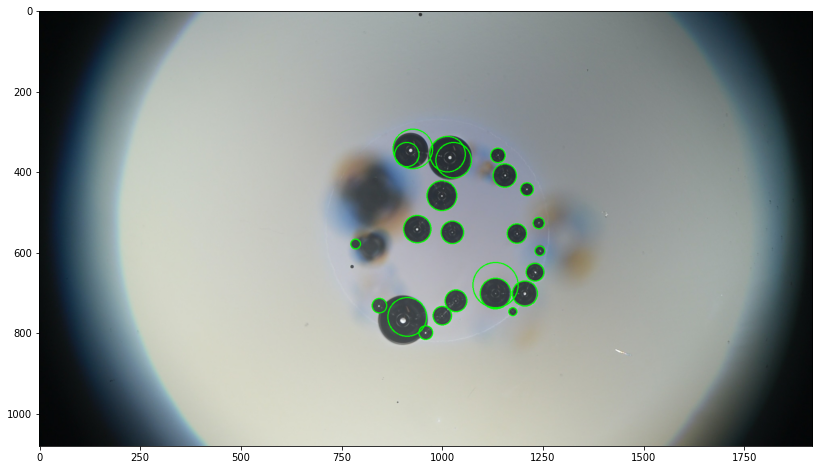

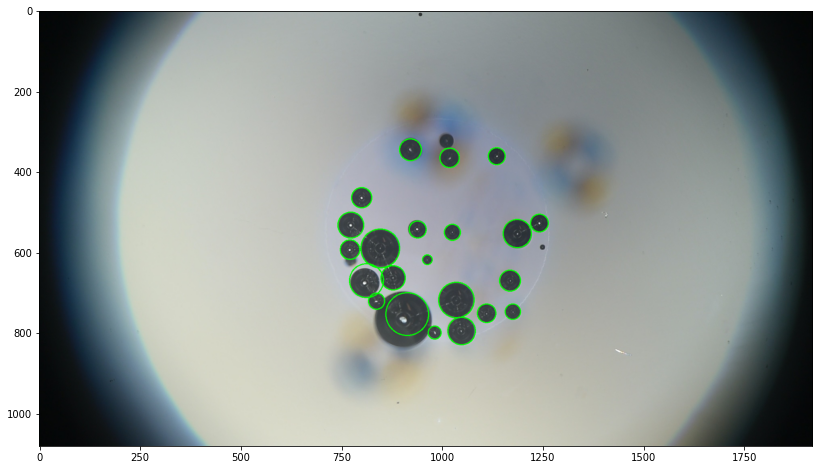

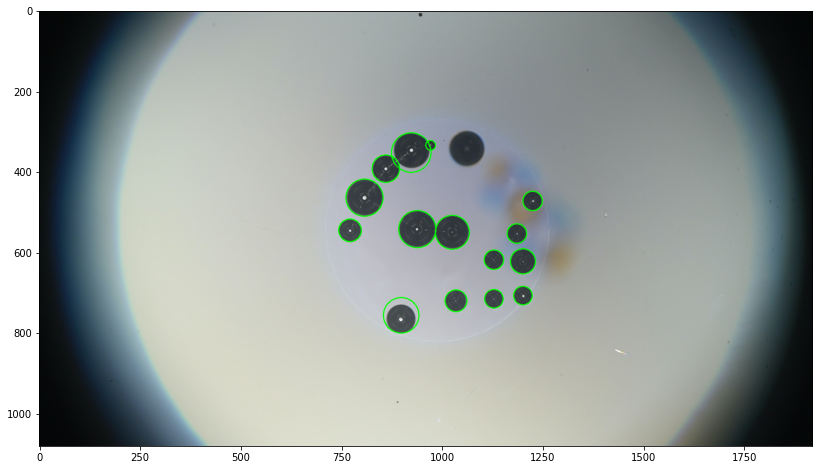

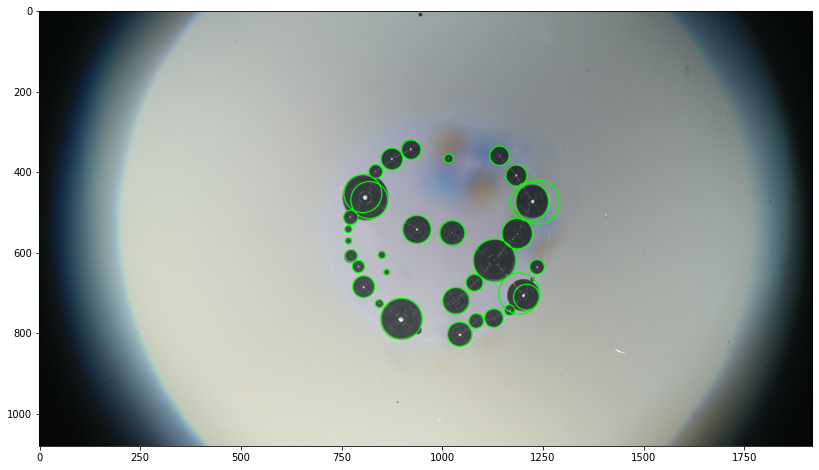

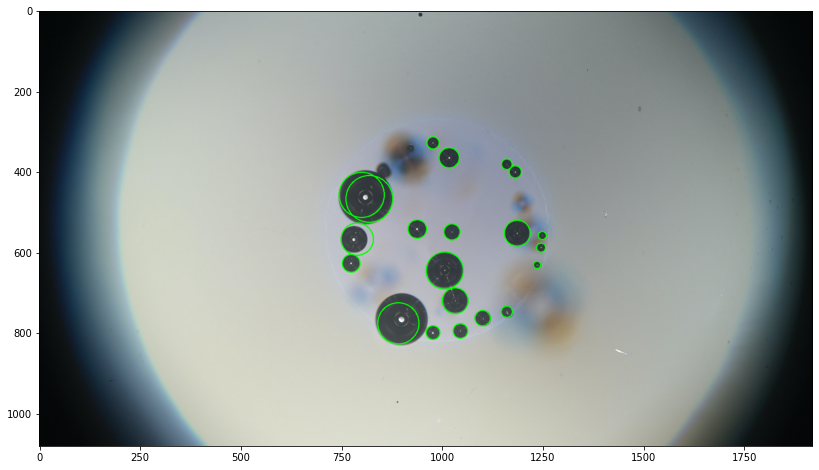

...

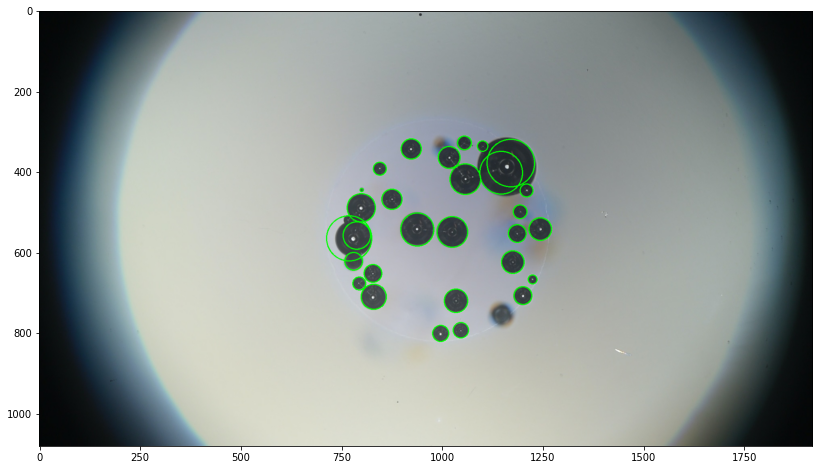

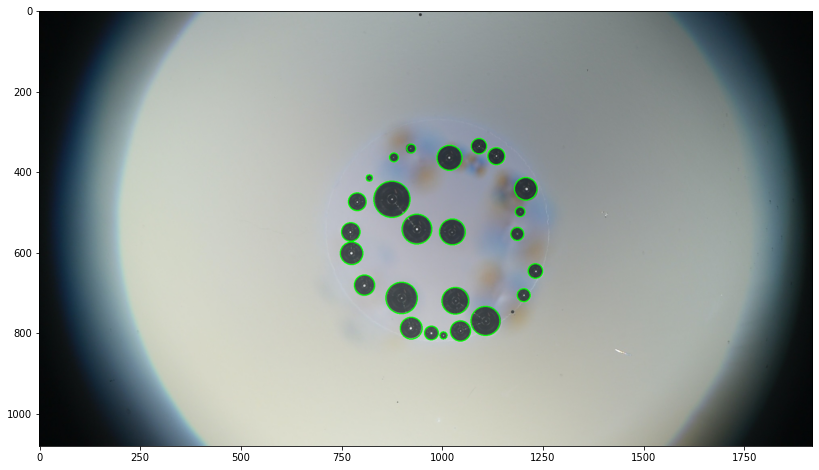

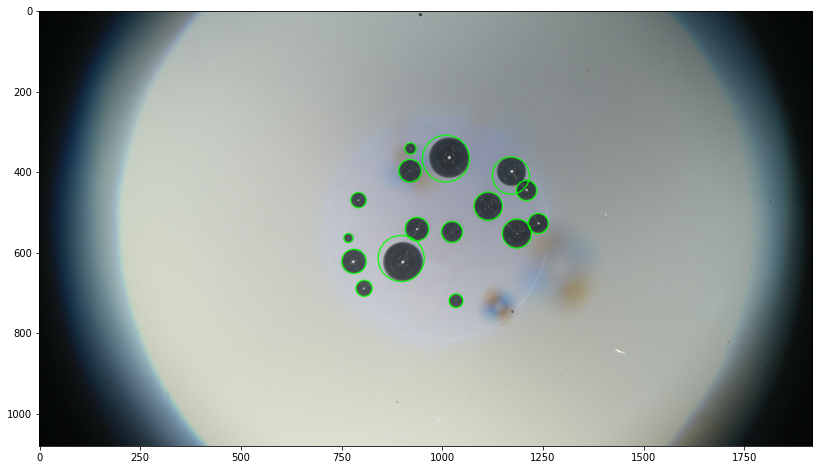

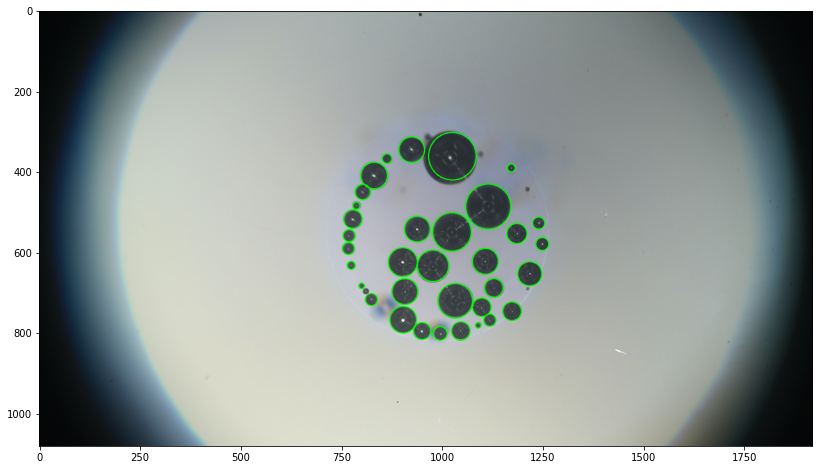

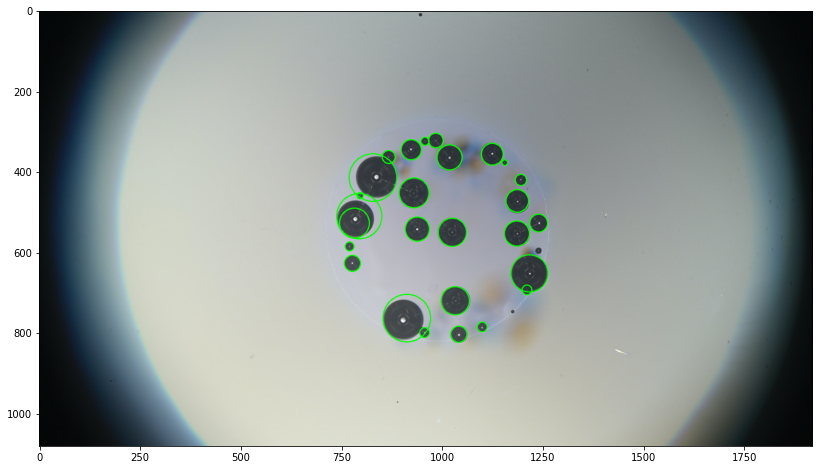

creating index...
index created!
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.743
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.932
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.821
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.838
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.538
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.783
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.868
 Average Recall    

In [8]:
def testing_function(config):
    # Hyperparameters
    blur, dp, param1, param2 = config['blur'], config['dp'], \
                                config['param1'], config['param2']
    hough_dicts = []
    gt_dicts = []
    dataset = Dataset('/media/jim/a3a803dc-f678-4894-a0bd-d4669eb1d005/Work/catalyst-bubble-detection/data/pristine-test/hough/test/', [], False)
    loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=0)
    for image, target in loader:
        image = (image[0].permute((1, 2, 0)) * 255).byte().numpy()
        hough_dict = run_hough(image,blur=blur,\
                               dp=dp,param1=param1,param2=param2, show=True)
        # DEFINE GT_DICT FOR CORRESPONDING IMAGE. DEFINE mAP_loss
        hough_dicts.append(hough_dict)
        gt_dicts.append(target)
        
    mAP, _ = get_metrics(hough_dicts, gt_dicts, dataset)

conf =  {'blur': 9, 'dp': 1.3885238227014334, 'param1': 297, 'param2': 24}
testing_function(conf)
df.to_csv('hough.csv')